# Importing required libraries

In [2]:
import cv2
import os
import glob
import numpy as np
from matplotlib import pyplot as plt
from sklearn.utils import class_weight
from sklearn.model_selection import train_test_split
from sklearn import preprocessing
from keras import backend as K
from keras.models import Sequential
from keras.layers.convolutional import Convolution2D
from keras.layers.convolutional import MaxPooling2D
from keras.layers.core import Activation
from keras.layers.core import Flatten
from keras.layers.core import Dense
from keras.layers.core import Dropout
from keras.callbacks import TensorBoard
from keras.optimizers import SGD
from keras.optimizers import RMSprop
from keras.optimizers import Nadam
from keras.activations import relu
import pylab as pl
from sklearn.metrics import classification_report
import matplotlib.cm as cm
from mpl_toolkits.axes_grid1 import make_axes_locatable
from keras.preprocessing.image import ImageDataGenerator
from keras import applications
from keras.utils import np_utils
from keras.callbacks import ModelCheckpoint
import keras
import sys
import argparse
sys.setrecursionlimit(3000)
from keras.optimizers import SGD
from keras.layers import Input, AveragePooling2D, ZeroPadding2D, merge, Reshape
from keras.layers.normalization import BatchNormalization
from keras.models import Model
from sklearn.metrics import log_loss
from custom_layers.scale_layer import Scale
%matplotlib inline

# Reading images from each folder and storing them in a dictionary

In [5]:
data = {}
for i in range(1,8):
    img_dir = str(i)
    files = os.listdir(img_dir)
    data[str(i)] = []
    for f1 in files:
        img = cv2.imread(img_dir+'/'+f1)
        data[str(i)].append(img)  

# Total images and images per class

In [72]:
c1 = data[str(1)]
c2 = data[str(2)]
c3 = data[str(3)]
c4 = data[str(4)]
c5 = data[str(5)]
c6 = data[str(6)]
c7 = data[str(7)]

total = np.shape(c1)[0] + np.shape(c2)[0] + np.shape(c3)[0] + np.shape(c4)[0] + np.shape(c5)[0] + np.shape(c6)[0] + np.shape(c7)[0]

print "Total : ", total

print "C1 : ", np.shape(c1)[0],"C2 : ", np.shape(c2)[0],"C3 : ", np.shape(c3)[0],"C4 : ", np.shape(c4)[0],"C5 : ", np.shape(c5)[0],"C6 : ", np.shape(c6)[0],"C7 : ",np.shape(c7)[0]

Total :  2364
C1 :  116 C2 :  105 C3 :  72 C4 :  78 C5 :  56 C6 :  1879 C7 :  58


# Dimensions of first, middle and last image across classes

In [45]:
print "C1 : ",np.shape(c1[0]),np.shape(c1[np.shape(c1)[0]/2]),np.shape(c1[-1])
print "C2 : ",np.shape(c2[0]),np.shape(c2[np.shape(c2)[0]/2]),np.shape(c2[-1])
print "C3 : ",np.shape(c3[0]),np.shape(c3[np.shape(c3)[0]/2]),np.shape(c3[-1])
print "C4 : ",np.shape(c4[0]),np.shape(c4[np.shape(c4)[0]/2]),np.shape(c4[-1])
print "C5 : ",np.shape(c5[0]),np.shape(c5[np.shape(c5)[0]/2]),np.shape(c5[-1])
print "C6 : ",np.shape(c6[0]),np.shape(c6[np.shape(c6)[0]/2]),np.shape(c6[-1])
print "C7 : ",np.shape(c7[0]),np.shape(c7[np.shape(c7)[0]/2]),np.shape(c7[-1])

C1 :  (479, 640, 3) (479, 640, 3) (480, 639, 3)
C2 :  (3264, 2448, 3) (480, 640, 3) (183, 275, 3)
C3 :  (406, 436, 3) (387, 458, 3) (550, 346, 3)
C4 :  (200, 300, 3) (401, 612, 3) (183, 275, 3)
C5 :  (335, 493, 3) (480, 359, 3) (480, 640, 3)
C6 :  (300, 400, 3) (448, 598, 3) (488, 598, 3)
C7 :  (480, 640, 3) (480, 640, 3) (480, 640, 3)


# As the images are of different sizes, an appropriate size is required for processing

# Average dimensions of the dataset calculated using total images in the dataset

In [71]:
x = 0
y = 0
for i in range(1,8):
    c = data[str(i)]
    for j in range(0,np.shape(c)[0]):
        x = x + np.shape(c[j])[0]
        y = y + np.shape(c[j])[1]

x = x/total
y = y/total
avg_dim_ds_x = x
avg_dim_ds_y = y

print "Average dimensions of the dataset are : ",(x,y,3)

Average dimensions of the dataset are :  (465, 616, 3)


# Average dimensions per class

In [72]:
x = 0
y = 0
for i in range(1,2):
    c = data[str(i)]
    for j in range(0,np.shape(c)[0]):
        x = x + np.shape(c[j])[0]
        y = y + np.shape(c[j])[1]
x = x/np.shape(c)[0]
y = y/np.shape(c)[0]

avg_dim_c1_x = x
avg_dim_c1_y = y

print "Average dimensions of C1 : ",(x,y,3)

x = 0
y = 0
for i in range(2,3):
    c = data[str(i)]
    for j in range(0,np.shape(c)[0]):
        x = x + np.shape(c[j])[0]
        y = y + np.shape(c[j])[1]
x = x/np.shape(c)[0]
y = y/np.shape(c)[0]

avg_dim_c2_x = x
avg_dim_c2_y = y

print "Average dimensions of C2 : ",(x,y,3)


x = 0
y = 0
for i in range(3,4):
    c = data[str(i)]
    for j in range(0,np.shape(c)[0]):
        x = x + np.shape(c[j])[0]
        y = y + np.shape(c[j])[1]
x = x/np.shape(c)[0]
y = y/np.shape(c)[0]

avg_dim_c3_x = x
avg_dim_c3_y = y

print "Average dimensions of C3 : ",(x,y,3)

x = 0
y = 0
for i in range(4,5):
    c = data[str(i)]
    for j in range(0,np.shape(c)[0]):
        x = x + np.shape(c[j])[0]
        y = y + np.shape(c[j])[1]
x = x/np.shape(c)[0]
y = y/np.shape(c)[0]

avg_dim_c4_x = x
avg_dim_c4_y = y

print "Average dimensions of C4 : ",(x,y,3)

x = 0
y = 0
for i in range(5,6):
    c = data[str(i)]
    for j in range(0,np.shape(c)[0]):
        x = x + np.shape(c[j])[0]
        y = y + np.shape(c[j])[1]
x = x/np.shape(c)[0]
y = y/np.shape(c)[0]

avg_dim_c5_x = x
avg_dim_c5_y = y

print "Average dimensions of C5 : ",(x,y,3)

x = 0
y = 0
for i in range(6,7):
    c = data[str(i)]
    for j in range(0,np.shape(c)[0]):
        x = x + np.shape(c[j])[0]
        y = y + np.shape(c[j])[1]
x = x/np.shape(c)[0]
y = y/np.shape(c)[0]

avg_dim_c6_x = x
avg_dim_c6_y = y

print "Average dimensions of C6 : ",(x,y,3)

x = 0
y = 0
for i in range(7,8):
    c = data[str(i)]
    for j in range(0,np.shape(c)[0]):
        x = x + np.shape(c[j])[0]
        y = y + np.shape(c[j])[1]
x = x/np.shape(c)[0]
y = y/np.shape(c)[0]

avg_dim_c7_x = x
avg_dim_c7_y = y

print "Average dimensions of C7 : ",(x,y,3)

Average dimensions of C1 :  (452, 561, 3)
Average dimensions of C2 :  (511, 640, 3)
Average dimensions of C3 :  (405, 465, 3)
Average dimensions of C4 :  (443, 642, 3)
Average dimensions of C5 :  (460, 554, 3)
Average dimensions of C6 :  (467, 625, 3)
Average dimensions of C7 :  (473, 590, 3)


# Average dimensions of the dataset calculated using per class average in the dataset

In [76]:
x = avg_dim_c1_x + avg_dim_c2_x + avg_dim_c3_x  + avg_dim_c4_x + avg_dim_c5_x + avg_dim_c6_x + avg_dim_c7_x  
y = avg_dim_c1_y + avg_dim_c2_y + avg_dim_c3_y  + avg_dim_c4_y + avg_dim_c5_y + avg_dim_c6_y + avg_dim_c7_y
x = x/7
y = y/7

avg_dim_ds_x = x
avg_dim_ds_y = y

print "Average dimensions of the dataset are : ",(x,y,3)

Average dimensions of the dataset are :  (458, 582, 3)


# Images with size greater than (465, 616, 3)

In [82]:
count = 0
for i in range(1,8):
    c = data[str(i)]
    for j in range(0,np.shape(c)[0]):
        x = np.shape(c[j])[0]
        y = np.shape(c[j])[1]
        if x>=465 and y>=616:
            count = count+1

print "Number of images is : ",count

Number of images is :  589


# Images with size greater than (458, 582, 3)

In [83]:
count = 0
for i in range(1,8):
    c = data[str(i)]
    for j in range(0,np.shape(c)[0]):
        x = np.shape(c[j])[0]
        y = np.shape(c[j])[1]
        if x>=458 and y>=582:
            count = count+1

print "Number of images is : ",count

Number of images is :  652


# Smallest image size in dataset

In [79]:
x = 10000
y = 10000
for i in range(1,8):
    c = data[str(i)]
    for j in range(0,np.shape(c)[0]):
        c_x = np.shape(c[j])[0]
        c_y = np.shape(c[j])[1]
        if c_x<x or c_y<y:
            x = c_x
            y = c_y

print "Size is : ",(x,y,3)

Size is :  (100, 100, 3)


# Largest image size in dataset

In [81]:
x = 0
y = 0
for i in range(1,8):
    c = data[str(i)]
    for j in range(0,np.shape(c)[0]):
        c_x = np.shape(c[j])[0]
        c_y = np.shape(c[j])[1]
        if c_x>x or c_y>y:
            x = c_x
            y = c_y

print "Size is : ",(x,y,3)

Size is :  (3456, 5184, 3)


# Images with size greater than (441, 576, 3)

In [84]:
count = 0
for i in range(1,8):
    c = data[str(i)]
    for j in range(0,np.shape(c)[0]):
        x = np.shape(c[j])[0]
        y = np.shape(c[j])[1]
        if x>=441 and y>=576:
            count = count+1

print "Number of images is : ",count

Number of images is :  1352


# Images with size greater than (400, 529, 3)

In [85]:
count = 0
for i in range(1,8):
    c = data[str(i)]
    for j in range(0,np.shape(c)[0]):
        x = np.shape(c[j])[0]
        y = np.shape(c[j])[1]
        if x>=400 and y>=529:
            count = count+1

print "Number of images is : ",count

Number of images is :  1514


# Images with size greater than (361, 484, 3)

In [86]:
count = 0
for i in range(1,8):
    c = data[str(i)]
    for j in range(0,np.shape(c)[0]):
        x = np.shape(c[j])[0]
        y = np.shape(c[j])[1]
        if x>=361 and y>=484:
            count = count+1

print "Number of images is : ",count

Number of images is :  1750


# Images with size greater than (324, 441, 3)

In [87]:
count = 0
for i in range(1,8):
    c = data[str(i)]
    for j in range(0,np.shape(c)[0]):
        x = np.shape(c[j])[0]
        y = np.shape(c[j])[1]
        if x>=324 and y>=441:
            count = count+1

print "Number of images is : ",count

Number of images is :  1909


# Images with size greater than (289, 400, 3)

In [88]:
count = 0
for i in range(1,8):
    c = data[str(i)]
    for j in range(0,np.shape(c)[0]):
        x = np.shape(c[j])[0]
        y = np.shape(c[j])[1]
        if x>=289 and y>=400:
            count = count+1

print "Number of images is : ",count

Number of images is :  1981


# Images with size greater than (256, 361, 3 )

In [3]:
count = 0
for i in range(1,8):
    c = data[str(i)]
    for j in range(0,np.shape(c)[0]):
        x = np.shape(c[j])[0]
        y = np.shape(c[j])[1]
        if x>=256 and y>=361:
            count = count+1

print "Number of images is : ",count

Number of images is :  2066


# Images with size greater than (225, 324, 3 )

In [4]:
count = 0
for i in range(1,8):
    c = data[str(i)]
    for j in range(0,np.shape(c)[0]):
        x = np.shape(c[j])[0]
        y = np.shape(c[j])[1]
        if x>=225 and y>=324:
            count = count+1

print "Number of images is : ",count

Number of images is :  2171


# Images with size greater than (196, 289, 3 )

In [5]:
count = 0
for i in range(1,8):
    c = data[str(i)]
    for j in range(0,np.shape(c)[0]):
        x = np.shape(c[j])[0]
        y = np.shape(c[j])[1]
        if x>=196 and y>=289:
            count = count+1

print "Number of images is : ",count

Number of images is :  2234


# Images with size greater than (169, 256, 3 )

In [6]:
count = 0
for i in range(1,8):
    c = data[str(i)]
    for j in range(0,np.shape(c)[0]):
        x = np.shape(c[j])[0]
        y = np.shape(c[j])[1]
        if x>=169 and y>=256:
            count = count+1

print "Number of images is : ",count

Number of images is :  2285


# Images with size greater than (144, 225, 3 )

In [7]:
count = 0
for i in range(1,8):
    c = data[str(i)]
    for j in range(0,np.shape(c)[0]):
        x = np.shape(c[j])[0]
        y = np.shape(c[j])[1]
        if x>=144 and y>=225:
            count = count+1

print "Number of images is : ",count

Number of images is :  2328


# Display coloured images resized to (225, 144, 3)

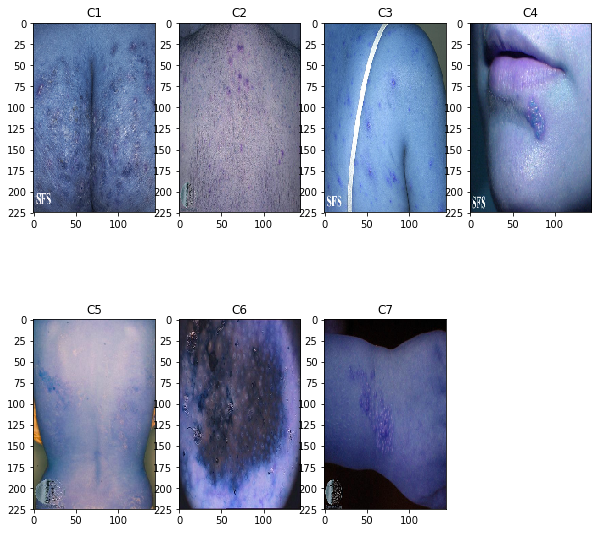

In [66]:
fig=plt.figure(figsize=(10, 10))
columns = 4
rows = 2
for i in range(1, columns*rows):
    fig.add_subplot(rows, columns, i)
    img = cv2.resize(data[str(i)][1],(144,225))
    plt.imshow(img)
    plt.title('C'+str(i))
plt.show()

# Display gray images resized to (225, 144)

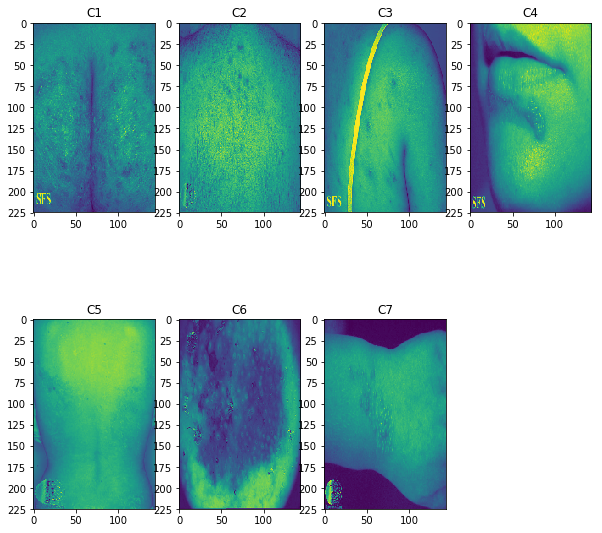

In [67]:
fig=plt.figure(figsize=(10, 10))
columns = 4
rows = 2
for i in range(1, columns*rows):
    fig.add_subplot(rows, columns, i)
    img = cv2.resize(data[str(i)][1],(144,225))
    gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
    plt.imshow(gray)
    plt.title('C'+str(i))
plt.show()

# Display coloured images resized to (144, 225, 3)

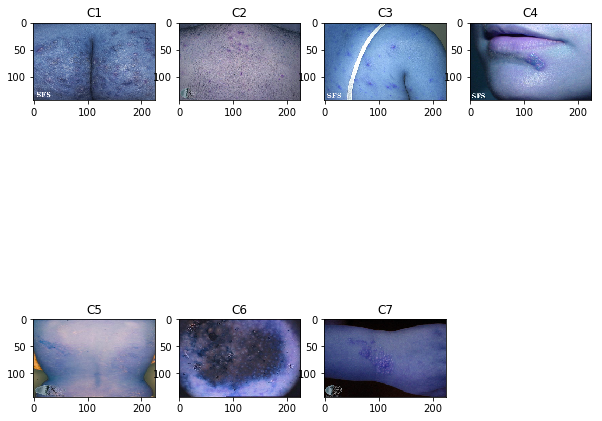

In [68]:
fig=plt.figure(figsize=(10, 10))
columns = 4
rows = 2
for i in range(1, columns*rows):
    fig.add_subplot(rows, columns, i)
    img = cv2.resize(data[str(i)][1],(225,144))
    plt.imshow(img)
    plt.title('C'+str(i))
plt.show()

# Display gray images resized to (144, 225)

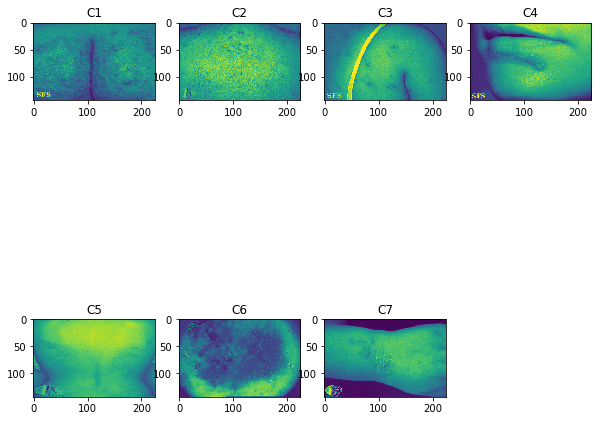

In [69]:
fig=plt.figure(figsize=(10, 10))
columns = 4
rows = 2
for i in range(1, columns*rows):
    fig.add_subplot(rows, columns, i)
    img = cv2.resize(data[str(i)][1],(225,144))
    gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
    plt.imshow(gray)
    plt.title('C'+str(i))
plt.show()

# Display coloured images resized to (64, 64, 3)

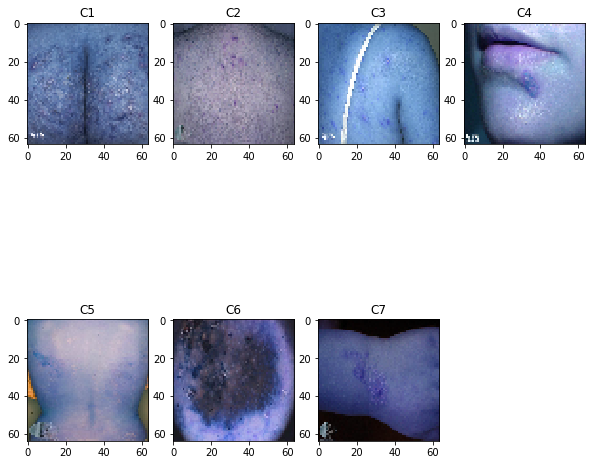

In [70]:
fig=plt.figure(figsize=(10, 10))
columns = 4
rows = 2
for i in range(1, columns*rows):
    fig.add_subplot(rows, columns, i)
    img = cv2.resize(data[str(i)][1],(64,64))
    plt.imshow(img)
    plt.title('C'+str(i))
plt.show()

# Display gray images resized to (64, 64)

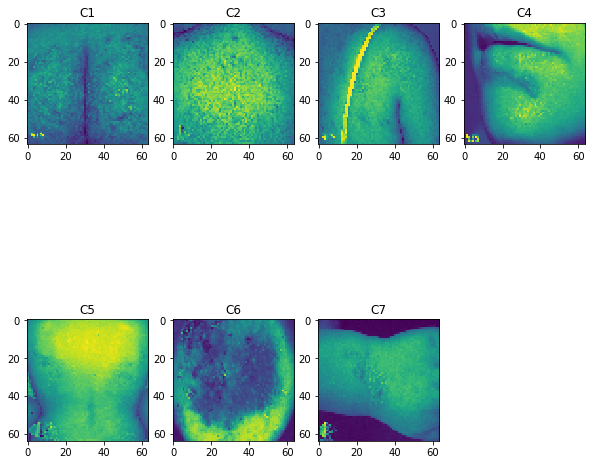

In [71]:
fig=plt.figure(figsize=(10, 10))
columns = 4
rows = 2
for i in range(1, columns*rows):
    fig.add_subplot(rows, columns, i)
    img = cv2.resize(data[str(i)][1],(64,64))
    gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
    plt.imshow(gray)
    plt.title('C'+str(i))
plt.show()

# Selecting (64x64x3) as the size of the image for further processing

# Resizing images to (64, 64, 3)

In [20]:
res_data = {}
for i in range(1,8):
    img_dir = str(i)
    files = os.listdir(img_dir)
    res_data[str(i)] = []
    for f1 in files:
        img = cv2.imread(img_dir+'/'+f1)
        img = cv2.resize(img,(64,64))
        res_data[str(i)].append(img)  

# Assigning labels

In [21]:
labels = {}
for i in range(1,8):
    img_dir = str(i)
    files = os.listdir(img_dir)
    labels[str(i)] = []
    for f1 in files:
        labels[str(i)].append(i-1)  

# Storing images and labels as lists

In [22]:
col_data = []
for i in range(1,8):
    files = res_data[str(i)]
    for f1 in files:
        col_data.append(f1)
        
col_labels = []
for i in range(1,8):
    files = labels[str(i)]
    for f1 in files:
        col_labels.append(f1)        

# Splitting train and test data per class

In [23]:
d1 = res_data[str(1)]
d2 = res_data[str(2)]
d3 = res_data[str(3)]
d4 = res_data[str(4)]
d5 = res_data[str(5)]
d6 = res_data[str(6)]
d7 = res_data[str(7)]

l1 = labels[str(1)]
l2 = labels[str(2)]
l3 = labels[str(3)]
l4 = labels[str(4)]
l5 = labels[str(5)]
l6 = labels[str(6)]
l7 = labels[str(7)]

d1_train, d1_test, l1_train, l1_test = train_test_split(d1, l1, test_size=0.3)
d2_train, d2_test, l2_train, l2_test = train_test_split(d2, l2, test_size=0.3)
d3_train, d3_test, l3_train, l3_test = train_test_split(d3, l3, test_size=0.3)
d4_train, d4_test, l4_train, l4_test = train_test_split(d4, l4, test_size=0.3)
d5_train, d5_test, l5_train, l5_test = train_test_split(d5, l5, test_size=0.3)
d6_train, d6_test, l6_train, l6_test = train_test_split(d6, l6, test_size=0.3)
d7_train, d7_test, l7_train, l7_test = train_test_split(d7, l7, test_size=0.3)    

# Combining train and test data 

In [24]:
x_train = []

x_train.append(d1_train)
x_train.append(d2_train)
x_train.append(d3_train)
x_train.append(d4_train)
x_train.append(d5_train)
x_train.append(d6_train)
x_train.append(d7_train)

y_train = []

y_train.append(l1_train)
y_train.append(l2_train)
y_train.append(l3_train)
y_train.append(l4_train)
y_train.append(l5_train)
y_train.append(l6_train)
y_train.append(l7_train)

x_test = []

x_test.append(d1_test)
x_test.append(d2_test)
x_test.append(d3_test)
x_test.append(d4_test)
x_test.append(d5_test)
x_test.append(d6_test)
x_test.append(d7_test)

y_test = []

y_test.append(l1_test)
y_test.append(l2_test)
y_test.append(l3_test)
y_test.append(l4_test)
y_test.append(l5_test)
y_test.append(l6_test)
y_test.append(l7_test)

In [25]:
X_train = []

for i in range(np.shape(x_train)[0]):
    
    for j in range(np.shape(x_train[i])[0]):
        
        X_train.append(x_train[i][j])
        
Y_train = []

for i in range(np.shape(y_train)[0]):
    
    for j in range(np.shape(y_train[i])[0]):
        
        Y_train.append(y_train[i][j]) 
        
X_test = []

for i in range(np.shape(x_test)[0]):
    
    for j in range(np.shape(x_test[i])[0]):
        
        X_test.append(x_test[i][j])
        
Y_test = []

for i in range(np.shape(y_test)[0]):
    
    for j in range(np.shape(y_test[i])[0]):
        
        Y_test.append(y_test[i][j])                

# Data Dimensions

In [186]:
print "Train data dimensions : ", np.shape(X_train),",","Train label dimensions : ",np.shape(Y_train)
print "Test data dimensions : ",np.shape(X_test),",","Test label dimensions : ",np.shape(Y_test)

Train data dimensions :  (1652, 64, 64, 3) , Train label dimensions :  (1652,)
Test data dimensions :  (712, 64, 64, 3) , Test label dimensions :  (712,)


# Finding class weights to handle class imbalance

In [26]:
class_weights = class_weight.compute_class_weight('balanced',np.unique(Y_train),Y_train)

for i in range(len(class_weights)):
    print "C"+str(i+1)+" : ",class_weights[i]
    
np.save('class_weights.npy',class_weights)    

C1 :  2.91358024691
C2 :  3.23287671233
C3 :  4.72
C4 :  4.37037037037
C5 :  6.05128205128
C6 :  0.179467680608
C7 :  5.9


# Converting data to numpy arrays and saving in npy format

In [27]:
X_train = np.asarray(X_train)
X_test = np.asarray(X_test)
Y_train = np.asarray(Y_train)
Y_test = np.asarray(Y_test)
Y_train = np_utils.to_categorical(Y_train, 7)
Y_test = np_utils.to_categorical(Y_test, 7)
np.save('X_train.npy', X_train)
np.save('X_test.npy', X_test)
np.save('Y_train.npy', Y_train)
np.save('Y_test.npy', Y_test)

# Loading data files

In [2]:
X_train = np.load('X_train.npy')
X_test = np.load('X_test.npy')
Y_train = np.load('Y_train.npy')
Y_test = np.load('Y_test.npy')
class_weights = np.load('class_weights.npy')

# Starting off with the best model on cats and dogs dataset without data augmentation and with 30, 70 split

In [4]:
# dimensions of our images.
img_width, img_height = 64, 64


epochs = 10
batch_size = 256

if K.image_data_format() == 'channels_first':
    input_shape = (3, img_width, img_height)
else:
    input_shape = (img_width, img_height, 3)


model = Sequential()
model.add(Convolution2D(64, 3, padding='same', activation='relu',  input_shape=(64,64,3)))
model.add(Convolution2D(64, 3, padding='same', activation='relu'))
model.add(MaxPooling2D(pool_size=(2, 2)))

model.add(Dropout(0.5))

model.add(Convolution2D(128, 3, padding='same', activation='relu'))
model.add(Convolution2D(128, 3, padding='same', activation='relu'))
model.add(MaxPooling2D(pool_size=(2, 2)))

model.add(Dropout(0.5))

model.add(Convolution2D(256, 3, padding='same', activation='relu'))
model.add(MaxPooling2D(pool_size=(2, 2)))

model.add(Flatten())
model.add(Dense(256))
model.add(Activation('relu'))
model.add(Dropout(0.5))
model.add(Dense(256))
model.add(Activation('relu'))
model.add(Dropout(0.5))
model.add(Dense(7))
model.add(Activation('softmax'))


model.compile(loss='categorical_crossentropy',
              optimizer=keras.optimizers.RMSprop(lr=0.00001, rho=0.9, epsilon=None, decay=0.0),
              metrics=['accuracy'])

model.summary()

#checkpoint = ModelCheckpoint('{val_acc:.4f}.hdf5', monitor='val_acc', verbose=1, save_best_only=True, mode='auto')


history = model.fit(X_train, Y_train, batch_size=batch_size, class_weight=class_weights, epochs=epochs, validation_split=0.7)

_________________________________________________________________
Layer (type)                 Output Shape              Param #   
conv2d_1 (Conv2D)            (None, 64, 64, 64)        1792      
_________________________________________________________________
conv2d_2 (Conv2D)            (None, 64, 64, 64)        36928     
_________________________________________________________________
max_pooling2d_1 (MaxPooling2 (None, 32, 32, 64)        0         
_________________________________________________________________
dropout_1 (Dropout)          (None, 32, 32, 64)        0         
_________________________________________________________________
conv2d_3 (Conv2D)            (None, 32, 32, 128)       73856     
_________________________________________________________________
conv2d_4 (Conv2D)            (None, 32, 32, 128)       147584    
_________________________________________________________________
max_pooling2d_2 (MaxPooling2 (None, 16, 16, 128)       0         
__________

In [5]:
[loss,acc] = model.evaluate(X_test,Y_test,256)
print "accuracy:",acc 

712/712 [==============================] - 1s 2ms/step
accuracy: 0.792134838828


['acc', 'loss', 'val_acc', 'val_loss']


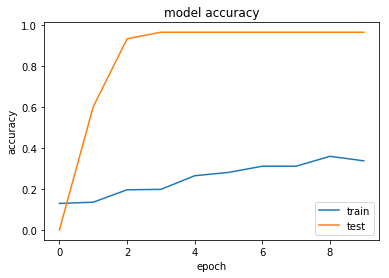

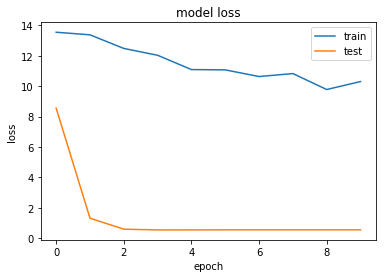

In [34]:
# list all data in history
print(history.history.keys())
# summarize history for accuracy
plt.plot(history.history['acc'])
plt.plot(history.history['val_acc'])
plt.title('model accuracy')
plt.ylabel('accuracy')
plt.xlabel('epoch')
plt.legend(['train', 'test'], loc='lower right')
plt.show()
# summarize history for loss
plt.plot(history.history['loss'])
plt.plot(history.history['val_loss'])
plt.title('model loss')
plt.ylabel('loss')
plt.xlabel('epoch')
plt.legend(['train', 'test'], loc='upper right')
plt.show()

# Just Training it for a bit longer 

In [3]:
# dimensions of our images.
img_width, img_height = 64, 64


epochs = 20
batch_size = 256

if K.image_data_format() == 'channels_first':
    input_shape = (3, img_width, img_height)
else:
    input_shape = (img_width, img_height, 3)


model = Sequential()
model.add(Convolution2D(64, 3, padding='same', activation='relu',  input_shape=(64,64,3)))
model.add(Convolution2D(64, 3, padding='same', activation='relu'))
model.add(MaxPooling2D(pool_size=(2, 2)))

model.add(Dropout(0.5))

model.add(Convolution2D(128, 3, padding='same', activation='relu'))
model.add(Convolution2D(128, 3, padding='same', activation='relu'))
model.add(MaxPooling2D(pool_size=(2, 2)))

model.add(Dropout(0.5))

model.add(Convolution2D(256, 3, padding='same', activation='relu'))
model.add(MaxPooling2D(pool_size=(2, 2)))

model.add(Flatten())
model.add(Dense(256))
model.add(Activation('relu'))
model.add(Dropout(0.5))
model.add(Dense(256))
model.add(Activation('relu'))
model.add(Dropout(0.5))
model.add(Dense(7))
model.add(Activation('softmax'))


model.compile(loss='categorical_crossentropy',
              optimizer=keras.optimizers.RMSprop(lr=0.00001, rho=0.9, epsilon=None, decay=0.0),
              metrics=['accuracy'])

model.summary()

#checkpoint = ModelCheckpoint('{val_acc:.4f}.hdf5', monitor='val_acc', verbose=1, save_best_only=True, mode='auto')


history = model.fit(X_train, Y_train, batch_size=batch_size, class_weight=class_weights, epochs=epochs, validation_split=0.7)

_________________________________________________________________
Layer (type)                 Output Shape              Param #   
conv2d_1 (Conv2D)            (None, 64, 64, 64)        1792      
_________________________________________________________________
conv2d_2 (Conv2D)            (None, 64, 64, 64)        36928     
_________________________________________________________________
max_pooling2d_1 (MaxPooling2 (None, 32, 32, 64)        0         
_________________________________________________________________
dropout_1 (Dropout)          (None, 32, 32, 64)        0         
_________________________________________________________________
conv2d_3 (Conv2D)            (None, 32, 32, 128)       73856     
_________________________________________________________________
conv2d_4 (Conv2D)            (None, 32, 32, 128)       147584    
_________________________________________________________________
max_pooling2d_2 (MaxPooling2 (None, 16, 16, 128)       0         
__________

In [4]:
[loss,acc] = model.evaluate(X_test,Y_test,256)
print "accuracy:",acc 

712/712 [==============================] - 1s 2ms/step
accuracy: 0.792134838828


['acc', 'loss', 'val_acc', 'val_loss']


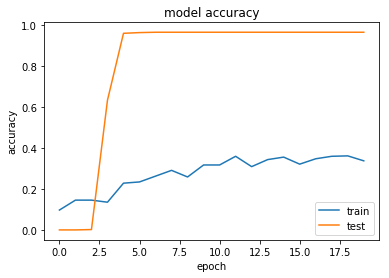

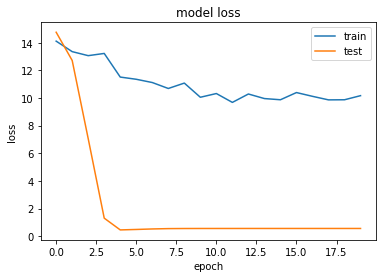

In [5]:
# list all data in history
print(history.history.keys())
# summarize history for accuracy
plt.plot(history.history['acc'])
plt.plot(history.history['val_acc'])
plt.title('model accuracy')
plt.ylabel('accuracy')
plt.xlabel('epoch')
plt.legend(['train', 'test'], loc='lower right')
plt.show()
# summarize history for loss
plt.plot(history.history['loss'])
plt.plot(history.history['val_loss'])
plt.title('model loss')
plt.ylabel('loss')
plt.xlabel('epoch')
plt.legend(['train', 'test'], loc='upper right')
plt.show()

# Changing Split ratio to 50, 50

In [6]:
# dimensions of our images.
img_width, img_height = 64, 64


epochs = 20
batch_size = 256

if K.image_data_format() == 'channels_first':
    input_shape = (3, img_width, img_height)
else:
    input_shape = (img_width, img_height, 3)


model = Sequential()
model.add(Convolution2D(64, 3, padding='same', activation='relu',  input_shape=(64,64,3)))
model.add(Convolution2D(64, 3, padding='same', activation='relu'))
model.add(MaxPooling2D(pool_size=(2, 2)))

model.add(Dropout(0.5))

model.add(Convolution2D(128, 3, padding='same', activation='relu'))
model.add(Convolution2D(128, 3, padding='same', activation='relu'))
model.add(MaxPooling2D(pool_size=(2, 2)))

model.add(Dropout(0.5))

model.add(Convolution2D(256, 3, padding='same', activation='relu'))
model.add(MaxPooling2D(pool_size=(2, 2)))

model.add(Flatten())
model.add(Dense(256))
model.add(Activation('relu'))
model.add(Dropout(0.5))
model.add(Dense(256))
model.add(Activation('relu'))
model.add(Dropout(0.5))
model.add(Dense(7))
model.add(Activation('softmax'))


model.compile(loss='categorical_crossentropy',
              optimizer=keras.optimizers.RMSprop(lr=0.00001, rho=0.9, epsilon=None, decay=0.0),
              metrics=['accuracy'])

model.summary()

#checkpoint = ModelCheckpoint('{val_acc:.4f}.hdf5', monitor='val_acc', verbose=1, save_best_only=True, mode='auto')


history = model.fit(X_train, Y_train, batch_size=batch_size, class_weight=class_weights, epochs=epochs, validation_split=0.5)

_________________________________________________________________
Layer (type)                 Output Shape              Param #   
conv2d_6 (Conv2D)            (None, 64, 64, 64)        1792      
_________________________________________________________________
conv2d_7 (Conv2D)            (None, 64, 64, 64)        36928     
_________________________________________________________________
max_pooling2d_4 (MaxPooling2 (None, 32, 32, 64)        0         
_________________________________________________________________
dropout_5 (Dropout)          (None, 32, 32, 64)        0         
_________________________________________________________________
conv2d_8 (Conv2D)            (None, 32, 32, 128)       73856     
_________________________________________________________________
conv2d_9 (Conv2D)            (None, 32, 32, 128)       147584    
_________________________________________________________________
max_pooling2d_5 (MaxPooling2 (None, 16, 16, 128)       0         
__________

In [7]:
[loss,acc] = model.evaluate(X_test,Y_test,256)
print "accuracy:",acc 

712/712 [==============================] - 0s 655us/step
accuracy: 0.792134838828


['acc', 'loss', 'val_acc', 'val_loss']


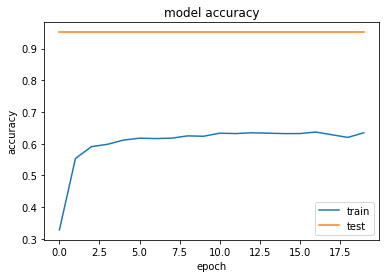

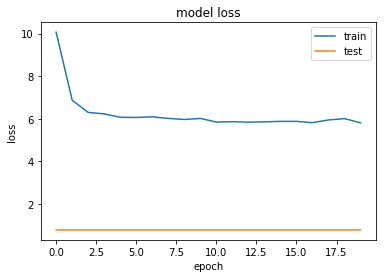

In [8]:
# list all data in history
print(history.history.keys())
# summarize history for accuracy
plt.plot(history.history['acc'])
plt.plot(history.history['val_acc'])
plt.title('model accuracy')
plt.ylabel('accuracy')
plt.xlabel('epoch')
plt.legend(['train', 'test'], loc='lower right')
plt.show()
# summarize history for loss
plt.plot(history.history['loss'])
plt.plot(history.history['val_loss'])
plt.title('model loss')
plt.ylabel('loss')
plt.xlabel('epoch')
plt.legend(['train', 'test'], loc='upper right')
plt.show()

# Changing split to 30,70 and increasing epochs to 40

In [9]:
# dimensions of our images.
img_width, img_height = 64, 64


epochs = 40
batch_size = 256

if K.image_data_format() == 'channels_first':
    input_shape = (3, img_width, img_height)
else:
    input_shape = (img_width, img_height, 3)


model = Sequential()
model.add(Convolution2D(64, 3, padding='same', activation='relu',  input_shape=(64,64,3)))
model.add(Convolution2D(64, 3, padding='same', activation='relu'))
model.add(MaxPooling2D(pool_size=(2, 2)))

model.add(Dropout(0.5))

model.add(Convolution2D(128, 3, padding='same', activation='relu'))
model.add(Convolution2D(128, 3, padding='same', activation='relu'))
model.add(MaxPooling2D(pool_size=(2, 2)))

model.add(Dropout(0.5))

model.add(Convolution2D(256, 3, padding='same', activation='relu'))
model.add(MaxPooling2D(pool_size=(2, 2)))

model.add(Flatten())
model.add(Dense(256))
model.add(Activation('relu'))
model.add(Dropout(0.5))
model.add(Dense(256))
model.add(Activation('relu'))
model.add(Dropout(0.5))
model.add(Dense(7))
model.add(Activation('softmax'))


model.compile(loss='categorical_crossentropy',
              optimizer=keras.optimizers.RMSprop(lr=0.00001, rho=0.9, epsilon=None, decay=0.0),
              metrics=['accuracy'])

model.summary()

#checkpoint = ModelCheckpoint('{val_acc:.4f}.hdf5', monitor='val_acc', verbose=1, save_best_only=True, mode='auto')


history = model.fit(X_train, Y_train, batch_size=batch_size, class_weight=class_weights, epochs=epochs, validation_split=0.3)

_________________________________________________________________
Layer (type)                 Output Shape              Param #   
conv2d_11 (Conv2D)           (None, 64, 64, 64)        1792      
_________________________________________________________________
conv2d_12 (Conv2D)           (None, 64, 64, 64)        36928     
_________________________________________________________________
max_pooling2d_7 (MaxPooling2 (None, 32, 32, 64)        0         
_________________________________________________________________
dropout_9 (Dropout)          (None, 32, 32, 64)        0         
_________________________________________________________________
conv2d_13 (Conv2D)           (None, 32, 32, 128)       73856     
_________________________________________________________________
conv2d_14 (Conv2D)           (None, 32, 32, 128)       147584    
_________________________________________________________________
max_pooling2d_8 (MaxPooling2 (None, 16, 16, 128)       0         
__________

In [10]:
[loss,acc] = model.evaluate(X_test,Y_test,256)
print "accuracy:",acc 

712/712 [==============================] - 0s 652us/step
accuracy: 0.792134838828


['acc', 'loss', 'val_acc', 'val_loss']


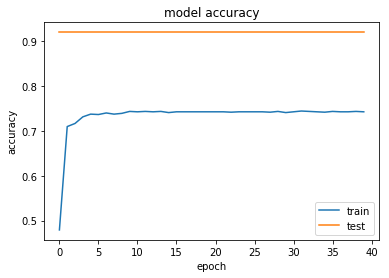

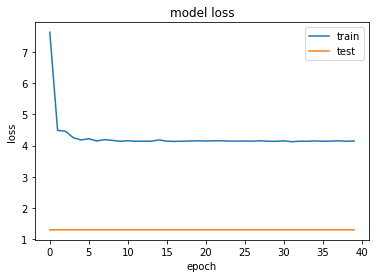

In [11]:
# list all data in history
print(history.history.keys())
# summarize history for accuracy
plt.plot(history.history['acc'])
plt.plot(history.history['val_acc'])
plt.title('model accuracy')
plt.ylabel('accuracy')
plt.xlabel('epoch')
plt.legend(['train', 'test'], loc='lower right')
plt.show()
# summarize history for loss
plt.plot(history.history['loss'])
plt.plot(history.history['val_loss'])
plt.title('model loss')
plt.ylabel('loss')
plt.xlabel('epoch')
plt.legend(['train', 'test'], loc='upper right')
plt.show()

# Let's go back to the basics, trying a simple model

In [14]:
# dimensions of our images.
img_width, img_height = 64, 64


epochs = 40
batch_size = 256

if K.image_data_format() == 'channels_first':
    input_shape = (3, img_width, img_height)
else:
    input_shape = (img_width, img_height, 3)


model = Sequential()
model.add(Convolution2D(kernel_size=(3,3),filters=3,input_shape=(img_width, img_height,3),activation="relu",padding="same"))
model.add(Convolution2D(kernel_size=(3,3),filters=10,activation="relu",padding="same"))
model.add(MaxPooling2D(pool_size=(2,2),strides=(2,2)))
model.add(Convolution2D(kernel_size=(3,3),filters=3,activation="relu",padding="same"))
model.add(Convolution2D(kernel_size=(5,5),filters=5,activation="relu",padding="same"))
model.add(MaxPooling2D(pool_size=(3,3),strides=(2,2)))
model.add(Convolution2D(kernel_size=(2,2),strides=(2,2),filters=10))
model.add(Flatten())
model.add(Dropout(0.2))
model.add(Dense(100,activation="sigmoid"))
model.add(Dense(7))
model.add(Activation('softmax'))


model.compile(loss='categorical_crossentropy',
              optimizer=keras.optimizers.RMSprop(lr=0.00001, rho=0.9, epsilon=None, decay=0.0),
              metrics=['accuracy'])

model.summary()

#checkpoint = ModelCheckpoint('{val_acc:.4f}.hdf5', monitor='val_acc', verbose=1, save_best_only=True, mode='auto')


history = model.fit(X_train, Y_train, batch_size=batch_size, class_weight=class_weights, epochs=epochs, validation_split=0.3)

_________________________________________________________________
Layer (type)                 Output Shape              Param #   
conv2d_16 (Conv2D)           (None, 64, 64, 3)         84        
_________________________________________________________________
conv2d_17 (Conv2D)           (None, 64, 64, 10)        280       
_________________________________________________________________
max_pooling2d_10 (MaxPooling (None, 32, 32, 10)        0         
_________________________________________________________________
conv2d_18 (Conv2D)           (None, 32, 32, 3)         273       
_________________________________________________________________
conv2d_19 (Conv2D)           (None, 32, 32, 5)         380       
_________________________________________________________________
max_pooling2d_11 (MaxPooling (None, 15, 15, 5)         0         
_________________________________________________________________
conv2d_20 (Conv2D)           (None, 7, 7, 10)          210       
__________

In [15]:
[loss,acc] = model.evaluate(X_test,Y_test,256)
print "accuracy:",acc 

712/712 [==============================] - 0s 193us/step
accuracy: 0.792134838828


['acc', 'loss', 'val_acc', 'val_loss']


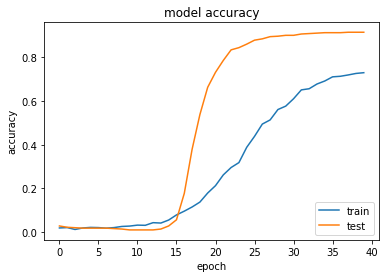

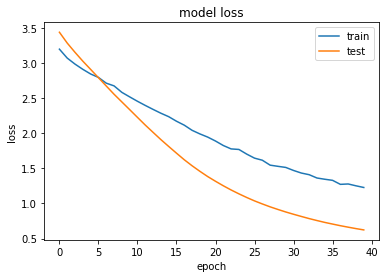

In [16]:
# list all data in history
print(history.history.keys())
# summarize history for accuracy
plt.plot(history.history['acc'])
plt.plot(history.history['val_acc'])
plt.title('model accuracy')
plt.ylabel('accuracy')
plt.xlabel('epoch')
plt.legend(['train', 'test'], loc='lower right')
plt.show()
# summarize history for loss
plt.plot(history.history['loss'])
plt.plot(history.history['val_loss'])
plt.title('model loss')
plt.ylabel('loss')
plt.xlabel('epoch')
plt.legend(['train', 'test'], loc='upper right')
plt.show()

# Increasing the number of epochs to 80

In [18]:
# dimensions of our images.
img_width, img_height = 64, 64


epochs = 80
batch_size = 256

if K.image_data_format() == 'channels_first':
    input_shape = (3, img_width, img_height)
else:
    input_shape = (img_width, img_height, 3)


model = Sequential()
model.add(Convolution2D(kernel_size=(3,3),filters=3,input_shape=(img_width, img_height,3),activation="relu",padding="same"))
model.add(Convolution2D(kernel_size=(3,3),filters=10,activation="relu",padding="same"))
model.add(MaxPooling2D(pool_size=(2,2),strides=(2,2)))
model.add(Convolution2D(kernel_size=(3,3),filters=3,activation="relu",padding="same"))
model.add(Convolution2D(kernel_size=(5,5),filters=5,activation="relu",padding="same"))
model.add(MaxPooling2D(pool_size=(3,3),strides=(2,2)))
model.add(Convolution2D(kernel_size=(2,2),strides=(2,2),filters=10))
model.add(Flatten())
model.add(Dropout(0.2))
model.add(Dense(100,activation="sigmoid"))
model.add(Dense(7))
model.add(Activation('softmax'))


model.compile(loss='categorical_crossentropy',
              optimizer=keras.optimizers.RMSprop(lr=0.00001, rho=0.9, epsilon=None, decay=0.0),
              metrics=['accuracy'])

model.summary()

#checkpoint = ModelCheckpoint('{val_acc:.4f}.hdf5', monitor='val_acc', verbose=1, save_best_only=True, mode='auto')


history = model.fit(X_train, Y_train, batch_size=batch_size, class_weight=class_weights, epochs=epochs, validation_split=0.3)

_________________________________________________________________
Layer (type)                 Output Shape              Param #   
conv2d_26 (Conv2D)           (None, 64, 64, 3)         84        
_________________________________________________________________
conv2d_27 (Conv2D)           (None, 64, 64, 10)        280       
_________________________________________________________________
max_pooling2d_14 (MaxPooling (None, 32, 32, 10)        0         
_________________________________________________________________
conv2d_28 (Conv2D)           (None, 32, 32, 3)         273       
_________________________________________________________________
conv2d_29 (Conv2D)           (None, 32, 32, 5)         380       
_________________________________________________________________
max_pooling2d_15 (MaxPooling (None, 15, 15, 5)         0         
_________________________________________________________________
conv2d_30 (Conv2D)           (None, 7, 7, 10)          210       
__________

In [19]:
[loss,acc] = model.evaluate(X_test,Y_test,256)
print "accuracy:",acc 

712/712 [==============================] - 0s 93us/step
accuracy: 0.792134838828


['acc', 'loss', 'val_acc', 'val_loss']


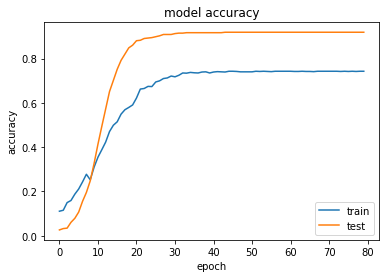

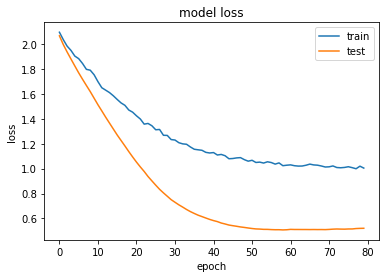

In [20]:
# list all data in history
print(history.history.keys())
# summarize history for accuracy
plt.plot(history.history['acc'])
plt.plot(history.history['val_acc'])
plt.title('model accuracy')
plt.ylabel('accuracy')
plt.xlabel('epoch')
plt.legend(['train', 'test'], loc='lower right')
plt.show()
# summarize history for loss
plt.plot(history.history['loss'])
plt.plot(history.history['val_loss'])
plt.title('model loss')
plt.ylabel('loss')
plt.xlabel('epoch')
plt.legend(['train', 'test'], loc='upper right')
plt.show()

In [24]:
model.predict_classes(X_test)

array([5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5,
       5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5,
       5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5,
       5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5,
       5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5,
       5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5,
       5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5,
       5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5,
       5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5,
       5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5,
       5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5,
       5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5,
       5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5,
       5, 5,

# Class imbalance is causing the bad performance of the model as the model predicts 5 as label for every example which is due to the majority of class 5 examples in the dataset, now I will train a separate model for each class keeping the model same for all classes having 5 convolution layers, 2 dense layers along with 2 max pooling layers with dropout of 0.2 and rmsprop as optimizer

# Model 1 for Class 1

In [124]:
data = []
labels = []

for i in range(1,2):
    img_dir = str(i)
    files = os.listdir(img_dir)
    for f1 in files:
        img = cv2.imread(img_dir+'/'+f1)
        img = cv2.resize(img,(64,64))
        data.append(img) 
        labels.append(0)
        
for i in range(2,8):
    img_dir = str(i)
    files = os.listdir(img_dir)
    for f1 in files:
        img = cv2.imread(img_dir+'/'+f1)
        img = cv2.resize(img,(64,64))
        data.append(img)   
        labels.append(1)
                                 
x_train, x_test, y_train, y_test = train_test_split(data, labels, test_size=0.3, random_state=42)  

class_weights = class_weight.compute_class_weight('balanced',np.unique(y_train),y_train)



x_train = np.asarray(x_train)
y_train = np.asarray(y_train)
x_test = np.asarray(x_test)
y_test = np.asarray(y_test)

In [125]:
# dimensions of our images.
img_width, img_height = 64, 64


epochs = 20
batch_size = 256

if K.image_data_format() == 'channels_first':
    input_shape = (3, img_width, img_height)
else:
    input_shape = (img_width, img_height, 3)


model = Sequential()
model.add(Convolution2D(kernel_size=(3,3),filters=3,input_shape=(img_width, img_height,3),activation="relu",padding="same"))
model.add(Convolution2D(kernel_size=(3,3),filters=10,activation="relu",padding="same"))
model.add(MaxPooling2D(pool_size=(2,2),strides=(2,2)))
model.add(Convolution2D(kernel_size=(3,3),filters=3,activation="relu",padding="same"))
model.add(Convolution2D(kernel_size=(5,5),filters=5,activation="relu",padding="same"))
model.add(MaxPooling2D(pool_size=(3,3),strides=(2,2)))
model.add(Convolution2D(kernel_size=(2,2),strides=(2,2),filters=10))
model.add(Flatten())
model.add(Dropout(0.2))
model.add(Dense(100,activation="sigmoid"))
model.add(Dense(1))
model.add(Activation('sigmoid'))


model.compile(loss='binary_crossentropy',
              optimizer=keras.optimizers.RMSprop(lr=0.01, rho=0.9, epsilon=None, decay=0.0),
              metrics=['accuracy'])

model.summary()

checkpoint = ModelCheckpoint('{val_acc:.4f}.hdf5', monitor='val_acc', verbose=1, save_best_only=True, mode='auto')


history = model.fit(x_train, y_train, batch_size=batch_size, epochs=epochs, validation_split=0.3, callbacks=[checkpoint], class_weight=class_weights)

_________________________________________________________________
Layer (type)                 Output Shape              Param #   
conv2d_206 (Conv2D)          (None, 64, 64, 3)         84        
_________________________________________________________________
conv2d_207 (Conv2D)          (None, 64, 64, 10)        280       
_________________________________________________________________
max_pooling2d_91 (MaxPooling (None, 32, 32, 10)        0         
_________________________________________________________________
conv2d_208 (Conv2D)          (None, 32, 32, 3)         273       
_________________________________________________________________
conv2d_209 (Conv2D)          (None, 32, 32, 5)         380       
_________________________________________________________________
max_pooling2d_92 (MaxPooling (None, 15, 15, 5)         0         
_________________________________________________________________
conv2d_210 (Conv2D)          (None, 7, 7, 10)          210       
__________

In [126]:
[loss,acc] = model.evaluate(x_test,y_test)

710/710 [==============================] - 0s 177us/step


In [127]:
print "Accuracy : ",acc

Accuracy :  0.953521126761


In [128]:
model.predict_classes(x_test)

array([[1],
       [1],
       [1],
       [1],
       [1],
       [1],
       [1],
       [1],
       [1],
       [1],
       [1],
       [1],
       [1],
       [1],
       [1],
       [1],
       [1],
       [1],
       [1],
       [1],
       [1],
       [1],
       [1],
       [1],
       [1],
       [1],
       [1],
       [1],
       [1],
       [1],
       [1],
       [1],
       [1],
       [1],
       [1],
       [1],
       [1],
       [1],
       [1],
       [1],
       [1],
       [1],
       [1],
       [1],
       [1],
       [1],
       [1],
       [1],
       [1],
       [1],
       [1],
       [1],
       [1],
       [1],
       [1],
       [1],
       [1],
       [1],
       [1],
       [1],
       [1],
       [1],
       [1],
       [1],
       [1],
       [1],
       [1],
       [1],
       [1],
       [1],
       [1],
       [1],
       [1],
       [1],
       [1],
       [1],
       [1],
       [1],
       [1],
       [1],
       [1],
       [1],
       [1],
    

In [129]:
class_weights

array([ 9.96385542,  0.5264163 ])

['acc', 'loss', 'val_acc', 'val_loss']


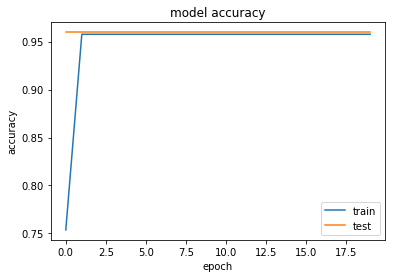

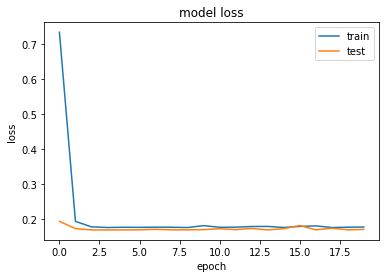

In [59]:
# list all data in history
print(history.history.keys())
# summarize history for accuracy
plt.plot(history.history['acc'])
plt.plot(history.history['val_acc'])
plt.title('model accuracy')
plt.ylabel('accuracy')
plt.xlabel('epoch')
plt.legend(['train', 'test'], loc='lower right')
plt.show()
# summarize history for loss
plt.plot(history.history['loss'])
plt.plot(history.history['val_loss'])
plt.title('model loss')
plt.ylabel('loss')
plt.xlabel('epoch')
plt.legend(['train', 'test'], loc='upper right')
plt.show()

# Model 2 for Class 2

In [63]:
data = []
labels = []

for i in range(2,3):
    img_dir = str(i)
    files = os.listdir(img_dir)
    for f1 in files:
        img = cv2.imread(img_dir+'/'+f1)
        img = cv2.resize(img,(64,64))
        data.append(img) 
        labels.append(0)
        
c = [1,3,4,5,6,7]

for i in c:
    img_dir = str(i)
    files = os.listdir(img_dir)
    for f1 in files:
        img = cv2.imread(img_dir+'/'+f1)
        img = cv2.resize(img,(64,64))
        data.append(img)   
        labels.append(1)
                                 
x_train, x_test, y_train, y_test = train_test_split(data, labels, test_size=0.3)  

x_train = np.asarray(x_train)
y_train = np.asarray(y_train)
x_test = np.asarray(x_test)
y_test = np.asarray(y_test)

In [64]:
# dimensions of our images.
img_width, img_height = 64, 64


epochs = 20
batch_size = 256

if K.image_data_format() == 'channels_first':
    input_shape = (3, img_width, img_height)
else:
    input_shape = (img_width, img_height, 3)


model = Sequential()
model.add(Convolution2D(kernel_size=(3,3),filters=3,input_shape=(img_width, img_height,3),activation="relu",padding="same"))
model.add(Convolution2D(kernel_size=(3,3),filters=10,activation="relu",padding="same"))
model.add(MaxPooling2D(pool_size=(2,2),strides=(2,2)))
model.add(Convolution2D(kernel_size=(3,3),filters=3,activation="relu",padding="same"))
model.add(Convolution2D(kernel_size=(5,5),filters=5,activation="relu",padding="same"))
model.add(MaxPooling2D(pool_size=(3,3),strides=(2,2)))
model.add(Convolution2D(kernel_size=(2,2),strides=(2,2),filters=10))
model.add(Flatten())
model.add(Dropout(0.2))
model.add(Dense(100,activation="sigmoid"))
model.add(Dense(1))
model.add(Activation('sigmoid'))


model.compile(loss='binary_crossentropy',
              optimizer=keras.optimizers.RMSprop(lr=0.01, rho=0.9, epsilon=None, decay=0.0),
              metrics=['accuracy'])

model.summary()

checkpoint = ModelCheckpoint('{val_acc:.4f}.hdf5', monitor='val_acc', verbose=1, save_best_only=True, mode='auto')


history = model.fit(x_train, y_train, batch_size=batch_size, epochs=epochs, validation_split=0.3, callbacks=[checkpoint])

_________________________________________________________________
Layer (type)                 Output Shape              Param #   
conv2d_96 (Conv2D)           (None, 64, 64, 3)         84        
_________________________________________________________________
conv2d_97 (Conv2D)           (None, 64, 64, 10)        280       
_________________________________________________________________
max_pooling2d_43 (MaxPooling (None, 32, 32, 10)        0         
_________________________________________________________________
conv2d_98 (Conv2D)           (None, 32, 32, 3)         273       
_________________________________________________________________
conv2d_99 (Conv2D)           (None, 32, 32, 5)         380       
_________________________________________________________________
max_pooling2d_44 (MaxPooling (None, 15, 15, 5)         0         
_________________________________________________________________
conv2d_100 (Conv2D)          (None, 7, 7, 10)          210       
__________

In [66]:
[loss,acc] = model.evaluate(x_test,y_test)

710/710 [==============================] - 0s 169us/step


In [67]:
print "Accuracy : ",acc

Accuracy :  0.949295774648


['acc', 'loss', 'val_acc', 'val_loss']


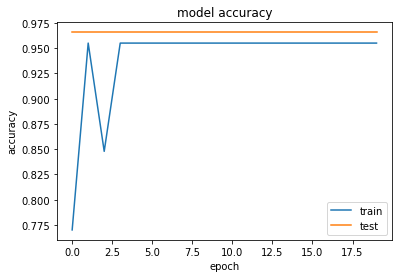

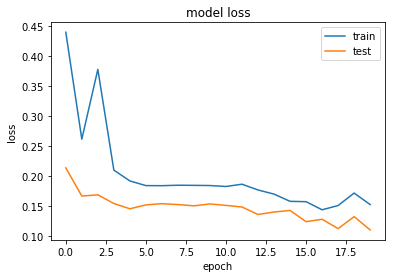

In [65]:
# list all data in history
print(history.history.keys())
# summarize history for accuracy
plt.plot(history.history['acc'])
plt.plot(history.history['val_acc'])
plt.title('model accuracy')
plt.ylabel('accuracy')
plt.xlabel('epoch')
plt.legend(['train', 'test'], loc='lower right')
plt.show()
# summarize history for loss
plt.plot(history.history['loss'])
plt.plot(history.history['val_loss'])
plt.title('model loss')
plt.ylabel('loss')
plt.xlabel('epoch')
plt.legend(['train', 'test'], loc='upper right')
plt.show()

# Model 3 for Class 3

In [68]:
data = []
labels = []

for i in range(3,4):
    img_dir = str(i)
    files = os.listdir(img_dir)
    for f1 in files:
        img = cv2.imread(img_dir+'/'+f1)
        img = cv2.resize(img,(64,64))
        data.append(img) 
        labels.append(0)
        
c = [1,2,4,5,6,7]

for i in c:
    img_dir = str(i)
    files = os.listdir(img_dir)
    for f1 in files:
        img = cv2.imread(img_dir+'/'+f1)
        img = cv2.resize(img,(64,64))
        data.append(img)   
        labels.append(1)
                                 
x_train, x_test, y_train, y_test = train_test_split(data, labels, test_size=0.3)  

x_train = np.asarray(x_train)
y_train = np.asarray(y_train)
x_test = np.asarray(x_test)
y_test = np.asarray(y_test)

In [69]:
# dimensions of our images.
img_width, img_height = 64, 64


epochs = 20
batch_size = 256

if K.image_data_format() == 'channels_first':
    input_shape = (3, img_width, img_height)
else:
    input_shape = (img_width, img_height, 3)


model = Sequential()
model.add(Convolution2D(kernel_size=(3,3),filters=3,input_shape=(img_width, img_height,3),activation="relu",padding="same"))
model.add(Convolution2D(kernel_size=(3,3),filters=10,activation="relu",padding="same"))
model.add(MaxPooling2D(pool_size=(2,2),strides=(2,2)))
model.add(Convolution2D(kernel_size=(3,3),filters=3,activation="relu",padding="same"))
model.add(Convolution2D(kernel_size=(5,5),filters=5,activation="relu",padding="same"))
model.add(MaxPooling2D(pool_size=(3,3),strides=(2,2)))
model.add(Convolution2D(kernel_size=(2,2),strides=(2,2),filters=10))
model.add(Flatten())
model.add(Dropout(0.2))
model.add(Dense(100,activation="sigmoid"))
model.add(Dense(1))
model.add(Activation('sigmoid'))


model.compile(loss='binary_crossentropy',
              optimizer=keras.optimizers.RMSprop(lr=0.01, rho=0.9, epsilon=None, decay=0.0),
              metrics=['accuracy'])

model.summary()

checkpoint = ModelCheckpoint('{val_acc:.4f}.hdf5', monitor='val_acc', verbose=1, save_best_only=True, mode='auto')


history = model.fit(x_train, y_train, batch_size=batch_size, epochs=epochs, validation_split=0.3, callbacks=[checkpoint])

_________________________________________________________________
Layer (type)                 Output Shape              Param #   
conv2d_101 (Conv2D)          (None, 64, 64, 3)         84        
_________________________________________________________________
conv2d_102 (Conv2D)          (None, 64, 64, 10)        280       
_________________________________________________________________
max_pooling2d_45 (MaxPooling (None, 32, 32, 10)        0         
_________________________________________________________________
conv2d_103 (Conv2D)          (None, 32, 32, 3)         273       
_________________________________________________________________
conv2d_104 (Conv2D)          (None, 32, 32, 5)         380       
_________________________________________________________________
max_pooling2d_46 (MaxPooling (None, 15, 15, 5)         0         
_________________________________________________________________
conv2d_105 (Conv2D)          (None, 7, 7, 10)          210       
__________

In [70]:
[loss,acc] = model.evaluate(x_test,y_test)

710/710 [==============================] - 0s 164us/step


In [71]:
print "Accuracy : ",acc

Accuracy :  0.96338028169


['acc', 'loss', 'val_acc', 'val_loss']


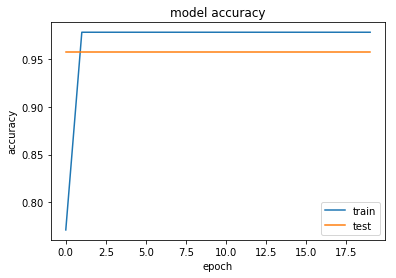

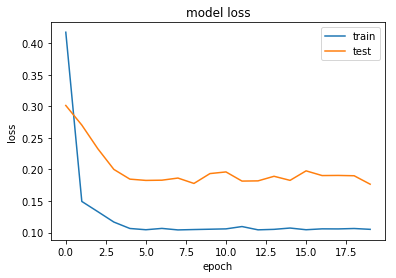

In [72]:
# list all data in history
print(history.history.keys())
# summarize history for accuracy
plt.plot(history.history['acc'])
plt.plot(history.history['val_acc'])
plt.title('model accuracy')
plt.ylabel('accuracy')
plt.xlabel('epoch')
plt.legend(['train', 'test'], loc='lower right')
plt.show()
# summarize history for loss
plt.plot(history.history['loss'])
plt.plot(history.history['val_loss'])
plt.title('model loss')
plt.ylabel('loss')
plt.xlabel('epoch')
plt.legend(['train', 'test'], loc='upper right')
plt.show()

# Model 4 for Class 4

In [73]:
data = []
labels = []

for i in range(4,5):
    img_dir = str(i)
    files = os.listdir(img_dir)
    for f1 in files:
        img = cv2.imread(img_dir+'/'+f1)
        img = cv2.resize(img,(64,64))
        data.append(img) 
        labels.append(0)
        
c = [1,2,3,5,6,7]

for i in c:
    img_dir = str(i)
    files = os.listdir(img_dir)
    for f1 in files:
        img = cv2.imread(img_dir+'/'+f1)
        img = cv2.resize(img,(64,64))
        data.append(img)   
        labels.append(1)
                                 
x_train, x_test, y_train, y_test = train_test_split(data, labels, test_size=0.3)  

x_train = np.asarray(x_train)
y_train = np.asarray(y_train)
x_test = np.asarray(x_test)
y_test = np.asarray(y_test)

In [74]:
# dimensions of our images.
img_width, img_height = 64, 64


epochs = 20
batch_size = 256

if K.image_data_format() == 'channels_first':
    input_shape = (3, img_width, img_height)
else:
    input_shape = (img_width, img_height, 3)


model = Sequential()
model.add(Convolution2D(kernel_size=(3,3),filters=3,input_shape=(img_width, img_height,3),activation="relu",padding="same"))
model.add(Convolution2D(kernel_size=(3,3),filters=10,activation="relu",padding="same"))
model.add(MaxPooling2D(pool_size=(2,2),strides=(2,2)))
model.add(Convolution2D(kernel_size=(3,3),filters=3,activation="relu",padding="same"))
model.add(Convolution2D(kernel_size=(5,5),filters=5,activation="relu",padding="same"))
model.add(MaxPooling2D(pool_size=(3,3),strides=(2,2)))
model.add(Convolution2D(kernel_size=(2,2),strides=(2,2),filters=10))
model.add(Flatten())
model.add(Dropout(0.2))
model.add(Dense(100,activation="sigmoid"))
model.add(Dense(1))
model.add(Activation('sigmoid'))


model.compile(loss='binary_crossentropy',
              optimizer=keras.optimizers.RMSprop(lr=0.01, rho=0.9, epsilon=None, decay=0.0),
              metrics=['accuracy'])

model.summary()

checkpoint = ModelCheckpoint('{val_acc:.4f}.hdf5', monitor='val_acc', verbose=1, save_best_only=True, mode='auto')


history = model.fit(x_train, y_train, batch_size=batch_size, epochs=epochs, validation_split=0.3, callbacks=[checkpoint])

_________________________________________________________________
Layer (type)                 Output Shape              Param #   
conv2d_106 (Conv2D)          (None, 64, 64, 3)         84        
_________________________________________________________________
conv2d_107 (Conv2D)          (None, 64, 64, 10)        280       
_________________________________________________________________
max_pooling2d_47 (MaxPooling (None, 32, 32, 10)        0         
_________________________________________________________________
conv2d_108 (Conv2D)          (None, 32, 32, 3)         273       
_________________________________________________________________
conv2d_109 (Conv2D)          (None, 32, 32, 5)         380       
_________________________________________________________________
max_pooling2d_48 (MaxPooling (None, 15, 15, 5)         0         
_________________________________________________________________
conv2d_110 (Conv2D)          (None, 7, 7, 10)          210       
__________

In [75]:
[loss,acc] = model.evaluate(x_test,y_test)

710/710 [==============================] - 0s 163us/step


In [76]:
print "Accuracy : ",acc

Accuracy :  0.967605633803


['acc', 'loss', 'val_acc', 'val_loss']


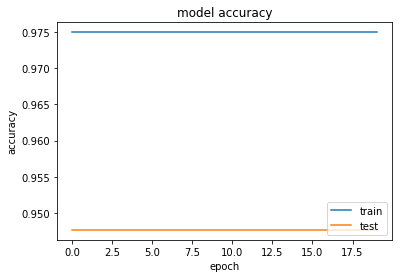

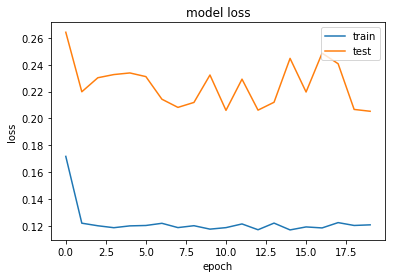

In [77]:
# list all data in history
print(history.history.keys())
# summarize history for accuracy
plt.plot(history.history['acc'])
plt.plot(history.history['val_acc'])
plt.title('model accuracy')
plt.ylabel('accuracy')
plt.xlabel('epoch')
plt.legend(['train', 'test'], loc='lower right')
plt.show()
# summarize history for loss
plt.plot(history.history['loss'])
plt.plot(history.history['val_loss'])
plt.title('model loss')
plt.ylabel('loss')
plt.xlabel('epoch')
plt.legend(['train', 'test'], loc='upper right')
plt.show()

# Model 5 for Class 5

In [78]:
data = []
labels = []

for i in range(5,6):
    img_dir = str(i)
    files = os.listdir(img_dir)
    for f1 in files:
        img = cv2.imread(img_dir+'/'+f1)
        img = cv2.resize(img,(64,64))
        data.append(img) 
        labels.append(0)
        
c = [1,2,3,4,6,7]

for i in c:
    img_dir = str(i)
    files = os.listdir(img_dir)
    for f1 in files:
        img = cv2.imread(img_dir+'/'+f1)
        img = cv2.resize(img,(64,64))
        data.append(img)   
        labels.append(1)
                                 
x_train, x_test, y_train, y_test = train_test_split(data, labels, test_size=0.3)  

x_train = np.asarray(x_train)
y_train = np.asarray(y_train)
x_test = np.asarray(x_test)
y_test = np.asarray(y_test)

In [79]:
# dimensions of our images.
img_width, img_height = 64, 64


epochs = 20
batch_size = 256

if K.image_data_format() == 'channels_first':
    input_shape = (3, img_width, img_height)
else:
    input_shape = (img_width, img_height, 3)


model = Sequential()
model.add(Convolution2D(kernel_size=(3,3),filters=3,input_shape=(img_width, img_height,3),activation="relu",padding="same"))
model.add(Convolution2D(kernel_size=(3,3),filters=10,activation="relu",padding="same"))
model.add(MaxPooling2D(pool_size=(2,2),strides=(2,2)))
model.add(Convolution2D(kernel_size=(3,3),filters=3,activation="relu",padding="same"))
model.add(Convolution2D(kernel_size=(5,5),filters=5,activation="relu",padding="same"))
model.add(MaxPooling2D(pool_size=(3,3),strides=(2,2)))
model.add(Convolution2D(kernel_size=(2,2),strides=(2,2),filters=10))
model.add(Flatten())
model.add(Dropout(0.2))
model.add(Dense(100,activation="sigmoid"))
model.add(Dense(1))
model.add(Activation('sigmoid'))


model.compile(loss='binary_crossentropy',
              optimizer=keras.optimizers.RMSprop(lr=0.01, rho=0.9, epsilon=None, decay=0.0),
              metrics=['accuracy'])

model.summary()

checkpoint = ModelCheckpoint('{val_acc:.4f}.hdf5', monitor='val_acc', verbose=1, save_best_only=True, mode='auto')


history = model.fit(x_train, y_train, batch_size=batch_size, epochs=epochs, validation_split=0.3, callbacks=[checkpoint])

_________________________________________________________________
Layer (type)                 Output Shape              Param #   
conv2d_111 (Conv2D)          (None, 64, 64, 3)         84        
_________________________________________________________________
conv2d_112 (Conv2D)          (None, 64, 64, 10)        280       
_________________________________________________________________
max_pooling2d_49 (MaxPooling (None, 32, 32, 10)        0         
_________________________________________________________________
conv2d_113 (Conv2D)          (None, 32, 32, 3)         273       
_________________________________________________________________
conv2d_114 (Conv2D)          (None, 32, 32, 5)         380       
_________________________________________________________________
max_pooling2d_50 (MaxPooling (None, 15, 15, 5)         0         
_________________________________________________________________
conv2d_115 (Conv2D)          (None, 7, 7, 10)          210       
__________

In [80]:
[loss,acc] = model.evaluate(x_test,y_test)

710/710 [==============================] - 0s 162us/step


In [81]:
print "Accuracy : ",acc

Accuracy :  0.960563380282


['acc', 'loss', 'val_acc', 'val_loss']


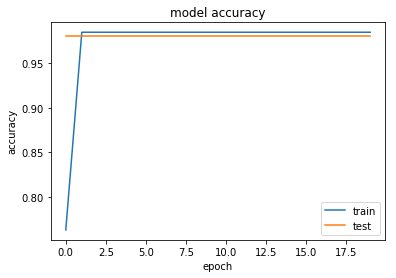

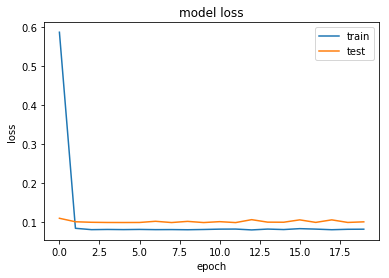

In [82]:
# list all data in history
print(history.history.keys())
# summarize history for accuracy
plt.plot(history.history['acc'])
plt.plot(history.history['val_acc'])
plt.title('model accuracy')
plt.ylabel('accuracy')
plt.xlabel('epoch')
plt.legend(['train', 'test'], loc='lower right')
plt.show()
# summarize history for loss
plt.plot(history.history['loss'])
plt.plot(history.history['val_loss'])
plt.title('model loss')
plt.ylabel('loss')
plt.xlabel('epoch')
plt.legend(['train', 'test'], loc='upper right')
plt.show()

# Model 6 for Class 6

In [83]:
data = []
labels = []

for i in range(6,7):
    img_dir = str(i)
    files = os.listdir(img_dir)
    for f1 in files:
        img = cv2.imread(img_dir+'/'+f1)
        img = cv2.resize(img,(64,64))
        data.append(img) 
        labels.append(0)
        
c = [1,2,3,4,5,7]

for i in c:
    img_dir = str(i)
    files = os.listdir(img_dir)
    for f1 in files:
        img = cv2.imread(img_dir+'/'+f1)
        img = cv2.resize(img,(64,64))
        data.append(img)   
        labels.append(1)
                                 
x_train, x_test, y_train, y_test = train_test_split(data, labels, test_size=0.3)  

x_train = np.asarray(x_train)
y_train = np.asarray(y_train)
x_test = np.asarray(x_test)
y_test = np.asarray(y_test)

In [91]:
# dimensions of our images.
img_width, img_height = 64, 64


epochs = 320
batch_size = 256

if K.image_data_format() == 'channels_first':
    input_shape = (3, img_width, img_height)
else:
    input_shape = (img_width, img_height, 3)


model = Sequential()
model.add(Convolution2D(kernel_size=(3,3),filters=3,input_shape=(img_width, img_height,3),activation="relu",padding="same"))
model.add(Convolution2D(kernel_size=(3,3),filters=10,activation="relu",padding="same"))
model.add(MaxPooling2D(pool_size=(2,2),strides=(2,2)))
model.add(Convolution2D(kernel_size=(3,3),filters=3,activation="relu",padding="same"))
model.add(Convolution2D(kernel_size=(5,5),filters=5,activation="relu",padding="same"))
model.add(MaxPooling2D(pool_size=(3,3),strides=(2,2)))
model.add(Convolution2D(kernel_size=(2,2),strides=(2,2),filters=10))
model.add(Flatten())
model.add(Dropout(0.2))
model.add(Dense(100,activation="sigmoid"))
model.add(Dense(1))
model.add(Activation('sigmoid'))


model.compile(loss='binary_crossentropy',
              optimizer=keras.optimizers.RMSprop(lr=0.001, rho=0.9, epsilon=None, decay=0.0),
              metrics=['accuracy'])

model.summary()

checkpoint = ModelCheckpoint('{val_acc:.4f}.hdf5', monitor='val_acc', verbose=1, save_best_only=True, mode='auto')


history = model.fit(x_train, y_train, batch_size=batch_size, epochs=epochs, validation_split=0.3, callbacks=[checkpoint])

_________________________________________________________________
Layer (type)                 Output Shape              Param #   
conv2d_151 (Conv2D)          (None, 64, 64, 3)         84        
_________________________________________________________________
conv2d_152 (Conv2D)          (None, 64, 64, 10)        280       
_________________________________________________________________
max_pooling2d_65 (MaxPooling (None, 32, 32, 10)        0         
_________________________________________________________________
conv2d_153 (Conv2D)          (None, 32, 32, 3)         273       
_________________________________________________________________
conv2d_154 (Conv2D)          (None, 32, 32, 5)         380       
_________________________________________________________________
max_pooling2d_66 (MaxPooling (None, 15, 15, 5)         0         
_________________________________________________________________
conv2d_155 (Conv2D)          (None, 7, 7, 10)          210       
__________

Epoch 24/320
1024/1157 [=========================>....] - ETA: 0s - loss: 0.2485 - acc: 0.9062
Epoch 00024: val_acc improved from 0.87726 to 0.88531, saving model to 0.8853.hdf5
1157/1157 [==============================] - 1s 506us/step - loss: 0.2390 - acc: 0.9092 - val_loss: 0.3116 - val_acc: 0.8853
Epoch 25/320
1024/1157 [=========================>....] - ETA: 0s - loss: 0.2219 - acc: 0.9170
Epoch 00025: val_acc did not improve
1157/1157 [==============================] - 1s 457us/step - loss: 0.2307 - acc: 0.9127 - val_loss: 0.3188 - val_acc: 0.8712
Epoch 26/320
1024/1157 [=========================>....] - ETA: 0s - loss: 0.2410 - acc: 0.9014
Epoch 00026: val_acc did not improve
1157/1157 [==============================] - 1s 503us/step - loss: 0.2330 - acc: 0.9058 - val_loss: 0.3132 - val_acc: 0.8813
Epoch 27/320
1024/1157 [=========================>....] - ETA: 0s - loss: 0.2247 - acc: 0.9111
Epoch 00027: val_acc did not improve
1157/1157 [==============================] - 1s 483

Epoch 56/320
1024/1157 [=========================>....] - ETA: 0s - loss: 0.0812 - acc: 0.9785
Epoch 00056: val_acc did not improve
1157/1157 [==============================] - 1s 547us/step - loss: 0.0856 - acc: 0.9758 - val_loss: 0.3526 - val_acc: 0.8712
Epoch 57/320
1024/1157 [=========================>....] - ETA: 0s - loss: 0.0950 - acc: 0.9736
Epoch 00057: val_acc did not improve
1157/1157 [==============================] - 1s 435us/step - loss: 0.0926 - acc: 0.9749 - val_loss: 0.3540 - val_acc: 0.8773
Epoch 58/320
1024/1157 [=========================>....] - ETA: 0s - loss: 0.0849 - acc: 0.9736
Epoch 00058: val_acc did not improve
1157/1157 [==============================] - 1s 435us/step - loss: 0.0848 - acc: 0.9741 - val_loss: 0.3670 - val_acc: 0.8592
Epoch 59/320
1024/1157 [=========================>....] - ETA: 0s - loss: 0.0841 - acc: 0.9727
Epoch 00059: val_acc did not improve
1157/1157 [==============================] - 0s 425us/step - loss: 0.0816 - acc: 0.9741 - val_los

Epoch 88/320
1024/1157 [=========================>....] - ETA: 0s - loss: 0.0324 - acc: 0.9932
Epoch 00088: val_acc did not improve
1157/1157 [==============================] - 1s 491us/step - loss: 0.0321 - acc: 0.9939 - val_loss: 0.4449 - val_acc: 0.8612
Epoch 89/320
1024/1157 [=========================>....] - ETA: 0s - loss: 0.0285 - acc: 0.9902
Epoch 00089: val_acc did not improve
1157/1157 [==============================] - 1s 534us/step - loss: 0.0300 - acc: 0.9896 - val_loss: 0.4631 - val_acc: 0.8712
Epoch 90/320
1024/1157 [=========================>....] - ETA: 0s - loss: 0.0245 - acc: 0.9971
Epoch 00090: val_acc did not improve
1157/1157 [==============================] - 1s 541us/step - loss: 0.0243 - acc: 0.9974 - val_loss: 0.4673 - val_acc: 0.8672
Epoch 91/320
1024/1157 [=========================>....] - ETA: 0s - loss: 0.0197 - acc: 0.9990
Epoch 00091: val_acc did not improve
1157/1157 [==============================] - 1s 515us/step - loss: 0.0231 - acc: 0.9965 - val_los

Epoch 120/320
1024/1157 [=========================>....] - ETA: 0s - loss: 0.0138 - acc: 0.9961
Epoch 00120: val_acc did not improve
1157/1157 [==============================] - 1s 504us/step - loss: 0.0132 - acc: 0.9965 - val_loss: 0.5205 - val_acc: 0.8753
Epoch 121/320
1024/1157 [=========================>....] - ETA: 0s - loss: 0.0083 - acc: 0.9990
Epoch 00121: val_acc did not improve
1157/1157 [==============================] - 1s 554us/step - loss: 0.0085 - acc: 0.9991 - val_loss: 0.5298 - val_acc: 0.8692
Epoch 122/320
1024/1157 [=========================>....] - ETA: 0s - loss: 0.0103 - acc: 0.9990
Epoch 00122: val_acc did not improve
1157/1157 [==============================] - 1s 544us/step - loss: 0.0099 - acc: 0.9991 - val_loss: 0.5439 - val_acc: 0.8672
Epoch 123/320
1024/1157 [=========================>....] - ETA: 0s - loss: 0.0071 - acc: 0.9990
Epoch 00123: val_acc did not improve
1157/1157 [==============================] - 1s 499us/step - loss: 0.0074 - acc: 0.9991 - val

Epoch 152/320
1024/1157 [=========================>....] - ETA: 0s - loss: 0.0028 - acc: 1.0000
Epoch 00152: val_acc did not improve
1157/1157 [==============================] - 0s 397us/step - loss: 0.0032 - acc: 1.0000 - val_loss: 0.6009 - val_acc: 0.8672
Epoch 153/320
1024/1157 [=========================>....] - ETA: 0s - loss: 0.0031 - acc: 1.0000
Epoch 00153: val_acc did not improve
1157/1157 [==============================] - 0s 395us/step - loss: 0.0034 - acc: 1.0000 - val_loss: 0.6060 - val_acc: 0.8692
Epoch 154/320
1024/1157 [=========================>....] - ETA: 0s - loss: 0.0148 - acc: 0.9951
Epoch 00154: val_acc did not improve
1157/1157 [==============================] - 0s 388us/step - loss: 0.0138 - acc: 0.9957 - val_loss: 0.6167 - val_acc: 0.8672
Epoch 155/320
1024/1157 [=========================>....] - ETA: 0s - loss: 0.0034 - acc: 1.0000
Epoch 00155: val_acc did not improve
1157/1157 [==============================] - 0s 401us/step - loss: 0.0036 - acc: 1.0000 - val

Epoch 184/320
1024/1157 [=========================>....] - ETA: 0s - loss: 0.0027 - acc: 1.0000
Epoch 00184: val_acc did not improve
1157/1157 [==============================] - 1s 516us/step - loss: 0.0026 - acc: 1.0000 - val_loss: 0.6733 - val_acc: 0.8732
Epoch 185/320
1024/1157 [=========================>....] - ETA: 0s - loss: 0.0062 - acc: 0.9980
Epoch 00185: val_acc did not improve
1157/1157 [==============================] - 1s 498us/step - loss: 0.0068 - acc: 0.9974 - val_loss: 0.6605 - val_acc: 0.8652
Epoch 186/320
1024/1157 [=========================>....] - ETA: 0s - loss: 0.0107 - acc: 0.9980
Epoch 00186: val_acc did not improve
1157/1157 [==============================] - 1s 480us/step - loss: 0.0100 - acc: 0.9983 - val_loss: 0.6865 - val_acc: 0.8632
Epoch 187/320
1024/1157 [=========================>....] - ETA: 0s - loss: 0.0079 - acc: 0.9990
Epoch 00187: val_acc did not improve
1157/1157 [==============================] - 1s 524us/step - loss: 0.0073 - acc: 0.9991 - val

Epoch 216/320
1024/1157 [=========================>....] - ETA: 0s - loss: 7.8427e-04 - acc: 1.0000
Epoch 00216: val_acc did not improve
1157/1157 [==============================] - 1s 479us/step - loss: 7.8928e-04 - acc: 1.0000 - val_loss: 0.7282 - val_acc: 0.8793
Epoch 217/320
1024/1157 [=========================>....] - ETA: 0s - loss: 0.0017 - acc: 0.9990  
Epoch 00217: val_acc did not improve
1157/1157 [==============================] - 1s 502us/step - loss: 0.0018 - acc: 0.9991 - val_loss: 0.7206 - val_acc: 0.8773
Epoch 218/320
1024/1157 [=========================>....] - ETA: 0s - loss: 0.0096 - acc: 0.9961
Epoch 00218: val_acc did not improve
1157/1157 [==============================] - 1s 474us/step - loss: 0.0086 - acc: 0.9965 - val_loss: 0.7697 - val_acc: 0.8632
Epoch 219/320
1024/1157 [=========================>....] - ETA: 0s - loss: 0.0029 - acc: 0.9990  
Epoch 00219: val_acc did not improve
1157/1157 [==============================] - 0s 425us/step - loss: 0.0027 - acc: 

1024/1157 [=========================>....] - ETA: 0s - loss: 5.9308e-04 - acc: 1.0000
Epoch 00278: val_acc did not improve
1157/1157 [==============================] - 0s 427us/step - loss: 5.6258e-04 - acc: 1.0000 - val_loss: 0.7439 - val_acc: 0.8753
Epoch 279/320
1024/1157 [=========================>....] - ETA: 0s - loss: 0.0015 - acc: 1.0000    
Epoch 00279: val_acc did not improve
1157/1157 [==============================] - 1s 445us/step - loss: 0.0014 - acc: 1.0000 - val_loss: 0.7061 - val_acc: 0.8833
Epoch 280/320
1024/1157 [=========================>....] - ETA: 0s - loss: 6.1829e-04 - acc: 1.0000
Epoch 00280: val_acc did not improve
1157/1157 [==============================] - 0s 413us/step - loss: 7.1284e-04 - acc: 1.0000 - val_loss: 0.7406 - val_acc: 0.8833
Epoch 281/320
1024/1157 [=========================>....] - ETA: 0s - loss: 7.5955e-04 - acc: 1.0000
Epoch 00281: val_acc did not improve
1157/1157 [==============================] - 0s 417us/step - loss: 6.9525e-04 - acc

1024/1157 [=========================>....] - ETA: 0s - loss: 0.0021 - acc: 1.0000
Epoch 00309: val_acc did not improve
1157/1157 [==============================] - 1s 507us/step - loss: 0.0020 - acc: 1.0000 - val_loss: 0.7568 - val_acc: 0.8773
Epoch 310/320
1024/1157 [=========================>....] - ETA: 0s - loss: 4.0428e-04 - acc: 1.0000
Epoch 00310: val_acc did not improve
1157/1157 [==============================] - 1s 468us/step - loss: 4.4822e-04 - acc: 1.0000 - val_loss: 0.7648 - val_acc: 0.8793
Epoch 311/320
1024/1157 [=========================>....] - ETA: 0s - loss: 5.7714e-04 - acc: 1.0000
Epoch 00311: val_acc did not improve
1157/1157 [==============================] - 1s 505us/step - loss: 0.0046 - acc: 0.9991 - val_loss: 0.7474 - val_acc: 0.8692
Epoch 312/320
1024/1157 [=========================>....] - ETA: 0s - loss: 0.0147 - acc: 0.9932
Epoch 00312: val_acc did not improve
1157/1157 [==============================] - 1s 475us/step - loss: 0.0131 - acc: 0.9939 - val_l

In [92]:
[loss,acc] = model.evaluate(x_test,y_test)

710/710 [==============================] - 0s 171us/step


In [93]:
print "Accuracy : ",acc

Accuracy :  0.880281690141


['acc', 'loss', 'val_acc', 'val_loss']


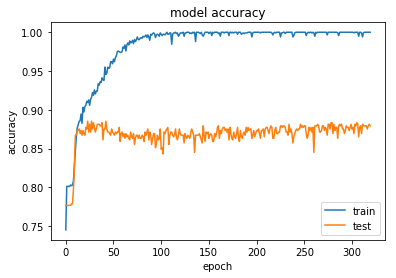

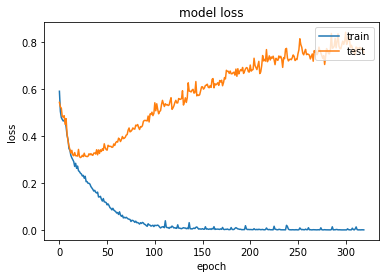

In [94]:
# list all data in history
print(history.history.keys())
# summarize history for accuracy
plt.plot(history.history['acc'])
plt.plot(history.history['val_acc'])
plt.title('model accuracy')
plt.ylabel('accuracy')
plt.xlabel('epoch')
plt.legend(['train', 'test'], loc='lower right')
plt.show()
# summarize history for loss
plt.plot(history.history['loss'])
plt.plot(history.history['val_loss'])
plt.title('model loss')
plt.ylabel('loss')
plt.xlabel('epoch')
plt.legend(['train', 'test'], loc='upper right')
plt.show()

# Model 6 for Class 6 with an increased dropout layer

In [99]:
# dimensions of our images.
img_width, img_height = 64, 64


epochs = 320
batch_size = 256

if K.image_data_format() == 'channels_first':
    input_shape = (3, img_width, img_height)
else:
    input_shape = (img_width, img_height, 3)


model = Sequential()
model.add(Convolution2D(kernel_size=(3,3),filters=3,input_shape=(img_width, img_height,3),activation="relu",padding="same"))
model.add(Convolution2D(kernel_size=(3,3),filters=10,activation="relu",padding="same"))
model.add(MaxPooling2D(pool_size=(2,2),strides=(2,2)))
model.add(Convolution2D(kernel_size=(3,3),filters=3,activation="relu",padding="same"))
model.add(Convolution2D(kernel_size=(5,5),filters=5,activation="relu",padding="same"))
model.add(MaxPooling2D(pool_size=(3,3),strides=(2,2)))
model.add(Dropout(0.5))
model.add(Convolution2D(kernel_size=(2,2),strides=(2,2),filters=10))
model.add(Flatten())
model.add(Dropout(0.5))
model.add(Dense(100,activation="sigmoid"))
model.add(Dense(1))
model.add(Activation('sigmoid'))


model.compile(loss='binary_crossentropy',
              optimizer=keras.optimizers.RMSprop(lr=0.001, rho=0.9, epsilon=None, decay=0.0),
              metrics=['accuracy'])

model.summary()

checkpoint = ModelCheckpoint('{val_acc:.4f}.hdf5', monitor='val_acc', verbose=1, save_best_only=True, mode='auto')


history = model.fit(x_train, y_train, batch_size=batch_size, epochs=epochs, validation_split=0.3, callbacks=[checkpoint])

_________________________________________________________________
Layer (type)                 Output Shape              Param #   
conv2d_176 (Conv2D)          (None, 64, 64, 3)         84        
_________________________________________________________________
conv2d_177 (Conv2D)          (None, 64, 64, 10)        280       
_________________________________________________________________
max_pooling2d_79 (MaxPooling (None, 32, 32, 10)        0         
_________________________________________________________________
conv2d_178 (Conv2D)          (None, 32, 32, 3)         273       
_________________________________________________________________
conv2d_179 (Conv2D)          (None, 32, 32, 5)         380       
_________________________________________________________________
max_pooling2d_80 (MaxPooling (None, 15, 15, 5)         0         
_________________________________________________________________
dropout_60 (Dropout)         (None, 15, 15, 5)         0         
__________

Epoch 23/320
1024/1157 [=========================>....] - ETA: 0s - loss: 0.3176 - acc: 0.8740
Epoch 00023: val_acc improved from 0.87726 to 0.87928, saving model to 0.8793.hdf5
1157/1157 [==============================] - 0s 407us/step - loss: 0.3264 - acc: 0.8695 - val_loss: 0.3439 - val_acc: 0.8793
Epoch 24/320
1024/1157 [=========================>....] - ETA: 0s - loss: 0.3316 - acc: 0.8613
Epoch 00024: val_acc did not improve
1157/1157 [==============================] - 1s 447us/step - loss: 0.3366 - acc: 0.8600 - val_loss: 0.3558 - val_acc: 0.8692
Epoch 25/320
1024/1157 [=========================>....] - ETA: 0s - loss: 0.3339 - acc: 0.8516
Epoch 00025: val_acc did not improve
1157/1157 [==============================] - 0s 385us/step - loss: 0.3328 - acc: 0.8539 - val_loss: 0.3571 - val_acc: 0.8712
Epoch 26/320
1024/1157 [=========================>....] - ETA: 0s - loss: 0.3214 - acc: 0.8672
Epoch 00026: val_acc did not improve
1157/1157 [==============================] - 0s 362

Epoch 54/320
1024/1157 [=========================>....] - ETA: 0s - loss: 0.3011 - acc: 0.8750
Epoch 00054: val_acc did not improve
1157/1157 [==============================] - 0s 345us/step - loss: 0.3007 - acc: 0.8755 - val_loss: 0.3093 - val_acc: 0.8853
Epoch 55/320
1024/1157 [=========================>....] - ETA: 0s - loss: 0.2997 - acc: 0.8789
Epoch 00055: val_acc did not improve
1157/1157 [==============================] - 0s 339us/step - loss: 0.2904 - acc: 0.8850 - val_loss: 0.3367 - val_acc: 0.8793
Epoch 56/320
1024/1157 [=========================>....] - ETA: 0s - loss: 0.3069 - acc: 0.8691
Epoch 00056: val_acc did not improve
1157/1157 [==============================] - 0s 340us/step - loss: 0.2987 - acc: 0.8773 - val_loss: 0.3214 - val_acc: 0.8833
Epoch 57/320
1024/1157 [=========================>....] - ETA: 0s - loss: 0.2936 - acc: 0.8711
Epoch 00057: val_acc did not improve
1157/1157 [==============================] - 0s 361us/step - loss: 0.2950 - acc: 0.8686 - val_los

Epoch 85/320
1024/1157 [=========================>....] - ETA: 0s - loss: 0.2632 - acc: 0.8975
Epoch 00085: val_acc did not improve
1157/1157 [==============================] - 1s 466us/step - loss: 0.2530 - acc: 0.9006 - val_loss: 0.2997 - val_acc: 0.8913
Epoch 86/320
1024/1157 [=========================>....] - ETA: 0s - loss: 0.2665 - acc: 0.8955
Epoch 00086: val_acc did not improve
1157/1157 [==============================] - 0s 424us/step - loss: 0.2620 - acc: 0.8963 - val_loss: 0.2986 - val_acc: 0.8934
Epoch 87/320
1024/1157 [=========================>....] - ETA: 0s - loss: 0.2619 - acc: 0.8906
Epoch 00087: val_acc did not improve
1157/1157 [==============================] - 0s 408us/step - loss: 0.2524 - acc: 0.8963 - val_loss: 0.2968 - val_acc: 0.8954
Epoch 88/320
1024/1157 [=========================>....] - ETA: 0s - loss: 0.2669 - acc: 0.8936
Epoch 00088: val_acc did not improve
1157/1157 [==============================] - 0s 408us/step - loss: 0.2657 - acc: 0.8928 - val_los

Epoch 117/320
1024/1157 [=========================>....] - ETA: 0s - loss: 0.2282 - acc: 0.9121
Epoch 00117: val_acc did not improve
1157/1157 [==============================] - 0s 334us/step - loss: 0.2241 - acc: 0.9136 - val_loss: 0.3128 - val_acc: 0.8954
Epoch 118/320
1024/1157 [=========================>....] - ETA: 0s - loss: 0.2035 - acc: 0.9131
Epoch 00118: val_acc did not improve
1157/1157 [==============================] - 0s 337us/step - loss: 0.2083 - acc: 0.9101 - val_loss: 0.2968 - val_acc: 0.8994
Epoch 119/320
1024/1157 [=========================>....] - ETA: 0s - loss: 0.2222 - acc: 0.9121
Epoch 00119: val_acc did not improve
1157/1157 [==============================] - 0s 339us/step - loss: 0.2212 - acc: 0.9110 - val_loss: 0.2885 - val_acc: 0.8974
Epoch 120/320
1024/1157 [=========================>....] - ETA: 0s - loss: 0.2105 - acc: 0.9062
Epoch 00120: val_acc did not improve
1157/1157 [==============================] - 0s 340us/step - loss: 0.2063 - acc: 0.9084 - val

Epoch 149/320
1024/1157 [=========================>....] - ETA: 0s - loss: 0.1891 - acc: 0.9248
Epoch 00149: val_acc did not improve
1157/1157 [==============================] - 0s 341us/step - loss: 0.1877 - acc: 0.9231 - val_loss: 0.3015 - val_acc: 0.8954
Epoch 150/320
1024/1157 [=========================>....] - ETA: 0s - loss: 0.1884 - acc: 0.9238
Epoch 00150: val_acc did not improve
1157/1157 [==============================] - 0s 336us/step - loss: 0.1837 - acc: 0.9257 - val_loss: 0.2960 - val_acc: 0.8954
Epoch 151/320
1024/1157 [=========================>....] - ETA: 0s - loss: 0.1959 - acc: 0.9258
Epoch 00151: val_acc did not improve
1157/1157 [==============================] - 0s 341us/step - loss: 0.1942 - acc: 0.9274 - val_loss: 0.2977 - val_acc: 0.9034
Epoch 152/320
1024/1157 [=========================>....] - ETA: 0s - loss: 0.1759 - acc: 0.9229
Epoch 00152: val_acc did not improve
1157/1157 [==============================] - 0s 334us/step - loss: 0.1758 - acc: 0.9239 - val

Epoch 181/320
1024/1157 [=========================>....] - ETA: 0s - loss: 0.1546 - acc: 0.9385
Epoch 00181: val_acc did not improve
1157/1157 [==============================] - 0s 333us/step - loss: 0.1557 - acc: 0.9386 - val_loss: 0.3531 - val_acc: 0.8793
Epoch 182/320
1024/1157 [=========================>....] - ETA: 0s - loss: 0.1522 - acc: 0.9424
Epoch 00182: val_acc did not improve
1157/1157 [==============================] - 0s 336us/step - loss: 0.1484 - acc: 0.9421 - val_loss: 0.3241 - val_acc: 0.8934
Epoch 183/320
1024/1157 [=========================>....] - ETA: 0s - loss: 0.1384 - acc: 0.9463
Epoch 00183: val_acc did not improve
1157/1157 [==============================] - 0s 336us/step - loss: 0.1495 - acc: 0.9412 - val_loss: 0.3304 - val_acc: 0.8893
Epoch 184/320
1024/1157 [=========================>....] - ETA: 0s - loss: 0.1417 - acc: 0.9492
Epoch 00184: val_acc did not improve
1157/1157 [==============================] - 0s 337us/step - loss: 0.1500 - acc: 0.9464 - val

Epoch 213/320
1024/1157 [=========================>....] - ETA: 0s - loss: 0.1142 - acc: 0.9580
Epoch 00213: val_acc did not improve
1157/1157 [==============================] - 0s 400us/step - loss: 0.1233 - acc: 0.9516 - val_loss: 0.3375 - val_acc: 0.8793
Epoch 214/320
1024/1157 [=========================>....] - ETA: 0s - loss: 0.1296 - acc: 0.9492
Epoch 00214: val_acc did not improve
1157/1157 [==============================] - 0s 401us/step - loss: 0.1308 - acc: 0.9490 - val_loss: 0.3466 - val_acc: 0.8813
Epoch 215/320
1024/1157 [=========================>....] - ETA: 0s - loss: 0.1204 - acc: 0.9551
Epoch 00215: val_acc did not improve
1157/1157 [==============================] - 0s 338us/step - loss: 0.1229 - acc: 0.9551 - val_loss: 0.3404 - val_acc: 0.8954
Epoch 216/320
1024/1157 [=========================>....] - ETA: 0s - loss: 0.1034 - acc: 0.9639
Epoch 00216: val_acc did not improve
1157/1157 [==============================] - 0s 336us/step - loss: 0.1065 - acc: 0.9611 - val

Epoch 245/320
1024/1157 [=========================>....] - ETA: 0s - loss: 0.1169 - acc: 0.9541
Epoch 00245: val_acc did not improve
1157/1157 [==============================] - 0s 417us/step - loss: 0.1177 - acc: 0.9542 - val_loss: 0.3668 - val_acc: 0.8813
Epoch 246/320
1024/1157 [=========================>....] - ETA: 0s - loss: 0.1212 - acc: 0.9492
Epoch 00246: val_acc did not improve
1157/1157 [==============================] - 0s 383us/step - loss: 0.1170 - acc: 0.9507 - val_loss: 0.3635 - val_acc: 0.8913
Epoch 247/320
1024/1157 [=========================>....] - ETA: 0s - loss: 0.1120 - acc: 0.9609
Epoch 00247: val_acc did not improve
1157/1157 [==============================] - 0s 334us/step - loss: 0.1124 - acc: 0.9611 - val_loss: 0.3627 - val_acc: 0.8813
Epoch 248/320
1024/1157 [=========================>....] - ETA: 0s - loss: 0.1146 - acc: 0.9551
Epoch 00248: val_acc did not improve
1157/1157 [==============================] - 0s 337us/step - loss: 0.1189 - acc: 0.9533 - val

Epoch 277/320
1024/1157 [=========================>....] - ETA: 0s - loss: 0.0965 - acc: 0.9639
Epoch 00277: val_acc did not improve
1157/1157 [==============================] - 0s 335us/step - loss: 0.1041 - acc: 0.9611 - val_loss: 0.3979 - val_acc: 0.8793
Epoch 278/320
1024/1157 [=========================>....] - ETA: 0s - loss: 0.1026 - acc: 0.9658
Epoch 00278: val_acc did not improve
1157/1157 [==============================] - 0s 332us/step - loss: 0.0953 - acc: 0.9689 - val_loss: 0.4034 - val_acc: 0.8833
Epoch 279/320
1024/1157 [=========================>....] - ETA: 0s - loss: 0.0948 - acc: 0.9688
Epoch 00279: val_acc did not improve
1157/1157 [==============================] - 0s 381us/step - loss: 0.0940 - acc: 0.9689 - val_loss: 0.3776 - val_acc: 0.8974
Epoch 280/320
1024/1157 [=========================>....] - ETA: 0s - loss: 0.0950 - acc: 0.9697
Epoch 00280: val_acc did not improve
1157/1157 [==============================] - 0s 382us/step - loss: 0.0939 - acc: 0.9706 - val

Epoch 309/320
1024/1157 [=========================>....] - ETA: 0s - loss: 0.0813 - acc: 0.9668
Epoch 00309: val_acc did not improve
1157/1157 [==============================] - 0s 350us/step - loss: 0.0843 - acc: 0.9680 - val_loss: 0.4090 - val_acc: 0.8893
Epoch 310/320
1024/1157 [=========================>....] - ETA: 0s - loss: 0.1071 - acc: 0.9600
Epoch 00310: val_acc did not improve
1157/1157 [==============================] - 0s 344us/step - loss: 0.1024 - acc: 0.9620 - val_loss: 0.4021 - val_acc: 0.8974
Epoch 311/320
1024/1157 [=========================>....] - ETA: 0s - loss: 0.0711 - acc: 0.9707
Epoch 00311: val_acc did not improve
1157/1157 [==============================] - 0s 340us/step - loss: 0.0748 - acc: 0.9706 - val_loss: 0.3974 - val_acc: 0.8873
Epoch 312/320
1024/1157 [=========================>....] - ETA: 0s - loss: 0.0898 - acc: 0.9697
Epoch 00312: val_acc did not improve
1157/1157 [==============================] - 0s 338us/step - loss: 0.0892 - acc: 0.9706 - val

In [100]:
[loss,acc] = model.evaluate(x_test,y_test)

710/710 [==============================] - 0s 170us/step


In [101]:
print "Accuracy : ",acc

Accuracy :  0.871830985915


['acc', 'loss', 'val_acc', 'val_loss']


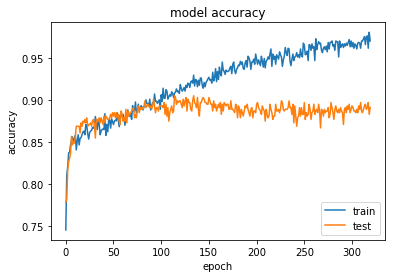

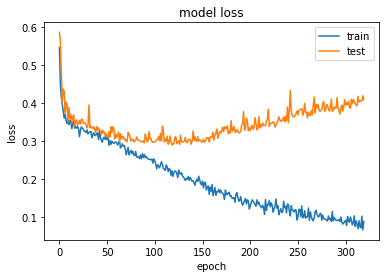

In [102]:
# list all data in history
print(history.history.keys())
# summarize history for accuracy
plt.plot(history.history['acc'])
plt.plot(history.history['val_acc'])
plt.title('model accuracy')
plt.ylabel('accuracy')
plt.xlabel('epoch')
plt.legend(['train', 'test'], loc='lower right')
plt.show()
# summarize history for loss
plt.plot(history.history['loss'])
plt.plot(history.history['val_loss'])
plt.title('model loss')
plt.ylabel('loss')
plt.xlabel('epoch')
plt.legend(['train', 'test'], loc='upper right')
plt.show()

# Model 6 for Class 6 with three dropout layers

In [106]:
# dimensions of our images.
img_width, img_height = 64, 64


epochs = 640
batch_size = 256

if K.image_data_format() == 'channels_first':
    input_shape = (3, img_width, img_height)
else:
    input_shape = (img_width, img_height, 3)


model = Sequential()
model.add(Convolution2D(kernel_size=(3,3),filters=3,input_shape=(img_width, img_height,3),activation="relu",padding="same"))
model.add(Convolution2D(kernel_size=(3,3),filters=10,activation="relu",padding="same"))
model.add(MaxPooling2D(pool_size=(2,2),strides=(2,2)))
model.add(Dropout(0.5))
model.add(Convolution2D(kernel_size=(3,3),filters=3,activation="relu",padding="same"))
model.add(Convolution2D(kernel_size=(5,5),filters=5,activation="relu",padding="same"))
model.add(MaxPooling2D(pool_size=(3,3),strides=(2,2)))
model.add(Dropout(0.5))
model.add(Convolution2D(kernel_size=(2,2),strides=(2,2),filters=10))
model.add(Flatten())
model.add(Dropout(0.5))
model.add(Dense(100,activation="sigmoid"))
model.add(Dense(1))
model.add(Activation('sigmoid'))


model.compile(loss='binary_crossentropy',
              optimizer=keras.optimizers.RMSprop(lr=0.001, rho=0.9, epsilon=None, decay=0.0),
              metrics=['accuracy'])

model.summary()

checkpoint = ModelCheckpoint('{val_acc:.4f}.hdf5', monitor='val_acc', verbose=1, save_best_only=True, mode='auto')


history = model.fit(x_train, y_train, batch_size=batch_size, epochs=epochs, validation_split=0.3, callbacks=[checkpoint])

_________________________________________________________________
Layer (type)                 Output Shape              Param #   
conv2d_196 (Conv2D)          (None, 64, 64, 3)         84        
_________________________________________________________________
conv2d_197 (Conv2D)          (None, 64, 64, 10)        280       
_________________________________________________________________
max_pooling2d_87 (MaxPooling (None, 32, 32, 10)        0         
_________________________________________________________________
dropout_71 (Dropout)         (None, 32, 32, 10)        0         
_________________________________________________________________
conv2d_198 (Conv2D)          (None, 32, 32, 3)         273       
_________________________________________________________________
conv2d_199 (Conv2D)          (None, 32, 32, 5)         380       
_________________________________________________________________
max_pooling2d_88 (MaxPooling (None, 15, 15, 5)         0         
__________

1024/1157 [=========================>....] - ETA: 0s - loss: 0.4332 - acc: 0.8066
Epoch 00055: val_acc did not improve
1157/1157 [==============================] - 1s 454us/step - loss: 0.4431 - acc: 0.8003 - val_loss: 0.4468 - val_acc: 0.7807
Epoch 56/640
1024/1157 [=========================>....] - ETA: 0s - loss: 0.4348 - acc: 0.8027
Epoch 00056: val_acc did not improve
1157/1157 [==============================] - 1s 452us/step - loss: 0.4402 - acc: 0.8003 - val_loss: 0.4388 - val_acc: 0.7907
Epoch 57/640
1024/1157 [=========================>....] - ETA: 0s - loss: 0.4363 - acc: 0.7959
Epoch 00057: val_acc did not improve
1157/1157 [==============================] - 1s 454us/step - loss: 0.4345 - acc: 0.7969 - val_loss: 0.4317 - val_acc: 0.7847
Epoch 58/640
1024/1157 [=========================>....] - ETA: 0s - loss: 0.4444 - acc: 0.8037
Epoch 00058: val_acc improved from 0.79477 to 0.79477, saving model to 0.7948.hdf5
1157/1157 [==============================] - 1s 470us/step - los

Epoch 87/640
1024/1157 [=========================>....] - ETA: 0s - loss: 0.4132 - acc: 0.8018
Epoch 00087: val_acc did not improve
1157/1157 [==============================] - 1s 455us/step - loss: 0.4160 - acc: 0.8038 - val_loss: 0.4296 - val_acc: 0.7907
Epoch 88/640
1024/1157 [=========================>....] - ETA: 0s - loss: 0.3918 - acc: 0.8164
Epoch 00088: val_acc did not improve
1157/1157 [==============================] - 0s 428us/step - loss: 0.3896 - acc: 0.8185 - val_loss: 0.5112 - val_acc: 0.7646
Epoch 89/640
1024/1157 [=========================>....] - ETA: 0s - loss: 0.3955 - acc: 0.8184
Epoch 00089: val_acc did not improve
1157/1157 [==============================] - 1s 433us/step - loss: 0.3932 - acc: 0.8176 - val_loss: 0.4223 - val_acc: 0.8008
Epoch 90/640
1024/1157 [=========================>....] - ETA: 0s - loss: 0.3911 - acc: 0.8164
Epoch 00090: val_acc did not improve
1157/1157 [==============================] - 1s 434us/step - loss: 0.3931 - acc: 0.8159 - val_los

1157/1157 [==============================] - 1s 436us/step - loss: 0.3490 - acc: 0.8496 - val_loss: 0.3742 - val_acc: 0.8471
Epoch 118/640
1024/1157 [=========================>....] - ETA: 0s - loss: 0.3418 - acc: 0.8525
Epoch 00118: val_acc did not improve
1157/1157 [==============================] - 1s 446us/step - loss: 0.3385 - acc: 0.8522 - val_loss: 0.3386 - val_acc: 0.8431
Epoch 119/640
1024/1157 [=========================>....] - ETA: 0s - loss: 0.3461 - acc: 0.8418
Epoch 00119: val_acc did not improve
1157/1157 [==============================] - 0s 425us/step - loss: 0.3448 - acc: 0.8436 - val_loss: 0.3404 - val_acc: 0.8431
Epoch 120/640
1024/1157 [=========================>....] - ETA: 0s - loss: 0.3404 - acc: 0.8555
Epoch 00120: val_acc improved from 0.84708 to 0.85111, saving model to 0.8511.hdf5
1157/1157 [==============================] - 1s 461us/step - loss: 0.3394 - acc: 0.8539 - val_loss: 0.3667 - val_acc: 0.8511
Epoch 121/640
1024/1157 [=========================>....

Epoch 149/640
1024/1157 [=========================>....] - ETA: 0s - loss: 0.2939 - acc: 0.8809
Epoch 00149: val_acc did not improve
1157/1157 [==============================] - 0s 409us/step - loss: 0.2996 - acc: 0.8781 - val_loss: 0.3134 - val_acc: 0.8692
Epoch 150/640
1024/1157 [=========================>....] - ETA: 0s - loss: 0.2888 - acc: 0.8916
Epoch 00150: val_acc did not improve
1157/1157 [==============================] - 0s 414us/step - loss: 0.2997 - acc: 0.8868 - val_loss: 0.3279 - val_acc: 0.8652
Epoch 151/640
1024/1157 [=========================>....] - ETA: 0s - loss: 0.3074 - acc: 0.8711
Epoch 00151: val_acc did not improve
1157/1157 [==============================] - 0s 415us/step - loss: 0.3014 - acc: 0.8738 - val_loss: 0.2990 - val_acc: 0.8672
Epoch 152/640
1024/1157 [=========================>....] - ETA: 0s - loss: 0.2977 - acc: 0.8633
Epoch 00152: val_acc did not improve
1157/1157 [==============================] - 0s 423us/step - loss: 0.2983 - acc: 0.8634 - val

1024/1157 [=========================>....] - ETA: 0s - loss: 0.2954 - acc: 0.8750
Epoch 00180: val_acc did not improve
1157/1157 [==============================] - 0s 406us/step - loss: 0.2882 - acc: 0.8781 - val_loss: 0.2840 - val_acc: 0.8672
Epoch 181/640
1024/1157 [=========================>....] - ETA: 0s - loss: 0.2812 - acc: 0.8857
Epoch 00181: val_acc did not improve
1157/1157 [==============================] - 0s 399us/step - loss: 0.2896 - acc: 0.8825 - val_loss: 0.3025 - val_acc: 0.8873
Epoch 182/640
1024/1157 [=========================>....] - ETA: 0s - loss: 0.2717 - acc: 0.8896
Epoch 00182: val_acc did not improve
1157/1157 [==============================] - 0s 400us/step - loss: 0.2722 - acc: 0.8885 - val_loss: 0.2995 - val_acc: 0.8893
Epoch 183/640
1024/1157 [=========================>....] - ETA: 0s - loss: 0.3005 - acc: 0.8672
Epoch 00183: val_acc did not improve
1157/1157 [==============================] - 0s 409us/step - loss: 0.2885 - acc: 0.8747 - val_loss: 0.2838 

Epoch 212/640
1024/1157 [=========================>....] - ETA: 0s - loss: 0.2613 - acc: 0.8984
Epoch 00212: val_acc improved from 0.89135 to 0.89738, saving model to 0.8974.hdf5
1157/1157 [==============================] - 0s 419us/step - loss: 0.2770 - acc: 0.8920 - val_loss: 0.2974 - val_acc: 0.8974
Epoch 213/640
1024/1157 [=========================>....] - ETA: 0s - loss: 0.2704 - acc: 0.8848
Epoch 00213: val_acc did not improve
1157/1157 [==============================] - 1s 434us/step - loss: 0.2668 - acc: 0.8876 - val_loss: 0.2906 - val_acc: 0.8873
Epoch 214/640
1024/1157 [=========================>....] - ETA: 0s - loss: 0.2821 - acc: 0.8838
Epoch 00214: val_acc did not improve
1157/1157 [==============================] - 0s 400us/step - loss: 0.2790 - acc: 0.8842 - val_loss: 0.3173 - val_acc: 0.8692
Epoch 215/640
1024/1157 [=========================>....] - ETA: 0s - loss: 0.2777 - acc: 0.8838
Epoch 00215: val_acc did not improve
1157/1157 [==============================] - 0s

Epoch 244/640
1024/1157 [=========================>....] - ETA: 0s - loss: 0.2632 - acc: 0.8848
Epoch 00244: val_acc did not improve
1157/1157 [==============================] - 0s 394us/step - loss: 0.2716 - acc: 0.8833 - val_loss: 0.2825 - val_acc: 0.8873
Epoch 245/640
1024/1157 [=========================>....] - ETA: 0s - loss: 0.2685 - acc: 0.8906
Epoch 00245: val_acc did not improve
1157/1157 [==============================] - 0s 396us/step - loss: 0.2648 - acc: 0.8920 - val_loss: 0.2815 - val_acc: 0.8934
Epoch 246/640
1024/1157 [=========================>....] - ETA: 0s - loss: 0.2670 - acc: 0.8906
Epoch 00246: val_acc did not improve
1157/1157 [==============================] - 0s 394us/step - loss: 0.2646 - acc: 0.8946 - val_loss: 0.3013 - val_acc: 0.8773
Epoch 247/640
1024/1157 [=========================>....] - ETA: 0s - loss: 0.2781 - acc: 0.8955
Epoch 00247: val_acc did not improve
1157/1157 [==============================] - 0s 391us/step - loss: 0.2764 - acc: 0.8946 - val

Epoch 276/640
1024/1157 [=========================>....] - ETA: 0s - loss: 0.2473 - acc: 0.8955
Epoch 00276: val_acc did not improve
1157/1157 [==============================] - 0s 401us/step - loss: 0.2449 - acc: 0.8954 - val_loss: 0.2710 - val_acc: 0.8873
Epoch 277/640
1024/1157 [=========================>....] - ETA: 0s - loss: 0.2549 - acc: 0.8926
Epoch 00277: val_acc did not improve
1157/1157 [==============================] - 0s 400us/step - loss: 0.2567 - acc: 0.8894 - val_loss: 0.2608 - val_acc: 0.8853
Epoch 278/640
1024/1157 [=========================>....] - ETA: 0s - loss: 0.2648 - acc: 0.8945
Epoch 00278: val_acc did not improve
1157/1157 [==============================] - 0s 404us/step - loss: 0.2646 - acc: 0.8937 - val_loss: 0.2774 - val_acc: 0.8913
Epoch 279/640
1024/1157 [=========================>....] - ETA: 0s - loss: 0.2581 - acc: 0.8936
Epoch 00279: val_acc did not improve
1157/1157 [==============================] - 0s 400us/step - loss: 0.2602 - acc: 0.8946 - val

Epoch 308/640
1024/1157 [=========================>....] - ETA: 0s - loss: 0.2577 - acc: 0.8994
Epoch 00308: val_acc did not improve
1157/1157 [==============================] - 0s 400us/step - loss: 0.2637 - acc: 0.8963 - val_loss: 0.2955 - val_acc: 0.8773
Epoch 309/640
1024/1157 [=========================>....] - ETA: 0s - loss: 0.2371 - acc: 0.8975
Epoch 00309: val_acc did not improve
1157/1157 [==============================] - 0s 400us/step - loss: 0.2449 - acc: 0.8928 - val_loss: 0.2700 - val_acc: 0.8913
Epoch 310/640
1024/1157 [=========================>....] - ETA: 0s - loss: 0.2440 - acc: 0.8955
Epoch 00310: val_acc did not improve
1157/1157 [==============================] - 0s 404us/step - loss: 0.2452 - acc: 0.8946 - val_loss: 0.2622 - val_acc: 0.8934
Epoch 311/640
1024/1157 [=========================>....] - ETA: 0s - loss: 0.2353 - acc: 0.9014
Epoch 00311: val_acc did not improve
1157/1157 [==============================] - 0s 405us/step - loss: 0.2377 - acc: 0.9006 - val

Epoch 340/640
1024/1157 [=========================>....] - ETA: 0s - loss: 0.2520 - acc: 0.9033
Epoch 00340: val_acc did not improve
1157/1157 [==============================] - 0s 388us/step - loss: 0.2429 - acc: 0.9067 - val_loss: 0.2698 - val_acc: 0.8974
Epoch 341/640
1024/1157 [=========================>....] - ETA: 0s - loss: 0.2318 - acc: 0.9082
Epoch 00341: val_acc did not improve
1157/1157 [==============================] - 0s 399us/step - loss: 0.2256 - acc: 0.9127 - val_loss: 0.2737 - val_acc: 0.8913
Epoch 342/640
1024/1157 [=========================>....] - ETA: 0s - loss: 0.2228 - acc: 0.9121
Epoch 00342: val_acc did not improve
1157/1157 [==============================] - 0s 401us/step - loss: 0.2335 - acc: 0.9092 - val_loss: 0.2654 - val_acc: 0.8954
Epoch 343/640
1024/1157 [=========================>....] - ETA: 0s - loss: 0.2381 - acc: 0.8955
Epoch 00343: val_acc did not improve
1157/1157 [==============================] - 0s 379us/step - loss: 0.2451 - acc: 0.8980 - val

Epoch 372/640
1024/1157 [=========================>....] - ETA: 0s - loss: 0.2364 - acc: 0.9092
Epoch 00372: val_acc did not improve
1157/1157 [==============================] - 0s 369us/step - loss: 0.2306 - acc: 0.9101 - val_loss: 0.2998 - val_acc: 0.8793
Epoch 373/640
1024/1157 [=========================>....] - ETA: 0s - loss: 0.2275 - acc: 0.9102
Epoch 00373: val_acc did not improve
1157/1157 [==============================] - 0s 377us/step - loss: 0.2294 - acc: 0.9067 - val_loss: 0.3174 - val_acc: 0.8773
Epoch 374/640
1024/1157 [=========================>....] - ETA: 0s - loss: 0.2383 - acc: 0.9043
Epoch 00374: val_acc did not improve
1157/1157 [==============================] - 0s 391us/step - loss: 0.2410 - acc: 0.9032 - val_loss: 0.2793 - val_acc: 0.8873
Epoch 375/640
1024/1157 [=========================>....] - ETA: 0s - loss: 0.2345 - acc: 0.9014
Epoch 00375: val_acc did not improve
1157/1157 [==============================] - 0s 408us/step - loss: 0.2335 - acc: 0.9023 - val

Epoch 404/640
1024/1157 [=========================>....] - ETA: 0s - loss: 0.2166 - acc: 0.9062
Epoch 00404: val_acc did not improve
1157/1157 [==============================] - 0s 391us/step - loss: 0.2206 - acc: 0.9058 - val_loss: 0.2541 - val_acc: 0.9034
Epoch 405/640
1024/1157 [=========================>....] - ETA: 0s - loss: 0.2281 - acc: 0.9023
Epoch 00405: val_acc did not improve
1157/1157 [==============================] - 0s 389us/step - loss: 0.2258 - acc: 0.9041 - val_loss: 0.2757 - val_acc: 0.8793
Epoch 406/640
1024/1157 [=========================>....] - ETA: 0s - loss: 0.2109 - acc: 0.9160
Epoch 00406: val_acc did not improve
1157/1157 [==============================] - 0s 393us/step - loss: 0.2227 - acc: 0.9075 - val_loss: 0.2573 - val_acc: 0.8853
Epoch 407/640
1024/1157 [=========================>....] - ETA: 0s - loss: 0.2093 - acc: 0.9297
Epoch 00407: val_acc did not improve
1157/1157 [==============================] - 0s 397us/step - loss: 0.2194 - acc: 0.9248 - val

Epoch 436/640
1024/1157 [=========================>....] - ETA: 0s - loss: 0.2189 - acc: 0.9111
Epoch 00436: val_acc did not improve
1157/1157 [==============================] - 0s 397us/step - loss: 0.2263 - acc: 0.9092 - val_loss: 0.2725 - val_acc: 0.8813
Epoch 437/640
1024/1157 [=========================>....] - ETA: 0s - loss: 0.2271 - acc: 0.9102
Epoch 00437: val_acc did not improve
1157/1157 [==============================] - 0s 407us/step - loss: 0.2239 - acc: 0.9101 - val_loss: 0.2589 - val_acc: 0.8954
Epoch 438/640
1024/1157 [=========================>....] - ETA: 0s - loss: 0.2253 - acc: 0.9043
Epoch 00438: val_acc did not improve
1157/1157 [==============================] - 0s 399us/step - loss: 0.2281 - acc: 0.9058 - val_loss: 0.2652 - val_acc: 0.8853
Epoch 439/640
1024/1157 [=========================>....] - ETA: 0s - loss: 0.2237 - acc: 0.9023
Epoch 00439: val_acc did not improve
1157/1157 [==============================] - 0s 401us/step - loss: 0.2217 - acc: 0.9049 - val

Epoch 468/640
1024/1157 [=========================>....] - ETA: 0s - loss: 0.2133 - acc: 0.9141
Epoch 00468: val_acc did not improve
1157/1157 [==============================] - 0s 388us/step - loss: 0.2141 - acc: 0.9162 - val_loss: 0.2883 - val_acc: 0.8712
Epoch 469/640
1024/1157 [=========================>....] - ETA: 0s - loss: 0.2160 - acc: 0.9189
Epoch 00469: val_acc did not improve
1157/1157 [==============================] - 0s 386us/step - loss: 0.2195 - acc: 0.9162 - val_loss: 0.2726 - val_acc: 0.8773
Epoch 470/640
1024/1157 [=========================>....] - ETA: 0s - loss: 0.2117 - acc: 0.9082
Epoch 00470: val_acc did not improve
1157/1157 [==============================] - 0s 397us/step - loss: 0.2072 - acc: 0.9144 - val_loss: 0.2510 - val_acc: 0.8974
Epoch 471/640
1024/1157 [=========================>....] - ETA: 0s - loss: 0.2085 - acc: 0.9170
Epoch 00471: val_acc did not improve
1157/1157 [==============================] - 0s 391us/step - loss: 0.2027 - acc: 0.9205 - val

Epoch 500/640
1024/1157 [=========================>....] - ETA: 0s - loss: 0.2069 - acc: 0.9121
Epoch 00500: val_acc did not improve
1157/1157 [==============================] - 0s 394us/step - loss: 0.2152 - acc: 0.9092 - val_loss: 0.2528 - val_acc: 0.8934
Epoch 501/640
1024/1157 [=========================>....] - ETA: 0s - loss: 0.2153 - acc: 0.9170
Epoch 00501: val_acc did not improve
1157/1157 [==============================] - 0s 387us/step - loss: 0.2136 - acc: 0.9162 - val_loss: 0.2762 - val_acc: 0.8793
Epoch 502/640
1024/1157 [=========================>....] - ETA: 0s - loss: 0.1853 - acc: 0.9209
Epoch 00502: val_acc did not improve
1157/1157 [==============================] - 0s 393us/step - loss: 0.1953 - acc: 0.9153 - val_loss: 0.2554 - val_acc: 0.8853
Epoch 503/640
1024/1157 [=========================>....] - ETA: 0s - loss: 0.2139 - acc: 0.9150
Epoch 00503: val_acc did not improve
1157/1157 [==============================] - 0s 384us/step - loss: 0.2167 - acc: 0.9118 - val

Epoch 532/640
1024/1157 [=========================>....] - ETA: 0s - loss: 0.2115 - acc: 0.9141
Epoch 00532: val_acc did not improve
1157/1157 [==============================] - 0s 379us/step - loss: 0.2039 - acc: 0.9162 - val_loss: 0.2738 - val_acc: 0.8913
Epoch 533/640
1024/1157 [=========================>....] - ETA: 0s - loss: 0.1924 - acc: 0.9268
Epoch 00533: val_acc did not improve
1157/1157 [==============================] - 0s 380us/step - loss: 0.2007 - acc: 0.9231 - val_loss: 0.2721 - val_acc: 0.8893
Epoch 534/640
1024/1157 [=========================>....] - ETA: 0s - loss: 0.2210 - acc: 0.9229
Epoch 00534: val_acc did not improve
1157/1157 [==============================] - 0s 380us/step - loss: 0.2161 - acc: 0.9213 - val_loss: 0.2791 - val_acc: 0.8954
Epoch 535/640
1024/1157 [=========================>....] - ETA: 0s - loss: 0.2111 - acc: 0.9199
Epoch 00535: val_acc did not improve
1157/1157 [==============================] - 0s 373us/step - loss: 0.2102 - acc: 0.9222 - val

Epoch 564/640
1024/1157 [=========================>....] - ETA: 0s - loss: 0.1970 - acc: 0.9209
Epoch 00564: val_acc did not improve
1157/1157 [==============================] - 1s 458us/step - loss: 0.1918 - acc: 0.9222 - val_loss: 0.2638 - val_acc: 0.8913
Epoch 565/640
1024/1157 [=========================>....] - ETA: 0s - loss: 0.1921 - acc: 0.9219
Epoch 00565: val_acc did not improve
1157/1157 [==============================] - 1s 468us/step - loss: 0.1826 - acc: 0.9257 - val_loss: 0.2627 - val_acc: 0.8954
Epoch 566/640
1024/1157 [=========================>....] - ETA: 0s - loss: 0.1812 - acc: 0.9277
Epoch 00566: val_acc did not improve
1157/1157 [==============================] - 0s 389us/step - loss: 0.1801 - acc: 0.9265 - val_loss: 0.2655 - val_acc: 0.8853
Epoch 567/640
1024/1157 [=========================>....] - ETA: 0s - loss: 0.1991 - acc: 0.9160
Epoch 00567: val_acc did not improve
1157/1157 [==============================] - 0s 386us/step - loss: 0.1990 - acc: 0.9153 - val

Epoch 596/640
1024/1157 [=========================>....] - ETA: 0s - loss: 0.1935 - acc: 0.9199
Epoch 00596: val_acc did not improve
1157/1157 [==============================] - 1s 438us/step - loss: 0.1887 - acc: 0.9222 - val_loss: 0.2705 - val_acc: 0.8913
Epoch 597/640
1024/1157 [=========================>....] - ETA: 0s - loss: 0.1969 - acc: 0.9189
Epoch 00597: val_acc did not improve
1157/1157 [==============================] - 0s 403us/step - loss: 0.1977 - acc: 0.9196 - val_loss: 0.2649 - val_acc: 0.8934
Epoch 598/640
1024/1157 [=========================>....] - ETA: 0s - loss: 0.2120 - acc: 0.9121
Epoch 00598: val_acc did not improve
1157/1157 [==============================] - 1s 460us/step - loss: 0.2026 - acc: 0.9144 - val_loss: 0.2929 - val_acc: 0.8913
Epoch 599/640
1024/1157 [=========================>....] - ETA: 0s - loss: 0.1995 - acc: 0.9238
Epoch 00599: val_acc did not improve
1157/1157 [==============================] - 1s 482us/step - loss: 0.1987 - acc: 0.9257 - val

Epoch 628/640
1024/1157 [=========================>....] - ETA: 0s - loss: 0.1816 - acc: 0.9307
Epoch 00628: val_acc did not improve
1157/1157 [==============================] - 1s 503us/step - loss: 0.1856 - acc: 0.9274 - val_loss: 0.3201 - val_acc: 0.8793
Epoch 629/640
1024/1157 [=========================>....] - ETA: 0s - loss: 0.1866 - acc: 0.9326
Epoch 00629: val_acc did not improve
1157/1157 [==============================] - 1s 507us/step - loss: 0.1879 - acc: 0.9334 - val_loss: 0.2508 - val_acc: 0.8934
Epoch 630/640
1024/1157 [=========================>....] - ETA: 0s - loss: 0.1825 - acc: 0.9326
Epoch 00630: val_acc did not improve
1157/1157 [==============================] - 1s 524us/step - loss: 0.1734 - acc: 0.9369 - val_loss: 0.2768 - val_acc: 0.8893
Epoch 631/640
1024/1157 [=========================>....] - ETA: 0s - loss: 0.1841 - acc: 0.9258
Epoch 00631: val_acc did not improve
1157/1157 [==============================] - 1s 494us/step - loss: 0.1902 - acc: 0.9248 - val

In [107]:
[loss,acc] = model.evaluate(x_test,y_test)

710/710 [==============================] - 0s 166us/step


In [108]:
print "Accuracy : ",acc

Accuracy :  0.880281690141


['acc', 'loss', 'val_acc', 'val_loss']


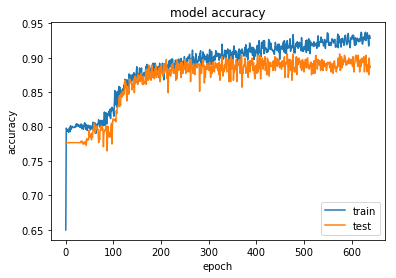

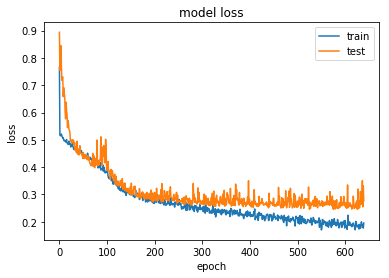

In [109]:
# list all data in history
print(history.history.keys())
# summarize history for accuracy
plt.plot(history.history['acc'])
plt.plot(history.history['val_acc'])
plt.title('model accuracy')
plt.ylabel('accuracy')
plt.xlabel('epoch')
plt.legend(['train', 'test'], loc='lower right')
plt.show()
# summarize history for loss
plt.plot(history.history['loss'])
plt.plot(history.history['val_loss'])
plt.title('model loss')
plt.ylabel('loss')
plt.xlabel('epoch')
plt.legend(['train', 'test'], loc='upper right')
plt.show()

# Model 7 for Class 7

In [111]:
data = []
labels = []

for i in range(7,8):
    img_dir = str(i)
    files = os.listdir(img_dir)
    for f1 in files:
        img = cv2.imread(img_dir+'/'+f1)
        img = cv2.resize(img,(64,64))
        data.append(img) 
        labels.append(0)
        
c = [1,2,3,4,5,6]

for i in c:
    img_dir = str(i)
    files = os.listdir(img_dir)
    for f1 in files:
        img = cv2.imread(img_dir+'/'+f1)
        img = cv2.resize(img,(64,64))
        data.append(img)   
        labels.append(1)
                                 
x_train, x_test, y_train, y_test = train_test_split(data, labels, test_size=0.3)  

x_train = np.asarray(x_train)
y_train = np.asarray(y_train)
x_test = np.asarray(x_test)
y_test = np.asarray(y_test)

In [112]:
# dimensions of our images.
img_width, img_height = 64, 64


epochs = 20
batch_size = 256

if K.image_data_format() == 'channels_first':
    input_shape = (3, img_width, img_height)
else:
    input_shape = (img_width, img_height, 3)


model = Sequential()
model.add(Convolution2D(kernel_size=(3,3),filters=3,input_shape=(img_width, img_height,3),activation="relu",padding="same"))
model.add(Convolution2D(kernel_size=(3,3),filters=10,activation="relu",padding="same"))
model.add(MaxPooling2D(pool_size=(2,2),strides=(2,2)))
model.add(Convolution2D(kernel_size=(3,3),filters=3,activation="relu",padding="same"))
model.add(Convolution2D(kernel_size=(5,5),filters=5,activation="relu",padding="same"))
model.add(MaxPooling2D(pool_size=(3,3),strides=(2,2)))
model.add(Convolution2D(kernel_size=(2,2),strides=(2,2),filters=10))
model.add(Flatten())
model.add(Dropout(0.2))
model.add(Dense(100,activation="sigmoid"))
model.add(Dense(1))
model.add(Activation('sigmoid'))


model.compile(loss='binary_crossentropy',
              optimizer=keras.optimizers.RMSprop(lr=0.01, rho=0.9, epsilon=None, decay=0.0),
              metrics=['accuracy'])

model.summary()

checkpoint = ModelCheckpoint('{val_acc:.4f}.hdf5', monitor='val_acc', verbose=1, save_best_only=True, mode='auto')


history = model.fit(x_train, y_train, batch_size=batch_size, epochs=epochs, validation_split=0.3, callbacks=[checkpoint])

_________________________________________________________________
Layer (type)                 Output Shape              Param #   
conv2d_201 (Conv2D)          (None, 64, 64, 3)         84        
_________________________________________________________________
conv2d_202 (Conv2D)          (None, 64, 64, 10)        280       
_________________________________________________________________
max_pooling2d_89 (MaxPooling (None, 32, 32, 10)        0         
_________________________________________________________________
conv2d_203 (Conv2D)          (None, 32, 32, 3)         273       
_________________________________________________________________
conv2d_204 (Conv2D)          (None, 32, 32, 5)         380       
_________________________________________________________________
max_pooling2d_90 (MaxPooling (None, 15, 15, 5)         0         
_________________________________________________________________
conv2d_205 (Conv2D)          (None, 7, 7, 10)          210       
__________

In [113]:
[loss,acc] = model.evaluate(x_test,y_test)

710/710 [==============================] - 0s 307us/step


In [114]:
print "Accuracy : ",acc

Accuracy :  0.969014084507


['acc', 'loss', 'val_acc', 'val_loss']


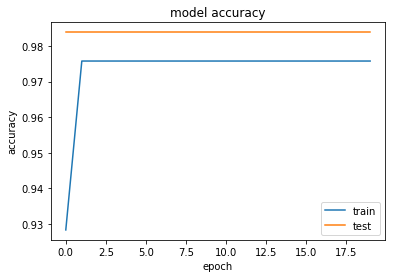

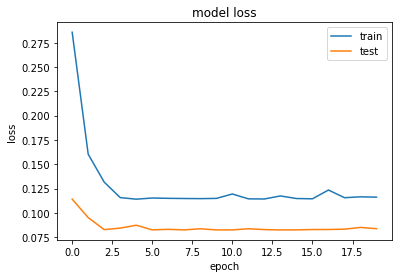

In [115]:
# list all data in history
print(history.history.keys())
# summarize history for accuracy
plt.plot(history.history['acc'])
plt.plot(history.history['val_acc'])
plt.title('model accuracy')
plt.ylabel('accuracy')
plt.xlabel('epoch')
plt.legend(['train', 'test'], loc='lower right')
plt.show()
# summarize history for loss
plt.plot(history.history['loss'])
plt.plot(history.history['val_loss'])
plt.title('model loss')
plt.ylabel('loss')
plt.xlabel('epoch')
plt.legend(['train', 'test'], loc='upper right')
plt.show()

# All the models so far are affected by the majority class and this approach doesn't serves the purpose as the individual model performances are not good enough and will make the whole system complex and degradation in performance

# Now I will balance the classes manually by providing data in a balanced manner by taking only 56 examples per class for training

In [2]:
res_data = {}
for i in range(1,8):
    img_dir = str(i)
    files = os.listdir(img_dir)
    res_data[str(i)] = []
    j = 0
    for f1 in files:
        if j<56:
            img = cv2.imread(img_dir+'/'+f1)
            img = cv2.resize(img,(64,64))
            res_data[str(i)].append(img)  
            j=j+1

In [5]:
labels = {}
for i in range(1,8):
    img_dir = str(i)
    files = os.listdir(img_dir)
    labels[str(i)] = []
    j = 0
    for f1 in files:
        if j<56:
            labels[str(i)].append(i-1)
            j=j+1

In [7]:
col_data = []
for i in range(1,8):
    files = res_data[str(i)]
    for f1 in files:
        col_data.append(f1)
        
col_labels = []
for i in range(1,8):
    files = labels[str(i)]
    for f1 in files:
        col_labels.append(f1)        

In [8]:
d1 = res_data[str(1)]
d2 = res_data[str(2)]
d3 = res_data[str(3)]
d4 = res_data[str(4)]
d5 = res_data[str(5)]
d6 = res_data[str(6)]
d7 = res_data[str(7)]

l1 = labels[str(1)]
l2 = labels[str(2)]
l3 = labels[str(3)]
l4 = labels[str(4)]
l5 = labels[str(5)]
l6 = labels[str(6)]
l7 = labels[str(7)]

d1_train, d1_test, l1_train, l1_test = train_test_split(d1, l1, test_size=0.3)
d2_train, d2_test, l2_train, l2_test = train_test_split(d2, l2, test_size=0.3)
d3_train, d3_test, l3_train, l3_test = train_test_split(d3, l3, test_size=0.3)
d4_train, d4_test, l4_train, l4_test = train_test_split(d4, l4, test_size=0.3)
d5_train, d5_test, l5_train, l5_test = train_test_split(d5, l5, test_size=0.3)
d6_train, d6_test, l6_train, l6_test = train_test_split(d6, l6, test_size=0.3)
d7_train, d7_test, l7_train, l7_test = train_test_split(d7, l7, test_size=0.3)    

In [9]:
x_train = []

x_train.append(d1_train)
x_train.append(d2_train)
x_train.append(d3_train)
x_train.append(d4_train)
x_train.append(d5_train)
x_train.append(d6_train)
x_train.append(d7_train)

y_train = []

y_train.append(l1_train)
y_train.append(l2_train)
y_train.append(l3_train)
y_train.append(l4_train)
y_train.append(l5_train)
y_train.append(l6_train)
y_train.append(l7_train)

x_test = []

x_test.append(d1_test)
x_test.append(d2_test)
x_test.append(d3_test)
x_test.append(d4_test)
x_test.append(d5_test)
x_test.append(d6_test)
x_test.append(d7_test)

y_test = []

y_test.append(l1_test)
y_test.append(l2_test)
y_test.append(l3_test)
y_test.append(l4_test)
y_test.append(l5_test)
y_test.append(l6_test)
y_test.append(l7_test)

In [10]:
X_train = []

for i in range(np.shape(x_train)[0]):
    
    for j in range(np.shape(x_train[i])[0]):
        
        X_train.append(x_train[i][j])
        
Y_train = []

for i in range(np.shape(y_train)[0]):
    
    for j in range(np.shape(y_train[i])[0]):
        
        Y_train.append(y_train[i][j]) 
        
X_test = []

for i in range(np.shape(x_test)[0]):
    
    for j in range(np.shape(x_test[i])[0]):
        
        X_test.append(x_test[i][j])
        
Y_test = []

for i in range(np.shape(y_test)[0]):
    
    for j in range(np.shape(y_test[i])[0]):
        
        Y_test.append(y_test[i][j])                

In [11]:
print "Train data dimensions : ", np.shape(X_train),",","Train label dimensions : ",np.shape(Y_train)
print "Test data dimensions : ",np.shape(X_test),",","Test label dimensions : ",np.shape(Y_test)

Train data dimensions :  (273, 64, 64, 3) , Train label dimensions :  (273,)
Test data dimensions :  (119, 64, 64, 3) , Test label dimensions :  (119,)


In [12]:
class_weights = class_weight.compute_class_weight('balanced',np.unique(Y_train),Y_train)

for i in range(len(class_weights)):
    print "C"+str(i+1)+" : ",class_weights[i]

C1 :  1.0
C2 :  1.0
C3 :  1.0
C4 :  1.0
C5 :  1.0
C6 :  1.0
C7 :  1.0


In [13]:
X_train = np.asarray(X_train)
X_test = np.asarray(X_test)
Y_train = np.asarray(Y_train)
Y_test = np.asarray(Y_test)
Y_train = np_utils.to_categorical(Y_train, 7)
Y_test = np_utils.to_categorical(Y_test, 7)
np.save('X_train.npy', X_train)
np.save('X_test.npy', X_test)
np.save('Y_train.npy', Y_train)
np.save('Y_test.npy', Y_test)

In [5]:
X_train = np.load('X_train.npy')
X_test = np.load('X_test.npy')
Y_train = np.load('Y_train.npy')
Y_test = np.load('Y_test.npy')

In [35]:
# dimensions of our images.
img_width, img_height = 64, 64


epochs = 20
batch_size = 256

if K.image_data_format() == 'channels_first':
    input_shape = (3, img_width, img_height)
else:
    input_shape = (img_width, img_height, 3)


model = Sequential()
model.add(Convolution2D(kernel_size=(3,3),filters=3,input_shape=(img_width, img_height,3),activation="relu",padding="same"))
model.add(Convolution2D(kernel_size=(3,3),filters=10,activation="relu",padding="same"))
model.add(Flatten())
model.add(Dropout(0.5))
model.add(Dense(100,activation="softmax"))
model.add(Dense(7))
model.add(Activation('softmax'))


model.compile(loss='categorical_crossentropy',
              optimizer=keras.optimizers.RMSprop(lr=0.1, rho=0.9, epsilon=None, decay=0.0),
              metrics=['accuracy'])

model.summary()

#checkpoint = ModelCheckpoint('{val_acc:.4f}.hdf5', monitor='val_acc', verbose=1, save_best_only=True, mode='auto')


history = model.fit(X_train, Y_train, batch_size=batch_size, epochs=epochs, validation_split=0.3)

_________________________________________________________________
Layer (type)                 Output Shape              Param #   
conv2d_67 (Conv2D)           (None, 64, 64, 3)         84        
_________________________________________________________________
conv2d_68 (Conv2D)           (None, 64, 64, 10)        280       
_________________________________________________________________
flatten_19 (Flatten)         (None, 40960)             0         
_________________________________________________________________
dropout_43 (Dropout)         (None, 40960)             0         
_________________________________________________________________
dense_47 (Dense)             (None, 100)               4096100   
_________________________________________________________________
dense_48 (Dense)             (None, 7)                 707       
_________________________________________________________________
activation_31 (Activation)   (None, 7)                 0         
Total para

In [36]:
[loss,acc] = model.evaluate(X_test,Y_test)
print "Accuracy : ",acc

119/119 [==============================] - 0s 267us/step
Accuracy :  0.142857142857


['acc', 'loss', 'val_acc', 'val_loss']


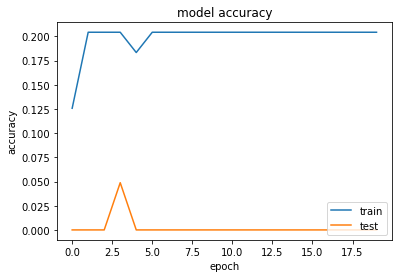

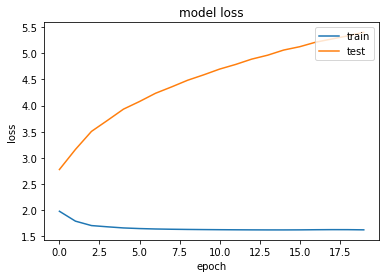

In [37]:
# list all data in history
print(history.history.keys())
# summarize history for accuracy
plt.plot(history.history['acc'])
plt.plot(history.history['val_acc'])
plt.title('model accuracy')
plt.ylabel('accuracy')
plt.xlabel('epoch')
plt.legend(['train', 'test'], loc='lower right')
plt.show()
# summarize history for loss
plt.plot(history.history['loss'])
plt.plot(history.history['val_loss'])
plt.title('model loss')
plt.ylabel('loss')
plt.xlabel('epoch')
plt.legend(['train', 'test'], loc='upper right')
plt.show()

# It's overfitting even on a simple model, Now using generated data

In [3]:
# dimensions of our images.
img_width, img_height = 64, 64

train_data_dir = './training/'
validation_data_dir = './validation'
nb_train_samples = 273
nb_validation_samples = 42
epochs = 40
batch_size = 32

if K.image_data_format() == 'channels_first':
    input_shape = (3, img_width, img_height)
else:
    input_shape = (img_width, img_height, 3)


model = Sequential()
model.add(Convolution2D(64, 3, padding='same', activation='relu',  input_shape=(64,64,3)))

model.add(Dropout(0.5))

model.add(Flatten())
model.add(Dense(256))
model.add(Activation('relu'))
model.add(Dropout(0.5))
model.add(Dense(7))
model.add(Activation('softmax'))

model.compile(loss='categorical_crossentropy',
              optimizer='rmsprop',
              metrics=['accuracy'])

#checkpoint = ModelCheckpoint('{val_acc:.4f}.hdf5', monitor='val_acc', verbose=1, save_best_only=True, mode='auto')

# this is the augmentation configuration we will use for training
train_datagen = ImageDataGenerator(
    rescale=1. / 255,
    shear_range=0.2,
    zoom_range=0.2,
    horizontal_flip=True)

# this is the augmentation configuration we will use for testing:
# only rescaling
test_datagen = ImageDataGenerator(rescale=1. / 255)

train_generator = train_datagen.flow_from_directory(
    train_data_dir,
    target_size=(img_width, img_height),
    batch_size=batch_size,
    class_mode='categorical')

validation_generator = test_datagen.flow_from_directory(
    validation_data_dir,
    target_size=(img_width, img_height),
    batch_size=batch_size,
    class_mode='categorical')

history = model.fit_generator(
    train_generator,
    steps_per_epoch=nb_train_samples // batch_size,
    epochs=epochs,
    validation_data=validation_generator,
    validation_steps=nb_validation_samples // batch_size)


Found 273 images belonging to 7 classes.
Found 42 images belonging to 7 classes.
Epoch 1/40
8/8 [==============================] - 3s 399ms/step - loss: 12.2696 - acc: 0.1421 - val_loss: 13.5996 - val_acc: 0.1562
Epoch 2/40
8/8 [==============================] - 2s 300ms/step - loss: 13.8498 - acc: 0.1407 - val_loss: 14.5063 - val_acc: 0.1000
Epoch 3/40
8/8 [==============================] - 3s 336ms/step - loss: 13.9766 - acc: 0.1329 - val_loss: 13.5996 - val_acc: 0.1562
Epoch 4/40
8/8 [==============================] - 3s 391ms/step - loss: 13.7256 - acc: 0.1484 - val_loss: 14.5063 - val_acc: 0.1000
Epoch 5/40
8/8 [==============================] - 3s 335ms/step - loss: 13.4341 - acc: 0.1665 - val_loss: 14.1033 - val_acc: 0.1250
Epoch 6/40
8/8 [==============================] - 3s 338ms/step - loss: 13.9766 - acc: 0.1329 - val_loss: 12.8945 - val_acc: 0.2000
Epoch 7/40
8/8 [==============================] - 3s 365ms/step - loss: 13.9661 - acc: 0.1083 - val_loss: 13.3087 - val_acc: 0.

In [4]:
[loss,acc] = model.evaluate(X_test,Y_test)
print "Accuracy : ",acc

119/119 [==============================] - 0s 1ms/step
Accuracy :  0.235294112638


['acc', 'loss', 'val_acc', 'val_loss']


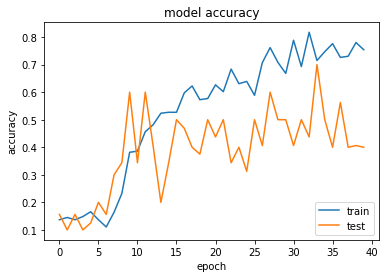

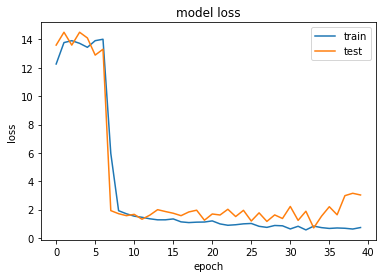

In [5]:
# list all data in history
print(history.history.keys())
# summarize history for accuracy
plt.plot(history.history['acc'])
plt.plot(history.history['val_acc'])
plt.title('model accuracy')
plt.ylabel('accuracy')
plt.xlabel('epoch')
plt.legend(['train', 'test'], loc='lower right')
plt.show()
# summarize history for loss
plt.plot(history.history['loss'])
plt.plot(history.history['val_loss'])
plt.title('model loss')
plt.ylabel('loss')
plt.xlabel('epoch')
plt.legend(['train', 'test'], loc='upper right')
plt.show()

# Increasing validation and decreasing training data size to control fluctuations

In [2]:
# dimensions of our images.
img_width, img_height = 64, 64

train_data_dir = './training/'
validation_data_dir = './validation'
nb_train_samples = 238
nb_validation_samples = 77
epochs = 80
batch_size = 64

if K.image_data_format() == 'channels_first':
    input_shape = (3, img_width, img_height)
else:
    input_shape = (img_width, img_height, 3)


model = Sequential()
model.add(Convolution2D(64, 3, padding='same', activation='relu',  input_shape=(64,64,3)))
model.add(Convolution2D(64, 3, padding='same', activation='relu',  input_shape=(64,64,3)))
model.add(Flatten())
model.add(Dense(256))
model.add(Activation('relu'))
model.add(Dropout(0.5))
model.add(Dense(7))
model.add(Activation('softmax'))

model.compile(loss='categorical_crossentropy',
              optimizer='rmsprop',
              metrics=['accuracy'])

checkpoint = ModelCheckpoint('{val_acc:.4f}.hdf5', monitor='val_acc', verbose=1, save_best_only=True, mode='auto')

# this is the augmentation configuration we will use for training
train_datagen = ImageDataGenerator(
    rescale=1. / 255,
    shear_range=0.2,
    zoom_range=0.2,
    horizontal_flip=True)

# this is the augmentation configuration we will use for testing:
# only rescaling
test_datagen = ImageDataGenerator(rescale=1. / 255)

train_generator = train_datagen.flow_from_directory(
    train_data_dir,
    target_size=(img_width, img_height),
    batch_size=batch_size,
    class_mode='categorical')

validation_generator = test_datagen.flow_from_directory(
    validation_data_dir,
    target_size=(img_width, img_height),
    batch_size=batch_size,
    class_mode='categorical')

history = model.fit_generator(
    train_generator,
    steps_per_epoch=nb_train_samples // batch_size,
    epochs=epochs,callbacks=[checkpoint],
    validation_data=validation_generator,
    validation_steps=nb_validation_samples // batch_size)


Found 238 images belonging to 7 classes.
Found 77 images belonging to 7 classes.
Epoch 1/80
2/3 [===================>..........] - ETA: 1s - loss: 8.3929 - acc: 0.1094
Epoch 00001: val_acc improved from -inf to 0.12500, saving model to 0.1250.hdf5
3/3 [==============================] - 4s 1s/step - loss: 9.9487 - acc: 0.1298 - val_loss: 14.1033 - val_acc: 0.1250
Epoch 2/80
2/3 [===================>..........] - ETA: 0s - loss: 14.1033 - acc: 0.1250
Epoch 00002: val_acc improved from 0.12500 to 0.23077, saving model to 0.2308.hdf5
3/3 [==============================] - 2s 782ms/step - loss: 14.1033 - acc: 0.1250 - val_loss: 12.3985 - val_acc: 0.2308
Epoch 3/80
2/3 [===================>..........] - ETA: 0s - loss: 13.6325 - acc: 0.1542
Epoch 00003: val_acc did not improve
3/3 [==============================] - 2s 542ms/step - loss: 13.6190 - acc: 0.1550 - val_loss: 13.3478 - val_acc: 0.1719
Epoch 4/80
2/3 [===================>..........] - ETA: 0s - loss: 12.7450 - acc: 0.2055
Epoch 000

Epoch 33/80
2/3 [===================>..........] - ETA: 0s - loss: 1.1306 - acc: 0.5625
Epoch 00033: val_acc did not improve
3/3 [==============================] - 2s 721ms/step - loss: 1.1113 - acc: 0.5729 - val_loss: 2.5200 - val_acc: 0.3281
Epoch 34/80
2/3 [===================>..........] - ETA: 0s - loss: 1.3798 - acc: 0.5438
Epoch 00034: val_acc did not improve
3/3 [==============================] - 2s 718ms/step - loss: 1.2810 - acc: 0.5572 - val_loss: 1.8080 - val_acc: 0.3846
Epoch 35/80
2/3 [===================>..........] - ETA: 0s - loss: 1.1433 - acc: 0.5574
Epoch 00035: val_acc did not improve
3/3 [==============================] - 2s 731ms/step - loss: 1.0949 - acc: 0.6071 - val_loss: 1.9181 - val_acc: 0.4062
Epoch 36/80
2/3 [===================>..........] - ETA: 0s - loss: 0.8946 - acc: 0.6719
Epoch 00036: val_acc did not improve
3/3 [==============================] - 2s 687ms/step - loss: 0.9781 - acc: 0.6406 - val_loss: 1.1835 - val_acc: 0.4615
Epoch 37/80
2/3 [=======

In [7]:
model.load_weights('0.6154.hdf5')
[loss,acc] = model.evaluate(X_test,Y_test)
print "Accuracy : ",acc

119/119 [==============================] - 0s 2ms/step
Accuracy :  0.218487392454


['acc', 'loss', 'val_acc', 'val_loss']


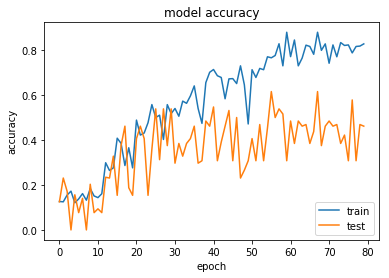

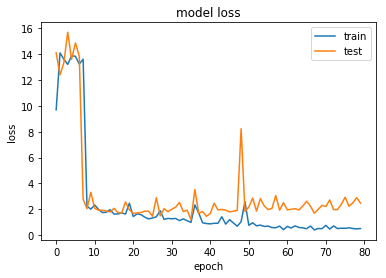

In [6]:
# list all data in history
print(history.history.keys())
# summarize history for accuracy
plt.plot(history.history['acc'])
plt.plot(history.history['val_acc'])
plt.title('model accuracy')
plt.ylabel('accuracy')
plt.xlabel('epoch')
plt.legend(['train', 'test'], loc='lower right')
plt.show()
# summarize history for loss
plt.plot(history.history['loss'])
plt.plot(history.history['val_loss'])
plt.title('model loss')
plt.ylabel('loss')
plt.xlabel('epoch')
plt.legend(['train', 'test'], loc='upper right')
plt.show()

# Still test accuracy is very low, using single convolution layer model with better training accuracy for 80 epochs and 60, 20 split

In [8]:
# dimensions of our images.
img_width, img_height = 64, 64

train_data_dir = './training/'
validation_data_dir = './validation'
nb_train_samples = 238
nb_validation_samples = 77
epochs = 80
batch_size = 64

if K.image_data_format() == 'channels_first':
    input_shape = (3, img_width, img_height)
else:
    input_shape = (img_width, img_height, 3)


model = Sequential()
model.add(Convolution2D(64, 3, padding='same', activation='relu',  input_shape=(64,64,3)))

model.add(Dropout(0.5))

model.add(Flatten())
model.add(Dense(256))
model.add(Activation('relu'))
model.add(Dropout(0.5))
model.add(Dense(7))
model.add(Activation('softmax'))

model.compile(loss='categorical_crossentropy',
              optimizer='rmsprop',
              metrics=['accuracy'])

checkpoint = ModelCheckpoint('{val_acc:.4f}.hdf5', monitor='val_acc', verbose=1, save_best_only=True, mode='auto')

# this is the augmentation configuration we will use for training
train_datagen = ImageDataGenerator(
    rescale=1. / 255,
    shear_range=0.2,
    zoom_range=0.2,
    horizontal_flip=True)

# this is the augmentation configuration we will use for testing:
# only rescaling
test_datagen = ImageDataGenerator(rescale=1. / 255)

train_generator = train_datagen.flow_from_directory(
    train_data_dir,
    target_size=(img_width, img_height),
    batch_size=batch_size,
    class_mode='categorical')

validation_generator = test_datagen.flow_from_directory(
    validation_data_dir,
    target_size=(img_width, img_height),
    batch_size=batch_size,
    class_mode='categorical')

history = model.fit_generator(
    train_generator, callbacks=[checkpoint],
    steps_per_epoch=nb_train_samples // batch_size,
    epochs=epochs,
    validation_data=validation_generator,
    validation_steps=nb_validation_samples // batch_size)


Found 238 images belonging to 7 classes.
Found 77 images belonging to 7 classes.
Epoch 1/80
2/3 [===================>..........] - ETA: 1s - loss: 7.8804 - acc: 0.1406
Epoch 00001: val_acc improved from -inf to 0.25000, saving model to 0.2500.hdf5
3/3 [==============================] - 3s 1s/step - loss: 9.6624 - acc: 0.1510 - val_loss: 11.3888 - val_acc: 0.2500
Epoch 2/80
2/3 [===================>..........] - ETA: 0s - loss: 12.0885 - acc: 0.1651
Epoch 00002: val_acc did not improve
3/3 [==============================] - 2s 623ms/step - loss: 12.2223 - acc: 0.1618 - val_loss: 7.4833 - val_acc: 0.1538
Epoch 3/80
2/3 [===================>..........] - ETA: 0s - loss: 6.7342 - acc: 0.1573
Epoch 00003: val_acc did not improve
3/3 [==============================] - 2s 797ms/step - loss: 5.2618 - acc: 0.1565 - val_loss: 1.8204 - val_acc: 0.2344
Epoch 4/80
2/3 [===================>..........] - ETA: 0s - loss: 1.8383 - acc: 0.2578
Epoch 00004: val_acc improved from 0.25000 to 0.30769, savin

3/3 [==============================] - 2s 803ms/step - loss: 0.6806 - acc: 0.7519 - val_loss: 0.7530 - val_acc: 0.8462
Epoch 33/80
2/3 [===================>..........] - ETA: 0s - loss: 0.6839 - acc: 0.7734
Epoch 00033: val_acc did not improve
3/3 [==============================] - 2s 660ms/step - loss: 0.6407 - acc: 0.7970 - val_loss: 2.1164 - val_acc: 0.4219
Epoch 34/80
2/3 [===================>..........] - ETA: 0s - loss: 0.6634 - acc: 0.7422
Epoch 00034: val_acc did not improve
3/3 [==============================] - 2s 663ms/step - loss: 0.6775 - acc: 0.7137 - val_loss: 1.4324 - val_acc: 0.5385
Epoch 35/80
2/3 [===================>..........] - ETA: 0s - loss: 0.7583 - acc: 0.7578
Epoch 00035: val_acc did not improve
3/3 [==============================] - 2s 711ms/step - loss: 0.6867 - acc: 0.7863 - val_loss: 1.8739 - val_acc: 0.4531
Epoch 36/80
2/3 [===================>..........] - ETA: 0s - loss: 0.4892 - acc: 0.8438
Epoch 00036: val_acc did not improve
3/3 [===================

In [12]:
model.load_weights('0.8462.hdf5')
[loss,acc] = model.evaluate(X_test,Y_test)
print "Accuracy : ",acc

119/119 [==============================] - 0s 1ms/step
Accuracy :  0.176470588861


['acc', 'loss', 'val_acc', 'val_loss']


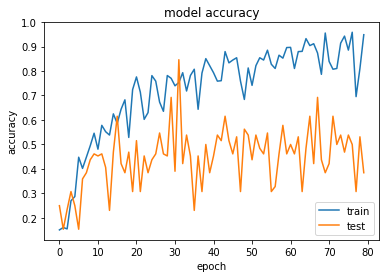

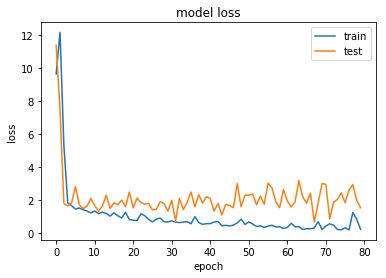

In [13]:
# list all data in history
print(history.history.keys())
# summarize history for accuracy
plt.plot(history.history['acc'])
plt.plot(history.history['val_acc'])
plt.title('model accuracy')
plt.ylabel('accuracy')
plt.xlabel('epoch')
plt.legend(['train', 'test'], loc='lower right')
plt.show()
# summarize history for loss
plt.plot(history.history['loss'])
plt.plot(history.history['val_loss'])
plt.title('model loss')
plt.ylabel('loss')
plt.xlabel('epoch')
plt.legend(['train', 'test'], loc='upper right')
plt.show()

# Increasing number of epochs to 100

In [2]:
# dimensions of our images.
img_width, img_height = 64, 64

train_data_dir = './training/'
validation_data_dir = './validation'
nb_train_samples = 238
nb_validation_samples = 77
epochs = 100
batch_size = 64

if K.image_data_format() == 'channels_first':
    input_shape = (3, img_width, img_height)
else:
    input_shape = (img_width, img_height, 3)


model = Sequential()
model.add(Convolution2D(64, 3, padding='same', activation='relu',  input_shape=(64,64,3)))

model.add(Dropout(0.5))

model.add(Flatten())
model.add(Dense(256))
model.add(Activation('relu'))
model.add(Dropout(0.5))
model.add(Dense(7))
model.add(Activation('softmax'))

model.compile(loss='categorical_crossentropy',
              optimizer='rmsprop',
              metrics=['accuracy'])

#checkpoint = ModelCheckpoint('{val_acc:.4f}.hdf5', monitor='val_acc', verbose=1, save_best_only=True, mode='auto')

# this is the augmentation configuration we will use for training
train_datagen = ImageDataGenerator(
    rescale=1. / 255,
    shear_range=0.2,
    zoom_range=0.2,
    horizontal_flip=True)

# this is the augmentation configuration we will use for testing:
# only rescaling
test_datagen = ImageDataGenerator(rescale=1. / 255)

train_generator = train_datagen.flow_from_directory(
    train_data_dir,
    target_size=(img_width, img_height),
    batch_size=batch_size,
    class_mode='categorical')

validation_generator = test_datagen.flow_from_directory(
    validation_data_dir,
    target_size=(img_width, img_height),
    batch_size=batch_size,
    class_mode='categorical')

checkpoint = ModelCheckpoint('{val_acc:.4f}.hdf5', monitor='val_acc', verbose=1, save_best_only=True, mode='auto')

history = model.fit_generator(
    train_generator, callbacks=[checkpoint],
    steps_per_epoch=nb_train_samples // batch_size,
    epochs=epochs,
    validation_data=validation_generator,
    validation_steps=nb_validation_samples // batch_size)


Found 238 images belonging to 7 classes.
Found 77 images belonging to 7 classes.
Epoch 1/100
2/3 [===================>..........] - ETA: 1s - loss: 7.7603 - acc: 0.1151
Epoch 00001: val_acc improved from -inf to 0.12500, saving model to 0.1250.hdf5
3/3 [==============================] - 3s 957ms/step - loss: 9.9524 - acc: 0.1069 - val_loss: 14.1033 - val_acc: 0.1250
Epoch 2/100
2/3 [===================>..........] - ETA: 0s - loss: 12.8190 - acc: 0.1484
Epoch 00002: val_acc improved from 0.12500 to 0.23077, saving model to 0.2308.hdf5
3/3 [==============================] - 3s 851ms/step - loss: 12.9253 - acc: 0.1458 - val_loss: 12.2113 - val_acc: 0.2308
Epoch 3/100
2/3 [===================>..........] - ETA: 0s - loss: 13.7043 - acc: 0.1308
Epoch 00003: val_acc did not improve
3/3 [==============================] - 2s 620ms/step - loss: 12.7955 - acc: 0.1496 - val_loss: 2.6532 - val_acc: 0.1250
Epoch 4/100
2/3 [===================>..........] - ETA: 0s - loss: 2.4757 - acc: 0.1875
Epoc

2/3 [===================>..........] - ETA: 0s - loss: 0.8631 - acc: 0.7109
Epoch 00033: val_acc did not improve
3/3 [==============================] - 2s 623ms/step - loss: 0.8139 - acc: 0.7336 - val_loss: 1.6899 - val_acc: 0.5000
Epoch 34/100
2/3 [===================>..........] - ETA: 0s - loss: 0.7474 - acc: 0.7422
Epoch 00034: val_acc did not improve
3/3 [==============================] - 2s 651ms/step - loss: 0.7486 - acc: 0.7240 - val_loss: 1.7085 - val_acc: 0.3077
Epoch 35/100
2/3 [===================>..........] - ETA: 0s - loss: 0.7562 - acc: 0.7537
Epoch 00035: val_acc did not improve
3/3 [==============================] - 2s 813ms/step - loss: 0.7636 - acc: 0.7298 - val_loss: 1.5564 - val_acc: 0.5000
Epoch 36/100
2/3 [===================>..........] - ETA: 0s - loss: 0.6828 - acc: 0.8006
Epoch 00036: val_acc did not improve
3/3 [==============================] - 2s 576ms/step - loss: 0.7498 - acc: 0.7618 - val_loss: 2.5831 - val_acc: 0.2308
Epoch 37/100
2/3 [===============

2/3 [===================>..........] - ETA: 0s - loss: 0.2632 - acc: 0.9188
Epoch 00099: val_acc did not improve
3/3 [==============================] - 2s 613ms/step - loss: 0.2483 - acc: 0.9293 - val_loss: 1.9432 - val_acc: 0.5625
Epoch 100/100
2/3 [===================>..........] - ETA: 0s - loss: 0.2161 - acc: 0.9297
Epoch 00100: val_acc did not improve
3/3 [==============================] - 2s 725ms/step - loss: 0.2162 - acc: 0.9323 - val_loss: 4.2290 - val_acc: 0.3846


In [8]:
model.load_weights('0.7692.hdf5')
[loss,acc] = model.evaluate(X_test,Y_test)
print "Accuracy : ",acc

119/119 [==============================] - 0s 1ms/step
Accuracy :  0.243697476487


['acc', 'loss', 'val_acc', 'val_loss']


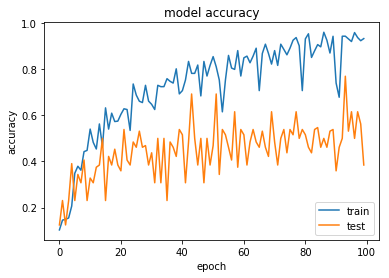

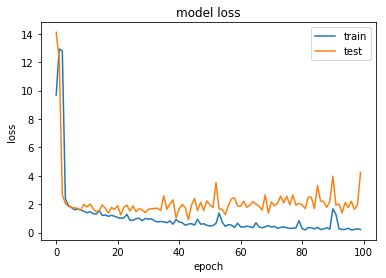

In [9]:
# list all data in history
print(history.history.keys())
# summarize history for accuracy
plt.plot(history.history['acc'])
plt.plot(history.history['val_acc'])
plt.title('model accuracy')
plt.ylabel('accuracy')
plt.xlabel('epoch')
plt.legend(['train', 'test'], loc='lower right')
plt.show()
# summarize history for loss
plt.plot(history.history['loss'])
plt.plot(history.history['val_loss'])
plt.title('model loss')
plt.ylabel('loss')
plt.xlabel('epoch')
plt.legend(['train', 'test'], loc='upper right')
plt.show()

# Increasing epochs to 200

In [11]:
model.load_weights('0.7692.hdf5')
history = model.fit_generator(
    train_generator, callbacks=[checkpoint],
    steps_per_epoch=nb_train_samples // batch_size,
    epochs= 95,
    validation_data=validation_generator,
    validation_steps=nb_validation_samples // batch_size)

Epoch 1/95
2/3 [===================>..........] - ETA: 0s - loss: 0.1758 - acc: 0.9361
Epoch 00001: val_acc did not improve
3/3 [==============================] - 2s 781ms/step - loss: 0.1860 - acc: 0.9260 - val_loss: 1.7817 - val_acc: 0.5312
Epoch 2/95
2/3 [===================>..........] - ETA: 0s - loss: 0.3030 - acc: 0.8662
Epoch 00002: val_acc did not improve
3/3 [==============================] - 2s 695ms/step - loss: 0.3529 - acc: 0.8542 - val_loss: 1.7120 - val_acc: 0.5385
Epoch 3/95
2/3 [===================>..........] - ETA: 0s - loss: 0.5808 - acc: 0.7969
Epoch 00003: val_acc did not improve
3/3 [==============================] - 3s 877ms/step - loss: 0.4680 - acc: 0.8438 - val_loss: 1.7946 - val_acc: 0.4844
Epoch 4/95
2/3 [===================>..........] - ETA: 0s - loss: 0.1951 - acc: 0.9579
Epoch 00004: val_acc did not improve
3/3 [==============================] - 2s 664ms/step - loss: 0.2235 - acc: 0.9397 - val_loss: 1.7068 - val_acc: 0.6923
Epoch 5/95
2/3 [============

Epoch 35/95
2/3 [===================>..........] - ETA: 0s - loss: 0.1534 - acc: 0.9453
Epoch 00035: val_acc did not improve
3/3 [==============================] - 2s 680ms/step - loss: 0.1736 - acc: 0.9427 - val_loss: 2.1843 - val_acc: 0.5156
Epoch 36/95
2/3 [===================>..........] - ETA: 0s - loss: 0.1984 - acc: 0.9453
Epoch 00036: val_acc did not improve
3/3 [==============================] - 2s 761ms/step - loss: 0.3427 - acc: 0.8931 - val_loss: 2.2421 - val_acc: 0.4615
Epoch 37/95
2/3 [===================>..........] - ETA: 0s - loss: 0.4920 - acc: 0.8614
Epoch 00037: val_acc did not improve
3/3 [==============================] - 2s 669ms/step - loss: 0.6331 - acc: 0.8076 - val_loss: 2.2255 - val_acc: 0.5469
Epoch 38/95
2/3 [===================>..........] - ETA: 0s - loss: 0.1764 - acc: 0.9375
Epoch 00038: val_acc did not improve
3/3 [==============================] - 2s 764ms/step - loss: 0.2075 - acc: 0.9271 - val_loss: 1.8776 - val_acc: 0.5385
Epoch 39/95
2/3 [=======

Epoch 69/95
2/3 [===================>..........] - ETA: 0s - loss: 0.0637 - acc: 0.9844
Epoch 00069: val_acc did not improve
3/3 [==============================] - 2s 817ms/step - loss: 0.0878 - acc: 0.9740 - val_loss: 2.3187 - val_acc: 0.5938
Epoch 70/95
2/3 [===================>..........] - ETA: 0s - loss: 0.0672 - acc: 0.9891
Epoch 00070: val_acc did not improve
3/3 [==============================] - 2s 665ms/step - loss: 0.0592 - acc: 0.9930 - val_loss: 2.3539 - val_acc: 0.3846
Epoch 71/95
2/3 [===================>..........] - ETA: 0s - loss: 0.0766 - acc: 0.9844
Epoch 00071: val_acc did not improve
3/3 [==============================] - 2s 656ms/step - loss: 0.1516 - acc: 0.9583 - val_loss: 3.1171 - val_acc: 0.4062
Epoch 72/95
2/3 [===================>..........] - ETA: 0s - loss: 0.7194 - acc: 0.8098
Epoch 00072: val_acc did not improve
3/3 [==============================] - 2s 724ms/step - loss: 0.6682 - acc: 0.7931 - val_loss: 1.7542 - val_acc: 0.4615
Epoch 73/95
2/3 [=======

In [12]:
model.load_weights('0.8462.hdf5')
[loss,acc] = model.evaluate(X_test,Y_test)
print "Accuracy : ",acc

119/119 [==============================] - 0s 1ms/step
Accuracy :  0.210084030608


In [14]:
model.predict_classes(X_test)

array([6, 6, 6, 1, 1, 0, 6, 6, 6, 6, 1, 0, 0, 6, 6, 6, 1, 6, 6, 0, 0, 6, 6,
       6, 6, 6, 1, 6, 0, 6, 1, 6, 6, 5, 1, 5, 6, 6, 6, 6, 6, 6, 6, 6, 0, 6,
       3, 6, 3, 6, 6, 6, 5, 6, 3, 6, 6, 3, 6, 5, 6, 3, 6, 6, 6, 3, 3, 0, 6,
       6, 6, 6, 6, 3, 0, 6, 5, 1, 6, 6, 6, 5, 5, 1, 1, 6, 6, 5, 3, 6, 6, 3,
       6, 5, 3, 6, 0, 3, 3, 5, 6, 6, 6, 6, 6, 6, 6, 6, 5, 6, 6, 1, 3, 6, 5,
       6, 6, 6, 3])

['acc', 'loss', 'val_acc', 'val_loss']


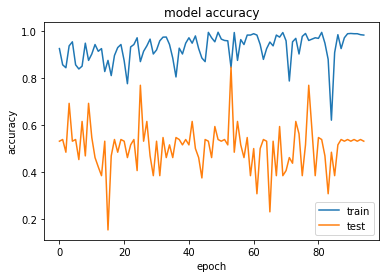

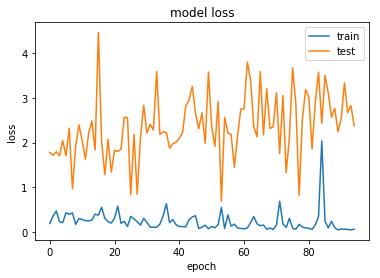

In [15]:
# list all data in history
print(history.history.keys())
# summarize history for accuracy
plt.plot(history.history['acc'])
plt.plot(history.history['val_acc'])
plt.title('model accuracy')
plt.ylabel('accuracy')
plt.xlabel('epoch')
plt.legend(['train', 'test'], loc='lower right')
plt.show()
# summarize history for loss
plt.plot(history.history['loss'])
plt.plot(history.history['val_loss'])
plt.title('model loss')
plt.ylabel('loss')
plt.xlabel('epoch')
plt.legend(['train', 'test'], loc='upper right')
plt.show()

# The limitation on the number of examples to be 56 causes the model to go through a very small amount of data and the model as a result fluctuates while training and performs poorly on test data

# Now I will manually provide data for each epoch by randomly shuffling it while keeping the class balance by taking 18 examples per class per epoch. 
# 70, 15, 15 will be the split between train, validation and test sets respectively providing 1651 training while 354 validation and 357 test examples  using the model having 0.89% test accuracy on Cats and Dogs dataset 
# The model has 5 convolution layers with 64, 64, 128, 128, 256 filters of 3x3 each, three dense layers with 256, 256 and 7 neurons respectively, dropout of 0.5 and rmsprop as the optimizer while using softmax instead of sigmoid utilizing categorical cross entropy as loss and accuracy as the metric 

In [4]:
res_data = {}
for i in range(1,8):
    img_dir = str(i)
    files = os.listdir(img_dir)
    res_data[str(i)] = []
    for f1 in files:
        img = cv2.imread(img_dir+'/'+f1)
        img = cv2.resize(img,(224,224))
        res_data[str(i)].append(img)  

In [5]:
labels = {}
for i in range(1,8):
    img_dir = str(i)
    files = os.listdir(img_dir)
    labels[str(i)] = []
    for f1 in files:
        labels[str(i)].append(i-1)  

In [6]:
col_data = []
for i in range(1,8):
    files = res_data[str(i)]
    for f1 in files:
        col_data.append(f1)
        
col_labels = []
for i in range(1,8):
    files = labels[str(i)]
    for f1 in files:
        col_labels.append(f1)        

In [7]:
d1 = res_data[str(1)]
d2 = res_data[str(2)]
d3 = res_data[str(3)]
d4 = res_data[str(4)]
d5 = res_data[str(5)]
d6 = res_data[str(6)]
d7 = res_data[str(7)]

l1 = labels[str(1)]
l2 = labels[str(2)]
l3 = labels[str(3)]
l4 = labels[str(4)]
l5 = labels[str(5)]
l6 = labels[str(6)]
l7 = labels[str(7)]

d1_train, d1_test, l1_train, l1_test = train_test_split(d1, l1, test_size=0.3)
d2_train, d2_test, l2_train, l2_test = train_test_split(d2, l2, test_size=0.3)
d3_train, d3_test, l3_train, l3_test = train_test_split(d3, l3, test_size=0.3)
d4_train, d4_test, l4_train, l4_test = train_test_split(d4, l4, test_size=0.3)
d5_train, d5_test, l5_train, l5_test = train_test_split(d5, l5, test_size=0.3)
d6_train, d6_test, l6_train, l6_test = train_test_split(d6, l6, test_size=0.3)
d7_train, d7_test, l7_train, l7_test = train_test_split(d7, l7, test_size=0.3)    

In [8]:
d1_train = np.asarray(d1_train)
d2_train = np.asarray(d2_train)
d3_train = np.asarray(d3_train)
d4_train = np.asarray(d4_train)
d5_train = np.asarray(d5_train)
d6_train = np.asarray(d6_train)
d7_train = np.asarray(d7_train)

# Model to be used

In [26]:
# dimensions of our images.
img_width, img_height = 64, 64

#train_data_dir = './training/'
#validation_data_dir = './validation'
#nb_train_samples = 238
#nb_validation_samples = 77


if K.image_data_format() == 'channels_first':
    input_shape = (3, img_width, img_height)
else:
    input_shape = (img_width, img_height, 3)


model = Sequential()
model.add(Convolution2D(64, 3, padding='same', activation='relu',  input_shape=(64,64,3)))
model.add(Convolution2D(64, 3, padding='same', activation='relu'))
model.add(MaxPooling2D(pool_size=(2, 2)))

model.add(Dropout(0.5))

model.add(Convolution2D(128, 3, padding='same', activation='relu'))
model.add(Convolution2D(128, 3, padding='same', activation='relu'))
model.add(MaxPooling2D(pool_size=(2, 2)))

model.add(Dropout(0.5))

model.add(Convolution2D(256, 3, padding='same', activation='relu'))
model.add(MaxPooling2D(pool_size=(2, 2)))

model.add(Flatten())
model.add(Dense(256))
model.add(Activation('relu'))
model.add(Dropout(0.5))
model.add(Dense(256))
model.add(Activation('relu'))
model.add(Dropout(0.5))
model.add(Dense(7))
model.add(Activation('softmax'))


model.compile(loss='categorical_crossentropy',
              optimizer=keras.optimizers.RMSprop(lr=0.0001, rho=0.9, epsilon=None, decay=0.0),
              metrics=['accuracy'])

#checkpoint = ModelCheckpoint('{val_acc:.4f}.hdf5', monitor='val_acc', verbose=1, save_best_only=True, mode='auto')

# this is the augmentation configuration we will use for training


#checkpoint = ModelCheckpoint('{train_acc:.4f}.hdf5', monitor='train_acc', verbose=1, save_best_only=True, mode='auto')

In [46]:
model.summary()

_________________________________________________________________
Layer (type)                 Output Shape              Param #   
conv2d_16 (Conv2D)           (None, 64, 64, 64)        1792      
_________________________________________________________________
conv2d_17 (Conv2D)           (None, 64, 64, 64)        36928     
_________________________________________________________________
max_pooling2d_10 (MaxPooling (None, 32, 32, 64)        0         
_________________________________________________________________
dropout_13 (Dropout)         (None, 32, 32, 64)        0         
_________________________________________________________________
conv2d_18 (Conv2D)           (None, 32, 32, 128)       73856     
_________________________________________________________________
conv2d_19 (Conv2D)           (None, 32, 32, 128)       147584    
_________________________________________________________________
max_pooling2d_11 (MaxPooling (None, 16, 16, 128)       0         
__________

# Separating Validation Data

In [9]:
x1 = d1_test[0:np.shape(d1_test)[0]/2] 
x2 = d2_test[0:np.shape(d2_test)[0]/2] 
x3 = d3_test[0:np.shape(d3_test)[0]/2] 
x4 = d4_test[0:np.shape(d4_test)[0]/2] 
x5 = d5_test[0:np.shape(d5_test)[0]/2] 
x6 = d6_test[0:np.shape(d6_test)[0]/2] 
x7 = d7_test[0:np.shape(d7_test)[0]/2] 
    
y1 = l1_test
y2 = l2_test 
y3 = l3_test 
y4 = l4_test 
y5 = l5_test 
y6 = l6_test 
y7 = l7_test
    
y1 = np_utils.to_categorical(y1, 7)
y2 = np_utils.to_categorical(y2, 7)
y3 = np_utils.to_categorical(y3, 7)
y4 = np_utils.to_categorical(y4, 7)
y5 = np_utils.to_categorical(y5, 7)
y6 = np_utils.to_categorical(y6, 7)
y7 = np_utils.to_categorical(y7, 7)
    

y1 = y1[0:np.shape(y1)[0]/2] 
y2 = y2[0:np.shape(y2)[0]/2] 
y3 = y3[0:np.shape(y3)[0]/2] 
y4 = y4[0:np.shape(y4)[0]/2] 
y5 = y5[0:np.shape(y5)[0]/2] 
y6 = y6[0:np.shape(y6)[0]/2] 
y7 = y7[0:np.shape(y7)[0]/2]     
    
x_valid= []

x_valid.append(x1)
x_valid.append(x2)
x_valid.append(x3)
x_valid.append(x4)
x_valid.append(x5)
x_valid.append(x6)
x_valid.append(x7)

y_valid = []
    
y_valid.append(y1)
y_valid.append(y2)
y_valid.append(y3)
y_valid.append(y4)
y_valid.append(y5)
y_valid.append(y6)
y_valid.append(y7)
    
X_valid = []

for i in range(np.shape(x_valid)[0]):
    
    for j in range(np.shape(x_valid[i])[0]):
        
        X_valid.append(x_valid[i][j])
        
Y_valid = []

for i in range(np.shape(y_valid)[0]):
    
    for j in range(np.shape(y_valid[i])[0]):
        
        Y_valid.append(y_valid[i][j]) 
        
    
X_valid = np.asarray(X_valid)
Y_valid = np.asarray(Y_valid)


# Training the model for 200 epochs by randomly sampling 18 examples from each class for each epoch

In [11]:
h = []

v =[]

for i in range(200):
    
    c1 = np.random.randint(0,np.shape(d1_train)[0],18)
    c2 = np.random.randint(0,np.shape(d2_train)[0],18)
    c3 = np.random.randint(0,np.shape(d3_train)[0],18)
    c4 = np.random.randint(0,np.shape(d4_train)[0],18)
    c5 = np.random.randint(0,np.shape(d5_train)[0],18)
    c6 = np.random.randint(0,np.shape(d6_train)[0],18)
    c7 = np.random.randint(0,np.shape(d7_train)[0],18)
    
    x1 = d1_train[c1] 
    x2 = d2_train[c2] 
    x3 = d3_train[c3] 
    x4 = d4_train[c4] 
    x5 = d5_train[c5] 
    x6 = d6_train[c6] 
    x7 = d7_train[c7] 
    
    y1 = l1_train
    y2 = l2_train 
    y3 = l3_train 
    y4 = l4_train 
    y5 = l5_train 
    y6 = l6_train 
    y7 = l7_train
    
    y1 = np_utils.to_categorical(y1, 7)
    y2 = np_utils.to_categorical(y2, 7)
    y3 = np_utils.to_categorical(y3, 7)
    y4 = np_utils.to_categorical(y4, 7)
    y5 = np_utils.to_categorical(y5, 7)
    y6 = np_utils.to_categorical(y6, 7)
    y7 = np_utils.to_categorical(y7, 7)
    
    y1 = y1[c1] 
    y2 = y2[c2] 
    y3 = y3[c3] 
    y4 = y4[c4] 
    y5 = y5[c5] 
    y6 = y6[c6] 
    y7 = y7[c7] 
    
    x_train = []

    x_train.append(x1)
    x_train.append(x2)
    x_train.append(x3)
    x_train.append(x4)
    x_train.append(x5)
    x_train.append(x6)
    x_train.append(x7)

    y_train = []
    
    y_train.append(y1)
    y_train.append(y2)
    y_train.append(y3)
    y_train.append(y4)
    y_train.append(y5)
    y_train.append(y6)
    y_train.append(y7)
    
    X_train = []

    for i in range(np.shape(x_train)[0]):
    
        for j in range(np.shape(x_train[i])[0]):
        
            X_train.append(x_train[i][j])
        
    Y_train = []

    for i in range(np.shape(y_train)[0]):
    
        for j in range(np.shape(y_train[i])[0]):
        
            Y_train.append(y_train[i][j]) 
        
    
    X_train = np.asarray(X_train)
    Y_train = np.asarray(Y_train)
    
    
    history = model.fit(X_train,Y_train,epochs=1)
    [loss,acc] = model.evaluate(X_valid,Y_valid)
    h.append(history)
    v.append((loss,acc))

Epoch 1/1
354/354 [==============================] - 0s 1ms/step
Epoch 1/1
354/354 [==============================] - 0s 998us/step
Epoch 1/1
354/354 [==============================] - 0s 1ms/step
Epoch 1/1
354/354 [==============================] - 0s 1ms/step
Epoch 1/1
354/354 [==============================] - 0s 1ms/step
Epoch 1/1
354/354 [==============================] - 0s 970us/step
Epoch 1/1
354/354 [==============================] - 0s 915us/step
Epoch 1/1
354/354 [==============================] - 0s 946us/step
Epoch 1/1
354/354 [==============================] - 0s 924us/step
Epoch 1/1
354/354 [==============================] - 0s 936us/step
Epoch 1/1
354/354 [==============================] - 0s 942us/step
Epoch 1/1
354/354 [==============================] - 0s 936us/step
Epoch 1/1
354/354 [==============================] - 0s 922us/step
Epoch 1/1
354/354 [==============================] - 0s 934us/step
Epoch 1/1
354/354 [==============================] - 0s 980us/step
Epo

354/354 [==============================] - 0s 762us/step
Epoch 1/1
354/354 [==============================] - 0s 747us/step
Epoch 1/1
354/354 [==============================] - 0s 735us/step
Epoch 1/1
354/354 [==============================] - 0s 766us/step
Epoch 1/1
354/354 [==============================] - 0s 745us/step
Epoch 1/1
354/354 [==============================] - 0s 743us/step
Epoch 1/1
354/354 [==============================] - 0s 744us/step
Epoch 1/1
354/354 [==============================] - 0s 742us/step
Epoch 1/1
354/354 [==============================] - 0s 744us/step
Epoch 1/1
354/354 [==============================] - 0s 755us/step
Epoch 1/1
354/354 [==============================] - 0s 744us/step
Epoch 1/1
354/354 [==============================] - 0s 752us/step
Epoch 1/1
354/354 [==============================] - 0s 745us/step
Epoch 1/1
354/354 [==============================] - 0s 733us/step
Epoch 1/1
354/354 [==============================] - 0s 742us/step
Epoch

# Separating Test Data

In [10]:
x1 = d1_test[np.shape(d1_test)[0]/2:np.shape(d1_test)[0]] 
x2 = d2_test[np.shape(d2_test)[0]/2:np.shape(d2_test)[0]] 
x3 = d3_test[np.shape(d3_test)[0]/2:np.shape(d3_test)[0]] 
x4 = d4_test[np.shape(d4_test)[0]/2:np.shape(d4_test)[0]] 
x5 = d5_test[np.shape(d5_test)[0]/2:np.shape(d5_test)[0]]  
x6 = d6_test[np.shape(d6_test)[0]/2:np.shape(d6_test)[0]] 
x7 = d7_test[np.shape(d7_test)[0]/2:np.shape(d7_test)[0]] 
    
y1 = l1_test
y2 = l2_test 
y3 = l3_test 
y4 = l4_test 
y5 = l5_test 
y6 = l6_test 
y7 = l7_test
    
y1 = np_utils.to_categorical(y1, 7)
y2 = np_utils.to_categorical(y2, 7)
y3 = np_utils.to_categorical(y3, 7)
y4 = np_utils.to_categorical(y4, 7)
y5 = np_utils.to_categorical(y5, 7)
y6 = np_utils.to_categorical(y6, 7)
y7 = np_utils.to_categorical(y7, 7)
    
y1 = y1[np.shape(y1)[0]/2:np.shape(y1)[0]] 
y2 = y2[np.shape(y2)[0]/2:np.shape(y2)[0]] 
y3 = y3[np.shape(y3)[0]/2:np.shape(y3)[0]] 
y4 = y4[np.shape(y4)[0]/2:np.shape(y4)[0]] 
y5 = y5[np.shape(y5)[0]/2:np.shape(y5)[0]]  
y6 = y6[np.shape(y6)[0]/2:np.shape(y6)[0]] 
y7 = y7[np.shape(y7)[0]/2:np.shape(y7)[0]]    
    
x_test = []

x_test.append(x1)
x_test.append(x2)
x_test.append(x3)
x_test.append(x4)
x_test.append(x5)
x_test.append(x6)
x_test.append(x7)

y_test = []
    
y_test.append(y1)
y_test.append(y2)
y_test.append(y3)
y_test.append(y4)
y_test.append(y5)
y_test.append(y6)
y_test.append(y7)
    
X_test = []

for i in range(np.shape(x_test)[0]):
    
    for j in range(np.shape(x_test[i])[0]):
        
        X_test.append(x_test[i][j])
        
Y_test = []

for i in range(np.shape(y_test)[0]):
    
    for j in range(np.shape(y_test[i])[0]):
        
        Y_test.append(y_test[i][j]) 
        
    
X_test = np.asarray(X_test)
Y_test = np.asarray(Y_test)


In [13]:
print "Test Data Dimensions : ",np.shape(X_test)
print "Test Labels Dimensions : ",np.shape(Y_test)

Test Data Dimensions :  (357, 64, 64, 3)
Test Labels Dimensions :  (357, 7)


In [15]:
[loss, acc] = model.evaluate(X_test,Y_test)
print "Accuracy : ",acc

357/357 [==============================] - 0s 905us/step
Accuracy :  0.607843137422


In [41]:
train_loss = []
train_acc = []

valid_loss = []
valid_acc = []

for i in range(200):

    train_loss.append(h[i].history['loss'])
    train_acc.append(h[i].history['acc'])
    
    valid_loss.append(v[i][0])
    valid_acc.append(v[i][1])
    
    

    

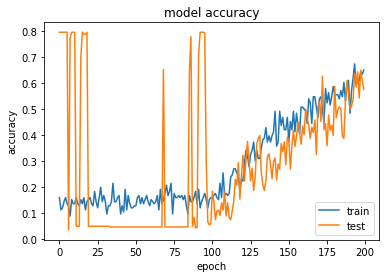

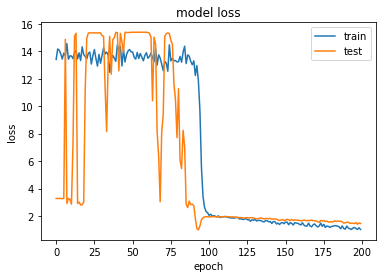

In [46]:
plt.plot(train_acc)
plt.plot(valid_acc)
plt.title('model accuracy')
plt.ylabel('accuracy')
plt.xlabel('epoch')
plt.legend(['train','test'], loc='lower right')
plt.show()

plt.plot(train_loss)
plt.plot(valid_loss)
plt.title('model loss')
plt.ylabel('loss')
plt.xlabel('epoch')
plt.legend(['train','test'], loc='upper right')
plt.show()

# Increasing Epochs to 400

In [9]:
h = []

v =[]

for i in range(400):
    
    c1 = np.random.randint(0,np.shape(d1_train)[0],18)
    c2 = np.random.randint(0,np.shape(d2_train)[0],18)
    c3 = np.random.randint(0,np.shape(d3_train)[0],18)
    c4 = np.random.randint(0,np.shape(d4_train)[0],18)
    c5 = np.random.randint(0,np.shape(d5_train)[0],18)
    c6 = np.random.randint(0,np.shape(d6_train)[0],18)
    c7 = np.random.randint(0,np.shape(d7_train)[0],18)
    
    x1 = d1_train[c1] 
    x2 = d2_train[c2] 
    x3 = d3_train[c3] 
    x4 = d4_train[c4] 
    x5 = d5_train[c5] 
    x6 = d6_train[c6] 
    x7 = d7_train[c7] 
    
    y1 = l1_train
    y2 = l2_train 
    y3 = l3_train 
    y4 = l4_train 
    y5 = l5_train 
    y6 = l6_train 
    y7 = l7_train
    
    y1 = np_utils.to_categorical(y1, 7)
    y2 = np_utils.to_categorical(y2, 7)
    y3 = np_utils.to_categorical(y3, 7)
    y4 = np_utils.to_categorical(y4, 7)
    y5 = np_utils.to_categorical(y5, 7)
    y6 = np_utils.to_categorical(y6, 7)
    y7 = np_utils.to_categorical(y7, 7)
    
    y1 = y1[c1] 
    y2 = y2[c2] 
    y3 = y3[c3] 
    y4 = y4[c4] 
    y5 = y5[c5] 
    y6 = y6[c6] 
    y7 = y7[c7] 
    
    x_train = []

    x_train.append(x1)
    x_train.append(x2)
    x_train.append(x3)
    x_train.append(x4)
    x_train.append(x5)
    x_train.append(x6)
    x_train.append(x7)

    y_train = []
    
    y_train.append(y1)
    y_train.append(y2)
    y_train.append(y3)
    y_train.append(y4)
    y_train.append(y5)
    y_train.append(y6)
    y_train.append(y7)
    
    X_train = []

    for i in range(np.shape(x_train)[0]):
    
        for j in range(np.shape(x_train[i])[0]):
        
            X_train.append(x_train[i][j])
        
    Y_train = []

    for i in range(np.shape(y_train)[0]):
    
        for j in range(np.shape(y_train[i])[0]):
        
            Y_train.append(y_train[i][j]) 
        
    
    X_train = np.asarray(X_train)
    Y_train = np.asarray(Y_train)
    
    
    history = model.fit(X_train,Y_train,epochs=1)
    [loss,acc] = model.evaluate(X_valid,Y_valid)
    h.append(history)
    v.append((loss,acc))

Epoch 1/1
354/354 [==============================] - 0s 1ms/step
Epoch 1/1
354/354 [==============================] - 0s 820us/step
Epoch 1/1
354/354 [==============================] - 0s 816us/step
Epoch 1/1
354/354 [==============================] - 0s 818us/step
Epoch 1/1
354/354 [==============================] - 0s 830us/step
Epoch 1/1
354/354 [==============================] - 0s 840us/step
Epoch 1/1
354/354 [==============================] - 0s 821us/step
Epoch 1/1
354/354 [==============================] - 0s 801us/step
Epoch 1/1
354/354 [==============================] - 0s 825us/step
Epoch 1/1
354/354 [==============================] - 0s 827us/step
Epoch 1/1
354/354 [==============================] - 0s 831us/step
Epoch 1/1
354/354 [==============================] - 0s 1ms/step
Epoch 1/1
354/354 [==============================] - 0s 826us/step
Epoch 1/1
354/354 [==============================] - 0s 810us/step
Epoch 1/1
354/354 [==============================] - 0s 853us/step

354/354 [==============================] - 0s 746us/step
Epoch 1/1
354/354 [==============================] - 0s 739us/step
Epoch 1/1
354/354 [==============================] - 0s 743us/step
Epoch 1/1
354/354 [==============================] - 0s 748us/step
Epoch 1/1
354/354 [==============================] - 0s 765us/step
Epoch 1/1
354/354 [==============================] - 0s 754us/step
Epoch 1/1
354/354 [==============================] - 0s 730us/step
Epoch 1/1
354/354 [==============================] - 0s 820us/step
Epoch 1/1
354/354 [==============================] - 0s 857us/step
Epoch 1/1
354/354 [==============================] - 0s 882us/step
Epoch 1/1
354/354 [==============================] - 0s 786us/step
Epoch 1/1
354/354 [==============================] - 0s 752us/step
Epoch 1/1
354/354 [==============================] - 0s 738us/step
Epoch 1/1
354/354 [==============================] - 0s 739us/step
Epoch 1/1
354/354 [==============================] - 0s 742us/step
Epoch

Epoch 1/1
354/354 [==============================] - 0s 748us/step
Epoch 1/1
354/354 [==============================] - 0s 761us/step
Epoch 1/1
354/354 [==============================] - 0s 739us/step
Epoch 1/1
354/354 [==============================] - 0s 760us/step
Epoch 1/1
354/354 [==============================] - 0s 792us/step
Epoch 1/1
354/354 [==============================] - 0s 800us/step
Epoch 1/1
354/354 [==============================] - 0s 892us/step
Epoch 1/1
354/354 [==============================] - 0s 833us/step
Epoch 1/1
354/354 [==============================] - 0s 758us/step
Epoch 1/1
354/354 [==============================] - 0s 736us/step
Epoch 1/1
354/354 [==============================] - 0s 763us/step
Epoch 1/1
354/354 [==============================] - 0s 794us/step
Epoch 1/1
354/354 [==============================] - 0s 765us/step
Epoch 1/1
354/354 [==============================] - 0s 783us/step
Epoch 1/1
354/354 [==============================] - 0s 808us/

354/354 [==============================] - 0s 862us/step
Epoch 1/1
354/354 [==============================] - 0s 876us/step
Epoch 1/1
354/354 [==============================] - 0s 774us/step
Epoch 1/1
354/354 [==============================] - 0s 809us/step
Epoch 1/1
354/354 [==============================] - 0s 874us/step
Epoch 1/1
354/354 [==============================] - 0s 849us/step
Epoch 1/1
354/354 [==============================] - 0s 753us/step
Epoch 1/1
354/354 [==============================] - 0s 785us/step
Epoch 1/1
354/354 [==============================] - 0s 786us/step
Epoch 1/1
354/354 [==============================] - 0s 806us/step
Epoch 1/1
354/354 [==============================] - 0s 771us/step
Epoch 1/1
354/354 [==============================] - 0s 742us/step
Epoch 1/1
354/354 [==============================] - 0s 748us/step
Epoch 1/1
354/354 [==============================] - 0s 796us/step
Epoch 1/1
354/354 [==============================] - 0s 786us/step
Epoch

354/354 [==============================] - 0s 750us/step
Epoch 1/1
354/354 [==============================] - 0s 744us/step
Epoch 1/1
354/354 [==============================] - 0s 845us/step
Epoch 1/1
354/354 [==============================] - 0s 829us/step
Epoch 1/1
354/354 [==============================] - 0s 746us/step
Epoch 1/1
354/354 [==============================] - 0s 738us/step
Epoch 1/1
354/354 [==============================] - 0s 761us/step
Epoch 1/1
354/354 [==============================] - 0s 793us/step
Epoch 1/1
354/354 [==============================] - 0s 758us/step
Epoch 1/1
354/354 [==============================] - 0s 858us/step
Epoch 1/1
354/354 [==============================] - 0s 865us/step
Epoch 1/1
354/354 [==============================] - 0s 755us/step
Epoch 1/1
354/354 [==============================] - 0s 807us/step
Epoch 1/1
354/354 [==============================] - 0s 850us/step
Epoch 1/1
354/354 [==============================] - 0s 850us/step
Epoch

In [12]:
[loss, acc] = model.evaluate(X_test,Y_test)
print "Accuracy : ",acc

357/357 [==============================] - 0s 1ms/step
Accuracy :  0.683473389397


In [14]:
train_loss = []
train_acc = []

valid_loss = []
valid_acc = []

for i in range(400):

    train_loss.append(h[i].history['loss'])
    train_acc.append(h[i].history['acc'])
    
    valid_loss.append(v[i][0])
    valid_acc.append(v[i][1])
    
    

    

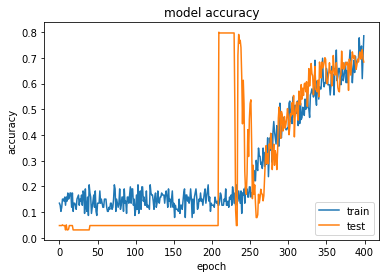

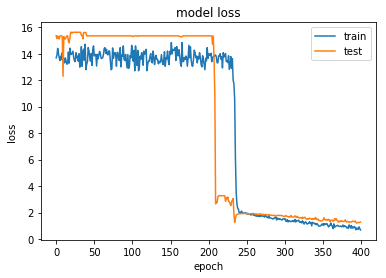

In [15]:
plt.plot(train_acc)
plt.plot(valid_acc)
plt.title('model accuracy')
plt.ylabel('accuracy')
plt.xlabel('epoch')
plt.legend(['train','test'], loc='lower right')
plt.show()

plt.plot(train_loss)
plt.plot(valid_loss)
plt.title('model loss')
plt.ylabel('loss')
plt.xlabel('epoch')
plt.legend(['train','test'], loc='upper right')
plt.show()

# Increasing Epochs to 800

In [17]:
h = []

v =[]

for i in range(800):
    
    c1 = np.random.randint(0,np.shape(d1_train)[0],18)
    c2 = np.random.randint(0,np.shape(d2_train)[0],18)
    c3 = np.random.randint(0,np.shape(d3_train)[0],18)
    c4 = np.random.randint(0,np.shape(d4_train)[0],18)
    c5 = np.random.randint(0,np.shape(d5_train)[0],18)
    c6 = np.random.randint(0,np.shape(d6_train)[0],18)
    c7 = np.random.randint(0,np.shape(d7_train)[0],18)
    
    x1 = d1_train[c1] 
    x2 = d2_train[c2] 
    x3 = d3_train[c3] 
    x4 = d4_train[c4] 
    x5 = d5_train[c5] 
    x6 = d6_train[c6] 
    x7 = d7_train[c7] 
    
    y1 = l1_train
    y2 = l2_train 
    y3 = l3_train 
    y4 = l4_train 
    y5 = l5_train 
    y6 = l6_train 
    y7 = l7_train
    
    y1 = np_utils.to_categorical(y1, 7)
    y2 = np_utils.to_categorical(y2, 7)
    y3 = np_utils.to_categorical(y3, 7)
    y4 = np_utils.to_categorical(y4, 7)
    y5 = np_utils.to_categorical(y5, 7)
    y6 = np_utils.to_categorical(y6, 7)
    y7 = np_utils.to_categorical(y7, 7)
    
    y1 = y1[c1] 
    y2 = y2[c2] 
    y3 = y3[c3] 
    y4 = y4[c4] 
    y5 = y5[c5] 
    y6 = y6[c6] 
    y7 = y7[c7] 
    
    x_train = []

    x_train.append(x1)
    x_train.append(x2)
    x_train.append(x3)
    x_train.append(x4)
    x_train.append(x5)
    x_train.append(x6)
    x_train.append(x7)

    y_train = []
    
    y_train.append(y1)
    y_train.append(y2)
    y_train.append(y3)
    y_train.append(y4)
    y_train.append(y5)
    y_train.append(y6)
    y_train.append(y7)
    
    X_train = []

    for i in range(np.shape(x_train)[0]):
    
        for j in range(np.shape(x_train[i])[0]):
        
            X_train.append(x_train[i][j])
        
    Y_train = []

    for i in range(np.shape(y_train)[0]):
    
        for j in range(np.shape(y_train[i])[0]):
        
            Y_train.append(y_train[i][j]) 
        
    
    X_train = np.asarray(X_train)
    Y_train = np.asarray(Y_train)
    
    
    history = model.fit(X_train,Y_train,epochs=1)
    [loss,acc] = model.evaluate(X_valid,Y_valid)
    h.append(history)
    v.append((loss,acc))

Epoch 1/1
354/354 [==============================] - 0s 945us/step
Epoch 1/1
354/354 [==============================] - 0s 822us/step
Epoch 1/1
354/354 [==============================] - 0s 866us/step
Epoch 1/1
354/354 [==============================] - 0s 843us/step
Epoch 1/1
354/354 [==============================] - 0s 840us/step
Epoch 1/1
354/354 [==============================] - 0s 849us/step
Epoch 1/1
354/354 [==============================] - 0s 806us/step
Epoch 1/1
354/354 [==============================] - 0s 816us/step
Epoch 1/1
354/354 [==============================] - 0s 821us/step
Epoch 1/1
354/354 [==============================] - 0s 821us/step
Epoch 1/1
354/354 [==============================] - 0s 824us/step
Epoch 1/1
354/354 [==============================] - 0s 775us/step
Epoch 1/1
354/354 [==============================] - 0s 965us/step
Epoch 1/1
354/354 [==============================] - 0s 734us/step
Epoch 1/1
354/354 [==============================] - 0s 900us/

354/354 [==============================] - 0s 770us/step
Epoch 1/1
354/354 [==============================] - 0s 757us/step
Epoch 1/1
354/354 [==============================] - 0s 853us/step
Epoch 1/1
354/354 [==============================] - 0s 874us/step
Epoch 1/1
354/354 [==============================] - 0s 749us/step
Epoch 1/1
354/354 [==============================] - 0s 746us/step
Epoch 1/1
354/354 [==============================] - 0s 831us/step
Epoch 1/1
354/354 [==============================] - 0s 875us/step
Epoch 1/1
354/354 [==============================] - 0s 737us/step
Epoch 1/1
354/354 [==============================] - 0s 804us/step
Epoch 1/1
354/354 [==============================] - 0s 785us/step
Epoch 1/1
354/354 [==============================] - 0s 848us/step
Epoch 1/1
354/354 [==============================] - 0s 849us/step
Epoch 1/1
354/354 [==============================] - 0s 762us/step
Epoch 1/1
354/354 [==============================] - 0s 841us/step
Epoch

354/354 [==============================] - 0s 744us/step
Epoch 1/1
354/354 [==============================] - 0s 757us/step
Epoch 1/1
354/354 [==============================] - 0s 737us/step
Epoch 1/1
354/354 [==============================] - 0s 745us/step
Epoch 1/1
354/354 [==============================] - 0s 740us/step
Epoch 1/1
354/354 [==============================] - 0s 739us/step
Epoch 1/1
354/354 [==============================] - 0s 806us/step
Epoch 1/1
354/354 [==============================] - 0s 733us/step
Epoch 1/1
354/354 [==============================] - 0s 745us/step
Epoch 1/1
354/354 [==============================] - 0s 752us/step
Epoch 1/1
354/354 [==============================] - 0s 750us/step
Epoch 1/1
354/354 [==============================] - 0s 742us/step
Epoch 1/1
354/354 [==============================] - 0s 761us/step
Epoch 1/1
354/354 [==============================] - 0s 740us/step
Epoch 1/1
354/354 [==============================] - 0s 748us/step
Epoch

354/354 [==============================] - 0s 741us/step
Epoch 1/1
354/354 [==============================] - 0s 764us/step
Epoch 1/1
354/354 [==============================] - 0s 756us/step
Epoch 1/1
354/354 [==============================] - 0s 736us/step
Epoch 1/1
354/354 [==============================] - 0s 744us/step
Epoch 1/1
354/354 [==============================] - 0s 746us/step
Epoch 1/1
354/354 [==============================] - 0s 744us/step
Epoch 1/1
354/354 [==============================] - 0s 740us/step
Epoch 1/1
354/354 [==============================] - 0s 782us/step
Epoch 1/1
354/354 [==============================] - 0s 737us/step
Epoch 1/1
354/354 [==============================] - 0s 748us/step
Epoch 1/1
354/354 [==============================] - 0s 745us/step
Epoch 1/1
354/354 [==============================] - 0s 744us/step
Epoch 1/1
354/354 [==============================] - 0s 742us/step
Epoch 1/1
354/354 [==============================] - 0s 737us/step
Epoch

354/354 [==============================] - 0s 766us/step
Epoch 1/1
354/354 [==============================] - 0s 816us/step
Epoch 1/1
354/354 [==============================] - 0s 786us/step
Epoch 1/1
354/354 [==============================] - 0s 773us/step
Epoch 1/1
354/354 [==============================] - 0s 754us/step
Epoch 1/1
354/354 [==============================] - 0s 870us/step
Epoch 1/1
354/354 [==============================] - 0s 747us/step
Epoch 1/1
354/354 [==============================] - 0s 744us/step
Epoch 1/1
354/354 [==============================] - 0s 753us/step
Epoch 1/1
354/354 [==============================] - 0s 754us/step
Epoch 1/1
354/354 [==============================] - 0s 736us/step
Epoch 1/1
354/354 [==============================] - 0s 745us/step
Epoch 1/1
354/354 [==============================] - 0s 770us/step
Epoch 1/1
354/354 [==============================] - 0s 758us/step
Epoch 1/1
354/354 [==============================] - 0s 776us/step
Epoch

354/354 [==============================] - 0s 758us/step
Epoch 1/1
354/354 [==============================] - 0s 767us/step
Epoch 1/1
354/354 [==============================] - 0s 733us/step
Epoch 1/1
354/354 [==============================] - 0s 750us/step
Epoch 1/1
354/354 [==============================] - 0s 859us/step
Epoch 1/1
354/354 [==============================] - 0s 764us/step
Epoch 1/1
354/354 [==============================] - 0s 744us/step
Epoch 1/1
354/354 [==============================] - 0s 857us/step
Epoch 1/1
354/354 [==============================] - 0s 861us/step
Epoch 1/1
354/354 [==============================] - 0s 751us/step
Epoch 1/1
354/354 [==============================] - 0s 751us/step
Epoch 1/1
354/354 [==============================] - 0s 759us/step
Epoch 1/1
354/354 [==============================] - 0s 740us/step
Epoch 1/1
354/354 [==============================] - 0s 747us/step
Epoch 1/1
354/354 [==============================] - 0s 732us/step
Epoch

354/354 [==============================] - 0s 753us/step
Epoch 1/1
354/354 [==============================] - 0s 823us/step
Epoch 1/1
354/354 [==============================] - 0s 930us/step
Epoch 1/1
354/354 [==============================] - 0s 914us/step
Epoch 1/1
354/354 [==============================] - 0s 766us/step
Epoch 1/1
354/354 [==============================] - 0s 793us/step
Epoch 1/1
354/354 [==============================] - 0s 737us/step
Epoch 1/1
354/354 [==============================] - 0s 745us/step
Epoch 1/1
354/354 [==============================] - 0s 748us/step
Epoch 1/1
354/354 [==============================] - 0s 733us/step
Epoch 1/1
354/354 [==============================] - 0s 723us/step
Epoch 1/1
354/354 [==============================] - 0s 742us/step
Epoch 1/1
354/354 [==============================] - 0s 723us/step
Epoch 1/1
354/354 [==============================] - 0s 738us/step
Epoch 1/1
354/354 [==============================] - 0s 734us/step
Epoch

354/354 [==============================] - 0s 872us/step
Epoch 1/1
354/354 [==============================] - 0s 885us/step
Epoch 1/1
354/354 [==============================] - 0s 881us/step
Epoch 1/1
354/354 [==============================] - 0s 865us/step
Epoch 1/1
354/354 [==============================] - 0s 852us/step
Epoch 1/1
354/354 [==============================] - 0s 894us/step
Epoch 1/1
354/354 [==============================] - 0s 867us/step
Epoch 1/1
354/354 [==============================] - 0s 881us/step
Epoch 1/1
354/354 [==============================] - 0s 880us/step
Epoch 1/1
354/354 [==============================] - 0s 868us/step
Epoch 1/1
354/354 [==============================] - 0s 878us/step
Epoch 1/1
354/354 [==============================] - 0s 893us/step
Epoch 1/1
354/354 [==============================] - 0s 924us/step
Epoch 1/1
354/354 [==============================] - 0s 914us/step
Epoch 1/1
354/354 [==============================] - 0s 928us/step
Epoch

In [18]:
[loss, acc] = model.evaluate(X_test,Y_test)
print "Accuracy : ",acc

357/357 [==============================] - 0s 867us/step
Accuracy :  0.798319328065


In [19]:
train_loss = []
train_acc = []

valid_loss = []
valid_acc = []

for i in range(800):

    train_loss.append(h[i].history['loss'])
    train_acc.append(h[i].history['acc'])
    
    valid_loss.append(v[i][0])
    valid_acc.append(v[i][1])
    
    

    

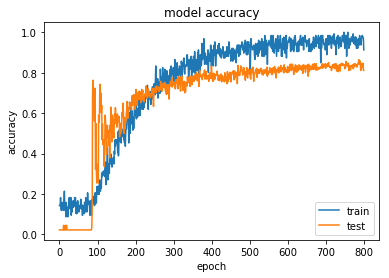

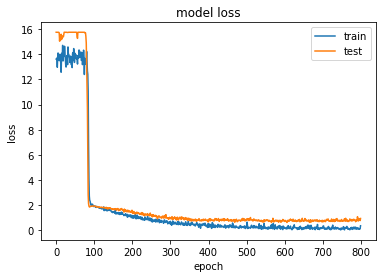

In [20]:
plt.plot(train_acc)
plt.plot(valid_acc)
plt.title('model accuracy')
plt.ylabel('accuracy')
plt.xlabel('epoch')
plt.legend(['train','test'], loc='lower right')
plt.show()

plt.plot(train_loss)
plt.plot(valid_loss)
plt.title('model loss')
plt.ylabel('loss')
plt.xlabel('epoch')
plt.legend(['train','test'], loc='upper right')
plt.show()

# Increasing Epochs to 1600

In [22]:
h = []

v =[]

for i in range(1600):
    
    c1 = np.random.randint(0,np.shape(d1_train)[0],18)
    c2 = np.random.randint(0,np.shape(d2_train)[0],18)
    c3 = np.random.randint(0,np.shape(d3_train)[0],18)
    c4 = np.random.randint(0,np.shape(d4_train)[0],18)
    c5 = np.random.randint(0,np.shape(d5_train)[0],18)
    c6 = np.random.randint(0,np.shape(d6_train)[0],18)
    c7 = np.random.randint(0,np.shape(d7_train)[0],18)
    
    x1 = d1_train[c1] 
    x2 = d2_train[c2] 
    x3 = d3_train[c3] 
    x4 = d4_train[c4] 
    x5 = d5_train[c5] 
    x6 = d6_train[c6] 
    x7 = d7_train[c7] 
    
    y1 = l1_train
    y2 = l2_train 
    y3 = l3_train 
    y4 = l4_train 
    y5 = l5_train 
    y6 = l6_train 
    y7 = l7_train
    
    y1 = np_utils.to_categorical(y1, 7)
    y2 = np_utils.to_categorical(y2, 7)
    y3 = np_utils.to_categorical(y3, 7)
    y4 = np_utils.to_categorical(y4, 7)
    y5 = np_utils.to_categorical(y5, 7)
    y6 = np_utils.to_categorical(y6, 7)
    y7 = np_utils.to_categorical(y7, 7)
    
    y1 = y1[c1] 
    y2 = y2[c2] 
    y3 = y3[c3] 
    y4 = y4[c4] 
    y5 = y5[c5] 
    y6 = y6[c6] 
    y7 = y7[c7] 
    
    x_train = []

    x_train.append(x1)
    x_train.append(x2)
    x_train.append(x3)
    x_train.append(x4)
    x_train.append(x5)
    x_train.append(x6)
    x_train.append(x7)

    y_train = []
    
    y_train.append(y1)
    y_train.append(y2)
    y_train.append(y3)
    y_train.append(y4)
    y_train.append(y5)
    y_train.append(y6)
    y_train.append(y7)
    
    X_train = []

    for i in range(np.shape(x_train)[0]):
    
        for j in range(np.shape(x_train[i])[0]):
        
            X_train.append(x_train[i][j])
        
    Y_train = []

    for i in range(np.shape(y_train)[0]):
    
        for j in range(np.shape(y_train[i])[0]):
        
            Y_train.append(y_train[i][j]) 
        
    
    X_train = np.asarray(X_train)
    Y_train = np.asarray(Y_train)
    
    
    history = model.fit(X_train,Y_train,epochs=1)
    [loss,acc] = model.evaluate(X_valid,Y_valid)
    h.append(history)
    v.append((loss,acc))

Epoch 1/1
354/354 [==============================] - 0s 1ms/step
Epoch 1/1
354/354 [==============================] - 0s 906us/step
Epoch 1/1
354/354 [==============================] - 0s 940us/step
Epoch 1/1
354/354 [==============================] - 0s 925us/step
Epoch 1/1
354/354 [==============================] - 0s 920us/step
Epoch 1/1
354/354 [==============================] - 0s 946us/step
Epoch 1/1
354/354 [==============================] - 0s 951us/step
Epoch 1/1
354/354 [==============================] - 0s 938us/step
Epoch 1/1
354/354 [==============================] - 0s 1ms/step
Epoch 1/1
354/354 [==============================] - 0s 901us/step
Epoch 1/1
354/354 [==============================] - 0s 948us/step
Epoch 1/1
354/354 [==============================] - 0s 941us/step
Epoch 1/1
354/354 [==============================] - 0s 1ms/step
Epoch 1/1
354/354 [==============================] - 0s 918us/step
Epoch 1/1
354/354 [==============================] - 0s 925us/step
E

354/354 [==============================] - 0s 719us/step
Epoch 1/1
354/354 [==============================] - 0s 871us/step
Epoch 1/1
354/354 [==============================] - 0s 855us/step
Epoch 1/1
354/354 [==============================] - 0s 722us/step
Epoch 1/1
354/354 [==============================] - 0s 730us/step
Epoch 1/1
354/354 [==============================] - 0s 741us/step
Epoch 1/1
354/354 [==============================] - 0s 729us/step
Epoch 1/1
354/354 [==============================] - 0s 748us/step
Epoch 1/1
354/354 [==============================] - 0s 739us/step
Epoch 1/1
354/354 [==============================] - 0s 733us/step
Epoch 1/1
354/354 [==============================] - 0s 729us/step
Epoch 1/1
354/354 [==============================] - 0s 737us/step
Epoch 1/1
354/354 [==============================] - 0s 727us/step
Epoch 1/1
354/354 [==============================] - 0s 737us/step
Epoch 1/1
354/354 [==============================] - 0s 733us/step
Epoch

Epoch 1/1
354/354 [==============================] - 0s 719us/step
Epoch 1/1
354/354 [==============================] - 0s 725us/step
Epoch 1/1
354/354 [==============================] - 0s 725us/step
Epoch 1/1
354/354 [==============================] - 0s 730us/step
Epoch 1/1
354/354 [==============================] - 0s 730us/step
Epoch 1/1
354/354 [==============================] - 0s 728us/step
Epoch 1/1
354/354 [==============================] - 0s 741us/step
Epoch 1/1
354/354 [==============================] - 0s 724us/step
Epoch 1/1
354/354 [==============================] - 0s 726us/step
Epoch 1/1
354/354 [==============================] - 0s 731us/step
Epoch 1/1
354/354 [==============================] - 0s 706us/step
Epoch 1/1
354/354 [==============================] - 0s 706us/step
Epoch 1/1
354/354 [==============================] - 0s 704us/step
Epoch 1/1
354/354 [==============================] - 0s 706us/step
Epoch 1/1
354/354 [==============================] - 0s 708us/

354/354 [==============================] - 0s 753us/step
Epoch 1/1
354/354 [==============================] - 0s 814us/step
Epoch 1/1
354/354 [==============================] - 0s 787us/step
Epoch 1/1
354/354 [==============================] - 0s 736us/step
Epoch 1/1
354/354 [==============================] - 0s 844us/step
Epoch 1/1
354/354 [==============================] - 0s 857us/step
Epoch 1/1
354/354 [==============================] - 0s 798us/step
Epoch 1/1
354/354 [==============================] - 0s 858us/step
Epoch 1/1
354/354 [==============================] - 0s 749us/step
Epoch 1/1
354/354 [==============================] - 0s 739us/step
Epoch 1/1
354/354 [==============================] - 0s 833us/step
Epoch 1/1
354/354 [==============================] - 0s 854us/step
Epoch 1/1
354/354 [==============================] - 0s 746us/step
Epoch 1/1
354/354 [==============================] - 0s 756us/step
Epoch 1/1
354/354 [==============================] - 0s 885us/step
Epoch

354/354 [==============================] - 0s 751us/step
Epoch 1/1
354/354 [==============================] - 0s 731us/step
Epoch 1/1
354/354 [==============================] - 0s 727us/step
Epoch 1/1
354/354 [==============================] - 0s 787us/step
Epoch 1/1
354/354 [==============================] - 0s 729us/step
Epoch 1/1
354/354 [==============================] - 0s 757us/step
Epoch 1/1
354/354 [==============================] - 0s 747us/step
Epoch 1/1
354/354 [==============================] - 0s 747us/step
Epoch 1/1
354/354 [==============================] - 0s 731us/step
Epoch 1/1
354/354 [==============================] - 0s 734us/step
Epoch 1/1
354/354 [==============================] - 0s 726us/step
Epoch 1/1
354/354 [==============================] - 0s 742us/step
Epoch 1/1
354/354 [==============================] - 0s 741us/step
Epoch 1/1
354/354 [==============================] - 0s 730us/step
Epoch 1/1
354/354 [==============================] - 0s 739us/step
Epoch

354/354 [==============================] - 0s 836us/step
Epoch 1/1
354/354 [==============================] - 0s 865us/step
Epoch 1/1
354/354 [==============================] - 0s 727us/step
Epoch 1/1
354/354 [==============================] - 0s 861us/step
Epoch 1/1
354/354 [==============================] - 0s 843us/step
Epoch 1/1
354/354 [==============================] - 0s 833us/step
Epoch 1/1
354/354 [==============================] - 0s 773us/step
Epoch 1/1
354/354 [==============================] - 0s 781us/step
Epoch 1/1
354/354 [==============================] - 0s 856us/step
Epoch 1/1
354/354 [==============================] - 0s 832us/step
Epoch 1/1
354/354 [==============================] - 0s 748us/step
Epoch 1/1
354/354 [==============================] - 0s 853us/step
Epoch 1/1
354/354 [==============================] - 0s 757us/step
Epoch 1/1
354/354 [==============================] - 0s 737us/step
Epoch 1/1
354/354 [==============================] - 0s 864us/step
Epoch

354/354 [==============================] - 0s 736us/step
Epoch 1/1
354/354 [==============================] - 0s 728us/step
Epoch 1/1
354/354 [==============================] - 0s 729us/step
Epoch 1/1
354/354 [==============================] - 0s 727us/step
Epoch 1/1
354/354 [==============================] - 0s 729us/step
Epoch 1/1
354/354 [==============================] - 0s 733us/step
Epoch 1/1
354/354 [==============================] - 0s 731us/step
Epoch 1/1
354/354 [==============================] - 0s 735us/step
Epoch 1/1
354/354 [==============================] - 0s 731us/step
Epoch 1/1
354/354 [==============================] - 0s 731us/step
Epoch 1/1
354/354 [==============================] - 0s 732us/step
Epoch 1/1
354/354 [==============================] - 0s 731us/step
Epoch 1/1
354/354 [==============================] - 0s 726us/step
Epoch 1/1
354/354 [==============================] - 0s 727us/step
Epoch 1/1
354/354 [==============================] - 0s 730us/step
Epoch

354/354 [==============================] - 0s 787us/step
Epoch 1/1
354/354 [==============================] - 0s 758us/step
Epoch 1/1
354/354 [==============================] - 0s 733us/step
Epoch 1/1
354/354 [==============================] - 0s 738us/step
Epoch 1/1
354/354 [==============================] - 0s 867us/step
Epoch 1/1
354/354 [==============================] - 0s 871us/step
Epoch 1/1
354/354 [==============================] - 0s 729us/step
Epoch 1/1
354/354 [==============================] - 0s 738us/step
Epoch 1/1
354/354 [==============================] - 0s 732us/step
Epoch 1/1
354/354 [==============================] - 0s 734us/step
Epoch 1/1
354/354 [==============================] - 0s 737us/step
Epoch 1/1
354/354 [==============================] - 0s 726us/step
Epoch 1/1
354/354 [==============================] - 0s 736us/step
Epoch 1/1
354/354 [==============================] - 0s 730us/step
Epoch 1/1
354/354 [==============================] - 0s 931us/step
Epoch

354/354 [==============================] - 0s 750us/step
Epoch 1/1
354/354 [==============================] - 0s 866us/step
Epoch 1/1
354/354 [==============================] - 0s 730us/step
Epoch 1/1
354/354 [==============================] - 0s 727us/step
Epoch 1/1
354/354 [==============================] - 0s 729us/step
Epoch 1/1
354/354 [==============================] - 0s 729us/step
Epoch 1/1
354/354 [==============================] - 0s 733us/step
Epoch 1/1
354/354 [==============================] - 0s 739us/step
Epoch 1/1
354/354 [==============================] - 0s 725us/step
Epoch 1/1
354/354 [==============================] - 0s 736us/step
Epoch 1/1
354/354 [==============================] - 0s 736us/step
Epoch 1/1
354/354 [==============================] - 0s 728us/step
Epoch 1/1
354/354 [==============================] - 0s 730us/step
Epoch 1/1
354/354 [==============================] - 0s 732us/step
Epoch 1/1
354/354 [==============================] - 0s 734us/step
Epoch

354/354 [==============================] - 0s 728us/step
Epoch 1/1
354/354 [==============================] - 0s 731us/step
Epoch 1/1
354/354 [==============================] - 0s 728us/step
Epoch 1/1
354/354 [==============================] - 0s 740us/step
Epoch 1/1
354/354 [==============================] - 0s 730us/step
Epoch 1/1
354/354 [==============================] - 0s 729us/step
Epoch 1/1
354/354 [==============================] - 0s 738us/step
Epoch 1/1
354/354 [==============================] - 0s 733us/step
Epoch 1/1
354/354 [==============================] - 0s 731us/step
Epoch 1/1
354/354 [==============================] - 0s 728us/step
Epoch 1/1
354/354 [==============================] - 0s 730us/step
Epoch 1/1
354/354 [==============================] - 0s 728us/step
Epoch 1/1
354/354 [==============================] - 0s 730us/step
Epoch 1/1
354/354 [==============================] - 0s 730us/step
Epoch 1/1
354/354 [==============================] - 0s 732us/step
Epoch

354/354 [==============================] - 0s 855us/step
Epoch 1/1
354/354 [==============================] - 0s 870us/step
Epoch 1/1
354/354 [==============================] - 0s 888us/step
Epoch 1/1
354/354 [==============================] - 0s 909us/step
Epoch 1/1
354/354 [==============================] - 0s 929us/step
Epoch 1/1
354/354 [==============================] - 0s 908us/step
Epoch 1/1
354/354 [==============================] - 0s 946us/step
Epoch 1/1
354/354 [==============================] - 0s 944us/step
Epoch 1/1
354/354 [==============================] - 0s 950us/step
Epoch 1/1
354/354 [==============================] - 0s 870us/step
Epoch 1/1
354/354 [==============================] - 0s 877us/step
Epoch 1/1
354/354 [==============================] - 0s 911us/step
Epoch 1/1
354/354 [==============================] - 0s 966us/step
Epoch 1/1
354/354 [==============================] - 0s 928us/step
Epoch 1/1
354/354 [==============================] - 0s 951us/step
Epoch

354/354 [==============================] - 0s 736us/step
Epoch 1/1
354/354 [==============================] - 0s 737us/step
Epoch 1/1
354/354 [==============================] - 0s 731us/step
Epoch 1/1
354/354 [==============================] - 0s 733us/step
Epoch 1/1
354/354 [==============================] - 0s 734us/step
Epoch 1/1
354/354 [==============================] - 0s 734us/step
Epoch 1/1
354/354 [==============================] - 0s 739us/step
Epoch 1/1
354/354 [==============================] - 0s 736us/step
Epoch 1/1
354/354 [==============================] - 0s 738us/step
Epoch 1/1
354/354 [==============================] - 0s 738us/step
Epoch 1/1
354/354 [==============================] - 0s 728us/step
Epoch 1/1
354/354 [==============================] - 0s 733us/step
Epoch 1/1
354/354 [==============================] - 0s 732us/step
Epoch 1/1
354/354 [==============================] - 0s 732us/step
Epoch 1/1
354/354 [==============================] - 0s 744us/step
Epoch

354/354 [==============================] - 0s 744us/step
Epoch 1/1
354/354 [==============================] - 0s 746us/step
Epoch 1/1
354/354 [==============================] - 0s 740us/step
Epoch 1/1
354/354 [==============================] - 0s 743us/step
Epoch 1/1
354/354 [==============================] - 0s 749us/step
Epoch 1/1
354/354 [==============================] - 0s 745us/step
Epoch 1/1
354/354 [==============================] - 0s 750us/step
Epoch 1/1
354/354 [==============================] - 0s 742us/step
Epoch 1/1
354/354 [==============================] - 0s 742us/step
Epoch 1/1
354/354 [==============================] - 0s 746us/step
Epoch 1/1
354/354 [==============================] - 0s 741us/step
Epoch 1/1
354/354 [==============================] - 0s 741us/step
Epoch 1/1
354/354 [==============================] - 0s 740us/step
Epoch 1/1
354/354 [==============================] - 0s 777us/step
Epoch 1/1
354/354 [==============================] - 0s 735us/step
Epoch

354/354 [==============================] - 0s 762us/step
Epoch 1/1
354/354 [==============================] - 0s 921us/step
Epoch 1/1
354/354 [==============================] - 0s 871us/step
Epoch 1/1
354/354 [==============================] - 0s 800us/step
Epoch 1/1
354/354 [==============================] - 0s 766us/step
Epoch 1/1
354/354 [==============================] - 0s 752us/step
Epoch 1/1
354/354 [==============================] - 0s 789us/step
Epoch 1/1
354/354 [==============================] - 0s 806us/step
Epoch 1/1
354/354 [==============================] - 0s 844us/step
Epoch 1/1
354/354 [==============================] - 0s 824us/step
Epoch 1/1
354/354 [==============================] - 0s 727us/step
Epoch 1/1
354/354 [==============================] - 0s 738us/step
Epoch 1/1
354/354 [==============================] - 0s 728us/step
Epoch 1/1
354/354 [==============================] - 0s 734us/step
Epoch 1/1
354/354 [==============================] - 0s 728us/step
Epoch

354/354 [==============================] - 0s 734us/step
Epoch 1/1
354/354 [==============================] - 0s 730us/step
Epoch 1/1
354/354 [==============================] - 0s 737us/step
Epoch 1/1
354/354 [==============================] - 0s 729us/step
Epoch 1/1
354/354 [==============================] - 0s 727us/step
Epoch 1/1
354/354 [==============================] - 0s 733us/step
Epoch 1/1
354/354 [==============================] - 0s 733us/step
Epoch 1/1
354/354 [==============================] - 0s 731us/step
Epoch 1/1
354/354 [==============================] - 0s 732us/step
Epoch 1/1
354/354 [==============================] - 0s 731us/step
Epoch 1/1
354/354 [==============================] - 0s 728us/step
Epoch 1/1
354/354 [==============================] - 0s 739us/step
Epoch 1/1
354/354 [==============================] - 0s 727us/step
Epoch 1/1
354/354 [==============================] - 0s 763us/step
Epoch 1/1
354/354 [==============================] - 0s 858us/step
Epoch

354/354 [==============================] - 0s 733us/step
Epoch 1/1
354/354 [==============================] - 0s 727us/step
Epoch 1/1
354/354 [==============================] - 0s 751us/step
Epoch 1/1
354/354 [==============================] - 0s 729us/step
Epoch 1/1
354/354 [==============================] - 0s 734us/step
Epoch 1/1
354/354 [==============================] - 0s 742us/step
Epoch 1/1
354/354 [==============================] - 0s 733us/step
Epoch 1/1
354/354 [==============================] - 0s 732us/step
Epoch 1/1
354/354 [==============================] - 0s 733us/step
Epoch 1/1
354/354 [==============================] - 0s 727us/step
Epoch 1/1
354/354 [==============================] - 0s 723us/step
Epoch 1/1
354/354 [==============================] - 0s 740us/step
Epoch 1/1
354/354 [==============================] - 0s 731us/step
Epoch 1/1
354/354 [==============================] - 0s 746us/step
Epoch 1/1
354/354 [==============================] - 0s 731us/step
Epoch

In [23]:
[loss, acc] = model.evaluate(X_test,Y_test)
print "Accuracy : ",acc

357/357 [==============================] - 0s 756us/step
Accuracy :  0.859943977925


In [24]:
train_loss = []
train_acc = []

valid_loss = []
valid_acc = []

for i in range(1600):

    train_loss.append(h[i].history['loss'])
    train_acc.append(h[i].history['acc'])
    
    valid_loss.append(v[i][0])
    valid_acc.append(v[i][1])
    
    

    

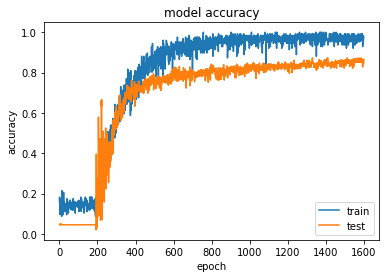

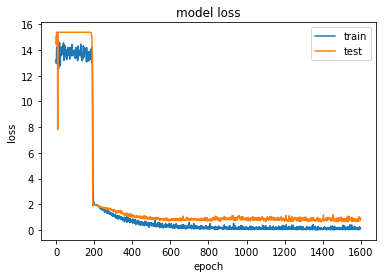

In [25]:
plt.plot(train_acc)
plt.plot(valid_acc)
plt.title('model accuracy')
plt.ylabel('accuracy')
plt.xlabel('epoch')
plt.legend(['train','test'], loc='lower right')
plt.show()

plt.plot(train_loss)
plt.plot(valid_loss)
plt.title('model loss')
plt.ylabel('loss')
plt.xlabel('epoch')
plt.legend(['train','test'], loc='upper right')
plt.show()

# Increasing Epochs to 3200

In [27]:
h = []

v =[]

for i in range(3200):
    
    c1 = np.random.randint(0,np.shape(d1_train)[0],18)
    c2 = np.random.randint(0,np.shape(d2_train)[0],18)
    c3 = np.random.randint(0,np.shape(d3_train)[0],18)
    c4 = np.random.randint(0,np.shape(d4_train)[0],18)
    c5 = np.random.randint(0,np.shape(d5_train)[0],18)
    c6 = np.random.randint(0,np.shape(d6_train)[0],18)
    c7 = np.random.randint(0,np.shape(d7_train)[0],18)
    
    x1 = d1_train[c1] 
    x2 = d2_train[c2] 
    x3 = d3_train[c3] 
    x4 = d4_train[c4] 
    x5 = d5_train[c5] 
    x6 = d6_train[c6] 
    x7 = d7_train[c7] 
    
    y1 = l1_train
    y2 = l2_train 
    y3 = l3_train 
    y4 = l4_train 
    y5 = l5_train 
    y6 = l6_train 
    y7 = l7_train
    
    y1 = np_utils.to_categorical(y1, 7)
    y2 = np_utils.to_categorical(y2, 7)
    y3 = np_utils.to_categorical(y3, 7)
    y4 = np_utils.to_categorical(y4, 7)
    y5 = np_utils.to_categorical(y5, 7)
    y6 = np_utils.to_categorical(y6, 7)
    y7 = np_utils.to_categorical(y7, 7)
    
    y1 = y1[c1] 
    y2 = y2[c2] 
    y3 = y3[c3] 
    y4 = y4[c4] 
    y5 = y5[c5] 
    y6 = y6[c6] 
    y7 = y7[c7] 
    
    x_train = []

    x_train.append(x1)
    x_train.append(x2)
    x_train.append(x3)
    x_train.append(x4)
    x_train.append(x5)
    x_train.append(x6)
    x_train.append(x7)

    y_train = []
    
    y_train.append(y1)
    y_train.append(y2)
    y_train.append(y3)
    y_train.append(y4)
    y_train.append(y5)
    y_train.append(y6)
    y_train.append(y7)
    
    X_train = []

    for i in range(np.shape(x_train)[0]):
    
        for j in range(np.shape(x_train[i])[0]):
        
            X_train.append(x_train[i][j])
        
    Y_train = []

    for i in range(np.shape(y_train)[0]):
    
        for j in range(np.shape(y_train[i])[0]):
        
            Y_train.append(y_train[i][j]) 
        
    
    X_train = np.asarray(X_train)
    Y_train = np.asarray(Y_train)
    
    
    history = model.fit(X_train,Y_train,epochs=1)
    [loss,acc] = model.evaluate(X_valid,Y_valid)
    h.append(history)
    v.append((loss,acc))

Epoch 1/1
354/354 [==============================] - 0s 1ms/step
Epoch 1/1
354/354 [==============================] - 0s 826us/step
Epoch 1/1
354/354 [==============================] - 0s 835us/step
Epoch 1/1
354/354 [==============================] - 0s 832us/step
Epoch 1/1
354/354 [==============================] - 0s 837us/step
Epoch 1/1
354/354 [==============================] - 0s 865us/step
Epoch 1/1
354/354 [==============================] - 0s 868us/step
Epoch 1/1
354/354 [==============================] - 0s 875us/step
Epoch 1/1
354/354 [==============================] - 0s 829us/step
Epoch 1/1
354/354 [==============================] - 0s 896us/step
Epoch 1/1
354/354 [==============================] - 0s 871us/step
Epoch 1/1
354/354 [==============================] - 0s 873us/step
Epoch 1/1
354/354 [==============================] - 0s 893us/step
Epoch 1/1
354/354 [==============================] - 0s 820us/step
Epoch 1/1
354/354 [==============================] - 0s 857us/st

Epoch 1/1
354/354 [==============================] - 0s 744us/step
Epoch 1/1
354/354 [==============================] - 0s 736us/step
Epoch 1/1
354/354 [==============================] - 0s 739us/step
Epoch 1/1
354/354 [==============================] - 0s 744us/step
Epoch 1/1
354/354 [==============================] - 0s 743us/step
Epoch 1/1
354/354 [==============================] - 0s 744us/step
Epoch 1/1
354/354 [==============================] - 0s 745us/step
Epoch 1/1
354/354 [==============================] - 0s 743us/step
Epoch 1/1
354/354 [==============================] - 0s 797us/step
Epoch 1/1
354/354 [==============================] - 0s 971us/step
Epoch 1/1
354/354 [==============================] - 0s 978us/step
Epoch 1/1
354/354 [==============================] - 0s 934us/step
Epoch 1/1
354/354 [==============================] - 0s 820us/step
Epoch 1/1
354/354 [==============================] - 0s 765us/step
Epoch 1/1
354/354 [==============================] - 0s 839us/

354/354 [==============================] - 0s 721us/step
Epoch 1/1
354/354 [==============================] - 0s 728us/step
Epoch 1/1
354/354 [==============================] - 0s 729us/step
Epoch 1/1
354/354 [==============================] - 0s 731us/step
Epoch 1/1
354/354 [==============================] - 0s 724us/step
Epoch 1/1
354/354 [==============================] - 0s 732us/step
Epoch 1/1
354/354 [==============================] - 0s 735us/step
Epoch 1/1
354/354 [==============================] - 0s 749us/step
Epoch 1/1
354/354 [==============================] - 0s 735us/step
Epoch 1/1
354/354 [==============================] - 0s 827us/step
Epoch 1/1
354/354 [==============================] - 0s 860us/step
Epoch 1/1
354/354 [==============================] - 0s 741us/step
Epoch 1/1
354/354 [==============================] - 0s 721us/step
Epoch 1/1
354/354 [==============================] - 0s 862us/step
Epoch 1/1
354/354 [==============================] - 0s 779us/step
Epoch

354/354 [==============================] - 0s 739us/step
Epoch 1/1
354/354 [==============================] - 0s 718us/step
Epoch 1/1
354/354 [==============================] - 0s 746us/step
Epoch 1/1
354/354 [==============================] - 0s 732us/step
Epoch 1/1
354/354 [==============================] - 0s 750us/step
Epoch 1/1
354/354 [==============================] - 0s 707us/step
Epoch 1/1
354/354 [==============================] - 0s 727us/step
Epoch 1/1
354/354 [==============================] - 0s 724us/step
Epoch 1/1
354/354 [==============================] - 0s 727us/step
Epoch 1/1
354/354 [==============================] - 0s 726us/step
Epoch 1/1
354/354 [==============================] - 0s 760us/step
Epoch 1/1
354/354 [==============================] - 0s 762us/step
Epoch 1/1
354/354 [==============================] - 0s 731us/step
Epoch 1/1
354/354 [==============================] - 0s 704us/step
Epoch 1/1
354/354 [==============================] - 0s 764us/step
Epoch

354/354 [==============================] - 0s 855us/step
Epoch 1/1
354/354 [==============================] - 0s 865us/step
Epoch 1/1
354/354 [==============================] - 0s 883us/step
Epoch 1/1
354/354 [==============================] - 0s 901us/step
Epoch 1/1
354/354 [==============================] - 0s 863us/step
Epoch 1/1
354/354 [==============================] - 0s 866us/step
Epoch 1/1
354/354 [==============================] - 0s 855us/step
Epoch 1/1
354/354 [==============================] - 0s 862us/step
Epoch 1/1
354/354 [==============================] - 0s 862us/step
Epoch 1/1
354/354 [==============================] - 0s 817us/step
Epoch 1/1
354/354 [==============================] - 0s 881us/step
Epoch 1/1
354/354 [==============================] - 0s 861us/step
Epoch 1/1
354/354 [==============================] - 0s 859us/step
Epoch 1/1
354/354 [==============================] - 0s 874us/step
Epoch 1/1
354/354 [==============================] - 0s 875us/step
Epoch

354/354 [==============================] - 0s 715us/step
Epoch 1/1
354/354 [==============================] - 0s 712us/step
Epoch 1/1
354/354 [==============================] - 0s 724us/step
Epoch 1/1
354/354 [==============================] - 0s 705us/step
Epoch 1/1
354/354 [==============================] - 0s 713us/step
Epoch 1/1
354/354 [==============================] - 0s 691us/step
Epoch 1/1
354/354 [==============================] - 0s 724us/step
Epoch 1/1
354/354 [==============================] - 0s 804us/step
Epoch 1/1
354/354 [==============================] - 0s 841us/step
Epoch 1/1
354/354 [==============================] - 0s 733us/step
Epoch 1/1
354/354 [==============================] - 0s 833us/step
Epoch 1/1
354/354 [==============================] - 0s 851us/step
Epoch 1/1
354/354 [==============================] - 0s 803us/step
Epoch 1/1
354/354 [==============================] - 0s 770us/step
Epoch 1/1
354/354 [==============================] - 0s 859us/step
Epoch

354/354 [==============================] - 0s 819us/step
Epoch 1/1
354/354 [==============================] - 0s 718us/step
Epoch 1/1
354/354 [==============================] - 0s 716us/step
Epoch 1/1
354/354 [==============================] - 0s 805us/step
Epoch 1/1
354/354 [==============================] - 0s 833us/step
Epoch 1/1
354/354 [==============================] - 0s 712us/step
Epoch 1/1
354/354 [==============================] - 0s 741us/step
Epoch 1/1
354/354 [==============================] - 0s 740us/step
Epoch 1/1
354/354 [==============================] - 0s 723us/step
Epoch 1/1
354/354 [==============================] - 0s 696us/step
Epoch 1/1
354/354 [==============================] - 0s 749us/step
Epoch 1/1
354/354 [==============================] - 0s 732us/step
Epoch 1/1
354/354 [==============================] - 0s 709us/step
Epoch 1/1
354/354 [==============================] - 0s 728us/step
Epoch 1/1
354/354 [==============================] - 0s 735us/step
Epoch

354/354 [==============================] - 0s 710us/step
Epoch 1/1
354/354 [==============================] - 0s 765us/step
Epoch 1/1
354/354 [==============================] - 0s 874us/step
Epoch 1/1
354/354 [==============================] - 0s 740us/step
Epoch 1/1
354/354 [==============================] - 0s 704us/step
Epoch 1/1
354/354 [==============================] - 0s 829us/step
Epoch 1/1
354/354 [==============================] - 0s 811us/step
Epoch 1/1
354/354 [==============================] - 0s 744us/step
Epoch 1/1
354/354 [==============================] - 0s 724us/step
Epoch 1/1
354/354 [==============================] - 0s 725us/step
Epoch 1/1
354/354 [==============================] - 0s 732us/step
Epoch 1/1
354/354 [==============================] - 0s 726us/step
Epoch 1/1
354/354 [==============================] - 0s 733us/step
Epoch 1/1
354/354 [==============================] - 0s 718us/step
Epoch 1/1
354/354 [==============================] - 0s 719us/step
Epoch

354/354 [==============================] - 0s 729us/step
Epoch 1/1
354/354 [==============================] - 0s 748us/step
Epoch 1/1
354/354 [==============================] - 0s 731us/step
Epoch 1/1
354/354 [==============================] - 0s 729us/step
Epoch 1/1
354/354 [==============================] - 0s 729us/step
Epoch 1/1
354/354 [==============================] - 0s 736us/step
Epoch 1/1
354/354 [==============================] - 0s 734us/step
Epoch 1/1
354/354 [==============================] - 0s 745us/step
Epoch 1/1
354/354 [==============================] - 0s 755us/step
Epoch 1/1
354/354 [==============================] - 0s 748us/step
Epoch 1/1
354/354 [==============================] - 0s 730us/step
Epoch 1/1
354/354 [==============================] - 0s 727us/step
Epoch 1/1
354/354 [==============================] - 0s 738us/step
Epoch 1/1
354/354 [==============================] - 0s 728us/step
Epoch 1/1
354/354 [==============================] - 0s 737us/step
Epoch

354/354 [==============================] - 0s 723us/step
Epoch 1/1
354/354 [==============================] - 0s 734us/step
Epoch 1/1
354/354 [==============================] - 0s 740us/step
Epoch 1/1
354/354 [==============================] - 0s 724us/step
Epoch 1/1
354/354 [==============================] - 0s 718us/step
Epoch 1/1
354/354 [==============================] - 0s 723us/step
Epoch 1/1
354/354 [==============================] - 0s 729us/step
Epoch 1/1
354/354 [==============================] - 0s 731us/step
Epoch 1/1
354/354 [==============================] - 0s 726us/step
Epoch 1/1
354/354 [==============================] - 0s 756us/step
Epoch 1/1
354/354 [==============================] - 0s 714us/step
Epoch 1/1
354/354 [==============================] - 0s 726us/step
Epoch 1/1
354/354 [==============================] - 0s 810us/step
Epoch 1/1
354/354 [==============================] - 0s 858us/step
Epoch 1/1
354/354 [==============================] - 0s 724us/step
Epoch

354/354 [==============================] - 0s 723us/step
Epoch 1/1
354/354 [==============================] - 0s 833us/step
Epoch 1/1
354/354 [==============================] - 0s 745us/step
Epoch 1/1
354/354 [==============================] - 0s 760us/step
Epoch 1/1
354/354 [==============================] - 0s 737us/step
Epoch 1/1
354/354 [==============================] - 0s 962us/step
Epoch 1/1
354/354 [==============================] - 0s 828us/step
Epoch 1/1
354/354 [==============================] - 0s 882us/step
Epoch 1/1
354/354 [==============================] - 0s 768us/step
Epoch 1/1
354/354 [==============================] - 0s 853us/step
Epoch 1/1
354/354 [==============================] - 0s 721us/step
Epoch 1/1
354/354 [==============================] - 0s 790us/step
Epoch 1/1
354/354 [==============================] - 0s 698us/step
Epoch 1/1
354/354 [==============================] - 0s 724us/step
Epoch 1/1
354/354 [==============================] - 0s 718us/step
Epoch

354/354 [==============================] - 0s 726us/step
Epoch 1/1
354/354 [==============================] - 0s 729us/step
Epoch 1/1
354/354 [==============================] - 0s 721us/step
Epoch 1/1
354/354 [==============================] - 0s 726us/step
Epoch 1/1
354/354 [==============================] - 0s 688us/step
Epoch 1/1
354/354 [==============================] - 0s 712us/step
Epoch 1/1
354/354 [==============================] - 0s 726us/step
Epoch 1/1
354/354 [==============================] - 0s 721us/step
Epoch 1/1
354/354 [==============================] - 0s 721us/step
Epoch 1/1
354/354 [==============================] - 0s 722us/step
Epoch 1/1
354/354 [==============================] - 0s 716us/step
Epoch 1/1
354/354 [==============================] - 0s 722us/step
Epoch 1/1
354/354 [==============================] - 0s 731us/step
Epoch 1/1
354/354 [==============================] - 0s 729us/step
Epoch 1/1
354/354 [==============================] - 0s 818us/step
Epoch

354/354 [==============================] - 0s 846us/step
Epoch 1/1
354/354 [==============================] - 0s 894us/step
Epoch 1/1
354/354 [==============================] - 0s 926us/step
Epoch 1/1
354/354 [==============================] - 0s 755us/step
Epoch 1/1
354/354 [==============================] - 0s 872us/step
Epoch 1/1
354/354 [==============================] - 0s 872us/step
Epoch 1/1
354/354 [==============================] - 0s 770us/step
Epoch 1/1
354/354 [==============================] - 0s 718us/step
Epoch 1/1
354/354 [==============================] - 0s 726us/step
Epoch 1/1
354/354 [==============================] - 0s 781us/step
Epoch 1/1
354/354 [==============================] - 0s 963us/step
Epoch 1/1
354/354 [==============================] - 0s 717us/step
Epoch 1/1
354/354 [==============================] - 0s 731us/step
Epoch 1/1
354/354 [==============================] - 0s 707us/step
Epoch 1/1
354/354 [==============================] - 0s 747us/step
Epoch

354/354 [==============================] - 0s 726us/step
Epoch 1/1
354/354 [==============================] - 0s 735us/step
Epoch 1/1
354/354 [==============================] - 0s 722us/step
Epoch 1/1
354/354 [==============================] - 0s 726us/step
Epoch 1/1
354/354 [==============================] - 0s 726us/step
Epoch 1/1
354/354 [==============================] - 0s 730us/step
Epoch 1/1
354/354 [==============================] - 0s 733us/step
Epoch 1/1
354/354 [==============================] - 0s 735us/step
Epoch 1/1
354/354 [==============================] - 0s 721us/step
Epoch 1/1
354/354 [==============================] - 0s 742us/step
Epoch 1/1
354/354 [==============================] - 0s 734us/step
Epoch 1/1
354/354 [==============================] - 0s 724us/step
Epoch 1/1
354/354 [==============================] - 0s 730us/step
Epoch 1/1
354/354 [==============================] - 0s 720us/step
Epoch 1/1
354/354 [==============================] - 0s 726us/step
Epoch

354/354 [==============================] - 0s 872us/step
Epoch 1/1
354/354 [==============================] - 0s 917us/step
Epoch 1/1
354/354 [==============================] - 0s 772us/step
Epoch 1/1
354/354 [==============================] - 0s 775us/step
Epoch 1/1
354/354 [==============================] - 0s 839us/step
Epoch 1/1
354/354 [==============================] - 0s 845us/step
Epoch 1/1
354/354 [==============================] - 0s 847us/step
Epoch 1/1
354/354 [==============================] - 0s 943us/step
Epoch 1/1
354/354 [==============================] - 0s 830us/step
Epoch 1/1
354/354 [==============================] - 0s 814us/step
Epoch 1/1
354/354 [==============================] - 0s 835us/step
Epoch 1/1
354/354 [==============================] - 0s 839us/step
Epoch 1/1
354/354 [==============================] - 0s 829us/step
Epoch 1/1
354/354 [==============================] - 0s 835us/step
Epoch 1/1
354/354 [==============================] - 0s 843us/step
Epoch

354/354 [==============================] - 0s 725us/step
Epoch 1/1
354/354 [==============================] - 0s 729us/step
Epoch 1/1
354/354 [==============================] - 0s 729us/step
Epoch 1/1
354/354 [==============================] - 0s 734us/step
Epoch 1/1
354/354 [==============================] - 0s 728us/step
Epoch 1/1
354/354 [==============================] - 0s 722us/step
Epoch 1/1
354/354 [==============================] - 0s 724us/step
Epoch 1/1
354/354 [==============================] - 0s 729us/step
Epoch 1/1
354/354 [==============================] - 0s 724us/step
Epoch 1/1
354/354 [==============================] - 0s 725us/step
Epoch 1/1
354/354 [==============================] - 0s 726us/step
Epoch 1/1
354/354 [==============================] - 0s 732us/step
Epoch 1/1
354/354 [==============================] - 0s 728us/step
Epoch 1/1
354/354 [==============================] - 0s 720us/step
Epoch 1/1
354/354 [==============================] - 0s 727us/step
Epoch

354/354 [==============================] - 0s 724us/step
Epoch 1/1
354/354 [==============================] - 0s 784us/step
Epoch 1/1
354/354 [==============================] - 0s 855us/step
Epoch 1/1
354/354 [==============================] - 0s 889us/step
Epoch 1/1
354/354 [==============================] - 0s 832us/step
Epoch 1/1
354/354 [==============================] - 0s 732us/step
Epoch 1/1
354/354 [==============================] - 0s 764us/step
Epoch 1/1
354/354 [==============================] - 0s 736us/step
Epoch 1/1
354/354 [==============================] - 0s 742us/step
Epoch 1/1
354/354 [==============================] - 0s 843us/step
Epoch 1/1
354/354 [==============================] - 0s 868us/step
Epoch 1/1
354/354 [==============================] - 0s 779us/step
Epoch 1/1
354/354 [==============================] - 0s 827us/step
Epoch 1/1
354/354 [==============================] - 0s 733us/step
Epoch 1/1
354/354 [==============================] - 0s 772us/step
Epoch

354/354 [==============================] - 0s 794us/step
Epoch 1/1
354/354 [==============================] - 0s 723us/step
Epoch 1/1
354/354 [==============================] - 0s 733us/step
Epoch 1/1
354/354 [==============================] - 0s 730us/step
Epoch 1/1
354/354 [==============================] - 0s 809us/step
Epoch 1/1
354/354 [==============================] - 0s 883us/step
Epoch 1/1
354/354 [==============================] - 0s 739us/step
Epoch 1/1
354/354 [==============================] - 0s 885us/step
Epoch 1/1
354/354 [==============================] - 0s 887us/step
Epoch 1/1
354/354 [==============================] - 0s 954us/step
Epoch 1/1
354/354 [==============================] - 0s 865us/step
Epoch 1/1
354/354 [==============================] - 0s 687us/step
Epoch 1/1
354/354 [==============================] - 0s 811us/step
Epoch 1/1
354/354 [==============================] - 0s 853us/step
Epoch 1/1
354/354 [==============================] - 0s 820us/step
Epoch

354/354 [==============================] - 0s 745us/step
Epoch 1/1
354/354 [==============================] - 0s 746us/step
Epoch 1/1
354/354 [==============================] - 0s 747us/step
Epoch 1/1
354/354 [==============================] - 0s 757us/step
Epoch 1/1
354/354 [==============================] - 0s 740us/step
Epoch 1/1
354/354 [==============================] - 0s 727us/step
Epoch 1/1
354/354 [==============================] - 0s 731us/step
Epoch 1/1
354/354 [==============================] - 0s 729us/step
Epoch 1/1
354/354 [==============================] - 0s 731us/step
Epoch 1/1
354/354 [==============================] - 0s 751us/step
Epoch 1/1
354/354 [==============================] - 0s 729us/step
Epoch 1/1
354/354 [==============================] - 0s 732us/step
Epoch 1/1
354/354 [==============================] - 0s 721us/step
Epoch 1/1
354/354 [==============================] - 0s 725us/step
Epoch 1/1
354/354 [==============================] - 0s 731us/step
Epoch

354/354 [==============================] - 0s 714us/step
Epoch 1/1
354/354 [==============================] - 0s 749us/step
Epoch 1/1
354/354 [==============================] - 0s 886us/step
Epoch 1/1
354/354 [==============================] - 0s 838us/step
Epoch 1/1
354/354 [==============================] - 0s 730us/step
Epoch 1/1
354/354 [==============================] - 0s 747us/step
Epoch 1/1
354/354 [==============================] - 0s 728us/step
Epoch 1/1
354/354 [==============================] - 0s 736us/step
Epoch 1/1
354/354 [==============================] - 0s 727us/step
Epoch 1/1
354/354 [==============================] - 0s 731us/step
Epoch 1/1
354/354 [==============================] - 0s 759us/step
Epoch 1/1
354/354 [==============================] - 0s 735us/step
Epoch 1/1
354/354 [==============================] - 0s 771us/step
Epoch 1/1
354/354 [==============================] - 0s 814us/step
Epoch 1/1
354/354 [==============================] - 0s 883us/step
Epoch

354/354 [==============================] - 0s 739us/step
Epoch 1/1
354/354 [==============================] - 0s 739us/step
Epoch 1/1
354/354 [==============================] - 0s 757us/step
Epoch 1/1
354/354 [==============================] - 0s 747us/step
Epoch 1/1
354/354 [==============================] - 0s 729us/step
Epoch 1/1
354/354 [==============================] - 0s 735us/step
Epoch 1/1
354/354 [==============================] - 0s 738us/step
Epoch 1/1
354/354 [==============================] - 0s 773us/step
Epoch 1/1
354/354 [==============================] - 0s 779us/step
Epoch 1/1
354/354 [==============================] - 0s 766us/step
Epoch 1/1
354/354 [==============================] - 0s 727us/step
Epoch 1/1
354/354 [==============================] - 0s 764us/step
Epoch 1/1
354/354 [==============================] - 0s 729us/step
Epoch 1/1
354/354 [==============================] - 0s 728us/step
Epoch 1/1
354/354 [==============================] - 0s 737us/step
Epoch

354/354 [==============================] - 0s 754us/step
Epoch 1/1
354/354 [==============================] - 0s 1ms/step
Epoch 1/1
354/354 [==============================] - 0s 839us/step
Epoch 1/1
354/354 [==============================] - 0s 739us/step
Epoch 1/1
354/354 [==============================] - 0s 786us/step
Epoch 1/1
354/354 [==============================] - 0s 934us/step
Epoch 1/1
354/354 [==============================] - ETA:  - 0s 815us/step
Epoch 1/1
354/354 [==============================] - 0s 928us/step
Epoch 1/1
354/354 [==============================] - 0s 1ms/step
Epoch 1/1
354/354 [==============================] - 0s 730us/step
Epoch 1/1
354/354 [==============================] - 0s 727us/step
Epoch 1/1
354/354 [==============================] - 0s 815us/step
Epoch 1/1
354/354 [==============================] - 0s 841us/step
Epoch 1/1
354/354 [==============================] - 0s 865us/step
Epoch 1/1
354/354 [==============================] - 0s 737us/step
E

354/354 [==============================] - 0s 822us/step
Epoch 1/1
354/354 [==============================] - 0s 751us/step
Epoch 1/1
354/354 [==============================] - 0s 761us/step
Epoch 1/1
354/354 [==============================] - 0s 886us/step
Epoch 1/1
354/354 [==============================] - 0s 848us/step
Epoch 1/1
354/354 [==============================] - 0s 752us/step
Epoch 1/1
354/354 [==============================] - 0s 749us/step
Epoch 1/1
354/354 [==============================] - 0s 754us/step
Epoch 1/1
354/354 [==============================] - 0s 817us/step
Epoch 1/1
354/354 [==============================] - 0s 872us/step
Epoch 1/1
354/354 [==============================] - 0s 747us/step
Epoch 1/1
354/354 [==============================] - 0s 750us/step
Epoch 1/1
354/354 [==============================] - 0s 744us/step
Epoch 1/1
354/354 [==============================] - 0s 771us/step
Epoch 1/1
354/354 [==============================] - 0s 752us/step
Epoch

354/354 [==============================] - 0s 787us/step
Epoch 1/1
354/354 [==============================] - 0s 741us/step
Epoch 1/1
354/354 [==============================] - 0s 757us/step
Epoch 1/1
354/354 [==============================] - 0s 740us/step
Epoch 1/1
354/354 [==============================] - 0s 743us/step
Epoch 1/1
354/354 [==============================] - 0s 867us/step
Epoch 1/1
354/354 [==============================] - 0s 796us/step
Epoch 1/1
354/354 [==============================] - 0s 860us/step
Epoch 1/1
354/354 [==============================] - 0s 870us/step
Epoch 1/1
354/354 [==============================] - 0s 873us/step
Epoch 1/1
354/354 [==============================] - 0s 766us/step
Epoch 1/1
354/354 [==============================] - 0s 753us/step
Epoch 1/1
354/354 [==============================] - 0s 865us/step
Epoch 1/1
354/354 [==============================] - 0s 785us/step
Epoch 1/1
354/354 [==============================] - 0s 756us/step
Epoch

354/354 [==============================] - 0s 762us/step
Epoch 1/1
354/354 [==============================] - 0s 751us/step
Epoch 1/1
354/354 [==============================] - 0s 775us/step
Epoch 1/1
354/354 [==============================] - 0s 889us/step
Epoch 1/1
354/354 [==============================] - 0s 1ms/step
Epoch 1/1
354/354 [==============================] - 0s 743us/step
Epoch 1/1
354/354 [==============================] - 0s 745us/step
Epoch 1/1
354/354 [==============================] - 0s 747us/step
Epoch 1/1
354/354 [==============================] - 0s 817us/step
Epoch 1/1
354/354 [==============================] - 0s 793us/step
Epoch 1/1
354/354 [==============================] - 0s 835us/step
Epoch 1/1
354/354 [==============================] - 0s 801us/step
Epoch 1/1
354/354 [==============================] - 0s 863us/step
Epoch 1/1
354/354 [==============================] - 0s 807us/step
Epoch 1/1
354/354 [==============================] - 0s 1ms/step
Epoch 1/1

354/354 [==============================] - 0s 1ms/step
Epoch 1/1
354/354 [==============================] - 0s 803us/step
Epoch 1/1
354/354 [==============================] - 0s 985us/step
Epoch 1/1
354/354 [==============================] - 0s 753us/step
Epoch 1/1
354/354 [==============================] - 0s 742us/step
Epoch 1/1
354/354 [==============================] - 0s 760us/step
Epoch 1/1
354/354 [==============================] - 0s 874us/step
Epoch 1/1
354/354 [==============================] - 0s 860us/step
Epoch 1/1
354/354 [==============================] - 0s 856us/step
Epoch 1/1
354/354 [==============================] - 0s 766us/step
Epoch 1/1
354/354 [==============================] - 0s 764us/step
Epoch 1/1
354/354 [==============================] - 0s 885us/step
Epoch 1/1
354/354 [==============================] - 0s 811us/step
Epoch 1/1
354/354 [==============================] - 0s 818us/step
Epoch 1/1
354/354 [==============================] - 0s 889us/step
Epoch 1

Epoch 1/1
354/354 [==============================] - 0s 784us/step
Epoch 1/1
354/354 [==============================] - 0s 803us/step
Epoch 1/1
354/354 [==============================] - 0s 878us/step
Epoch 1/1
354/354 [==============================] - 0s 765us/step
Epoch 1/1
354/354 [==============================] - 0s 757us/step
Epoch 1/1
354/354 [==============================] - 0s 802us/step
Epoch 1/1
354/354 [==============================] - 0s 874us/step
Epoch 1/1
354/354 [==============================] - 0s 808us/step
Epoch 1/1
354/354 [==============================] - 0s 823us/step
Epoch 1/1
354/354 [==============================] - 0s 838us/step
Epoch 1/1
354/354 [==============================] - 0s 861us/step
Epoch 1/1
354/354 [==============================] - 0s 740us/step
Epoch 1/1
354/354 [==============================] - 0s 863us/step
Epoch 1/1
354/354 [==============================] - 0s 838us/step
Epoch 1/1
354/354 [==============================] - 0s 786us/

354/354 [==============================] - 0s 785us/step
Epoch 1/1
354/354 [==============================] - 0s 745us/step
Epoch 1/1
354/354 [==============================] - 0s 752us/step
Epoch 1/1
354/354 [==============================] - 0s 752us/step
Epoch 1/1
354/354 [==============================] - 0s 761us/step
Epoch 1/1
354/354 [==============================] - 0s 752us/step
Epoch 1/1
354/354 [==============================] - 0s 760us/step
Epoch 1/1
354/354 [==============================] - 0s 756us/step
Epoch 1/1
354/354 [==============================] - 0s 740us/step
Epoch 1/1
354/354 [==============================] - 0s 757us/step
Epoch 1/1
354/354 [==============================] - 0s 743us/step
Epoch 1/1
354/354 [==============================] - 0s 753us/step
Epoch 1/1
354/354 [==============================] - 0s 748us/step
Epoch 1/1
354/354 [==============================] - 0s 747us/step
Epoch 1/1
354/354 [==============================] - 0s 751us/step
Epoch

354/354 [==============================] - 0s 748us/step
Epoch 1/1
354/354 [==============================] - 0s 738us/step
Epoch 1/1
354/354 [==============================] - 0s 736us/step
Epoch 1/1
354/354 [==============================] - 0s 738us/step
Epoch 1/1
354/354 [==============================] - 0s 735us/step
Epoch 1/1
354/354 [==============================] - 0s 735us/step
Epoch 1/1
354/354 [==============================] - 0s 735us/step
Epoch 1/1
354/354 [==============================] - 0s 738us/step
Epoch 1/1
354/354 [==============================] - 0s 734us/step
Epoch 1/1
354/354 [==============================] - 0s 749us/step
Epoch 1/1
354/354 [==============================] - 0s 733us/step
Epoch 1/1
354/354 [==============================] - 0s 718us/step
Epoch 1/1
354/354 [==============================] - 0s 713us/step
Epoch 1/1
354/354 [==============================] - 0s 784us/step
Epoch 1/1
354/354 [==============================] - 0s 812us/step
Epoch

354/354 [==============================] - 0s 728us/step
Epoch 1/1
354/354 [==============================] - 0s 739us/step
Epoch 1/1
354/354 [==============================] - 0s 741us/step
Epoch 1/1
354/354 [==============================] - 0s 745us/step
Epoch 1/1
354/354 [==============================] - 0s 738us/step
Epoch 1/1
354/354 [==============================] - 0s 741us/step
Epoch 1/1
354/354 [==============================] - 0s 735us/step
Epoch 1/1
354/354 [==============================] - 0s 740us/step
Epoch 1/1
354/354 [==============================] - 0s 736us/step
Epoch 1/1
354/354 [==============================] - 0s 732us/step
Epoch 1/1
354/354 [==============================] - 0s 725us/step
Epoch 1/1
354/354 [==============================] - 0s 733us/step
Epoch 1/1
354/354 [==============================] - 0s 736us/step
Epoch 1/1
354/354 [==============================] - 0s 735us/step
Epoch 1/1
354/354 [==============================] - 0s 733us/step
Epoch

354/354 [==============================] - 0s 844us/step
Epoch 1/1
354/354 [==============================] - 0s 870us/step
Epoch 1/1
354/354 [==============================] - 0s 767us/step
Epoch 1/1
354/354 [==============================] - 0s 718us/step
Epoch 1/1
354/354 [==============================] - 0s 732us/step
Epoch 1/1
354/354 [==============================] - 0s 714us/step
Epoch 1/1
354/354 [==============================] - 0s 827us/step
Epoch 1/1
354/354 [==============================] - 0s 786us/step
Epoch 1/1
354/354 [==============================] - 0s 732us/step
Epoch 1/1
354/354 [==============================] - 0s 858us/step
Epoch 1/1
354/354 [==============================] - 0s 742us/step
Epoch 1/1
354/354 [==============================] - 0s 732us/step
Epoch 1/1
354/354 [==============================] - 0s 871us/step
Epoch 1/1
354/354 [==============================] - 0s 873us/step
Epoch 1/1
354/354 [==============================] - 0s 726us/step
Epoch

In [28]:
[loss, acc] = model.evaluate(X_test,Y_test)
print "Accuracy : ",acc

357/357 [==============================] - 0s 807us/step
Accuracy :  0.859943977925


In [29]:
train_loss = []
train_acc = []

valid_loss = []
valid_acc = []

for i in range(3200):

    train_loss.append(h[i].history['loss'])
    train_acc.append(h[i].history['acc'])
    
    valid_loss.append(v[i][0])
    valid_acc.append(v[i][1])
    
    

    

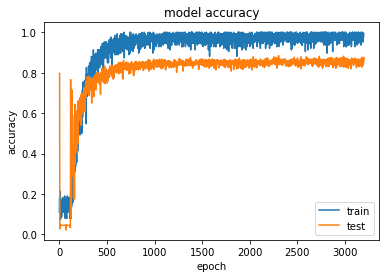

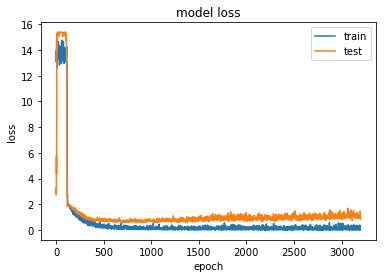

In [30]:
plt.plot(train_acc)
plt.plot(valid_acc)
plt.title('model accuracy')
plt.ylabel('accuracy')
plt.xlabel('epoch')
plt.legend(['train','test'], loc='lower right')
plt.show()

plt.plot(train_loss)
plt.plot(valid_loss)
plt.title('model loss')
plt.ylabel('loss')
plt.xlabel('epoch')
plt.legend(['train','test'], loc='upper right')
plt.show()

# Classification Report

In [48]:
Y_test = np.argmax(Y_test, axis=1)
y_pred = model.predict_classes(X_test)
print(classification_report(Y_test, y_pred))

              precision    recall  f1-score   support

           0       0.50      0.44      0.47        18
           1       0.79      0.69      0.73        16
           2       0.82      0.82      0.82        11
           3       0.42      0.67      0.52        12
           4       0.20      0.11      0.14         9
           5       0.93      0.94      0.93       282
           6       0.83      0.56      0.67         9

   micro avg       0.86      0.86      0.86       357
   macro avg       0.64      0.60      0.61       357
weighted avg       0.86      0.86      0.86       357



# Part 1 - Conclusion
## Training accuracy of 0.992%, test accuracy of 0.859% while validation accuracy of 0.867% has been achieved without using data augmentation while employing the same model which had provided 0.89% test accuracy on Cats and Dogs dataset. 
## The  model utilizes 1651 training examples while 354 for validation and 357 for test purposes and the results are achieved after training for 3200 epochs using categorical crossentropy as loss and accuracy as the metric with 5 convolution layers with 64, 64, 128, 128, 256 filters of 3x3 each, three dense layers with 256, 256 and 7 neurons respectively, dropout of 0.5 and rmsprop as the optimizer while using softmax instead of sigmoid

# Transfer Learning

# GoogleNet

In [11]:
x1 = d1_train
x2 = d2_train
x3 = d3_train
x4 = d4_train
x5 = d5_train
x6 = d6_train
x7 = d7_train
    
y1 = l1_train
y2 = l2_train
y3 = l3_train
y4 = l4_train
y5 = l5_train
y6 = l6_train
y7 = l7_train
    
y1 = np_utils.to_categorical(y1, 7)
y2 = np_utils.to_categorical(y2, 7)
y3 = np_utils.to_categorical(y3, 7)
y4 = np_utils.to_categorical(y4, 7)
y5 = np_utils.to_categorical(y5, 7)
y6 = np_utils.to_categorical(y6, 7)
y7 = np_utils.to_categorical(y7, 7)
    
    
x_train= []

x_train.append(x1)
x_train.append(x2)
x_train.append(x3)
x_train.append(x4)
x_train.append(x5)
x_train.append(x6)
x_train.append(x7)

y_train = []
    
y_train.append(y1)
y_train.append(y2)
y_train.append(y3)
y_train.append(y4)
y_train.append(y5)
y_train.append(y6)
y_train.append(y7)
    
X_train = []

for i in range(np.shape(x_train)[0]):
    
    for j in range(np.shape(x_train[i])[0]):
        
        X_train.append(x_train[i][j])
        
Y_train = []

for i in range(np.shape(y_train)[0]):
    
    for j in range(np.shape(y_train[i])[0]):
        
        Y_train.append(y_train[i][j]) 
        
    
X_train = np.asarray(X_train)
Y_train = np.asarray(Y_train)


In [12]:
np.save('X_train.npy',X_train)
np.save('Y_train.npy',Y_train)
np.save('X_test.npy',X_test)
np.save('Y_test.npy',Y_test)
np.save('X_valid.npy',X_valid)
np.save('Y_valid.npy',Y_valid)

In [2]:
X_train = np.load('X_train.npy')
Y_train = np.load('Y_train.npy')
X_test = np.load('X_test.npy')
Y_test = np.load('Y_test.npy')
X_valid = np.load('X_valid.npy')
Y_valid = np.load('Y_valid.npy')

In [3]:
def conv2d_bn(x, nb_filter, nb_row, nb_col,
              border_mode='same', subsample=(1, 1), bias=False):
    """
    Utility function to apply conv + BN. 
    (Slightly modified from https://github.com/fchollet/keras/blob/master/keras/applications/inception_v3.py)
    """
    if K.image_dim_ordering() == "th":
        channel_axis = 1
    else:
        channel_axis = -1
    x = Convolution2D(nb_filter, nb_row, nb_col,
                      subsample=subsample,
                      border_mode=border_mode,
                      bias=bias)(x)
    x = BatchNormalization(axis=channel_axis)(x)
    x = Activation('relu')(x)
    return x

def block_inception_a(input):
    if K.image_dim_ordering() == "th":
        channel_axis = 1
    else:
        channel_axis = -1

    branch_0 = conv2d_bn(input, 96, 1, 1)

    branch_1 = conv2d_bn(input, 64, 1, 1)
    branch_1 = conv2d_bn(branch_1, 96, 3, 3)

    branch_2 = conv2d_bn(input, 64, 1, 1)
    branch_2 = conv2d_bn(branch_2, 96, 3, 3)
    branch_2 = conv2d_bn(branch_2, 96, 3, 3)

    branch_3 = AveragePooling2D((3,3), strides=(1,1), border_mode='same')(input)
    branch_3 = conv2d_bn(branch_3, 96, 1, 1)

    x = merge([branch_0, branch_1, branch_2, branch_3], mode='concat', concat_axis=channel_axis)
    return x


def block_reduction_a(input):
    if K.image_dim_ordering() == "th":
        channel_axis = 1
    else:
        channel_axis = -1

    branch_0 = conv2d_bn(input, 384, 3, 3, subsample=(2,2), border_mode='valid')

    branch_1 = conv2d_bn(input, 192, 1, 1)
    branch_1 = conv2d_bn(branch_1, 224, 3, 3)
    branch_1 = conv2d_bn(branch_1, 256, 3, 3, subsample=(2,2), border_mode='valid')

    branch_2 = MaxPooling2D((3,3), strides=(2,2), border_mode='valid')(input)

    x = merge([branch_0, branch_1, branch_2], mode='concat', concat_axis=channel_axis)
    return x


def block_inception_b(input):
    if K.image_dim_ordering() == "th":
        channel_axis = 1
    else:
        channel_axis = -1

    branch_0 = conv2d_bn(input, 384, 1, 1)

    branch_1 = conv2d_bn(input, 192, 1, 1)
    branch_1 = conv2d_bn(branch_1, 224, 1, 7)
    branch_1 = conv2d_bn(branch_1, 256, 7, 1)

    branch_2 = conv2d_bn(input, 192, 1, 1)
    branch_2 = conv2d_bn(branch_2, 192, 7, 1)
    branch_2 = conv2d_bn(branch_2, 224, 1, 7)
    branch_2 = conv2d_bn(branch_2, 224, 7, 1)
    branch_2 = conv2d_bn(branch_2, 256, 1, 7)

    branch_3 = AveragePooling2D((3,3), strides=(1,1), border_mode='same')(input)
    branch_3 = conv2d_bn(branch_3, 128, 1, 1)

    x = merge([branch_0, branch_1, branch_2, branch_3], mode='concat', concat_axis=channel_axis)
    return x


def block_reduction_b(input):
    if K.image_dim_ordering() == "th":
        channel_axis = 1
    else:
        channel_axis = -1

    branch_0 = conv2d_bn(input, 192, 1, 1)
    branch_0 = conv2d_bn(branch_0, 192, 3, 3, subsample=(2, 2), border_mode='valid')

    branch_1 = conv2d_bn(input, 256, 1, 1)
    branch_1 = conv2d_bn(branch_1, 256, 1, 7)
    branch_1 = conv2d_bn(branch_1, 320, 7, 1)
    branch_1 = conv2d_bn(branch_1, 320, 3, 3, subsample=(2,2), border_mode='valid')

    branch_2 = MaxPooling2D((3, 3), strides=(2, 2), border_mode='valid')(input)

    x = merge([branch_0, branch_1, branch_2], mode='concat', concat_axis=channel_axis)
    return x


def block_inception_c(input):
    if K.image_dim_ordering() == "th":
        channel_axis = 1
    else:
        channel_axis = -1

    branch_0 = conv2d_bn(input, 256, 1, 1)

    branch_1 = conv2d_bn(input, 384, 1, 1)
    branch_10 = conv2d_bn(branch_1, 256, 1, 3)
    branch_11 = conv2d_bn(branch_1, 256, 3, 1)
    branch_1 = merge([branch_10, branch_11], mode='concat', concat_axis=channel_axis)


    branch_2 = conv2d_bn(input, 384, 1, 1)
    branch_2 = conv2d_bn(branch_2, 448, 3, 1)
    branch_2 = conv2d_bn(branch_2, 512, 1, 3)
    branch_20 = conv2d_bn(branch_2, 256, 1, 3)
    branch_21 = conv2d_bn(branch_2, 256, 3, 1)
    branch_2 = merge([branch_20, branch_21], mode='concat', concat_axis=channel_axis)

    branch_3 = AveragePooling2D((3, 3), strides=(1, 1), border_mode='same')(input)
    branch_3 = conv2d_bn(branch_3, 256, 1, 1)

    x = merge([branch_0, branch_1, branch_2, branch_3], mode='concat', concat_axis=channel_axis)
    return x


def inception_v4_base(input):
    if K.image_dim_ordering() == "th":
        channel_axis = 1
    else:
        channel_axis = -1

    # Input Shape is 299 x 299 x 3 (th) or 3 x 299 x 299 (th)
    net = conv2d_bn(input, 32, 3, 3, subsample=(2,2), border_mode='valid')
    net = conv2d_bn(net, 32, 3, 3, border_mode='valid')
    net = conv2d_bn(net, 64, 3, 3)

    branch_0 = MaxPooling2D((3,3), strides=(2,2), border_mode='valid')(net)

    branch_1 = conv2d_bn(net, 96, 3, 3, subsample=(2,2), border_mode='valid')

    net = merge([branch_0, branch_1], mode='concat', concat_axis=channel_axis)

    branch_0 = conv2d_bn(net, 64, 1, 1)
    branch_0 = conv2d_bn(branch_0, 96, 3, 3, border_mode='valid')

    branch_1 = conv2d_bn(net, 64, 1, 1)
    branch_1 = conv2d_bn(branch_1, 64, 1, 7)
    branch_1 = conv2d_bn(branch_1, 64, 7, 1)
    branch_1 = conv2d_bn(branch_1, 96, 3, 3, border_mode='valid')

    net = merge([branch_0, branch_1], mode='concat', concat_axis=channel_axis)

    branch_0 = conv2d_bn(net, 192, 3, 3, subsample=(2,2), border_mode='valid')
    branch_1 = MaxPooling2D((3,3), strides=(2,2), border_mode='valid')(net)

    net = merge([branch_0, branch_1], mode='concat', concat_axis=channel_axis)

    # 35 x 35 x 384
    # 4 x Inception-A blocks
    for idx in xrange(4):
      net = block_inception_a(net)

    # 35 x 35 x 384
    # Reduction-A block
    net = block_reduction_a(net)

    # 17 x 17 x 1024
    # 7 x Inception-B blocks
    for idx in xrange(7):
      net = block_inception_b(net)

    # 17 x 17 x 1024
    # Reduction-B block
    net = block_reduction_b(net)

    # 8 x 8 x 1536
    # 3 x Inception-C blocks
    for idx in xrange(3):
      net = block_inception_c(net)

    return net


def inception_v4_model(img_rows, img_cols, color_type=1, num_classeses=None, dropout_keep_prob=0.2):
    '''
    Inception V4 Model for Keras

    Model Schema is based on
    https://github.com/kentsommer/keras-inceptionV4

    ImageNet Pretrained Weights 
    Theano: https://github.com/kentsommer/keras-inceptionV4/releases/download/2.0/inception-v4_weights_th_dim_ordering_th_kernels.h5
    TensorFlow: https://github.com/kentsommer/keras-inceptionV4/releases/download/2.0/inception-v4_weights_tf_dim_ordering_tf_kernels.h5

    Parameters:
      img_rows, img_cols - resolution of inputs
      channel - 1 for grayscale, 3 for color 
      num_classes - number of class labels for our classification task
    '''

    # Input Shape is 299 x 299 x 3 (tf) or 3 x 299 x 299 (th)
    if K.image_dim_ordering() == 'th':
        inputs = Input((3, 300, 300))
    else:
        inputs = Input((300, 300, 3))

    # Make inception base
    net = inception_v4_base(inputs)


    # Final pooling and prediction

    # 8 x 8 x 1536
    net_old = AveragePooling2D((8,8), border_mode='valid')(net)

    # 1 x 1 x 1536
    net_old = Dropout(dropout_keep_prob)(net_old)
    net_old = Flatten()(net_old)

    # 1536
    predictions = Dense(output_dim=1001, activation='softmax')(net_old)

    model = Model(inputs, predictions, name='inception_v4')

    if K.image_dim_ordering() == 'th':
      # Use pre-trained weights for Theano backend
      weights_path = './inception-v4_weights_th_dim_ordering_th_kernels.h5'
    else:
      # Use pre-trained weights for Tensorflow backend
      weights_path = './inception-v4_weights_tf_dim_ordering_tf_kernels.h5'

    model.load_weights(weights_path, by_name=True)

    # Truncate and replace softmax layer for transfer learning
    # Cannot use model.layers.pop() since model is not of Sequential() type
    # The method below works since pre-trained weights are stored in layers but not in the model
    net_ft = AveragePooling2D((8,8), border_mode='valid')(net)
    net_ft = Dropout(dropout_keep_prob)(net_ft)
    net_ft = Flatten()(net_ft)
    predictions_ft = Dense(output_dim=num_classes, activation='softmax')(net_ft)

    model = Model(inputs, predictions_ft, name='inception_v4')

    # Learning rate is changed to 0.001
    sgd = SGD(lr=1e-3, decay=1e-6, momentum=0.9, nesterov=True)
    model.compile(optimizer=sgd, loss='categorical_crossentropy', metrics=['accuracy'])

    return model

if __name__ == '__main__':

    # Example to fine-tune on 3000 samples from Cifar10

    img_rows, img_cols = 300, 300 # Resolution of inputs
    channel = 3
    num_classes = 7
    batch_size = 8
    nb_epoch = 10

    # Load Cifar10 data. Please implement your own load_data() module for your own dataset
    #X_train, Y_train, X_valid, Y_valid = load_cifar10_data(img_rows, img_cols)

    # Load our model
    model = inception_v4_model(img_rows, img_cols, channel, num_classes, dropout_keep_prob=0.2)

    # Start Fine-tuning
    history = model.fit(X_train, Y_train,
              batch_size=batch_size,
              nb_epoch=nb_epoch,
              shuffle=True,
              verbose=1,
              validation_data=(X_valid, Y_valid),
              )

    # Make predictions
    predictions_valid = model.predict(X_test, batch_size=batch_size, verbose=1)

    # Cross-entropy loss score
    score = log_loss(Y_test, predictions_valid)

/home/talha/anaconda/envs/conda_env/lib/python2.7/site-packages/ipykernel_launcher.py:14: UserWarning: Update your `Conv2D` call to the Keras 2 API: `Conv2D(32, (3, 3), padding="valid", strides=(2, 2), use_bias=False)`
  
/home/talha/anaconda/envs/conda_env/lib/python2.7/site-packages/ipykernel_launcher.py:14: UserWarning: Update your `Conv2D` call to the Keras 2 API: `Conv2D(32, (3, 3), padding="valid", strides=(1, 1), use_bias=False)`
  
/home/talha/anaconda/envs/conda_env/lib/python2.7/site-packages/ipykernel_launcher.py:14: UserWarning: Update your `Conv2D` call to the Keras 2 API: `Conv2D(64, (3, 3), padding="same", strides=(1, 1), use_bias=False)`
  
/home/talha/anaconda/envs/conda_env/lib/python2.7/site-packages/ipykernel_launcher.py:143: UserWarning: Update your `MaxPooling2D` call to the Keras 2 API: `MaxPooling2D((3, 3), padding="valid", strides=(2, 2))`
/home/talha/anaconda/envs/conda_env/lib/python2.7/site-packages/ipykernel_launcher.py:14: UserWarning: Update your `Conv2D`

/home/talha/anaconda/envs/conda_env/lib/python2.7/site-packages/ipykernel_launcher.py:14: UserWarning: Update your `Conv2D` call to the Keras 2 API: `Conv2D(256, (1, 3), padding="same", strides=(1, 1), use_bias=False)`
  
/home/talha/anaconda/envs/conda_env/lib/python2.7/site-packages/ipykernel_launcher.py:14: UserWarning: Update your `Conv2D` call to the Keras 2 API: `Conv2D(256, (3, 1), padding="same", strides=(1, 1), use_bias=False)`
  
/home/talha/anaconda/envs/conda_env/lib/python2.7/site-packages/ipykernel_launcher.py:115: UserWarning: The `merge` function is deprecated and will be removed after 08/2017. Use instead layers from `keras.layers.merge`, e.g. `add`, `concatenate`, etc.
/home/talha/anaconda/envs/conda_env/lib/python2.7/site-packages/ipykernel_launcher.py:14: UserWarning: Update your `Conv2D` call to the Keras 2 API: `Conv2D(448, (3, 1), padding="same", strides=(1, 1), use_bias=False)`
  
/home/talha/anaconda/envs/conda_env/lib/python2.7/site-packages/ipykernel_launcher

Train on 1651 samples, validate on 354 samples
Epoch 1/10
1651/1651 [==============================] - 226s 137ms/step - loss: 0.9325 - acc: 0.7910 - val_loss: 1.3801 - val_acc: 0.7966
Epoch 2/10
1651/1651 [==============================] - 226s 137ms/step - loss: 0.8822 - acc: 0.7874 - val_loss: 1.0624 - val_acc: 0.7486
Epoch 3/10
1651/1651 [==============================] - 204s 124ms/step - loss: 0.8254 - acc: 0.7910 - val_loss: 0.8449 - val_acc: 0.7825
Epoch 4/10
1651/1651 [==============================] - 204s 123ms/step - loss: 0.8215 - acc: 0.7844 - val_loss: 0.9179 - val_acc: 0.7966
Epoch 5/10
1651/1651 [==============================] - 172s 104ms/step - loss: 0.7889 - acc: 0.7862 - val_loss: 0.7757 - val_acc: 0.7910
Epoch 6/10
1651/1651 [==============================] - 175s 106ms/step - loss: 0.7534 - acc: 0.7892 - val_loss: 0.9712 - val_acc: 0.7994
Epoch 7/10
1651/1651 [==============================] - 175s 106ms/step - loss: 0.7355 - acc: 0.7910 - val_loss: 0.8047 - val

In [8]:
[loss, acc] = model.evaluate(X_test,Y_test)
print "Accuracy : ",acc

357/357 [==============================] - 13s 36ms/step
Accuracy :  0.714285714286


['acc', 'loss', 'val_acc', 'val_loss']


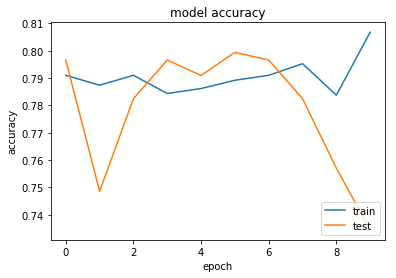

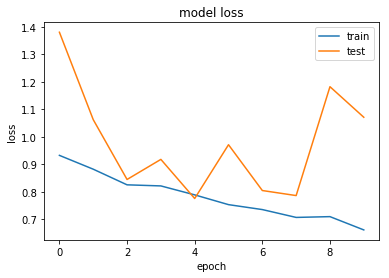

In [9]:
# list all data in history
print(history.history.keys())
# summarize history for accuracy
plt.plot(history.history['acc'])
plt.plot(history.history['val_acc'])
plt.title('model accuracy')
plt.ylabel('accuracy')
plt.xlabel('epoch')
plt.legend(['train', 'test'], loc='lower right')
plt.show()
# summarize history for loss
plt.plot(history.history['loss'])
plt.plot(history.history['val_loss'])
plt.title('model loss')
plt.ylabel('loss')
plt.xlabel('epoch')
plt.legend(['train', 'test'], loc='upper right')
plt.show()

# Increasing Epochs to 20

In [3]:
def conv2d_bn(x, nb_filter, nb_row, nb_col,
              border_mode='same', subsample=(1, 1), bias=False):
    """
    Utility function to apply conv + BN. 
    (Slightly modified from https://github.com/fchollet/keras/blob/master/keras/applications/inception_v3.py)
    """
    if K.image_dim_ordering() == "th":
        channel_axis = 1
    else:
        channel_axis = -1
    x = Convolution2D(nb_filter, nb_row, nb_col,
                      subsample=subsample,
                      border_mode=border_mode,
                      bias=bias)(x)
    x = BatchNormalization(axis=channel_axis)(x)
    x = Activation('relu')(x)
    return x

def block_inception_a(input):
    if K.image_dim_ordering() == "th":
        channel_axis = 1
    else:
        channel_axis = -1

    branch_0 = conv2d_bn(input, 96, 1, 1)

    branch_1 = conv2d_bn(input, 64, 1, 1)
    branch_1 = conv2d_bn(branch_1, 96, 3, 3)

    branch_2 = conv2d_bn(input, 64, 1, 1)
    branch_2 = conv2d_bn(branch_2, 96, 3, 3)
    branch_2 = conv2d_bn(branch_2, 96, 3, 3)

    branch_3 = AveragePooling2D((3,3), strides=(1,1), border_mode='same')(input)
    branch_3 = conv2d_bn(branch_3, 96, 1, 1)

    x = merge([branch_0, branch_1, branch_2, branch_3], mode='concat', concat_axis=channel_axis)
    return x


def block_reduction_a(input):
    if K.image_dim_ordering() == "th":
        channel_axis = 1
    else:
        channel_axis = -1

    branch_0 = conv2d_bn(input, 384, 3, 3, subsample=(2,2), border_mode='valid')

    branch_1 = conv2d_bn(input, 192, 1, 1)
    branch_1 = conv2d_bn(branch_1, 224, 3, 3)
    branch_1 = conv2d_bn(branch_1, 256, 3, 3, subsample=(2,2), border_mode='valid')

    branch_2 = MaxPooling2D((3,3), strides=(2,2), border_mode='valid')(input)

    x = merge([branch_0, branch_1, branch_2], mode='concat', concat_axis=channel_axis)
    return x


def block_inception_b(input):
    if K.image_dim_ordering() == "th":
        channel_axis = 1
    else:
        channel_axis = -1

    branch_0 = conv2d_bn(input, 384, 1, 1)

    branch_1 = conv2d_bn(input, 192, 1, 1)
    branch_1 = conv2d_bn(branch_1, 224, 1, 7)
    branch_1 = conv2d_bn(branch_1, 256, 7, 1)

    branch_2 = conv2d_bn(input, 192, 1, 1)
    branch_2 = conv2d_bn(branch_2, 192, 7, 1)
    branch_2 = conv2d_bn(branch_2, 224, 1, 7)
    branch_2 = conv2d_bn(branch_2, 224, 7, 1)
    branch_2 = conv2d_bn(branch_2, 256, 1, 7)

    branch_3 = AveragePooling2D((3,3), strides=(1,1), border_mode='same')(input)
    branch_3 = conv2d_bn(branch_3, 128, 1, 1)

    x = merge([branch_0, branch_1, branch_2, branch_3], mode='concat', concat_axis=channel_axis)
    return x


def block_reduction_b(input):
    if K.image_dim_ordering() == "th":
        channel_axis = 1
    else:
        channel_axis = -1

    branch_0 = conv2d_bn(input, 192, 1, 1)
    branch_0 = conv2d_bn(branch_0, 192, 3, 3, subsample=(2, 2), border_mode='valid')

    branch_1 = conv2d_bn(input, 256, 1, 1)
    branch_1 = conv2d_bn(branch_1, 256, 1, 7)
    branch_1 = conv2d_bn(branch_1, 320, 7, 1)
    branch_1 = conv2d_bn(branch_1, 320, 3, 3, subsample=(2,2), border_mode='valid')

    branch_2 = MaxPooling2D((3, 3), strides=(2, 2), border_mode='valid')(input)

    x = merge([branch_0, branch_1, branch_2], mode='concat', concat_axis=channel_axis)
    return x


def block_inception_c(input):
    if K.image_dim_ordering() == "th":
        channel_axis = 1
    else:
        channel_axis = -1

    branch_0 = conv2d_bn(input, 256, 1, 1)

    branch_1 = conv2d_bn(input, 384, 1, 1)
    branch_10 = conv2d_bn(branch_1, 256, 1, 3)
    branch_11 = conv2d_bn(branch_1, 256, 3, 1)
    branch_1 = merge([branch_10, branch_11], mode='concat', concat_axis=channel_axis)


    branch_2 = conv2d_bn(input, 384, 1, 1)
    branch_2 = conv2d_bn(branch_2, 448, 3, 1)
    branch_2 = conv2d_bn(branch_2, 512, 1, 3)
    branch_20 = conv2d_bn(branch_2, 256, 1, 3)
    branch_21 = conv2d_bn(branch_2, 256, 3, 1)
    branch_2 = merge([branch_20, branch_21], mode='concat', concat_axis=channel_axis)

    branch_3 = AveragePooling2D((3, 3), strides=(1, 1), border_mode='same')(input)
    branch_3 = conv2d_bn(branch_3, 256, 1, 1)

    x = merge([branch_0, branch_1, branch_2, branch_3], mode='concat', concat_axis=channel_axis)
    return x


def inception_v4_base(input):
    if K.image_dim_ordering() == "th":
        channel_axis = 1
    else:
        channel_axis = -1

    # Input Shape is 299 x 299 x 3 (th) or 3 x 299 x 299 (th)
    net = conv2d_bn(input, 32, 3, 3, subsample=(2,2), border_mode='valid')
    net = conv2d_bn(net, 32, 3, 3, border_mode='valid')
    net = conv2d_bn(net, 64, 3, 3)

    branch_0 = MaxPooling2D((3,3), strides=(2,2), border_mode='valid')(net)

    branch_1 = conv2d_bn(net, 96, 3, 3, subsample=(2,2), border_mode='valid')

    net = merge([branch_0, branch_1], mode='concat', concat_axis=channel_axis)

    branch_0 = conv2d_bn(net, 64, 1, 1)
    branch_0 = conv2d_bn(branch_0, 96, 3, 3, border_mode='valid')

    branch_1 = conv2d_bn(net, 64, 1, 1)
    branch_1 = conv2d_bn(branch_1, 64, 1, 7)
    branch_1 = conv2d_bn(branch_1, 64, 7, 1)
    branch_1 = conv2d_bn(branch_1, 96, 3, 3, border_mode='valid')

    net = merge([branch_0, branch_1], mode='concat', concat_axis=channel_axis)

    branch_0 = conv2d_bn(net, 192, 3, 3, subsample=(2,2), border_mode='valid')
    branch_1 = MaxPooling2D((3,3), strides=(2,2), border_mode='valid')(net)

    net = merge([branch_0, branch_1], mode='concat', concat_axis=channel_axis)

    # 35 x 35 x 384
    # 4 x Inception-A blocks
    for idx in xrange(4):
      net = block_inception_a(net)

    # 35 x 35 x 384
    # Reduction-A block
    net = block_reduction_a(net)

    # 17 x 17 x 1024
    # 7 x Inception-B blocks
    for idx in xrange(7):
      net = block_inception_b(net)

    # 17 x 17 x 1024
    # Reduction-B block
    net = block_reduction_b(net)

    # 8 x 8 x 1536
    # 3 x Inception-C blocks
    for idx in xrange(3):
      net = block_inception_c(net)

    return net


def inception_v4_model(img_rows, img_cols, color_type=1, num_classeses=None, dropout_keep_prob=0.2):
    '''
    Inception V4 Model for Keras

    Model Schema is based on
    https://github.com/kentsommer/keras-inceptionV4

    ImageNet Pretrained Weights 
    Theano: https://github.com/kentsommer/keras-inceptionV4/releases/download/2.0/inception-v4_weights_th_dim_ordering_th_kernels.h5
    TensorFlow: https://github.com/kentsommer/keras-inceptionV4/releases/download/2.0/inception-v4_weights_tf_dim_ordering_tf_kernels.h5

    Parameters:
      img_rows, img_cols - resolution of inputs
      channel - 1 for grayscale, 3 for color 
      num_classes - number of class labels for our classification task
    '''

    # Input Shape is 299 x 299 x 3 (tf) or 3 x 299 x 299 (th)
    if K.image_dim_ordering() == 'th':
        inputs = Input((3, 300, 300))
    else:
        inputs = Input((300, 300, 3))

    # Make inception base
    net = inception_v4_base(inputs)


    # Final pooling and prediction

    # 8 x 8 x 1536
    net_old = AveragePooling2D((8,8), border_mode='valid')(net)

    # 1 x 1 x 1536
    net_old = Dropout(dropout_keep_prob)(net_old)
    net_old = Flatten()(net_old)

    # 1536
    predictions = Dense(output_dim=1001, activation='softmax')(net_old)

    model = Model(inputs, predictions, name='inception_v4')

    if K.image_dim_ordering() == 'th':
      # Use pre-trained weights for Theano backend
      weights_path = './inception-v4_weights_th_dim_ordering_th_kernels.h5'
    else:
      # Use pre-trained weights for Tensorflow backend
      weights_path = './inception-v4_weights_tf_dim_ordering_tf_kernels.h5'

    model.load_weights(weights_path, by_name=True)

    # Truncate and replace softmax layer for transfer learning
    # Cannot use model.layers.pop() since model is not of Sequential() type
    # The method below works since pre-trained weights are stored in layers but not in the model
    net_ft = AveragePooling2D((8,8), border_mode='valid')(net)
    net_ft = Dropout(dropout_keep_prob)(net_ft)
    net_ft = Flatten()(net_ft)
    predictions_ft = Dense(output_dim=num_classes, activation='softmax')(net_ft)

    model = Model(inputs, predictions_ft, name='inception_v4')

    # Learning rate is changed to 0.001
    sgd = SGD(lr=1e-3, decay=1e-6, momentum=0.9, nesterov=True)
    model.compile(optimizer=sgd, loss='categorical_crossentropy', metrics=['accuracy'])

    return model

if __name__ == '__main__':

    # Example to fine-tune on 3000 samples from Cifar10

    img_rows, img_cols = 300, 300 # Resolution of inputs
    channel = 3
    num_classes = 7
    batch_size = 8
    nb_epoch = 20

    # Load Cifar10 data. Please implement your own load_data() module for your own dataset
    #X_train, Y_train, X_valid, Y_valid = load_cifar10_data(img_rows, img_cols)

    # Load our model
    model = inception_v4_model(img_rows, img_cols, channel, num_classes, dropout_keep_prob=0.2)

    # Start Fine-tuning
    history = model.fit(X_train, Y_train,
              batch_size=batch_size,
              nb_epoch=nb_epoch,
              shuffle=True,
              verbose=1,
              validation_data=(X_valid, Y_valid),
              )

    # Make predictions
    predictions_valid = model.predict(X_test, batch_size=batch_size, verbose=1)

    # Cross-entropy loss score
    score = log_loss(Y_test, predictions_valid)

/home/talha/anaconda/envs/conda_env/lib/python2.7/site-packages/ipykernel_launcher.py:14: UserWarning: Update your `Conv2D` call to the Keras 2 API: `Conv2D(32, (3, 3), padding="valid", strides=(2, 2), use_bias=False)`
  
/home/talha/anaconda/envs/conda_env/lib/python2.7/site-packages/ipykernel_launcher.py:14: UserWarning: Update your `Conv2D` call to the Keras 2 API: `Conv2D(32, (3, 3), padding="valid", strides=(1, 1), use_bias=False)`
  
/home/talha/anaconda/envs/conda_env/lib/python2.7/site-packages/ipykernel_launcher.py:14: UserWarning: Update your `Conv2D` call to the Keras 2 API: `Conv2D(64, (3, 3), padding="same", strides=(1, 1), use_bias=False)`
  
/home/talha/anaconda/envs/conda_env/lib/python2.7/site-packages/ipykernel_launcher.py:143: UserWarning: Update your `MaxPooling2D` call to the Keras 2 API: `MaxPooling2D((3, 3), padding="valid", strides=(2, 2))`
/home/talha/anaconda/envs/conda_env/lib/python2.7/site-packages/ipykernel_launcher.py:14: UserWarning: Update your `Conv2D`

/home/talha/anaconda/envs/conda_env/lib/python2.7/site-packages/ipykernel_launcher.py:14: UserWarning: Update your `Conv2D` call to the Keras 2 API: `Conv2D(256, (1, 3), padding="same", strides=(1, 1), use_bias=False)`
  
/home/talha/anaconda/envs/conda_env/lib/python2.7/site-packages/ipykernel_launcher.py:14: UserWarning: Update your `Conv2D` call to the Keras 2 API: `Conv2D(256, (3, 1), padding="same", strides=(1, 1), use_bias=False)`
  
/home/talha/anaconda/envs/conda_env/lib/python2.7/site-packages/ipykernel_launcher.py:115: UserWarning: The `merge` function is deprecated and will be removed after 08/2017. Use instead layers from `keras.layers.merge`, e.g. `add`, `concatenate`, etc.
/home/talha/anaconda/envs/conda_env/lib/python2.7/site-packages/ipykernel_launcher.py:14: UserWarning: Update your `Conv2D` call to the Keras 2 API: `Conv2D(448, (3, 1), padding="same", strides=(1, 1), use_bias=False)`
  
/home/talha/anaconda/envs/conda_env/lib/python2.7/site-packages/ipykernel_launcher

Train on 1651 samples, validate on 354 samples
Epoch 1/20
1651/1651 [==============================] - 233s 141ms/step - loss: 0.9277 - acc: 0.7838 - val_loss: 1.9817 - val_acc: 0.6836
Epoch 2/20
1651/1651 [==============================] - 262s 159ms/step - loss: 0.8790 - acc: 0.7922 - val_loss: 0.9042 - val_acc: 0.7966
Epoch 3/20
1651/1651 [==============================] - 234s 142ms/step - loss: 0.8223 - acc: 0.7922 - val_loss: 0.9806 - val_acc: 0.7429
Epoch 4/20
1651/1651 [==============================] - 271s 164ms/step - loss: 0.7990 - acc: 0.7922 - val_loss: 0.8008 - val_acc: 0.8023
Epoch 5/20
1651/1651 [==============================] - 245s 148ms/step - loss: 0.7640 - acc: 0.7886 - val_loss: 0.8194 - val_acc: 0.7966
Epoch 6/20
1651/1651 [==============================] - 248s 150ms/step - loss: 0.7426 - acc: 0.7832 - val_loss: 0.7730 - val_acc: 0.7853
Epoch 7/20
1651/1651 [==============================] - 278s 169ms/step - loss: 0.7490 - acc: 0.7941 - val_loss: 0.7985 - val

In [4]:
[loss, acc] = model.evaluate(X_test,Y_test)
print "Accuracy : ",acc

357/357 [==============================] - 13s 36ms/step
Accuracy :  0.750700280154


['acc', 'loss', 'val_acc', 'val_loss']


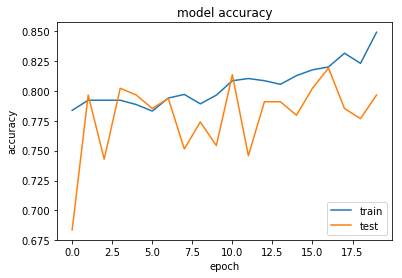

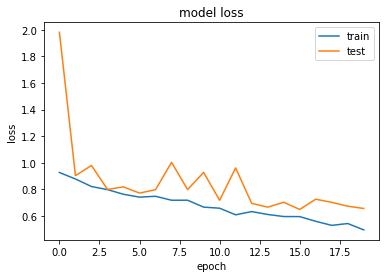

In [5]:
# list all data in history
print(history.history.keys())
# summarize history for accuracy
plt.plot(history.history['acc'])
plt.plot(history.history['val_acc'])
plt.title('model accuracy')
plt.ylabel('accuracy')
plt.xlabel('epoch')
plt.legend(['train', 'test'], loc='lower right')
plt.show()
# summarize history for loss
plt.plot(history.history['loss'])
plt.plot(history.history['val_loss'])
plt.title('model loss')
plt.ylabel('loss')
plt.xlabel('epoch')
plt.legend(['train', 'test'], loc='upper right')
plt.show()

# Increasing Epochs to 40

In [3]:
def conv2d_bn(x, nb_filter, nb_row, nb_col,
              border_mode='same', subsample=(1, 1), bias=False):
    """
    Utility function to apply conv + BN. 
    (Slightly modified from https://github.com/fchollet/keras/blob/master/keras/applications/inception_v3.py)
    """
    if K.image_dim_ordering() == "th":
        channel_axis = 1
    else:
        channel_axis = -1
    x = Convolution2D(nb_filter, nb_row, nb_col,
                      subsample=subsample,
                      border_mode=border_mode,
                      bias=bias)(x)
    x = BatchNormalization(axis=channel_axis)(x)
    x = Activation('relu')(x)
    return x

def block_inception_a(input):
    if K.image_dim_ordering() == "th":
        channel_axis = 1
    else:
        channel_axis = -1

    branch_0 = conv2d_bn(input, 96, 1, 1)

    branch_1 = conv2d_bn(input, 64, 1, 1)
    branch_1 = conv2d_bn(branch_1, 96, 3, 3)

    branch_2 = conv2d_bn(input, 64, 1, 1)
    branch_2 = conv2d_bn(branch_2, 96, 3, 3)
    branch_2 = conv2d_bn(branch_2, 96, 3, 3)

    branch_3 = AveragePooling2D((3,3), strides=(1,1), border_mode='same')(input)
    branch_3 = conv2d_bn(branch_3, 96, 1, 1)

    x = merge([branch_0, branch_1, branch_2, branch_3], mode='concat', concat_axis=channel_axis)
    return x


def block_reduction_a(input):
    if K.image_dim_ordering() == "th":
        channel_axis = 1
    else:
        channel_axis = -1

    branch_0 = conv2d_bn(input, 384, 3, 3, subsample=(2,2), border_mode='valid')

    branch_1 = conv2d_bn(input, 192, 1, 1)
    branch_1 = conv2d_bn(branch_1, 224, 3, 3)
    branch_1 = conv2d_bn(branch_1, 256, 3, 3, subsample=(2,2), border_mode='valid')

    branch_2 = MaxPooling2D((3,3), strides=(2,2), border_mode='valid')(input)

    x = merge([branch_0, branch_1, branch_2], mode='concat', concat_axis=channel_axis)
    return x


def block_inception_b(input):
    if K.image_dim_ordering() == "th":
        channel_axis = 1
    else:
        channel_axis = -1

    branch_0 = conv2d_bn(input, 384, 1, 1)

    branch_1 = conv2d_bn(input, 192, 1, 1)
    branch_1 = conv2d_bn(branch_1, 224, 1, 7)
    branch_1 = conv2d_bn(branch_1, 256, 7, 1)

    branch_2 = conv2d_bn(input, 192, 1, 1)
    branch_2 = conv2d_bn(branch_2, 192, 7, 1)
    branch_2 = conv2d_bn(branch_2, 224, 1, 7)
    branch_2 = conv2d_bn(branch_2, 224, 7, 1)
    branch_2 = conv2d_bn(branch_2, 256, 1, 7)

    branch_3 = AveragePooling2D((3,3), strides=(1,1), border_mode='same')(input)
    branch_3 = conv2d_bn(branch_3, 128, 1, 1)

    x = merge([branch_0, branch_1, branch_2, branch_3], mode='concat', concat_axis=channel_axis)
    return x


def block_reduction_b(input):
    if K.image_dim_ordering() == "th":
        channel_axis = 1
    else:
        channel_axis = -1

    branch_0 = conv2d_bn(input, 192, 1, 1)
    branch_0 = conv2d_bn(branch_0, 192, 3, 3, subsample=(2, 2), border_mode='valid')

    branch_1 = conv2d_bn(input, 256, 1, 1)
    branch_1 = conv2d_bn(branch_1, 256, 1, 7)
    branch_1 = conv2d_bn(branch_1, 320, 7, 1)
    branch_1 = conv2d_bn(branch_1, 320, 3, 3, subsample=(2,2), border_mode='valid')

    branch_2 = MaxPooling2D((3, 3), strides=(2, 2), border_mode='valid')(input)

    x = merge([branch_0, branch_1, branch_2], mode='concat', concat_axis=channel_axis)
    return x


def block_inception_c(input):
    if K.image_dim_ordering() == "th":
        channel_axis = 1
    else:
        channel_axis = -1

    branch_0 = conv2d_bn(input, 256, 1, 1)

    branch_1 = conv2d_bn(input, 384, 1, 1)
    branch_10 = conv2d_bn(branch_1, 256, 1, 3)
    branch_11 = conv2d_bn(branch_1, 256, 3, 1)
    branch_1 = merge([branch_10, branch_11], mode='concat', concat_axis=channel_axis)


    branch_2 = conv2d_bn(input, 384, 1, 1)
    branch_2 = conv2d_bn(branch_2, 448, 3, 1)
    branch_2 = conv2d_bn(branch_2, 512, 1, 3)
    branch_20 = conv2d_bn(branch_2, 256, 1, 3)
    branch_21 = conv2d_bn(branch_2, 256, 3, 1)
    branch_2 = merge([branch_20, branch_21], mode='concat', concat_axis=channel_axis)

    branch_3 = AveragePooling2D((3, 3), strides=(1, 1), border_mode='same')(input)
    branch_3 = conv2d_bn(branch_3, 256, 1, 1)

    x = merge([branch_0, branch_1, branch_2, branch_3], mode='concat', concat_axis=channel_axis)
    return x


def inception_v4_base(input):
    if K.image_dim_ordering() == "th":
        channel_axis = 1
    else:
        channel_axis = -1

    # Input Shape is 299 x 299 x 3 (th) or 3 x 299 x 299 (th)
    net = conv2d_bn(input, 32, 3, 3, subsample=(2,2), border_mode='valid')
    net = conv2d_bn(net, 32, 3, 3, border_mode='valid')
    net = conv2d_bn(net, 64, 3, 3)

    branch_0 = MaxPooling2D((3,3), strides=(2,2), border_mode='valid')(net)

    branch_1 = conv2d_bn(net, 96, 3, 3, subsample=(2,2), border_mode='valid')

    net = merge([branch_0, branch_1], mode='concat', concat_axis=channel_axis)

    branch_0 = conv2d_bn(net, 64, 1, 1)
    branch_0 = conv2d_bn(branch_0, 96, 3, 3, border_mode='valid')

    branch_1 = conv2d_bn(net, 64, 1, 1)
    branch_1 = conv2d_bn(branch_1, 64, 1, 7)
    branch_1 = conv2d_bn(branch_1, 64, 7, 1)
    branch_1 = conv2d_bn(branch_1, 96, 3, 3, border_mode='valid')

    net = merge([branch_0, branch_1], mode='concat', concat_axis=channel_axis)

    branch_0 = conv2d_bn(net, 192, 3, 3, subsample=(2,2), border_mode='valid')
    branch_1 = MaxPooling2D((3,3), strides=(2,2), border_mode='valid')(net)

    net = merge([branch_0, branch_1], mode='concat', concat_axis=channel_axis)

    # 35 x 35 x 384
    # 4 x Inception-A blocks
    for idx in xrange(4):
      net = block_inception_a(net)

    # 35 x 35 x 384
    # Reduction-A block
    net = block_reduction_a(net)

    # 17 x 17 x 1024
    # 7 x Inception-B blocks
    for idx in xrange(7):
      net = block_inception_b(net)

    # 17 x 17 x 1024
    # Reduction-B block
    net = block_reduction_b(net)

    # 8 x 8 x 1536
    # 3 x Inception-C blocks
    for idx in xrange(3):
      net = block_inception_c(net)

    return net


def inception_v4_model(img_rows, img_cols, color_type=1, num_classeses=None, dropout_keep_prob=0.2):
    '''
    Inception V4 Model for Keras

    Model Schema is based on
    https://github.com/kentsommer/keras-inceptionV4

    ImageNet Pretrained Weights 
    Theano: https://github.com/kentsommer/keras-inceptionV4/releases/download/2.0/inception-v4_weights_th_dim_ordering_th_kernels.h5
    TensorFlow: https://github.com/kentsommer/keras-inceptionV4/releases/download/2.0/inception-v4_weights_tf_dim_ordering_tf_kernels.h5

    Parameters:
      img_rows, img_cols - resolution of inputs
      channel - 1 for grayscale, 3 for color 
      num_classes - number of class labels for our classification task
    '''

    # Input Shape is 299 x 299 x 3 (tf) or 3 x 299 x 299 (th)
    if K.image_dim_ordering() == 'th':
        inputs = Input((3, 300, 300))
    else:
        inputs = Input((300, 300, 3))

    # Make inception base
    net = inception_v4_base(inputs)


    # Final pooling and prediction

    # 8 x 8 x 1536
    net_old = AveragePooling2D((8,8), border_mode='valid')(net)

    # 1 x 1 x 1536
    net_old = Dropout(dropout_keep_prob)(net_old)
    net_old = Flatten()(net_old)

    # 1536
    predictions = Dense(output_dim=1001, activation='softmax')(net_old)

    model = Model(inputs, predictions, name='inception_v4')

    if K.image_dim_ordering() == 'th':
      # Use pre-trained weights for Theano backend
      weights_path = './inception-v4_weights_th_dim_ordering_th_kernels.h5'
    else:
      # Use pre-trained weights for Tensorflow backend
      weights_path = './inception-v4_weights_tf_dim_ordering_tf_kernels.h5'

    model.load_weights(weights_path, by_name=True)

    # Truncate and replace softmax layer for transfer learning
    # Cannot use model.layers.pop() since model is not of Sequential() type
    # The method below works since pre-trained weights are stored in layers but not in the model
    net_ft = AveragePooling2D((8,8), border_mode='valid')(net)
    net_ft = Dropout(dropout_keep_prob)(net_ft)
    net_ft = Flatten()(net_ft)
    predictions_ft = Dense(output_dim=num_classes, activation='softmax')(net_ft)

    model = Model(inputs, predictions_ft, name='inception_v4')

    # Learning rate is changed to 0.001
    sgd = SGD(lr=1e-3, decay=1e-6, momentum=0.9, nesterov=True)
    model.compile(optimizer=sgd, loss='categorical_crossentropy', metrics=['accuracy'])

    return model

if __name__ == '__main__':

    # Example to fine-tune on 3000 samples from Cifar10

    img_rows, img_cols = 300, 300 # Resolution of inputs
    channel = 3
    num_classes = 7
    batch_size = 8
    nb_epoch = 40

    # Load Cifar10 data. Please implement your own load_data() module for your own dataset
    #X_train, Y_train, X_valid, Y_valid = load_cifar10_data(img_rows, img_cols)

    # Load our model
    model = inception_v4_model(img_rows, img_cols, channel, num_classes, dropout_keep_prob=0.2)

    checkpoint = ModelCheckpoint('{val_acc:.4f}.hdf5', monitor='val_acc', verbose=1, save_best_only=True, mode='auto')
    
    # Start Fine-tuning
    history = model.fit(X_train, Y_train,
              batch_size=batch_size,
              nb_epoch=nb_epoch,
              shuffle=True,
              verbose=1,
              validation_data=(X_valid, Y_valid), callbacks = [checkpoint]
              )

    # Make predictions
    predictions_valid = model.predict(X_test, batch_size=batch_size, verbose=1)

    # Cross-entropy loss score
    score = log_loss(Y_test, predictions_valid)

/home/talha/anaconda/envs/conda_env/lib/python2.7/site-packages/ipykernel_launcher.py:14: UserWarning: Update your `Conv2D` call to the Keras 2 API: `Conv2D(32, (3, 3), padding="valid", strides=(2, 2), use_bias=False)`
  
/home/talha/anaconda/envs/conda_env/lib/python2.7/site-packages/ipykernel_launcher.py:14: UserWarning: Update your `Conv2D` call to the Keras 2 API: `Conv2D(32, (3, 3), padding="valid", strides=(1, 1), use_bias=False)`
  
/home/talha/anaconda/envs/conda_env/lib/python2.7/site-packages/ipykernel_launcher.py:14: UserWarning: Update your `Conv2D` call to the Keras 2 API: `Conv2D(64, (3, 3), padding="same", strides=(1, 1), use_bias=False)`
  
/home/talha/anaconda/envs/conda_env/lib/python2.7/site-packages/ipykernel_launcher.py:143: UserWarning: Update your `MaxPooling2D` call to the Keras 2 API: `MaxPooling2D((3, 3), padding="valid", strides=(2, 2))`
/home/talha/anaconda/envs/conda_env/lib/python2.7/site-packages/ipykernel_launcher.py:14: UserWarning: Update your `Conv2D`

/home/talha/anaconda/envs/conda_env/lib/python2.7/site-packages/ipykernel_launcher.py:14: UserWarning: Update your `Conv2D` call to the Keras 2 API: `Conv2D(256, (1, 3), padding="same", strides=(1, 1), use_bias=False)`
  
/home/talha/anaconda/envs/conda_env/lib/python2.7/site-packages/ipykernel_launcher.py:14: UserWarning: Update your `Conv2D` call to the Keras 2 API: `Conv2D(256, (3, 1), padding="same", strides=(1, 1), use_bias=False)`
  
/home/talha/anaconda/envs/conda_env/lib/python2.7/site-packages/ipykernel_launcher.py:115: UserWarning: The `merge` function is deprecated and will be removed after 08/2017. Use instead layers from `keras.layers.merge`, e.g. `add`, `concatenate`, etc.
/home/talha/anaconda/envs/conda_env/lib/python2.7/site-packages/ipykernel_launcher.py:14: UserWarning: Update your `Conv2D` call to the Keras 2 API: `Conv2D(448, (3, 1), padding="same", strides=(1, 1), use_bias=False)`
  
/home/talha/anaconda/envs/conda_env/lib/python2.7/site-packages/ipykernel_launcher

Train on 1651 samples, validate on 354 samples
Epoch 1/40
1648/1651 [============================>.] - ETA: 0s - loss: 0.9736 - acc: 0.7706
Epoch 00001: val_acc improved from -inf to 0.79661, saving model to 0.7966.hdf5
1651/1651 [==============================] - 257s 156ms/step - loss: 0.9736 - acc: 0.7704 - val_loss: 1.2696 - val_acc: 0.7966
Epoch 2/40
1648/1651 [============================>.] - ETA: 0s - loss: 0.8502 - acc: 0.7900
Epoch 00002: val_acc did not improve
1651/1651 [==============================] - 190s 115ms/step - loss: 0.8488 - acc: 0.7904 - val_loss: 1.0428 - val_acc: 0.7966
Epoch 3/40
1648/1651 [============================>.] - ETA: 0s - loss: 0.8261 - acc: 0.7870
Epoch 00003: val_acc did not improve
1651/1651 [==============================] - 190s 115ms/step - loss: 0.8269 - acc: 0.7868 - val_loss: 0.9168 - val_acc: 0.7797
Epoch 4/40
1648/1651 [============================>.] - ETA: 0s - loss: 0.7754 - acc: 0.7907
Epoch 00004: val_acc did not improve
1651/1651

Epoch 32/40
1648/1651 [============================>.] - ETA: 0s - loss: 0.2998 - acc: 0.8950
Epoch 00032: val_acc did not improve
1651/1651 [==============================] - 170s 103ms/step - loss: 0.3009 - acc: 0.8946 - val_loss: 0.8461 - val_acc: 0.8023
Epoch 33/40
1648/1651 [============================>.] - ETA: 0s - loss: 0.3016 - acc: 0.8944
Epoch 00033: val_acc did not improve
1651/1651 [==============================] - 172s 104ms/step - loss: 0.3011 - acc: 0.8946 - val_loss: 0.6569 - val_acc: 0.8305
Epoch 34/40
1648/1651 [============================>.] - ETA: 0s - loss: 0.2600 - acc: 0.9169
Epoch 00034: val_acc did not improve
1651/1651 [==============================] - 205s 124ms/step - loss: 0.2626 - acc: 0.9164 - val_loss: 0.7470 - val_acc: 0.8051
Epoch 35/40
1648/1651 [============================>.] - ETA: 0s - loss: 0.2728 - acc: 0.9114
Epoch 00035: val_acc did not improve
1651/1651 [==============================] - 228s 138ms/step - loss: 0.2723 - acc: 0.9116 - val

In [8]:
model.load_weights('0.8701.hdf5')
[loss, acc] = model.evaluate(X_test,Y_test)
print "Accuracy : ",acc

357/357 [==============================] - 13s 37ms/step
Accuracy :  0.848739496132


['acc', 'loss', 'val_acc', 'val_loss']


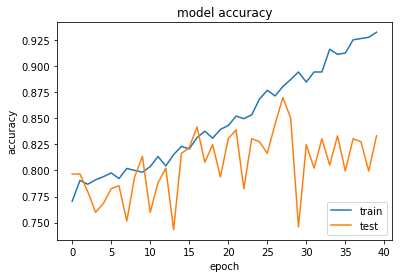

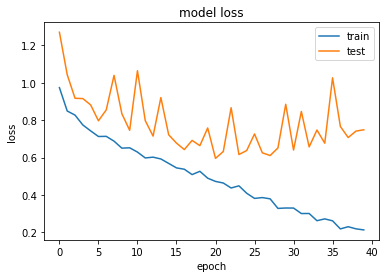

In [5]:
# list all data in history
print(history.history.keys())
# summarize history for accuracy
plt.plot(history.history['acc'])
plt.plot(history.history['val_acc'])
plt.title('model accuracy')
plt.ylabel('accuracy')
plt.xlabel('epoch')
plt.legend(['train', 'test'], loc='lower right')
plt.show()
# summarize history for loss
plt.plot(history.history['loss'])
plt.plot(history.history['val_loss'])
plt.title('model loss')
plt.ylabel('loss')
plt.xlabel('epoch')
plt.legend(['train', 'test'], loc='upper right')
plt.show()

# Increasing Epochs to 80

In [20]:
model.load_weights('0.8785.hdf5')
[loss, acc] = model.evaluate(X_test,Y_test)
print "Accuracy : ",acc

357/357 [==============================] - 11s 32ms/step
Accuracy :  0.865546218654


['acc', 'loss', 'val_acc', 'val_loss']


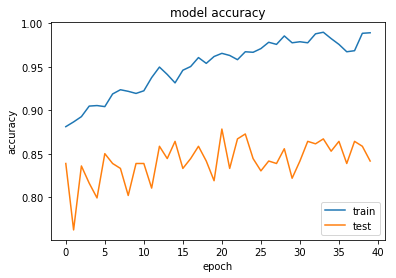

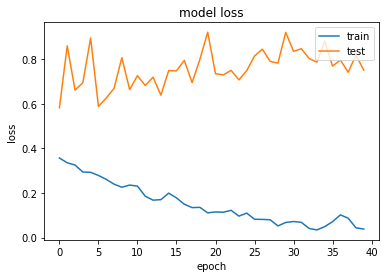

In [21]:
# list all data in history
print(history.history.keys())
# summarize history for accuracy
plt.plot(history.history['acc'])
plt.plot(history.history['val_acc'])
plt.title('model accuracy')
plt.ylabel('accuracy')
plt.xlabel('epoch')
plt.legend(['train', 'test'], loc='lower right')
plt.show()
# summarize history for loss
plt.plot(history.history['loss'])
plt.plot(history.history['val_loss'])
plt.title('model loss')
plt.ylabel('loss')
plt.xlabel('epoch')
plt.legend(['train', 'test'], loc='upper right')
plt.show()

# Using generated data

In [3]:
def conv2d_bn(x, nb_filter, nb_row, nb_col,
              border_mode='same', subsample=(1, 1), bias=False):
    """
    Utility function to apply conv + BN. 
    (Slightly modified from https://github.com/fchollet/keras/blob/master/keras/applications/inception_v3.py)
    """
    if K.image_dim_ordering() == "th":
        channel_axis = 1
    else:
        channel_axis = -1
    x = Convolution2D(nb_filter, nb_row, nb_col,
                      subsample=subsample,
                      border_mode=border_mode,
                      bias=bias)(x)
    x = BatchNormalization(axis=channel_axis)(x)
    x = Activation('relu')(x)
    return x

def block_inception_a(input):
    if K.image_dim_ordering() == "th":
        channel_axis = 1
    else:
        channel_axis = -1

    branch_0 = conv2d_bn(input, 96, 1, 1)

    branch_1 = conv2d_bn(input, 64, 1, 1)
    branch_1 = conv2d_bn(branch_1, 96, 3, 3)

    branch_2 = conv2d_bn(input, 64, 1, 1)
    branch_2 = conv2d_bn(branch_2, 96, 3, 3)
    branch_2 = conv2d_bn(branch_2, 96, 3, 3)

    branch_3 = AveragePooling2D((3,3), strides=(1,1), border_mode='same')(input)
    branch_3 = conv2d_bn(branch_3, 96, 1, 1)

    x = merge([branch_0, branch_1, branch_2, branch_3], mode='concat', concat_axis=channel_axis)
    return x


def block_reduction_a(input):
    if K.image_dim_ordering() == "th":
        channel_axis = 1
    else:
        channel_axis = -1

    branch_0 = conv2d_bn(input, 384, 3, 3, subsample=(2,2), border_mode='valid')

    branch_1 = conv2d_bn(input, 192, 1, 1)
    branch_1 = conv2d_bn(branch_1, 224, 3, 3)
    branch_1 = conv2d_bn(branch_1, 256, 3, 3, subsample=(2,2), border_mode='valid')

    branch_2 = MaxPooling2D((3,3), strides=(2,2), border_mode='valid')(input)

    x = merge([branch_0, branch_1, branch_2], mode='concat', concat_axis=channel_axis)
    return x


def block_inception_b(input):
    if K.image_dim_ordering() == "th":
        channel_axis = 1
    else:
        channel_axis = -1

    branch_0 = conv2d_bn(input, 384, 1, 1)

    branch_1 = conv2d_bn(input, 192, 1, 1)
    branch_1 = conv2d_bn(branch_1, 224, 1, 7)
    branch_1 = conv2d_bn(branch_1, 256, 7, 1)

    branch_2 = conv2d_bn(input, 192, 1, 1)
    branch_2 = conv2d_bn(branch_2, 192, 7, 1)
    branch_2 = conv2d_bn(branch_2, 224, 1, 7)
    branch_2 = conv2d_bn(branch_2, 224, 7, 1)
    branch_2 = conv2d_bn(branch_2, 256, 1, 7)

    branch_3 = AveragePooling2D((3,3), strides=(1,1), border_mode='same')(input)
    branch_3 = conv2d_bn(branch_3, 128, 1, 1)

    x = merge([branch_0, branch_1, branch_2, branch_3], mode='concat', concat_axis=channel_axis)
    return x


def block_reduction_b(input):
    if K.image_dim_ordering() == "th":
        channel_axis = 1
    else:
        channel_axis = -1

    branch_0 = conv2d_bn(input, 192, 1, 1)
    branch_0 = conv2d_bn(branch_0, 192, 3, 3, subsample=(2, 2), border_mode='valid')

    branch_1 = conv2d_bn(input, 256, 1, 1)
    branch_1 = conv2d_bn(branch_1, 256, 1, 7)
    branch_1 = conv2d_bn(branch_1, 320, 7, 1)
    branch_1 = conv2d_bn(branch_1, 320, 3, 3, subsample=(2,2), border_mode='valid')

    branch_2 = MaxPooling2D((3, 3), strides=(2, 2), border_mode='valid')(input)

    x = merge([branch_0, branch_1, branch_2], mode='concat', concat_axis=channel_axis)
    return x


def block_inception_c(input):
    if K.image_dim_ordering() == "th":
        channel_axis = 1
    else:
        channel_axis = -1

    branch_0 = conv2d_bn(input, 256, 1, 1)

    branch_1 = conv2d_bn(input, 384, 1, 1)
    branch_10 = conv2d_bn(branch_1, 256, 1, 3)
    branch_11 = conv2d_bn(branch_1, 256, 3, 1)
    branch_1 = merge([branch_10, branch_11], mode='concat', concat_axis=channel_axis)


    branch_2 = conv2d_bn(input, 384, 1, 1)
    branch_2 = conv2d_bn(branch_2, 448, 3, 1)
    branch_2 = conv2d_bn(branch_2, 512, 1, 3)
    branch_20 = conv2d_bn(branch_2, 256, 1, 3)
    branch_21 = conv2d_bn(branch_2, 256, 3, 1)
    branch_2 = merge([branch_20, branch_21], mode='concat', concat_axis=channel_axis)

    branch_3 = AveragePooling2D((3, 3), strides=(1, 1), border_mode='same')(input)
    branch_3 = conv2d_bn(branch_3, 256, 1, 1)

    x = merge([branch_0, branch_1, branch_2, branch_3], mode='concat', concat_axis=channel_axis)
    return x


def inception_v4_base(input):
    if K.image_dim_ordering() == "th":
        channel_axis = 1
    else:
        channel_axis = -1

    # Input Shape is 299 x 299 x 3 (th) or 3 x 299 x 299 (th)
    net = conv2d_bn(input, 32, 3, 3, subsample=(2,2), border_mode='valid')
    net = conv2d_bn(net, 32, 3, 3, border_mode='valid')
    net = conv2d_bn(net, 64, 3, 3)

    branch_0 = MaxPooling2D((3,3), strides=(2,2), border_mode='valid')(net)

    branch_1 = conv2d_bn(net, 96, 3, 3, subsample=(2,2), border_mode='valid')

    net = merge([branch_0, branch_1], mode='concat', concat_axis=channel_axis)

    branch_0 = conv2d_bn(net, 64, 1, 1)
    branch_0 = conv2d_bn(branch_0, 96, 3, 3, border_mode='valid')

    branch_1 = conv2d_bn(net, 64, 1, 1)
    branch_1 = conv2d_bn(branch_1, 64, 1, 7)
    branch_1 = conv2d_bn(branch_1, 64, 7, 1)
    branch_1 = conv2d_bn(branch_1, 96, 3, 3, border_mode='valid')

    net = merge([branch_0, branch_1], mode='concat', concat_axis=channel_axis)

    branch_0 = conv2d_bn(net, 192, 3, 3, subsample=(2,2), border_mode='valid')
    branch_1 = MaxPooling2D((3,3), strides=(2,2), border_mode='valid')(net)

    net = merge([branch_0, branch_1], mode='concat', concat_axis=channel_axis)

    # 35 x 35 x 384
    # 4 x Inception-A blocks
    for idx in xrange(4):
      net = block_inception_a(net)

    # 35 x 35 x 384
    # Reduction-A block
    net = block_reduction_a(net)

    # 17 x 17 x 1024
    # 7 x Inception-B blocks
    for idx in xrange(7):
      net = block_inception_b(net)

    # 17 x 17 x 1024
    # Reduction-B block
    net = block_reduction_b(net)

    # 8 x 8 x 1536
    # 3 x Inception-C blocks
    for idx in xrange(3):
      net = block_inception_c(net)

    return net


def inception_v4_model(img_rows, img_cols, color_type=1, num_classeses=None, dropout_keep_prob=0.2):
    '''
    Inception V4 Model for Keras

    Model Schema is based on
    https://github.com/kentsommer/keras-inceptionV4

    ImageNet Pretrained Weights 
    Theano: https://github.com/kentsommer/keras-inceptionV4/releases/download/2.0/inception-v4_weights_th_dim_ordering_th_kernels.h5
    TensorFlow: https://github.com/kentsommer/keras-inceptionV4/releases/download/2.0/inception-v4_weights_tf_dim_ordering_tf_kernels.h5

    Parameters:
      img_rows, img_cols - resolution of inputs
      channel - 1 for grayscale, 3 for color 
      num_classes - number of class labels for our classification task
    '''

    # Input Shape is 299 x 299 x 3 (tf) or 3 x 299 x 299 (th)
    if K.image_dim_ordering() == 'th':
        inputs = Input((3, 300, 300))
    else:
        inputs = Input((300, 300, 3))

    # Make inception base
    net = inception_v4_base(inputs)


    # Final pooling and prediction

    # 8 x 8 x 1536
    net_old = AveragePooling2D((8,8), border_mode='valid')(net)

    # 1 x 1 x 1536
    net_old = Dropout(dropout_keep_prob)(net_old)
    net_old = Flatten()(net_old)

    # 1536
    predictions = Dense(output_dim=1001, activation='softmax')(net_old)

    model = Model(inputs, predictions, name='inception_v4')

    if K.image_dim_ordering() == 'th':
      # Use pre-trained weights for Theano backend
      weights_path = './inception-v4_weights_th_dim_ordering_th_kernels.h5'
    else:
      # Use pre-trained weights for Tensorflow backend
      weights_path = './inception-v4_weights_tf_dim_ordering_tf_kernels.h5'

    model.load_weights(weights_path, by_name=True)

    # Truncate and replace softmax layer for transfer learning
    # Cannot use model.layers.pop() since model is not of Sequential() type
    # The method below works since pre-trained weights are stored in layers but not in the model
    net_ft = AveragePooling2D((8,8), border_mode='valid')(net)
    net_ft = Dropout(dropout_keep_prob)(net_ft)
    net_ft = Flatten()(net_ft)
    predictions_ft = Dense(output_dim=num_classes, activation='softmax')(net_ft)

    model = Model(inputs, predictions_ft, name='inception_v4')

    # Learning rate is changed to 0.001
    sgd = SGD(lr=1e-3, decay=1e-6, momentum=0.9, nesterov=True)
    model.compile(optimizer=sgd, loss='categorical_crossentropy', metrics=['accuracy'])

    return model

if __name__ == '__main__':

    # Example to fine-tune on 3000 samples from Cifar10

    img_rows, img_cols = 300, 300 # Resolution of inputs
    channel = 3
    num_classes = 7
    batch_size = 8
    nb_epoch = 40

    # Load Cifar10 data. Please implement your own load_data() module for your own dataset
    #X_train, Y_train, X_valid, Y_valid = load_cifar10_data(img_rows, img_cols)

    # Load our model
    model = inception_v4_model(img_rows, img_cols, channel, num_classes, dropout_keep_prob=0.2)

    checkpoint = ModelCheckpoint('{val_acc:.4f}.hdf5', monitor='val_acc', verbose=1, save_best_only=True, mode='auto')
    
    # this is the augmentation configuration we will use for training
    train_datagen = ImageDataGenerator(
    rescale=1. / 255,
    shear_range=0.2,
    zoom_range=0.2,
    horizontal_flip=True)

    # this is the augmentation configuration we will use for testing:
    # only rescaling
    test_datagen = ImageDataGenerator(rescale=1. / 255)

    train_generator = train_datagen.flow_from_directory(
    './training',
    target_size=(img_rows, img_cols),
    batch_size=batch_size,
    class_mode='categorical')

    validation_generator = test_datagen.flow_from_directory(
    './validation',
    target_size=(img_rows, img_cols),
    batch_size=batch_size,
    class_mode='categorical')

    history = model.fit_generator(
    train_generator,
    steps_per_epoch=1660 // batch_size,
    epochs=80, callbacks=[checkpoint],
    validation_data=validation_generator,
    validation_steps=364 // batch_size)


/home/talha/anaconda/envs/conda_env/lib/python2.7/site-packages/ipykernel_launcher.py:14: UserWarning: Update your `Conv2D` call to the Keras 2 API: `Conv2D(32, (3, 3), padding="valid", strides=(2, 2), use_bias=False)`
  
/home/talha/anaconda/envs/conda_env/lib/python2.7/site-packages/ipykernel_launcher.py:14: UserWarning: Update your `Conv2D` call to the Keras 2 API: `Conv2D(32, (3, 3), padding="valid", strides=(1, 1), use_bias=False)`
  
/home/talha/anaconda/envs/conda_env/lib/python2.7/site-packages/ipykernel_launcher.py:14: UserWarning: Update your `Conv2D` call to the Keras 2 API: `Conv2D(64, (3, 3), padding="same", strides=(1, 1), use_bias=False)`
  
/home/talha/anaconda/envs/conda_env/lib/python2.7/site-packages/ipykernel_launcher.py:143: UserWarning: Update your `MaxPooling2D` call to the Keras 2 API: `MaxPooling2D((3, 3), padding="valid", strides=(2, 2))`
/home/talha/anaconda/envs/conda_env/lib/python2.7/site-packages/ipykernel_launcher.py:14: UserWarning: Update your `Conv2D`

/home/talha/anaconda/envs/conda_env/lib/python2.7/site-packages/ipykernel_launcher.py:14: UserWarning: Update your `Conv2D` call to the Keras 2 API: `Conv2D(256, (1, 3), padding="same", strides=(1, 1), use_bias=False)`
  
/home/talha/anaconda/envs/conda_env/lib/python2.7/site-packages/ipykernel_launcher.py:14: UserWarning: Update your `Conv2D` call to the Keras 2 API: `Conv2D(256, (3, 1), padding="same", strides=(1, 1), use_bias=False)`
  
/home/talha/anaconda/envs/conda_env/lib/python2.7/site-packages/ipykernel_launcher.py:115: UserWarning: The `merge` function is deprecated and will be removed after 08/2017. Use instead layers from `keras.layers.merge`, e.g. `add`, `concatenate`, etc.
/home/talha/anaconda/envs/conda_env/lib/python2.7/site-packages/ipykernel_launcher.py:14: UserWarning: Update your `Conv2D` call to the Keras 2 API: `Conv2D(448, (3, 1), padding="same", strides=(1, 1), use_bias=False)`
  
/home/talha/anaconda/envs/conda_env/lib/python2.7/site-packages/ipykernel_launcher

Found 1653 images belonging to 7 classes.
Found 357 images belonging to 7 classes.
Epoch 1/80
159/207 [======================>.......] - ETA: 46s - loss: 0.9492 - acc: 0.7825

/home/talha/.local/lib/python2.7/site-packages/PIL/Image.py:931: UserWarning: Palette images with Transparency   expressed in bytes should be converted to RGBA images
  'to RGBA images')


206/207 [============================>.] - ETA: 0s - loss: 0.9333 - acc: 0.7848
Epoch 00001: val_acc improved from -inf to 0.78992, saving model to 0.7899.hdf5
207/207 [==============================] - 261s 1s/step - loss: 0.9342 - acc: 0.7841 - val_loss: 1.5926 - val_acc: 0.7899
Epoch 2/80
206/207 [============================>.] - ETA: 0s - loss: 0.8964 - acc: 0.7883
Epoch 00002: val_acc did not improve
207/207 [==============================] - 190s 919ms/step - loss: 0.8960 - acc: 0.7888 - val_loss: 1.1970 - val_acc: 0.7899
Epoch 3/80
206/207 [============================>.] - ETA: 0s - loss: 0.8502 - acc: 0.7900
Epoch 00003: val_acc improved from 0.78992 to 0.79272, saving model to 0.7927.hdf5
207/207 [==============================] - 184s 889ms/step - loss: 0.8483 - acc: 0.7905 - val_loss: 1.2099 - val_acc: 0.7927
Epoch 4/80
206/207 [============================>.] - ETA: 0s - loss: 0.8241 - acc: 0.7909
Epoch 00004: val_acc did not improve
207/207 [=============================

Epoch 32/80
206/207 [============================>.] - ETA: 0s - loss: 0.4840 - acc: 0.8410
Epoch 00032: val_acc did not improve
207/207 [==============================] - 177s 853ms/step - loss: 0.4822 - acc: 0.8418 - val_loss: 0.7753 - val_acc: 0.8039
Epoch 33/80
206/207 [============================>.] - ETA: 0s - loss: 0.4712 - acc: 0.8453
Epoch 00033: val_acc did not improve
207/207 [==============================] - 177s 853ms/step - loss: 0.4704 - acc: 0.8454 - val_loss: 0.7339 - val_acc: 0.8039
Epoch 34/80
206/207 [============================>.] - ETA: 0s - loss: 0.4836 - acc: 0.8427
Epoch 00034: val_acc did not improve
207/207 [==============================] - 177s 854ms/step - loss: 0.4834 - acc: 0.8417 - val_loss: 0.8236 - val_acc: 0.8123
Epoch 35/80
206/207 [============================>.] - ETA: 0s - loss: 0.4407 - acc: 0.8485
Epoch 00035: val_acc did not improve
207/207 [==============================] - 177s 854ms/step - loss: 0.4431 - acc: 0.8481 - val_loss: 0.7181 - 

In [7]:
model.load_weights('0.8431.hdf5')
[loss, acc] = model.evaluate(X_test,Y_test)
print "Accuracy : ",acc

357/357 [==============================] - 14s 38ms/step
Accuracy :  0.789915966387


['acc', 'loss', 'val_acc', 'val_loss']


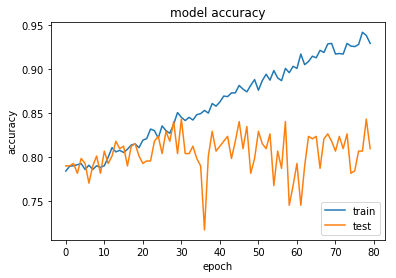

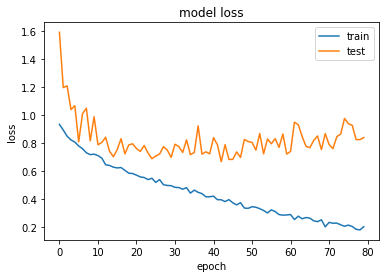

In [9]:
# list all data in history
print(history.history.keys())
# summarize history for accuracy
plt.plot(history.history['acc'])
plt.plot(history.history['val_acc'])
plt.title('model accuracy')
plt.ylabel('accuracy')
plt.xlabel('epoch')
plt.legend(['train', 'test'], loc='lower right')
plt.show()
# summarize history for loss
plt.plot(history.history['loss'])
plt.plot(history.history['val_loss'])
plt.title('model loss')
plt.ylabel('loss')
plt.xlabel('epoch')
plt.legend(['train', 'test'], loc='upper right')
plt.show()

# Using Class weights for training

In [3]:
t = np.argmax(Y_train,axis=1)
class_weights = class_weight.compute_class_weight('balanced',np.unique(t),t)

for i in range(len(class_weights)):
    print "C"+str(i+1)+" : ",class_weights[i]

C1 :  2.91181657848
C2 :  3.23091976517
C3 :  4.71714285714
C4 :  4.36772486772
C5 :  6.04761904762
C6 :  0.179359043998
C7 :  6.04761904762


In [4]:
def conv2d_bn(x, nb_filter, nb_row, nb_col,
              border_mode='same', subsample=(1, 1), bias=False):
    """
    Utility function to apply conv + BN. 
    (Slightly modified from https://github.com/fchollet/keras/blob/master/keras/applications/inception_v3.py)
    """
    if K.image_dim_ordering() == "th":
        channel_axis = 1
    else:
        channel_axis = -1
    x = Convolution2D(nb_filter, nb_row, nb_col,
                      subsample=subsample,
                      border_mode=border_mode,
                      bias=bias)(x)
    x = BatchNormalization(axis=channel_axis)(x)
    x = Activation('relu')(x)
    return x

def block_inception_a(input):
    if K.image_dim_ordering() == "th":
        channel_axis = 1
    else:
        channel_axis = -1

    branch_0 = conv2d_bn(input, 96, 1, 1)

    branch_1 = conv2d_bn(input, 64, 1, 1)
    branch_1 = conv2d_bn(branch_1, 96, 3, 3)

    branch_2 = conv2d_bn(input, 64, 1, 1)
    branch_2 = conv2d_bn(branch_2, 96, 3, 3)
    branch_2 = conv2d_bn(branch_2, 96, 3, 3)

    branch_3 = AveragePooling2D((3,3), strides=(1,1), border_mode='same')(input)
    branch_3 = conv2d_bn(branch_3, 96, 1, 1)

    x = merge([branch_0, branch_1, branch_2, branch_3], mode='concat', concat_axis=channel_axis)
    return x


def block_reduction_a(input):
    if K.image_dim_ordering() == "th":
        channel_axis = 1
    else:
        channel_axis = -1

    branch_0 = conv2d_bn(input, 384, 3, 3, subsample=(2,2), border_mode='valid')

    branch_1 = conv2d_bn(input, 192, 1, 1)
    branch_1 = conv2d_bn(branch_1, 224, 3, 3)
    branch_1 = conv2d_bn(branch_1, 256, 3, 3, subsample=(2,2), border_mode='valid')

    branch_2 = MaxPooling2D((3,3), strides=(2,2), border_mode='valid')(input)

    x = merge([branch_0, branch_1, branch_2], mode='concat', concat_axis=channel_axis)
    return x


def block_inception_b(input):
    if K.image_dim_ordering() == "th":
        channel_axis = 1
    else:
        channel_axis = -1

    branch_0 = conv2d_bn(input, 384, 1, 1)

    branch_1 = conv2d_bn(input, 192, 1, 1)
    branch_1 = conv2d_bn(branch_1, 224, 1, 7)
    branch_1 = conv2d_bn(branch_1, 256, 7, 1)

    branch_2 = conv2d_bn(input, 192, 1, 1)
    branch_2 = conv2d_bn(branch_2, 192, 7, 1)
    branch_2 = conv2d_bn(branch_2, 224, 1, 7)
    branch_2 = conv2d_bn(branch_2, 224, 7, 1)
    branch_2 = conv2d_bn(branch_2, 256, 1, 7)

    branch_3 = AveragePooling2D((3,3), strides=(1,1), border_mode='same')(input)
    branch_3 = conv2d_bn(branch_3, 128, 1, 1)

    x = merge([branch_0, branch_1, branch_2, branch_3], mode='concat', concat_axis=channel_axis)
    return x


def block_reduction_b(input):
    if K.image_dim_ordering() == "th":
        channel_axis = 1
    else:
        channel_axis = -1

    branch_0 = conv2d_bn(input, 192, 1, 1)
    branch_0 = conv2d_bn(branch_0, 192, 3, 3, subsample=(2, 2), border_mode='valid')

    branch_1 = conv2d_bn(input, 256, 1, 1)
    branch_1 = conv2d_bn(branch_1, 256, 1, 7)
    branch_1 = conv2d_bn(branch_1, 320, 7, 1)
    branch_1 = conv2d_bn(branch_1, 320, 3, 3, subsample=(2,2), border_mode='valid')

    branch_2 = MaxPooling2D((3, 3), strides=(2, 2), border_mode='valid')(input)

    x = merge([branch_0, branch_1, branch_2], mode='concat', concat_axis=channel_axis)
    return x


def block_inception_c(input):
    if K.image_dim_ordering() == "th":
        channel_axis = 1
    else:
        channel_axis = -1

    branch_0 = conv2d_bn(input, 256, 1, 1)

    branch_1 = conv2d_bn(input, 384, 1, 1)
    branch_10 = conv2d_bn(branch_1, 256, 1, 3)
    branch_11 = conv2d_bn(branch_1, 256, 3, 1)
    branch_1 = merge([branch_10, branch_11], mode='concat', concat_axis=channel_axis)


    branch_2 = conv2d_bn(input, 384, 1, 1)
    branch_2 = conv2d_bn(branch_2, 448, 3, 1)
    branch_2 = conv2d_bn(branch_2, 512, 1, 3)
    branch_20 = conv2d_bn(branch_2, 256, 1, 3)
    branch_21 = conv2d_bn(branch_2, 256, 3, 1)
    branch_2 = merge([branch_20, branch_21], mode='concat', concat_axis=channel_axis)

    branch_3 = AveragePooling2D((3, 3), strides=(1, 1), border_mode='same')(input)
    branch_3 = conv2d_bn(branch_3, 256, 1, 1)

    x = merge([branch_0, branch_1, branch_2, branch_3], mode='concat', concat_axis=channel_axis)
    return x


def inception_v4_base(input):
    if K.image_dim_ordering() == "th":
        channel_axis = 1
    else:
        channel_axis = -1

    # Input Shape is 299 x 299 x 3 (th) or 3 x 299 x 299 (th)
    net = conv2d_bn(input, 32, 3, 3, subsample=(2,2), border_mode='valid')
    net = conv2d_bn(net, 32, 3, 3, border_mode='valid')
    net = conv2d_bn(net, 64, 3, 3)

    branch_0 = MaxPooling2D((3,3), strides=(2,2), border_mode='valid')(net)

    branch_1 = conv2d_bn(net, 96, 3, 3, subsample=(2,2), border_mode='valid')

    net = merge([branch_0, branch_1], mode='concat', concat_axis=channel_axis)

    branch_0 = conv2d_bn(net, 64, 1, 1)
    branch_0 = conv2d_bn(branch_0, 96, 3, 3, border_mode='valid')

    branch_1 = conv2d_bn(net, 64, 1, 1)
    branch_1 = conv2d_bn(branch_1, 64, 1, 7)
    branch_1 = conv2d_bn(branch_1, 64, 7, 1)
    branch_1 = conv2d_bn(branch_1, 96, 3, 3, border_mode='valid')

    net = merge([branch_0, branch_1], mode='concat', concat_axis=channel_axis)

    branch_0 = conv2d_bn(net, 192, 3, 3, subsample=(2,2), border_mode='valid')
    branch_1 = MaxPooling2D((3,3), strides=(2,2), border_mode='valid')(net)

    net = merge([branch_0, branch_1], mode='concat', concat_axis=channel_axis)

    # 35 x 35 x 384
    # 4 x Inception-A blocks
    for idx in xrange(4):
      net = block_inception_a(net)

    # 35 x 35 x 384
    # Reduction-A block
    net = block_reduction_a(net)

    # 17 x 17 x 1024
    # 7 x Inception-B blocks
    for idx in xrange(7):
      net = block_inception_b(net)

    # 17 x 17 x 1024
    # Reduction-B block
    net = block_reduction_b(net)

    # 8 x 8 x 1536
    # 3 x Inception-C blocks
    for idx in xrange(3):
      net = block_inception_c(net)

    return net


def inception_v4_model(img_rows, img_cols, color_type=1, num_classeses=None, dropout_keep_prob=0.2):
    '''
    Inception V4 Model for Keras

    Model Schema is based on
    https://github.com/kentsommer/keras-inceptionV4

    ImageNet Pretrained Weights 
    Theano: https://github.com/kentsommer/keras-inceptionV4/releases/download/2.0/inception-v4_weights_th_dim_ordering_th_kernels.h5
    TensorFlow: https://github.com/kentsommer/keras-inceptionV4/releases/download/2.0/inception-v4_weights_tf_dim_ordering_tf_kernels.h5

    Parameters:
      img_rows, img_cols - resolution of inputs
      channel - 1 for grayscale, 3 for color 
      num_classes - number of class labels for our classification task
    '''

    # Input Shape is 299 x 299 x 3 (tf) or 3 x 299 x 299 (th)
    if K.image_dim_ordering() == 'th':
        inputs = Input((3, 300, 300))
    else:
        inputs = Input((300, 300, 3))

    # Make inception base
    net = inception_v4_base(inputs)


    # Final pooling and prediction

    # 8 x 8 x 1536
    net_old = AveragePooling2D((8,8), border_mode='valid')(net)

    # 1 x 1 x 1536
    net_old = Dropout(dropout_keep_prob)(net_old)
    net_old = Flatten()(net_old)

    # 1536
    predictions = Dense(output_dim=1001, activation='softmax')(net_old)

    model = Model(inputs, predictions, name='inception_v4')

    if K.image_dim_ordering() == 'th':
      # Use pre-trained weights for Theano backend
      weights_path = './inception-v4_weights_th_dim_ordering_th_kernels.h5'
    else:
      # Use pre-trained weights for Tensorflow backend
      weights_path = './inception-v4_weights_tf_dim_ordering_tf_kernels.h5'

    model.load_weights(weights_path, by_name=True)

    # Truncate and replace softmax layer for transfer learning
    # Cannot use model.layers.pop() since model is not of Sequential() type
    # The method below works since pre-trained weights are stored in layers but not in the model
    net_ft = AveragePooling2D((8,8), border_mode='valid')(net)
    net_ft = Dropout(dropout_keep_prob)(net_ft)
    net_ft = Flatten()(net_ft)
    predictions_ft = Dense(output_dim=num_classes, activation='softmax')(net_ft)

    model = Model(inputs, predictions_ft, name='inception_v4')

    # Learning rate is changed to 0.001
    sgd = SGD(lr=1e-3, decay=1e-6, momentum=0.9, nesterov=True)
    model.compile(optimizer=sgd, loss='categorical_crossentropy', metrics=['accuracy'])

    return model

if __name__ == '__main__':

    # Example to fine-tune on 3000 samples from Cifar10

    img_rows, img_cols = 300, 300 # Resolution of inputs
    channel = 3
    num_classes = 7
    batch_size = 8
    nb_epoch = 80

    # Load Cifar10 data. Please implement your own load_data() module for your own dataset
    #X_train, Y_train, X_valid, Y_valid = load_cifar10_data(img_rows, img_cols)

    # Load our model
    model = inception_v4_model(img_rows, img_cols, channel, num_classes, dropout_keep_prob=0.2)

    checkpoint = ModelCheckpoint('{val_acc:.4f}.hdf5', monitor='val_acc', verbose=1, save_best_only=True, mode='auto')
    
    # Start Fine-tuning
    history = model.fit(X_train, Y_train,
              batch_size=batch_size,
              nb_epoch=nb_epoch,
              shuffle=True,
              verbose=1,
              validation_data=(X_valid, Y_valid), callbacks = [checkpoint], class_weight = class_weights
              )

    # Make predictions
    predictions_valid = model.predict(X_test, batch_size=batch_size, verbose=1)

    # Cross-entropy loss score
    score = log_loss(Y_test, predictions_valid)

/home/talha/anaconda/envs/conda_env/lib/python2.7/site-packages/ipykernel_launcher.py:14: UserWarning: Update your `Conv2D` call to the Keras 2 API: `Conv2D(32, (3, 3), padding="valid", strides=(2, 2), use_bias=False)`
  
/home/talha/anaconda/envs/conda_env/lib/python2.7/site-packages/ipykernel_launcher.py:14: UserWarning: Update your `Conv2D` call to the Keras 2 API: `Conv2D(32, (3, 3), padding="valid", strides=(1, 1), use_bias=False)`
  
/home/talha/anaconda/envs/conda_env/lib/python2.7/site-packages/ipykernel_launcher.py:14: UserWarning: Update your `Conv2D` call to the Keras 2 API: `Conv2D(64, (3, 3), padding="same", strides=(1, 1), use_bias=False)`
  
/home/talha/anaconda/envs/conda_env/lib/python2.7/site-packages/ipykernel_launcher.py:143: UserWarning: Update your `MaxPooling2D` call to the Keras 2 API: `MaxPooling2D((3, 3), padding="valid", strides=(2, 2))`
/home/talha/anaconda/envs/conda_env/lib/python2.7/site-packages/ipykernel_launcher.py:14: UserWarning: Update your `Conv2D`

/home/talha/anaconda/envs/conda_env/lib/python2.7/site-packages/ipykernel_launcher.py:14: UserWarning: Update your `Conv2D` call to the Keras 2 API: `Conv2D(256, (1, 3), padding="same", strides=(1, 1), use_bias=False)`
  
/home/talha/anaconda/envs/conda_env/lib/python2.7/site-packages/ipykernel_launcher.py:14: UserWarning: Update your `Conv2D` call to the Keras 2 API: `Conv2D(256, (3, 1), padding="same", strides=(1, 1), use_bias=False)`
  
/home/talha/anaconda/envs/conda_env/lib/python2.7/site-packages/ipykernel_launcher.py:115: UserWarning: The `merge` function is deprecated and will be removed after 08/2017. Use instead layers from `keras.layers.merge`, e.g. `add`, `concatenate`, etc.
/home/talha/anaconda/envs/conda_env/lib/python2.7/site-packages/ipykernel_launcher.py:14: UserWarning: Update your `Conv2D` call to the Keras 2 API: `Conv2D(448, (3, 1), padding="same", strides=(1, 1), use_bias=False)`
  
/home/talha/anaconda/envs/conda_env/lib/python2.7/site-packages/ipykernel_launcher

Train on 1651 samples, validate on 354 samples
Epoch 1/80
1648/1651 [============================>.] - ETA: 0s - loss: 0.9537 - acc: 0.7785
Epoch 00001: val_acc improved from -inf to 0.79661, saving model to 0.7966.hdf5
1651/1651 [==============================] - 256s 155ms/step - loss: 0.9545 - acc: 0.7783 - val_loss: 1.3290 - val_acc: 0.7966
Epoch 2/80
1648/1651 [============================>.] - ETA: 0s - loss: 0.8642 - acc: 0.7882
Epoch 00002: val_acc did not improve
1651/1651 [==============================] - 206s 125ms/step - loss: 0.8647 - acc: 0.7880 - val_loss: 1.8202 - val_acc: 0.7232
Epoch 3/80
1648/1651 [============================>.] - ETA: 0s - loss: 0.8124 - acc: 0.7919
Epoch 00003: val_acc did not improve
1651/1651 [==============================] - 176s 106ms/step - loss: 0.8114 - acc: 0.7922 - val_loss: 1.2320 - val_acc: 0.7345
Epoch 4/80
1648/1651 [============================>.] - ETA: 0s - loss: 0.7763 - acc: 0.7852
Epoch 00004: val_acc improved from 0.79661 to 

1648/1651 [============================>.] - ETA: 0s - loss: 0.0923 - acc: 0.9691
Epoch 00062: val_acc did not improve
1651/1651 [==============================] - 170s 103ms/step - loss: 0.0929 - acc: 0.9685 - val_loss: 0.7356 - val_acc: 0.8588
Epoch 63/80
1648/1651 [============================>.] - ETA: 0s - loss: 0.0881 - acc: 0.9672
Epoch 00063: val_acc did not improve
1651/1651 [==============================] - 172s 104ms/step - loss: 0.0879 - acc: 0.9673 - val_loss: 0.7058 - val_acc: 0.8588
Epoch 64/80
1648/1651 [============================>.] - ETA: 0s - loss: 0.0528 - acc: 0.9830
Epoch 00064: val_acc did not improve
1651/1651 [==============================] - 172s 104ms/step - loss: 0.0528 - acc: 0.9830 - val_loss: 0.6893 - val_acc: 0.8559
Epoch 65/80
1648/1651 [============================>.] - ETA: 0s - loss: 0.0603 - acc: 0.9794
Epoch 00065: val_acc did not improve
1651/1651 [==============================] - 174s 105ms/step - loss: 0.0602 - acc: 0.9794 - val_loss: 0.759

In [6]:
model.load_weights('0.8757.hdf5')
[loss, acc] = model.evaluate(X_test,Y_test)
print "Accuracy : ",acc

357/357 [==============================] - 11s 31ms/step
Accuracy :  0.859943977925


['acc', 'loss', 'val_acc', 'val_loss']


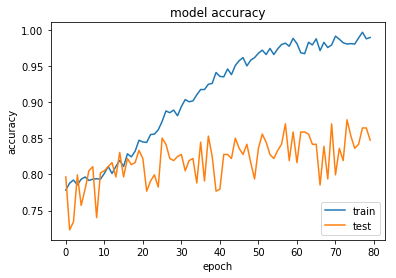

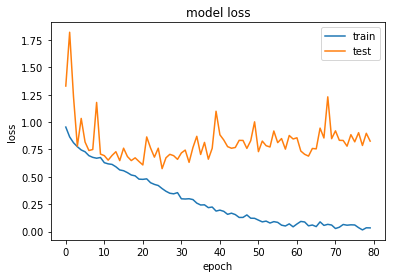

In [7]:
# list all data in history
print(history.history.keys())
# summarize history for accuracy
plt.plot(history.history['acc'])
plt.plot(history.history['val_acc'])
plt.title('model accuracy')
plt.ylabel('accuracy')
plt.xlabel('epoch')
plt.legend(['train', 'test'], loc='lower right')
plt.show()
# summarize history for loss
plt.plot(history.history['loss'])
plt.plot(history.history['val_loss'])
plt.title('model loss')
plt.ylabel('loss')
plt.xlabel('epoch')
plt.legend(['train', 'test'], loc='upper right')
plt.show()

# Using transfer learning through GoogleNet does increases accuracy from 0.859 to 0.865

# ResNet

In [3]:
def identity_block(input_tensor, kernel_size, filters, stage, block):
    '''The identity_block is the block that has no conv layer at shortcut
    # Arguments
        input_tensor: input tensor
        kernel_size: defualt 3, the kernel size of middle conv layer at main path
        filters: list of integers, the nb_filters of 3 conv layer at main path
        stage: integer, current stage label, used for generating layer names
        block: 'a','b'..., current block label, used for generating layer names
    '''
    eps = 1.1e-5
    nb_filter1, nb_filter2, nb_filter3 = filters
    conv_name_base = 'res' + str(stage) + block + '_branch'
    bn_name_base = 'bn' + str(stage) + block + '_branch'
    scale_name_base = 'scale' + str(stage) + block + '_branch'

    x = Convolution2D(nb_filter1, 1, 1, name=conv_name_base + '2a', bias=False)(input_tensor)
    x = BatchNormalization(epsilon=eps, axis=bn_axis, name=bn_name_base + '2a')(x)
    x = Scale(axis=bn_axis, name=scale_name_base + '2a')(x)
    x = Activation('relu', name=conv_name_base + '2a_relu')(x)

    x = ZeroPadding2D((1, 1), name=conv_name_base + '2b_zeropadding')(x)
    x = Convolution2D(nb_filter2, kernel_size, kernel_size,
                      name=conv_name_base + '2b', bias=False)(x)
    x = BatchNormalization(epsilon=eps, axis=bn_axis, name=bn_name_base + '2b')(x)
    x = Scale(axis=bn_axis, name=scale_name_base + '2b')(x)
    x = Activation('relu', name=conv_name_base + '2b_relu')(x)

    x = Convolution2D(nb_filter3, 1, 1, name=conv_name_base + '2c', bias=False)(x)
    x = BatchNormalization(epsilon=eps, axis=bn_axis, name=bn_name_base + '2c')(x)
    x = Scale(axis=bn_axis, name=scale_name_base + '2c')(x)

    x = merge([x, input_tensor], mode='sum', name='res' + str(stage) + block)
    x = Activation('relu', name='res' + str(stage) + block + '_relu')(x)
    return x

def conv_block(input_tensor, kernel_size, filters, stage, block, strides=(2, 2)):
    '''conv_block is the block that has a conv layer at shortcut
    # Arguments
        input_tensor: input tensor
        kernel_size: defualt 3, the kernel size of middle conv layer at main path
        filters: list of integers, the nb_filters of 3 conv layer at main path
        stage: integer, current stage label, used for generating layer names
        block: 'a','b'..., current block label, used for generating layer names
    Note that from stage 3, the first conv layer at main path is with subsample=(2,2)
    And the shortcut should have subsample=(2,2) as well
    '''
    eps = 1.1e-5
    nb_filter1, nb_filter2, nb_filter3 = filters
    conv_name_base = 'res' + str(stage) + block + '_branch'
    bn_name_base = 'bn' + str(stage) + block + '_branch'
    scale_name_base = 'scale' + str(stage) + block + '_branch'

    x = Convolution2D(nb_filter1, 1, 1, subsample=strides,
                      name=conv_name_base + '2a', bias=False)(input_tensor)
    x = BatchNormalization(epsilon=eps, axis=bn_axis, name=bn_name_base + '2a')(x)
    x = Scale(axis=bn_axis, name=scale_name_base + '2a')(x)
    x = Activation('relu', name=conv_name_base + '2a_relu')(x)

    x = ZeroPadding2D((1, 1), name=conv_name_base + '2b_zeropadding')(x)
    x = Convolution2D(nb_filter2, kernel_size, kernel_size,
                      name=conv_name_base + '2b', bias=False)(x)
    x = BatchNormalization(epsilon=eps, axis=bn_axis, name=bn_name_base + '2b')(x)
    x = Scale(axis=bn_axis, name=scale_name_base + '2b')(x)
    x = Activation('relu', name=conv_name_base + '2b_relu')(x)

    x = Convolution2D(nb_filter3, 1, 1, name=conv_name_base + '2c', bias=False)(x)
    x = BatchNormalization(epsilon=eps, axis=bn_axis, name=bn_name_base + '2c')(x)
    x = Scale(axis=bn_axis, name=scale_name_base + '2c')(x)

    shortcut = Convolution2D(nb_filter3, 1, 1, subsample=strides,
                             name=conv_name_base + '1', bias=False)(input_tensor)
    shortcut = BatchNormalization(epsilon=eps, axis=bn_axis, name=bn_name_base + '1')(shortcut)
    shortcut = Scale(axis=bn_axis, name=scale_name_base + '1')(shortcut)

    x = merge([x, shortcut], mode='sum', name='res' + str(stage) + block)
    x = Activation('relu', name='res' + str(stage) + block + '_relu')(x)
    return x

def resnet152_model(img_rows, img_cols, color_type=1, num_classes=None):
    """
    Resnet 152 Model for Keras

    Model Schema and layer naming follow that of the original Caffe implementation
    https://github.com/KaimingHe/deep-residual-networks

    ImageNet Pretrained Weights 
    Theano: https://drive.google.com/file/d/0Byy2AcGyEVxfZHhUT3lWVWxRN28/view?usp=sharing
    TensorFlow: https://drive.google.com/file/d/0Byy2AcGyEVxfeXExMzNNOHpEODg/view?usp=sharing

    Parameters:
      img_rows, img_cols - resolution of inputs
      channel - 1 for grayscale, 3 for color 
      num_classes - number of class labels for our classification task
    """
    eps = 1.1e-5

    # Handle Dimension Ordering for different backends
    global bn_axis
    if K.image_dim_ordering() == 'tf':
      bn_axis = 3
      img_input = Input(shape=(img_rows, img_cols, color_type), name='data')
    else:
      bn_axis = 1
      img_input = Input(shape=(color_type, img_rows, img_cols), name='data')

    x = ZeroPadding2D((3, 3), name='conv1_zeropadding')(img_input)
    x = Convolution2D(64, 7, 7, subsample=(2, 2), name='conv1', bias=False)(x)
    x = BatchNormalization(epsilon=eps, axis=bn_axis, name='bn_conv1')(x)
    x = Scale(axis=bn_axis, name='scale_conv1')(x)
    x = Activation('relu', name='conv1_relu')(x)
    x = MaxPooling2D((3, 3), strides=(2, 2), name='pool1')(x)

    x = conv_block(x, 3, [64, 64, 256], stage=2, block='a', strides=(1, 1))
    x = identity_block(x, 3, [64, 64, 256], stage=2, block='b')
    x = identity_block(x, 3, [64, 64, 256], stage=2, block='c')

    x = conv_block(x, 3, [128, 128, 512], stage=3, block='a')
    for i in range(1,8):
      x = identity_block(x, 3, [128, 128, 512], stage=3, block='b'+str(i))

    x = conv_block(x, 3, [256, 256, 1024], stage=4, block='a')
    for i in range(1,36):
      x = identity_block(x, 3, [256, 256, 1024], stage=4, block='b'+str(i))

    x = conv_block(x, 3, [512, 512, 2048], stage=5, block='a')
    x = identity_block(x, 3, [512, 512, 2048], stage=5, block='b')
    x = identity_block(x, 3, [512, 512, 2048], stage=5, block='c')

    x_fc = AveragePooling2D((7, 7), name='avg_pool')(x)
    x_fc = Flatten()(x_fc)
    x_fc = Dense(1000, activation='softmax', name='fc1000')(x_fc)

    model = Model(img_input, x_fc)

    if K.image_dim_ordering() == 'th':
      # Use pre-trained weights for Theano backend
      weights_path = './resnet152_weights_th.h5'
    else:
      # Use pre-trained weights for Tensorflow backend
      weights_path = './resnet152_weights_tf.h5'

    model.load_weights(weights_path, by_name=True)

    # Truncate and replace softmax layer for transfer learning
    # Cannot use model.layers.pop() since model is not of Sequential() type
    # The method below works since pre-trained weights are stored in layers but not in the model
    x_newfc = AveragePooling2D((7, 7), name='avg_pool')(x)
    x_newfc = Flatten()(x_newfc)
    x_newfc = Dense(num_classes, activation='softmax', name='fc8')(x_newfc)

    model = Model(img_input, x_newfc)

    # Learning rate is changed to 0.001
    sgd = SGD(lr=1e-3, decay=1e-6, momentum=0.9, nesterov=True)
    model.compile(optimizer=sgd, loss='categorical_crossentropy', metrics=['accuracy'])

    return model

if __name__ == '__main__':

    # Example to fine-tune on 3000 samples from Cifar10

    img_rows, img_cols = 224, 224 # Resolution of inputs
    channel = 3
    num_classes = 7 
    batch_size = 4
    nb_epoch = 80

    # Load Cifar10 data. Please implement your own load_data() module for your own dataset
    #X_train, Y_train, X_valid, Y_valid = load_cifar10_data(img_rows, img_cols)

    # Load our model
    model = resnet152_model(img_rows, img_cols, channel, num_classes)

    checkpoint = ModelCheckpoint('{val_acc:.4f}.hdf5', monitor='val_acc', verbose=1, save_best_only=True, mode='auto')
    
    
    # Start Fine-tuning
    history = model.fit(X_train, Y_train,
              batch_size=batch_size,
              nb_epoch=nb_epoch,
              shuffle=True,
              verbose=1,
              validation_data=(X_valid, Y_valid), callbacks = [checkpoint]
              )

    # Make predictions
    predictions_valid = model.predict(X_valid, batch_size=batch_size, verbose=1)

    # Cross-entropy loss score
    score = log_loss(Y_valid, predictions_valid)

/home/talha/anaconda/envs/conda_env/lib/python2.7/site-packages/ipykernel_launcher.py:107: UserWarning: Update your `Conv2D` call to the Keras 2 API: `Conv2D(64, (7, 7), strides=(2, 2), use_bias=False, name="conv1")`
/home/talha/anaconda/envs/conda_env/lib/python2.7/site-packages/ipykernel_launcher.py:54: UserWarning: Update your `Conv2D` call to the Keras 2 API: `Conv2D(64, (1, 1), strides=(1, 1), use_bias=False, name="res2a_branch2a")`
/home/talha/anaconda/envs/conda_env/lib/python2.7/site-packages/ipykernel_launcher.py:61: UserWarning: Update your `Conv2D` call to the Keras 2 API: `Conv2D(64, (3, 3), use_bias=False, name="res2a_branch2b")`
/home/talha/anaconda/envs/conda_env/lib/python2.7/site-packages/ipykernel_launcher.py:66: UserWarning: Update your `Conv2D` call to the Keras 2 API: `Conv2D(256, (1, 1), use_bias=False, name="res2a_branch2c")`
/home/talha/anaconda/envs/conda_env/lib/python2.7/site-packages/ipykernel_launcher.py:71: UserWarning: Update your `Conv2D` call to the Ker

/home/talha/anaconda/envs/conda_env/lib/python2.7/site-packages/ipykernel_launcher.py:23: UserWarning: Update your `Conv2D` call to the Keras 2 API: `Conv2D(128, (3, 3), use_bias=False, name="res3b7_branch2b")`
/home/talha/anaconda/envs/conda_env/lib/python2.7/site-packages/ipykernel_launcher.py:28: UserWarning: Update your `Conv2D` call to the Keras 2 API: `Conv2D(512, (1, 1), use_bias=False, name="res3b7_branch2c")`
/home/talha/anaconda/envs/conda_env/lib/python2.7/site-packages/ipykernel_launcher.py:54: UserWarning: Update your `Conv2D` call to the Keras 2 API: `Conv2D(256, (1, 1), strides=(2, 2), use_bias=False, name="res4a_branch2a")`
/home/talha/anaconda/envs/conda_env/lib/python2.7/site-packages/ipykernel_launcher.py:61: UserWarning: Update your `Conv2D` call to the Keras 2 API: `Conv2D(256, (3, 3), use_bias=False, name="res4a_branch2b")`
/home/talha/anaconda/envs/conda_env/lib/python2.7/site-packages/ipykernel_launcher.py:66: UserWarning: Update your `Conv2D` call to the Keras 

/home/talha/anaconda/envs/conda_env/lib/python2.7/site-packages/ipykernel_launcher.py:28: UserWarning: Update your `Conv2D` call to the Keras 2 API: `Conv2D(1024, (1, 1), use_bias=False, name="res4b11_branch2c")`
/home/talha/anaconda/envs/conda_env/lib/python2.7/site-packages/ipykernel_launcher.py:16: UserWarning: Update your `Conv2D` call to the Keras 2 API: `Conv2D(256, (1, 1), use_bias=False, name="res4b12_branch2a")`
  app.launch_new_instance()
/home/talha/anaconda/envs/conda_env/lib/python2.7/site-packages/ipykernel_launcher.py:23: UserWarning: Update your `Conv2D` call to the Keras 2 API: `Conv2D(256, (3, 3), use_bias=False, name="res4b12_branch2b")`
/home/talha/anaconda/envs/conda_env/lib/python2.7/site-packages/ipykernel_launcher.py:28: UserWarning: Update your `Conv2D` call to the Keras 2 API: `Conv2D(1024, (1, 1), use_bias=False, name="res4b12_branch2c")`
/home/talha/anaconda/envs/conda_env/lib/python2.7/site-packages/ipykernel_launcher.py:16: UserWarning: Update your `Conv2D

/home/talha/anaconda/envs/conda_env/lib/python2.7/site-packages/ipykernel_launcher.py:23: UserWarning: Update your `Conv2D` call to the Keras 2 API: `Conv2D(256, (3, 3), use_bias=False, name="res4b24_branch2b")`
/home/talha/anaconda/envs/conda_env/lib/python2.7/site-packages/ipykernel_launcher.py:28: UserWarning: Update your `Conv2D` call to the Keras 2 API: `Conv2D(1024, (1, 1), use_bias=False, name="res4b24_branch2c")`
/home/talha/anaconda/envs/conda_env/lib/python2.7/site-packages/ipykernel_launcher.py:16: UserWarning: Update your `Conv2D` call to the Keras 2 API: `Conv2D(256, (1, 1), use_bias=False, name="res4b25_branch2a")`
  app.launch_new_instance()
/home/talha/anaconda/envs/conda_env/lib/python2.7/site-packages/ipykernel_launcher.py:23: UserWarning: Update your `Conv2D` call to the Keras 2 API: `Conv2D(256, (3, 3), use_bias=False, name="res4b25_branch2b")`
/home/talha/anaconda/envs/conda_env/lib/python2.7/site-packages/ipykernel_launcher.py:28: UserWarning: Update your `Conv2D`

/home/talha/anaconda/envs/conda_env/lib/python2.7/site-packages/ipykernel_launcher.py:71: UserWarning: Update your `Conv2D` call to the Keras 2 API: `Conv2D(2048, (1, 1), strides=(2, 2), use_bias=False, name="res5a_branch1")`
/home/talha/anaconda/envs/conda_env/lib/python2.7/site-packages/ipykernel_launcher.py:16: UserWarning: Update your `Conv2D` call to the Keras 2 API: `Conv2D(512, (1, 1), use_bias=False, name="res5b_branch2a")`
  app.launch_new_instance()
/home/talha/anaconda/envs/conda_env/lib/python2.7/site-packages/ipykernel_launcher.py:23: UserWarning: Update your `Conv2D` call to the Keras 2 API: `Conv2D(512, (3, 3), use_bias=False, name="res5b_branch2b")`
/home/talha/anaconda/envs/conda_env/lib/python2.7/site-packages/ipykernel_launcher.py:28: UserWarning: Update your `Conv2D` call to the Keras 2 API: `Conv2D(2048, (1, 1), use_bias=False, name="res5b_branch2c")`
/home/talha/anaconda/envs/conda_env/lib/python2.7/site-packages/ipykernel_launcher.py:16: UserWarning: Update your 

Train on 1652 samples, validate on 355 samples
Epoch 1/80
1648/1652 [============================>.] - ETA: 0s - loss: 0.4646 - acc: 0.8610
Epoch 00001: val_acc improved from -inf to 0.76338, saving model to 0.7634.hdf5
1652/1652 [==============================] - 400s 242ms/step - loss: 0.4637 - acc: 0.8614 - val_loss: 0.9122 - val_acc: 0.7634
Epoch 2/80
1648/1652 [============================>.] - ETA: 0s - loss: 0.1838 - acc: 0.9424
Epoch 00002: val_acc improved from 0.76338 to 0.86197, saving model to 0.8620.hdf5
1652/1652 [==============================] - 230s 139ms/step - loss: 0.1836 - acc: 0.9425 - val_loss: 0.4400 - val_acc: 0.8620
Epoch 3/80
1648/1652 [============================>.] - ETA: 0s - loss: 0.0740 - acc: 0.9757
Epoch 00003: val_acc improved from 0.86197 to 0.94366, saving model to 0.9437.hdf5
1652/1652 [==============================] - 257s 155ms/step - loss: 0.0738 - acc: 0.9758 - val_loss: 0.2318 - val_acc: 0.9437
Epoch 4/80
1648/1652 [=========================

Epoch 32/80
1648/1652 [============================>.] - ETA: 0s - loss: 0.0034 - acc: 0.9994
Epoch 00032: val_acc did not improve
1652/1652 [==============================] - 299s 181ms/step - loss: 0.0034 - acc: 0.9994 - val_loss: 0.2943 - val_acc: 0.9465
Epoch 33/80
1648/1652 [============================>.] - ETA: 0s - loss: 0.0018 - acc: 0.9994
Epoch 00033: val_acc did not improve
1652/1652 [==============================] - 297s 180ms/step - loss: 0.0018 - acc: 0.9994 - val_loss: 0.3072 - val_acc: 0.9437
Epoch 34/80
1648/1652 [============================>.] - ETA: 0s - loss: 6.5338e-04 - acc: 1.0000
Epoch 00034: val_acc did not improve
1652/1652 [==============================] - 316s 191ms/step - loss: 6.5257e-04 - acc: 1.0000 - val_loss: 0.2541 - val_acc: 0.9465
Epoch 35/80
1648/1652 [============================>.] - ETA: 0s - loss: 0.0011 - acc: 1.0000
Epoch 00035: val_acc did not improve
1652/1652 [==============================] - 266s 161ms/step - loss: 0.0011 - acc: 1.00

In [6]:
model.load_weights('0.9690.hdf5')
[loss, acc] = model.evaluate(X_test,Y_test)
print "Accuracy : ",acc

357/357 [==============================] - 10s 29ms/step
Accuracy :  0.935574229775


['acc', 'loss', 'val_acc', 'val_loss']


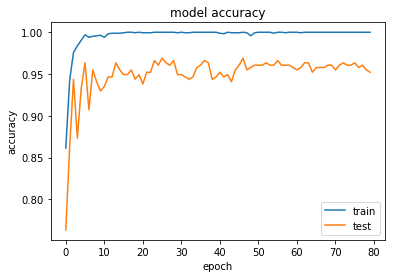

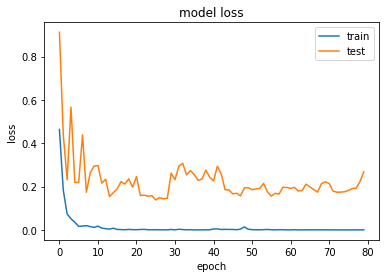

In [5]:
# list all data in history
print(history.history.keys())
# summarize history for accuracy
plt.plot(history.history['acc'])
plt.plot(history.history['val_acc'])
plt.title('model accuracy')
plt.ylabel('accuracy')
plt.xlabel('epoch')
plt.legend(['train', 'test'], loc='lower right')
plt.show()
# summarize history for loss
plt.plot(history.history['loss'])
plt.plot(history.history['val_loss'])
plt.title('model loss')
plt.ylabel('loss')
plt.xlabel('epoch')
plt.legend(['train', 'test'], loc='upper right')
plt.show()

# Using transfer learning through ResNet does increases accuracy from 0.865 to 0.935

# Part 2 - Conclusion

# Using transfer learning increased accuracy from 0.859 to 0.865 using GoogleNet while it further increased to 0.935 using ResNet

# Wasserstein Generative Adversarial Network (GAN)

# Model

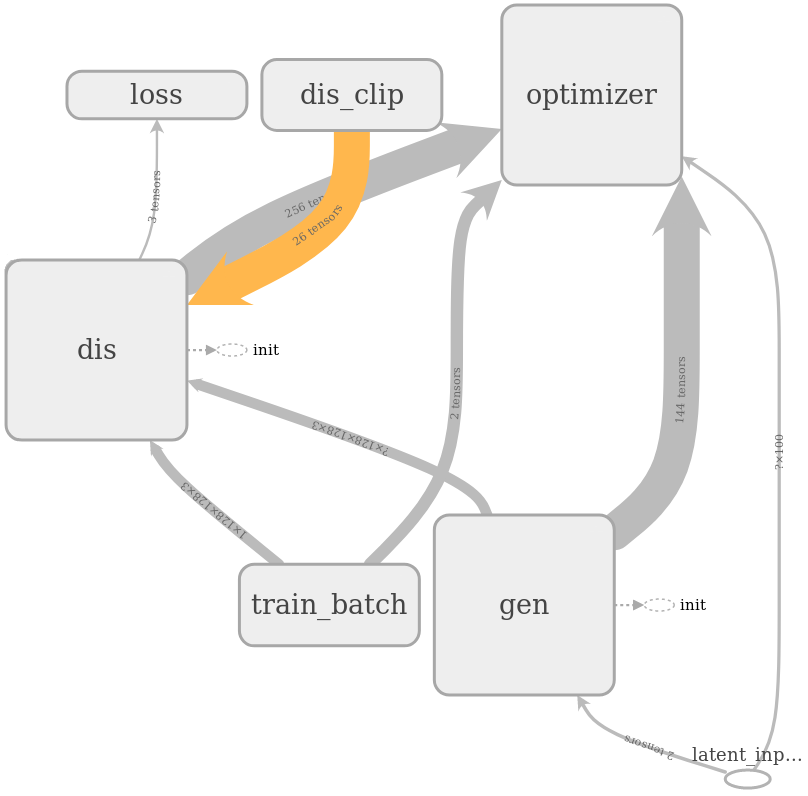
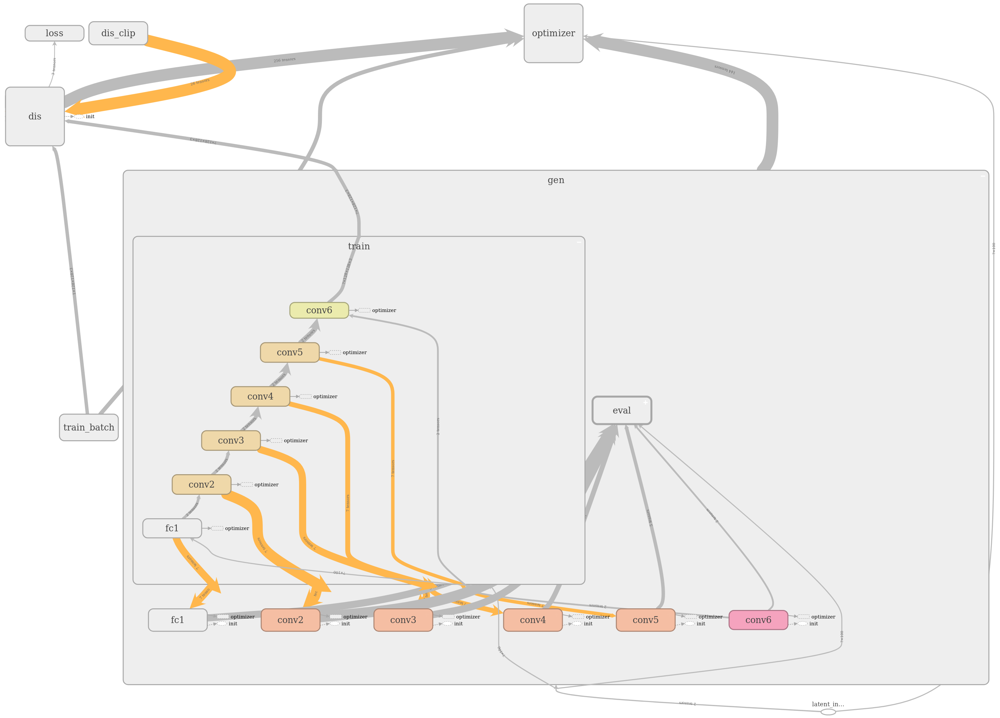
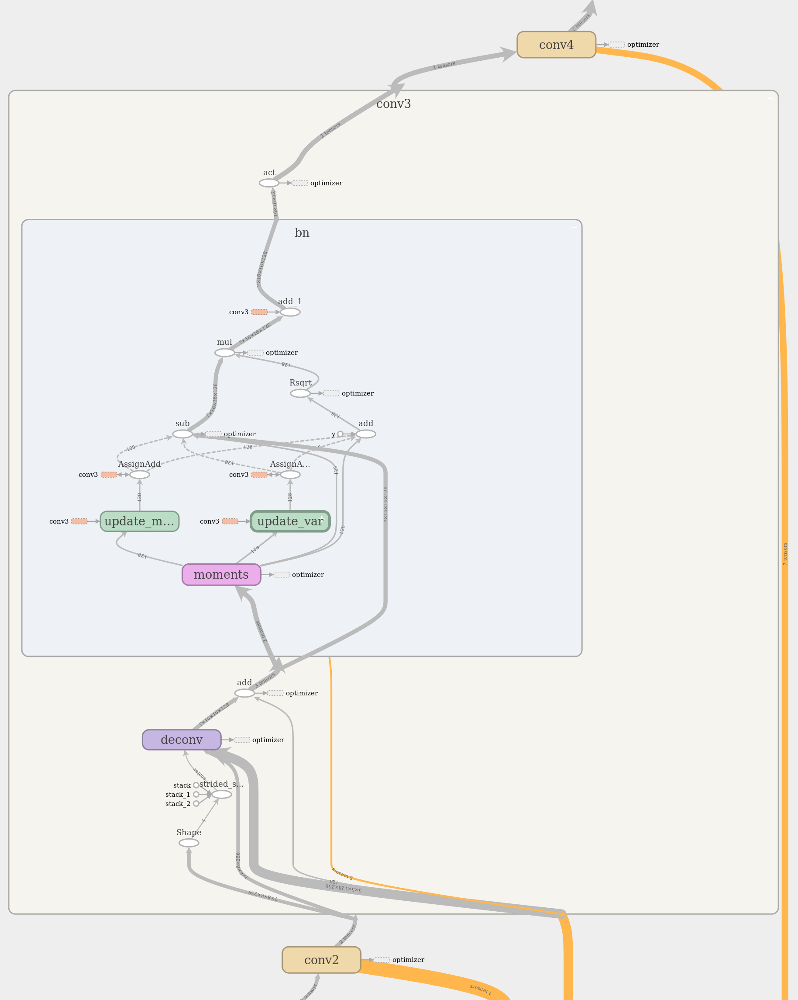
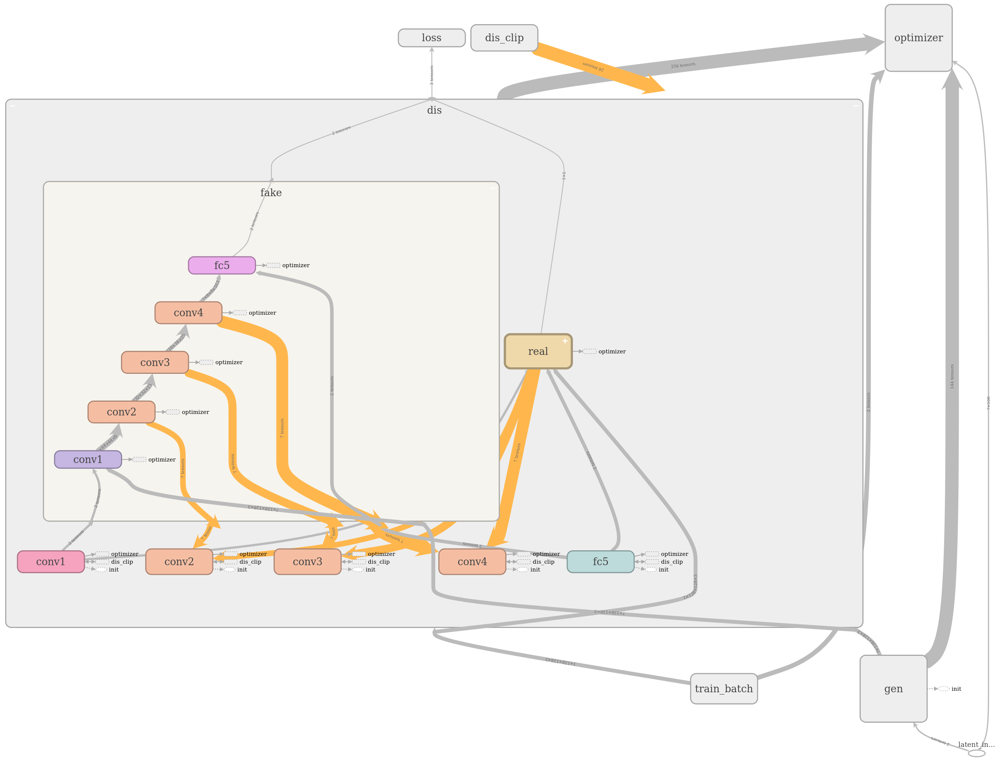
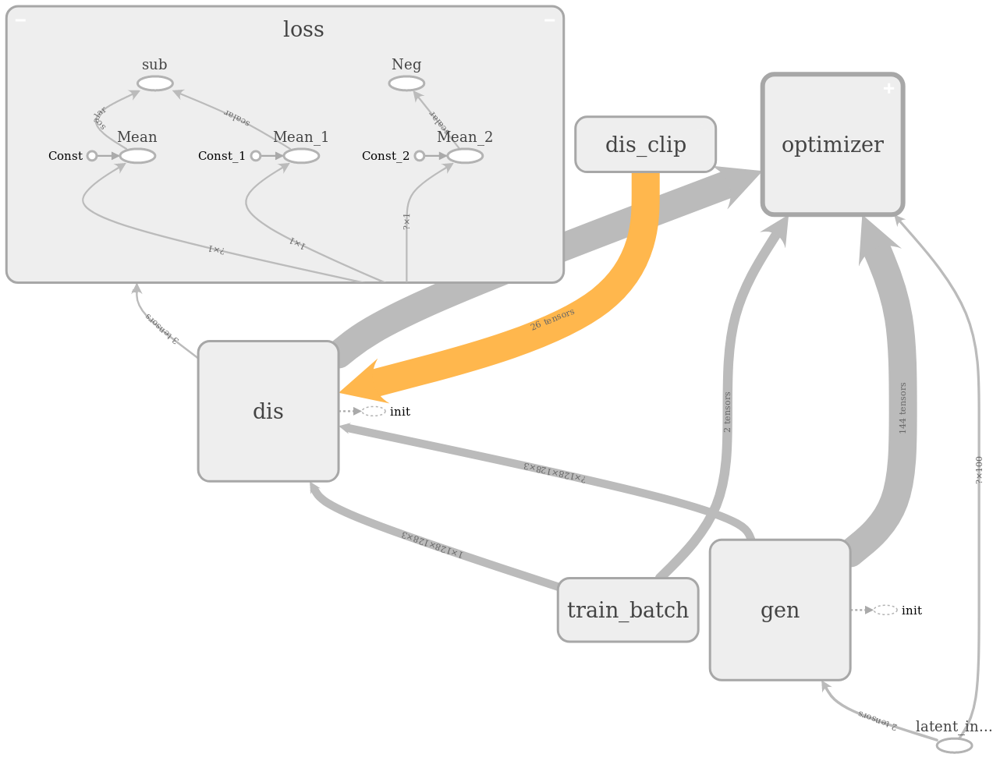

# Saving images to strings

In [ ]:
p = argparse.ArgumentParser()
p.add_argument("--images-path", required=True, type=str, help='input folder with images')
p.add_argument("--record-path", required=True, type=str,  help='output TFRecord')
p.add_argument("--depth", required=True, type=int, choices=set((3, 1)), default=3, help='image output depth')
p.add_argument("--resize", required=True, type=str, help='image output size wxh')
args = p.parse_args()

resize = args.resize
depth = args.depth
images_path = args.images_path
record_path = args.record_path

if resize is not None:
	width, height = [int(val) for val in resize.split('x')]

with open(record_path, 'w') as record:
	for img_path in os.listdir(images_path):
		
		img=cv2.imread(os.path.join(images_path, img_path))
		
		if depth == 1:
			img=cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
				
		if resize is not None:
			img=cv2.resize(img, (width, height))

		record.write(img.tostring())

# Training GAN

In [ ]:
LATENT_DIM = 100
HEIGHT, WIDTH, DEPTH = 128, 128, 3
GEN_H1, GEN_W1 = 4, 4
GEN_D1, GEN_D2, GEN_D3, GEN_D4, GEN_D5 = 512, 256, 128, 64, 32
DIS_D1, DIS_D2, DIS_D3, DIS_D4 = 64, 128, 256, 512

BATCH_SIZE, DIS_ITERS, LEARNING_RATE, TRAIN_ITERS = 100, 3, 1e-4, 6400
EVAL_ROWS, EVAL_COLS, SAMPLES_PATH, EVAL_INTERVAL = 8, 12, './samples', 500
SAVE_INTERVAL, MODEL_PATH = 10000, './model'

# -------------------------------------------------------------------------
# -------------------------- batch normalization --------------------------
# -------------------------------------------------------------------------

def assign_decay(orig_val, new_val, momentum, name):

	with tf.name_scope(name):

		scaled_diff = (1 - momentum) * (new_val - orig_val)

	return tf.assign_add(orig_val, scaled_diff)

def batch_norm(x, train_logical, decay, epsilon, scope=None, shift=True, scale=False):

	channels = x.get_shape()[-1]
	ndim = len(x.shape)

	with tf.variable_scope(scope):

		moving_m = tf.get_variable('mean', [channels], initializer=tf.zeros_initializer, trainable=False)
		moving_v = tf.get_variable('var', [channels], initializer=tf.ones_initializer, trainable=False)

		if train_logical:

			m, v = tf.nn.moments(x, range(ndim - 1))
			update_m = assign_decay(moving_m, m, decay, 'update_mean')
			update_v = assign_decay(moving_v, v, decay, 'update_var')

			with tf.control_dependencies([update_m, update_v]):
				output = (x - m) * tf.rsqrt(v + epsilon)

		else:
			m, v = moving_m, moving_v
			output = (x - m) * tf.rsqrt(v + epsilon)

		if scale:
			output *= tf.get_variable('gamma', [channels], initializer=tf.ones_initializer)

		if shift:
			output += tf.get_variable('beta', [channels], initializer=tf.zeros_initializer)

	return output

# -------------------------------------------------------------------
# -------------------------- record reader --------------------------
# -------------------------------------------------------------------

def read_example(filename):

	reader = tf.FixedLengthRecordReader(HEIGHT*WIDTH*DEPTH)
	filename_queue = tf.train.string_input_producer([filename], num_epochs=None)
	key, serialized_example = reader.read(filename_queue)

	image_raw = tf.decode_raw(serialized_example, tf.uint8)
	image = tf.cast(tf.reshape(image_raw, [HEIGHT, WIDTH, DEPTH]), tf.float32)

	return image

def preprocess(image):

	image = image/255.0

	image = tf.image.random_brightness(image, max_delta=0.1)
	image = tf.image.random_contrast(image, lower=0.9, upper=1.1)
	image = tf.image.random_flip_left_right(image)

	return image

def make_batch(image, batch_size):

	min_queue_examples = 500

	batch_images = tf.train.shuffle_batch([image], batch_size=batch_size, 
					      capacity=min_queue_examples+10*batch_size,
					      min_after_dequeue=min_queue_examples, num_threads=8)

	return batch_images

def read_record(filename, batch_size):
	
	image = read_example(filename)
	image = preprocess(image)
	batch_images = make_batch(image,batch_size)

	return batch_images

# ---------------------------------------------------------------
# -------------------------- generator -------------------------
# ---------------------------------------------------------------

def conv_transpose(x, out_depth, kernel, strides, name):

	in_shape = x.get_shape().as_list()
	in_batch = tf.shape(x)[0]
	in_height, in_width, in_depth = in_shape[1:]
	out_shape = [in_batch, in_height*strides[0], in_width*strides[1], out_depth]

	with tf.name_scope(name): 

		w = tf.get_variable('w', shape=[kernel[0], kernel[1], out_depth, in_depth], initializer=tf.truncated_normal_initializer(stddev=0.02))
		b = tf.get_variable('b', shape=[out_depth], initializer=tf.zeros_initializer())

		conv = tf.nn.conv2d_transpose(x, filter=w, output_shape=out_shape, strides=[1, 2, 2, 1], padding='SAME', name='deconv')
		conv = tf.add(conv, b, name='add')

	return conv	

def gen_conv_block(x, depth, train_logical, scope, final=False):

	with tf.variable_scope(scope): 

		conv = conv_transpose(x, depth, kernel=[5,5], strides=[2,2], name='conv')

		if final:
			act = tf.nn.sigmoid(conv, name='act')

		else:
			bn = batch_norm(conv, train_logical=train_logical, epsilon=1e-5, decay = 0.9, scope='bn')
			act = tf.nn.relu(bn, name='act')

	return act

def gen_fc_block(x, height, width, depth, train_logical, scope):

	latent_dim = x.get_shape()[1]

	with tf.variable_scope(scope):

		w = tf.get_variable('w', shape=[latent_dim, height*width*depth], dtype=tf.float32, initializer=tf.truncated_normal_initializer(stddev=0.02))
		b = tf.get_variable('b', shape=[height * width * depth], dtype=tf.float32, initializer=tf.zeros_initializer())
		flat_conv = tf.add(tf.matmul(x, w), b, name='flat_conv')

		conv = tf.reshape(flat_conv, shape=[-1, height, width, depth], name='conv')
		bn = batch_norm(conv, train_logical=train_logical, epsilon=1e-5, decay = 0.9, scope='bn')
		act = tf.nn.relu(bn, name='act')

	return act

# -------------------------------------------------------------------
# -------------------------- discriminator --------------------------
# -------------------------------------------------------------------

def lrelu(x, leak, name):
 
	return tf.maximum(x, leak*x, name=name)

def conv_layer(x, out_depth, kernel, strides, name):

	in_depth = x.get_shape()[3]

	with tf.name_scope(name): 

		w = tf.get_variable('w',shape=[kernel[0], kernel[1], in_depth, out_depth], initializer=tf.truncated_normal_initializer(stddev=0.02))
		b = tf.get_variable('b',shape=[out_depth], initializer=tf.zeros_initializer())
		
		conv = tf.nn.conv2d(x, filter=w, strides=[1, strides[0], strides[1], 1], padding="SAME", name='conv')
		conv = tf.add(conv, b, name='add')

	return conv

def dis_conv_block(x, out_depth, train_logical, scope, bn_logical=True):

	with tf.variable_scope(scope): 

		conv=conv_layer(x, out_depth, [5,5], [2,2], name='conv')

		if bn_logical == True:
			bn = batch_norm(conv, train_logical=train_logical, epsilon=1e-5, decay = 0.9, scope='bn')
			act = lrelu(bn, leak = 0.2, name='act')

		else:
			act = lrelu(conv, leak = 0.2, name='act')

	return act

def dis_fc_block(x, scope):

	dim = int(np.prod(x.get_shape()[1:]))

	with tf.variable_scope(scope):

		flat = tf.reshape(x, shape=[-1, dim], name='flat')
		w = tf.get_variable('w', shape=[dim, 1], dtype=tf.float32, initializer=tf.truncated_normal_initializer(stddev=0.02))
		b = tf.get_variable('b', shape=[1], dtype=tf.float32, initializer=tf.zeros_initializer())
		y = tf.add(tf.matmul(flat, w), b, name='y')

	return y

# -------------------------------------------------------------
# -------------------------- training --------------------------
# --------------------------------------------------------------

def make_dir(directory):

	if not os.path.exists(directory):
		os.makedirs(directory)

def generator(input, train_logical):

	act1 = gen_fc_block(input, GEN_H1, GEN_W1, GEN_D1, train_logical, 'fc1')
	act2 = gen_conv_block(act1, GEN_D2, train_logical, 'conv2')
	act3 = gen_conv_block(act2, GEN_D3, train_logical, 'conv3')
	act4 = gen_conv_block(act3, GEN_D4, train_logical, 'conv4')
	act5 = gen_conv_block(act4, GEN_D5, train_logical, 'conv5')
	act6 = gen_conv_block(act5, DEPTH, train_logical, 'conv6', final=True)

	return act6

def discriminator(input, train_logical):

	act1 = dis_conv_block(input, DIS_D1, train_logical, 'conv1', bn_logical=False)
	act2 = dis_conv_block(act1, DIS_D2, train_logical, 'conv2')
	act3 = dis_conv_block(act2, DIS_D3, train_logical, 'conv3')
	act4 = dis_conv_block(act3, DIS_D4, train_logical, 'conv4')
	y = dis_fc_block(act4, 'fc5')

	return y

def train():

	latent_input = tf.placeholder(tf.float32, shape=[None, LATENT_DIM], name='latent_input')

	with tf.device('/cpu:0'):
		with tf.name_scope('train_batch'):
			real_image = read_record('./train.record',BATCH_SIZE)

	with tf.variable_scope('gen') as scope:
		with tf.name_scope('train'):
			fake_image = generator(latent_input, train_logical=True)
		scope.reuse_variables()
		with tf.name_scope('eval'):
			fake_image_eval = generator(latent_input, train_logical=False)
  
	with tf.variable_scope('dis') as scope:
		with tf.name_scope('real'):
			real_result = discriminator(real_image, train_logical=True)
		scope.reuse_variables()
		with tf.name_scope('fake'):
			fake_result = discriminator(fake_image, train_logical=True)
    
	with tf.name_scope('loss'):
		dis_loss = tf.reduce_mean(fake_result) - tf.reduce_mean(real_result)
		gen_loss = -tf.reduce_mean(fake_result)

	with tf.name_scope('optimizer'):
		gan_vars = tf.get_collection(tf.GraphKeys.TRAINABLE_VARIABLES)
		dis_vars = [var for var in gan_vars if 'dis' in var.name]
		gen_vars = [var for var in gan_vars if 'gen' in var.name]
		dis_step = tf.train.RMSPropOptimizer(learning_rate=LEARNING_RATE, name='dis_rmsprop').minimize(dis_loss, var_list=dis_vars)
		gen_step = tf.train.RMSPropOptimizer(learning_rate=LEARNING_RATE, name='gen_rmsprop').minimize(gen_loss, var_list=gen_vars)
	
	with tf.name_scope('dis_clip'):
		dis_clip = [var.assign(tf.clip_by_value(var, -0.01, 0.01)) for var in dis_vars]

	sess = tf.Session()
	saver = tf.train.Saver()
	
	
	sess.run(tf.global_variables_initializer())

	

	

	coord = tf.train.Coordinator()
	threads = tf.train.start_queue_runners(sess=sess, coord=coord)

	for i in range(TRAIN_ITERS):

		train_latent_noise = np.random.uniform(-1.0, 1.0, size=[BATCH_SIZE, LATENT_DIM]).astype(np.float32)

		for j in range(DIS_ITERS):

			sess.run(dis_clip)
			_, dis_loss_data = sess.run([dis_step, dis_loss], feed_dict={latent_input: train_latent_noise})

		_, gen_loss_data = sess.run([gen_step, gen_loss], feed_dict={latent_input: train_latent_noise})

		print('iter: %d, dis_loss: %f, gen_loss: %f' % (i, dis_loss_data, gen_loss_data))

		if (i+1)%SAVE_INTERVAL == 0:

			make_dir(MODEL_PATH)
			saver.save(sess, MODEL_PATH + '/gan', global_step=i+1)

		if (i+1)%EVAL_INTERVAL == 0:

			make_dir(SAMPLES_PATH)
			eval_latent_noise = np.random.uniform(-1.0, 1.0, size=[EVAL_ROWS*EVAL_COLS, LATENT_DIM]).astype(np.float32)
			data = sess.run(fake_image_eval, feed_dict={latent_input: eval_latent_noise})
			data = np.reshape(data*255, (EVAL_ROWS, EVAL_COLS, HEIGHT, WIDTH, DEPTH))
			data = np.concatenate(np.concatenate(data, 1), 1)
			cv2.imwrite(SAMPLES_PATH +'/sample-iter' + str(i) + '.png',data)

	saver.save(sess, MODEL_PATH + '/gan', global_step=i+1)

	coord.request_stop()
	coord.join(threads)

if __name__ == "__main__":
    train()

# Evaluating GAN

In [ ]:
LATENT_DIM = 100
ROWS, COLS = 5, 10
HEIGHT, WIDTH, CHANNEL = 128, 128, 3

with tf.Session() as sess: 

	saver = tf.train.import_meta_graph('./model/gan-6400.meta')
	saver.restore(sess,tf.train.latest_checkpoint('./model'))

	graph = tf.get_default_graph()
	latent_input = graph.get_tensor_by_name('latent_input:0')
	image_eval = graph.get_tensor_by_name('gen/eval/conv6/act:0')

	eval_latent_noise = np.random.uniform(-1.0, 1.0, size=[ROWS*COLS, LATENT_DIM]).astype(np.float32)

	data = sess.run(image_eval, feed_dict = {latent_input: eval_latent_noise})
	data = np.reshape(data, (ROWS, COLS, HEIGHT, WIDTH, CHANNEL))
	data = np.concatenate(np.concatenate(data, 1), 1)
	cv2.imshow('eval_img', data)
	cv2.waitKey()

# After 100 Iterations

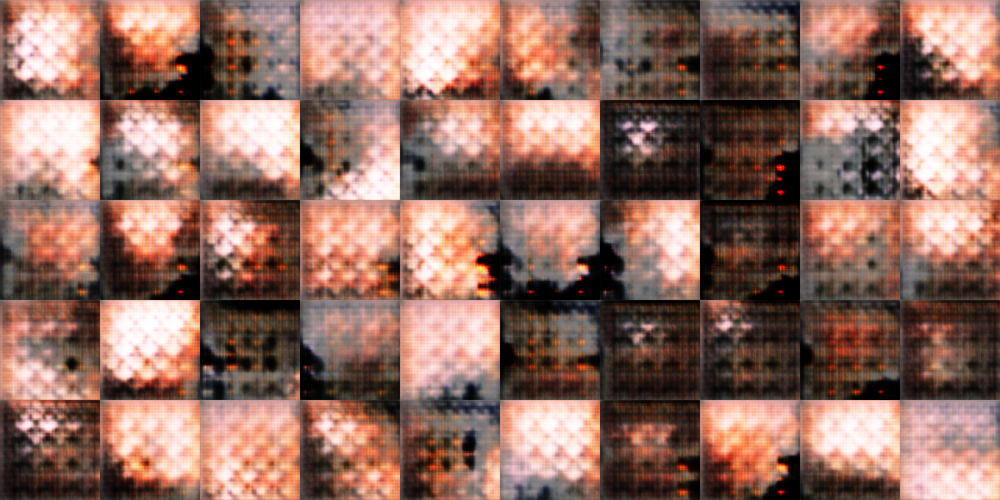

# After 200 Iterations

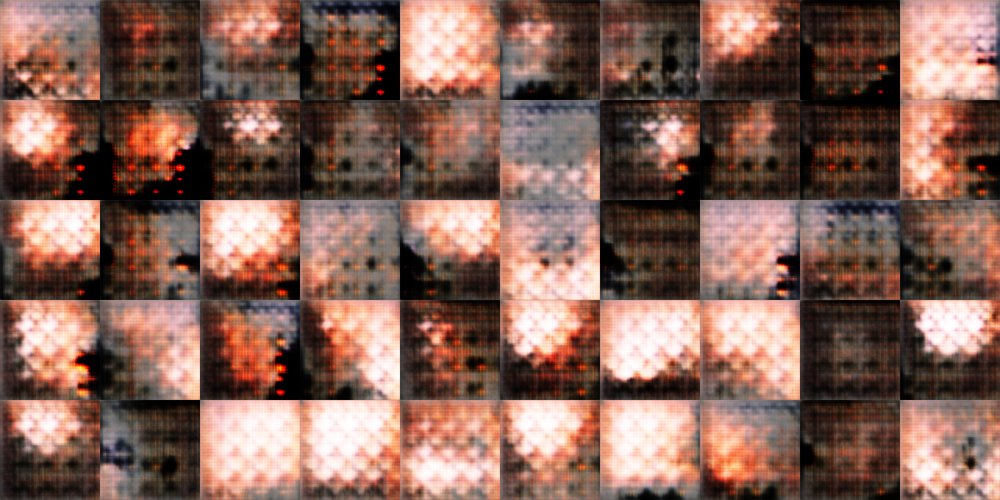

# After 400 Iterations

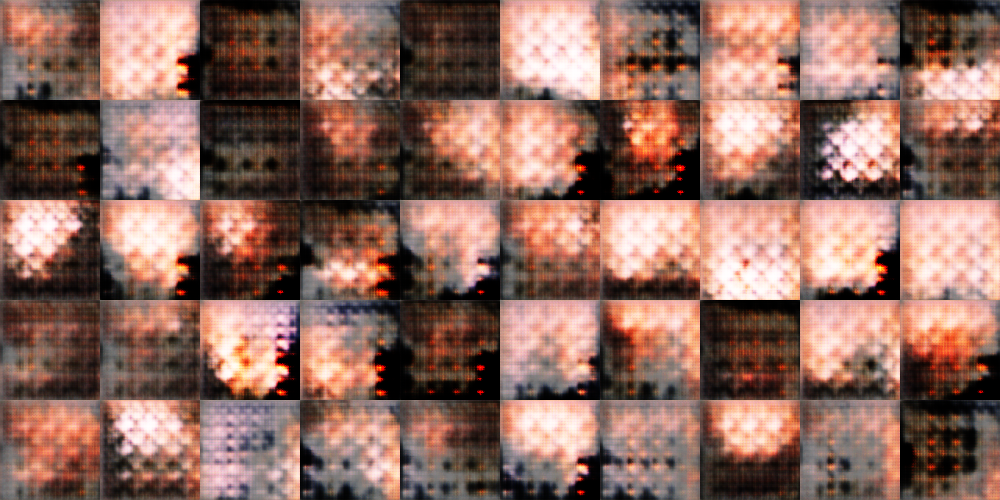

# After 800 Iterations

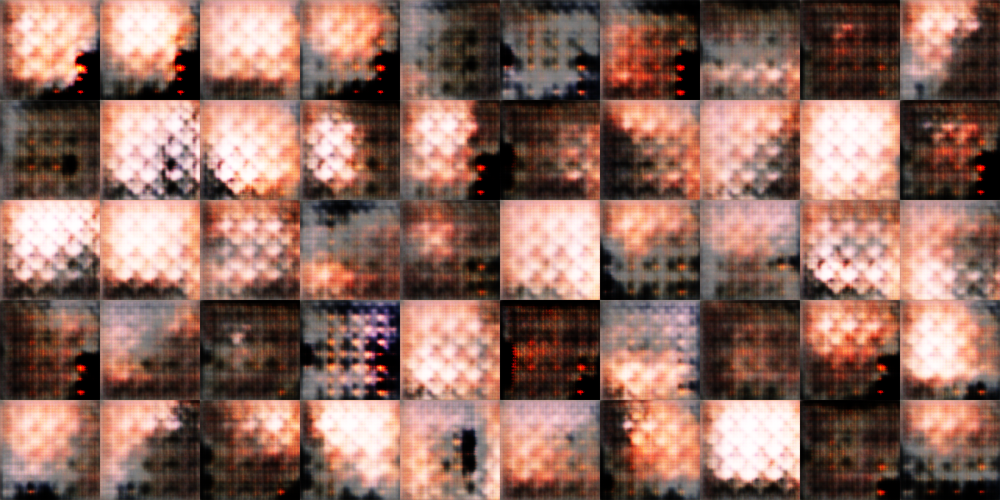

# After 1600 Iterations

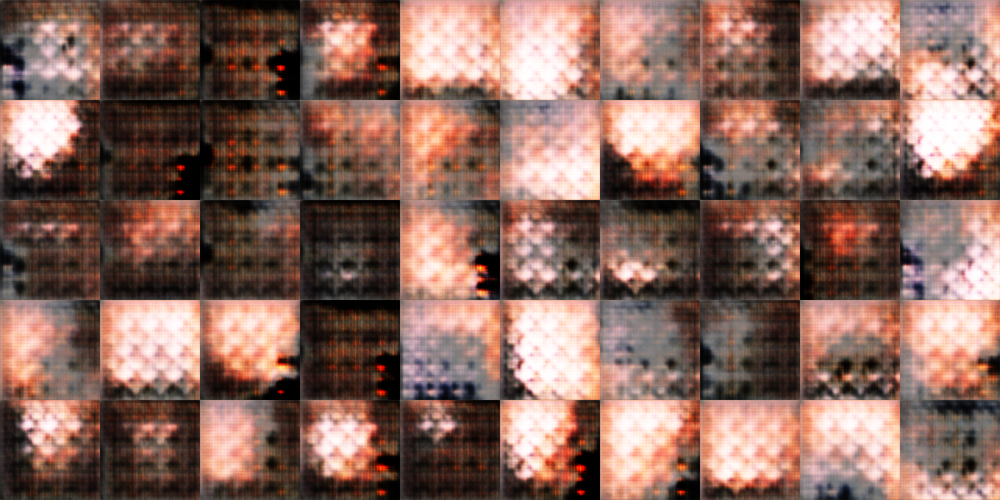

# After 3200 Iterations

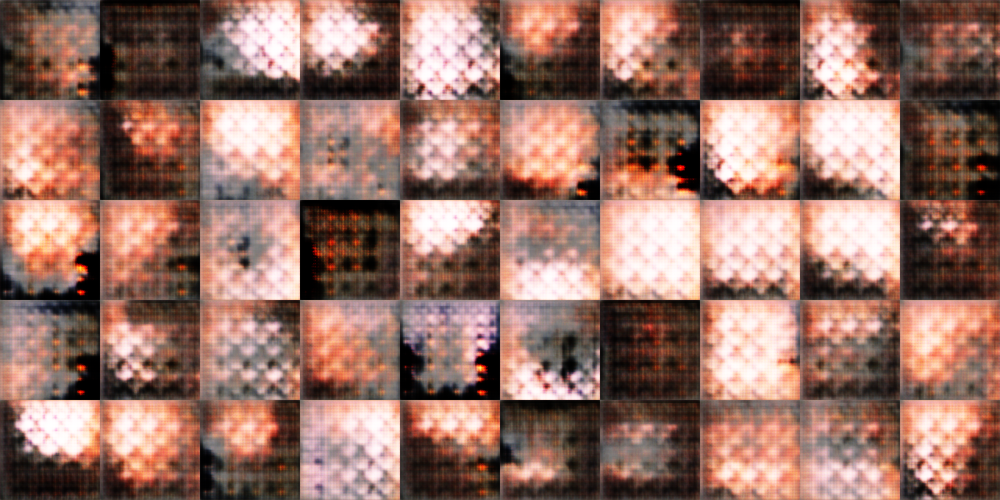

# After 6400 Iterations

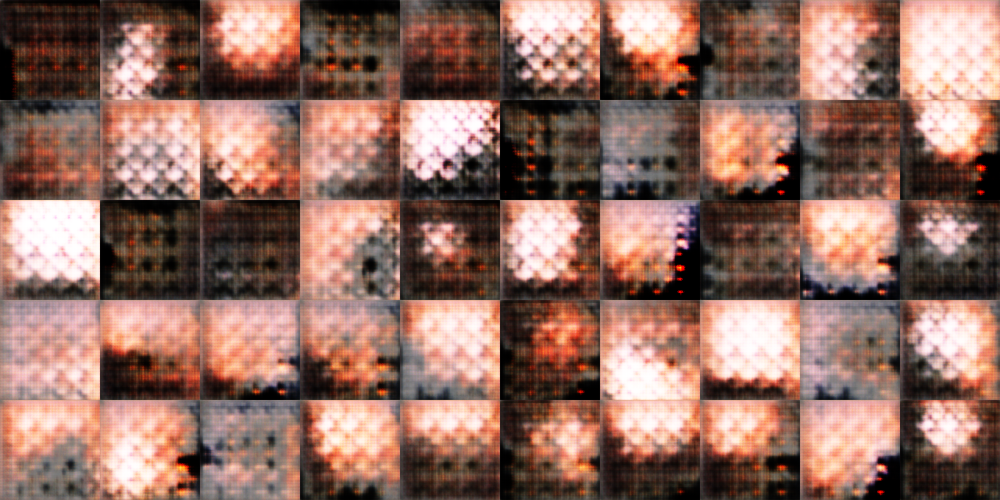

# Part 3 - Conclusion

# The images generated after 6400 iterations are better than random noisy images but it requires more training iterations to improve the results